In [1]:
import gc
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import time
import re

import category_encoders as ce
import lightgbm as lgb

from sklearn import metrics
from sklearn.model_selection import StratifiedKFold

pd.set_option('display.max_columns', None)

In [2]:
DATASET_VERSION = "06"

***
## loading data

In [3]:
raw = pd.read_parquet(
    "../data/ext/amex-data-integer-dtypes-parquet-format/test.parquet", 
    columns=["customer_ID","S_2"]
)
raw["S_2"] = pd.to_datetime(raw["S_2"])
raw = raw.groupby("customer_ID")["S_2"].max().reset_index()
raw["S_2_month"] = raw.S_2.dt.month
raw.loc[raw.query("S_2_month == 4").index,"which"]  = "pub"
raw.loc[raw.query("S_2_month == 10").index,"which"] = "priv"
raw

,customer_ID,S_2,S_2_month,which
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-10-12,10,priv
1,00001bf2e77ff879fab36aa4fac689b9ba411dae63ae39...,2019-04-15,4,pub
2,0000210045da4f81e5f122c6bde5c2a617d03eef67f82c...,2019-10-16,10,priv
3,00003b41e58ede33b8daf61ab56d9952f17c9ad1c3976c...,2019-04-22,4,pub
4,00004b22eaeeeb0ec976890c1d9bfc14fd9427e98c4ee9...,2019-10-22,10,priv
...,...,...,...,...
924616,ffff952c631f2c911b8a2a8ca56ea6e656309a83d2f64c...,2019-04-14,4,pub
924617,ffffcf5df59e5e0bba2a5ac4578a34e2b5aa64a1546cd3...,2019-10-19,10,priv
924618,ffffd61f098cc056dbd7d2a21380c4804bbfe60856f475...,2019-04-06,4,pub
924619,ffffddef1fc3643ea179c93245b68dca0f36941cd83977...,2019-04-08,4,pub


In [4]:
raw = raw[["customer_ID","which"]].set_index("customer_ID")
raw

,which
customer_ID,
00000469ba478561f23a92a868bd366de6f6527a684c9a2e78fb826dcac3b9b7,priv
00001bf2e77ff879fab36aa4fac689b9ba411dae63ae397d4263dafa1daedef5,pub
0000210045da4f81e5f122c6bde5c2a617d03eef67f82c5e400fc98e7bd43ce8,priv
00003b41e58ede33b8daf61ab56d9952f17c9ad1c3976cf6e56734528702d694,pub
00004b22eaeeeb0ec976890c1d9bfc14fd9427e98c4ee9a4693dd914fca22557,priv
...,...
ffff952c631f2c911b8a2a8ca56ea6e656309a83d2f64c5d60460dba6dedc41e,pub
ffffcf5df59e5e0bba2a5ac4578a34e2b5aa64a1546cd3a4f0ca3de613b0b2ad,priv
ffffd61f098cc056dbd7d2a21380c4804bbfe60856f475cb095d2443a68030f1,pub


In [5]:
train = pd.read_parquet(f"../data/processed/dsv{DATASET_VERSION}/train.parquet")
test = pd.read_parquet(f"../data/processed/dsv{DATASET_VERSION}/test.parquet")

In [6]:
test = pd.merge(test, raw, how="inner", left_index=True, right_index=True)
test_pub = test.query("which == 'pub'").copy()
test_priv = test.query("which == 'priv'").copy()
del test; gc.collect()

12

In [7]:
input_feats = train.columns.tolist()
len(input_feats)

1308

In [8]:
train["target"] = 0
test_pub["target"] = 1
test_priv["target"] = 1

In [9]:
#dset = pd.concat([train,test_pub], ignore_index=True)
dset = pd.concat([train,test_priv], ignore_index=True)
dset.target.value_counts() 

0    458913
1    456655
Name: target, dtype: int64

***
## removes some known different features

In [10]:
feats_to_remove = list()

_group = list(filter(re.compile(".*B_29_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*S_9_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*R_1_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*D_59_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*S_11_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*S_9_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

_group = list(filter(re.compile(".*D_121_.*").match, input_feats))
print(_group, "\n")
feats_to_remove.extend(_group)

['B_29_diff_last-first', 'B_29_mean'] 

['S_9_diff_min', 'S_9_diff_last-mean', 'S_9_mean_nan', 'S_9_min', 'S_9_mean_cxty2', 'S_9_diff_last-max', 'S_9_median', 'S_9_max', 'S_9_last', 'S_9_diff_last-median', 'S_9_diff_last-first', 'S_9_mean'] 

['R_1_mean_cxty1', 'R_1_mean', 'R_1_diff_last-min', 'R_1_std', 'R_1_median', 'R_1_diff_min', 'R_1_diff_last-median', 'R_1_last', 'R_1_min', 'R_1_diff_last-mean', 'R_1_max', 'R_1_diff_lag3', 'R_1_sum_cxty1'] 

['D_59_pchg_lag3', 'D_59_slope', 'D_59_pchg_lag1', 'D_59_diff_last-mean', 'D_59_std', 'D_59_pchg_max', 'D_59_median', 'D_59_last', 'D_59_diff_mean', 'D_59_sum_cxty1', 'D_59_max', 'D_59_pchg_mean', 'D_59_mean', 'D_59_diff_last-min'] 

['S_11_mean_cxty1', 'S_11_mean', 'S_11_diff_last-median', 'S_11_median', 'S_11_min', 'S_11_pchg_min', 'S_11_last', 'S_11_max'] 

['S_9_diff_min', 'S_9_diff_last-mean', 'S_9_mean_nan', 'S_9_min', 'S_9_mean_cxty2', 'S_9_diff_last-max', 'S_9_median', 'S_9_max', 'S_9_last', 'S_9_diff_last-median', 'S_9_diff_last-firs

In [11]:
print(feats_to_remove)

['B_29_diff_last-first', 'B_29_mean', 'S_9_diff_min', 'S_9_diff_last-mean', 'S_9_mean_nan', 'S_9_min', 'S_9_mean_cxty2', 'S_9_diff_last-max', 'S_9_median', 'S_9_max', 'S_9_last', 'S_9_diff_last-median', 'S_9_diff_last-first', 'S_9_mean', 'R_1_mean_cxty1', 'R_1_mean', 'R_1_diff_last-min', 'R_1_std', 'R_1_median', 'R_1_diff_min', 'R_1_diff_last-median', 'R_1_last', 'R_1_min', 'R_1_diff_last-mean', 'R_1_max', 'R_1_diff_lag3', 'R_1_sum_cxty1', 'D_59_pchg_lag3', 'D_59_slope', 'D_59_pchg_lag1', 'D_59_diff_last-mean', 'D_59_std', 'D_59_pchg_max', 'D_59_median', 'D_59_last', 'D_59_diff_mean', 'D_59_sum_cxty1', 'D_59_max', 'D_59_pchg_mean', 'D_59_mean', 'D_59_diff_last-min', 'S_11_mean_cxty1', 'S_11_mean', 'S_11_diff_last-median', 'S_11_median', 'S_11_min', 'S_11_pchg_min', 'S_11_last', 'S_11_max', 'S_9_diff_min', 'S_9_diff_last-mean', 'S_9_mean_nan', 'S_9_min', 'S_9_mean_cxty2', 'S_9_diff_last-max', 'S_9_median', 'S_9_max', 'S_9_last', 'S_9_diff_last-median', 'S_9_diff_last-first', 'S_9_mean',

In [12]:
len(feats_to_remove)

71

In [13]:
input_feats = [col for col in input_feats if col not in feats_to_remove]
len(input_feats)

1249

***
## training the adversarial classifier

In [14]:
model_params = {
    'objective': 'binary',
    'metric': 'auc',
    'num_iterations': 500,
    'num_leaves': 31,
    'learning_rate': 0.05,
    'max_bin': 127,
    'bin_construct_sample_cnt': 100000000,
    'bagging_freq': 1,
    'bagging_fraction': 1.0,
    'feature_fraction': 0.2,
    'lambda_l1': 6,
    'lambda_l2': 2,
    'min_data_in_leaf': 1000,
    'path_smooth': 1.5,
    'min_gain_to_split': 0.5,
    'seed': 2112,
    'force_col_wise': True,
    'feature_pre_filter': True,
    'verbosity': -1,
}

In [15]:
skf = StratifiedKFold(n_splits=2, shuffle=True, random_state=2112)
skf_split = list(skf.split(dset, dset["target"].values))

----------------------------------------------------------------------------------------------------
ITER: 1/100


/opt/conda/lib/python3.7/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.971838


[100]	valid_0's auc: 0.981301


[150]	valid_0's auc: 0.988767


[200]	valid_0's auc: 0.991844


[250]	valid_0's auc: 0.99325


[300]	valid_0's auc: 0.994304


[350]	valid_0's auc: 0.994999


[400]	valid_0's auc: 0.995496


[450]	valid_0's auc: 0.995955


[500]	valid_0's auc: 0.996264
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.996264


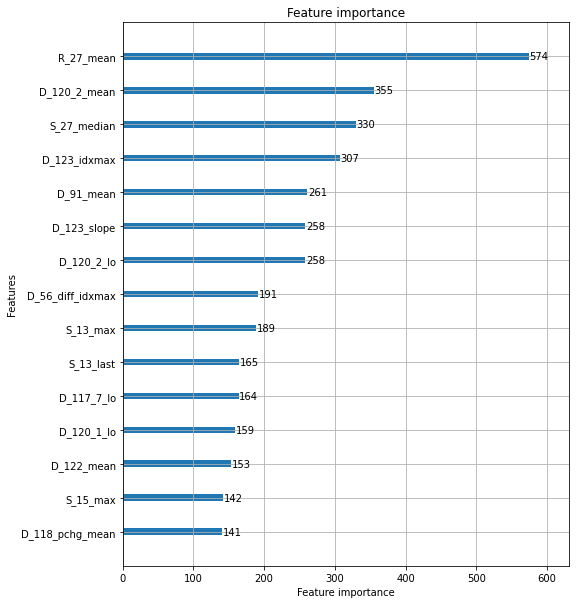

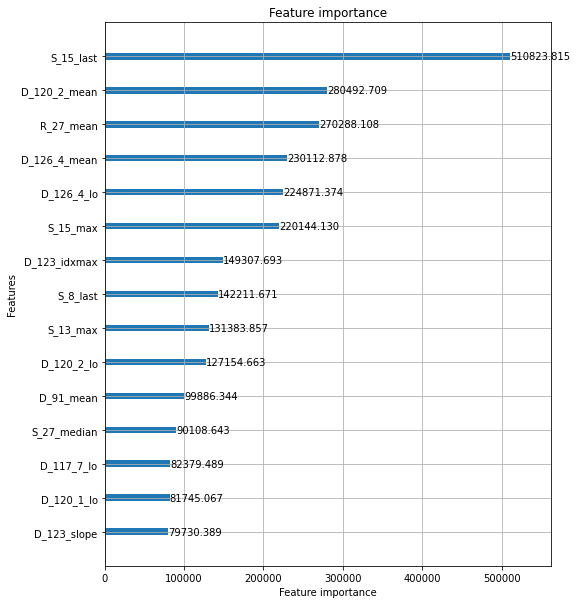

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.970079


[100]	valid_0's auc: 0.982238


[150]	valid_0's auc: 0.989226


[200]	valid_0's auc: 0.992294


[250]	valid_0's auc: 0.993532


[300]	valid_0's auc: 0.994431


[350]	valid_0's auc: 0.995097


[400]	valid_0's auc: 0.995596


[450]	valid_0's auc: 0.995913


[500]	valid_0's auc: 0.996257
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.996257


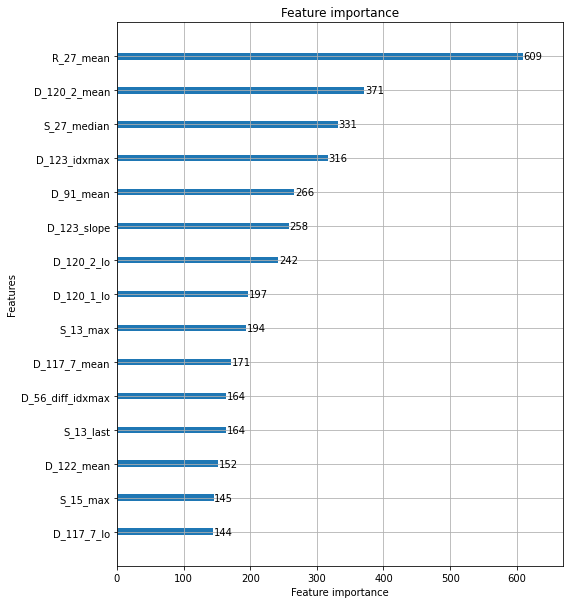

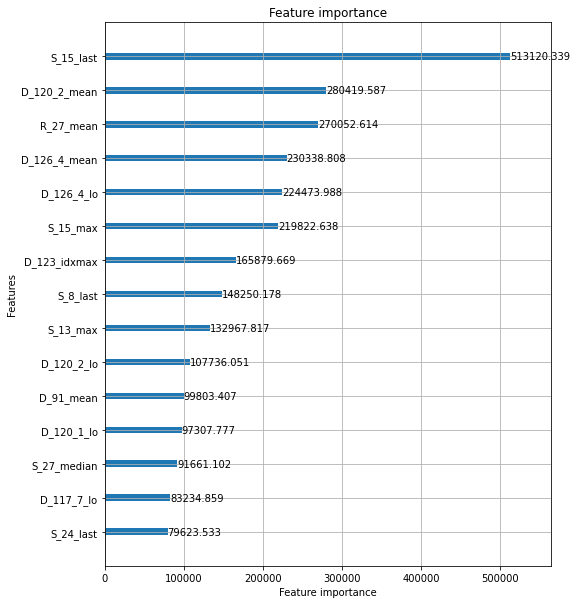

removed: ['S_15_last', 'D_120_2_mean', 'R_27_mean', 'D_126_4_mean', 'D_126_4_lo']
Elapsed time: 3.1594773252805073 min.
----------------------------------------------------------------------------------------------------
ITER: 2/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.96247


[100]	valid_0's auc: 0.976745


[150]	valid_0's auc: 0.983854


[200]	valid_0's auc: 0.987431


[250]	valid_0's auc: 0.989221


[300]	valid_0's auc: 0.990656


[350]	valid_0's auc: 0.991643


[400]	valid_0's auc: 0.992488


[450]	valid_0's auc: 0.993076


[500]	valid_0's auc: 0.993679
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.993679


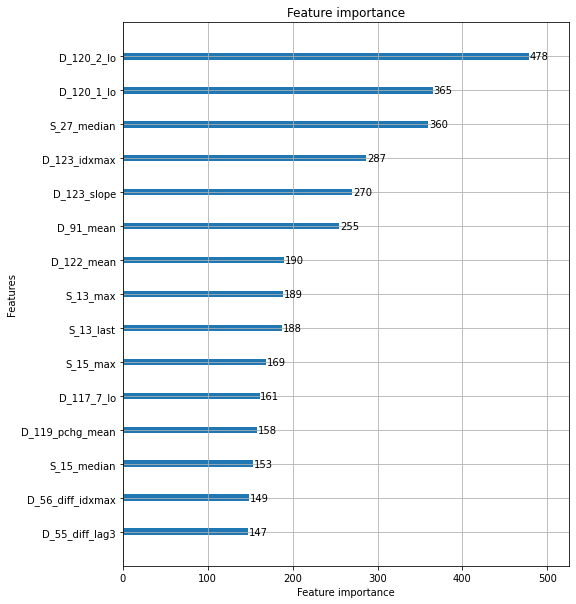

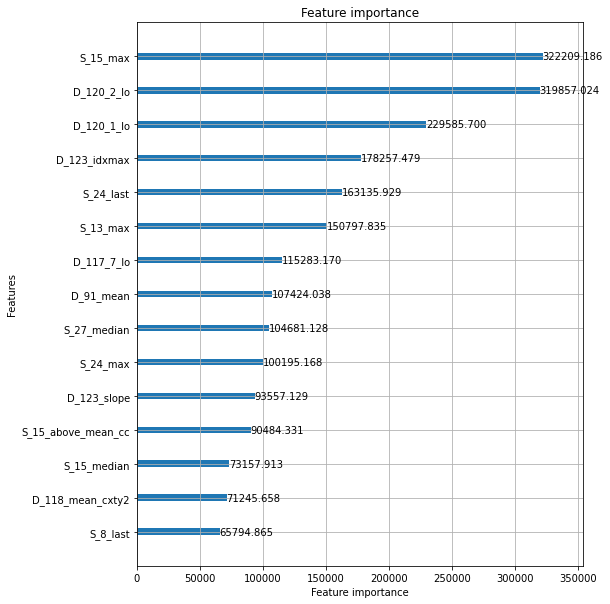

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.962436


[100]	valid_0's auc: 0.976915


[150]	valid_0's auc: 0.984243


[200]	valid_0's auc: 0.987766


[250]	valid_0's auc: 0.989501


[300]	valid_0's auc: 0.99072


[350]	valid_0's auc: 0.99173


[400]	valid_0's auc: 0.992455


[450]	valid_0's auc: 0.993027


[500]	valid_0's auc: 0.993503
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.993503


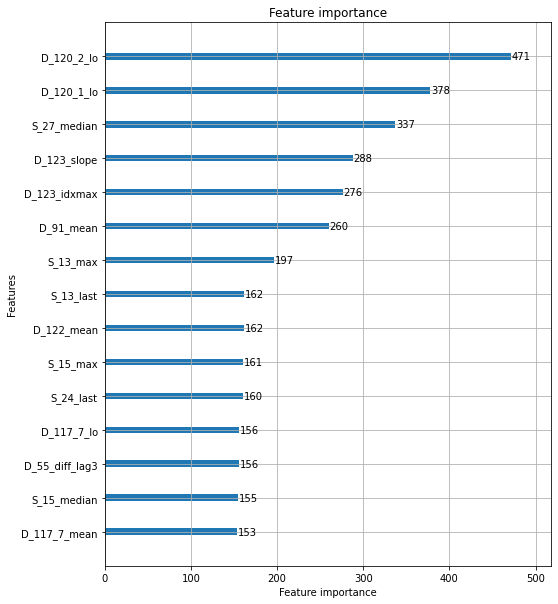

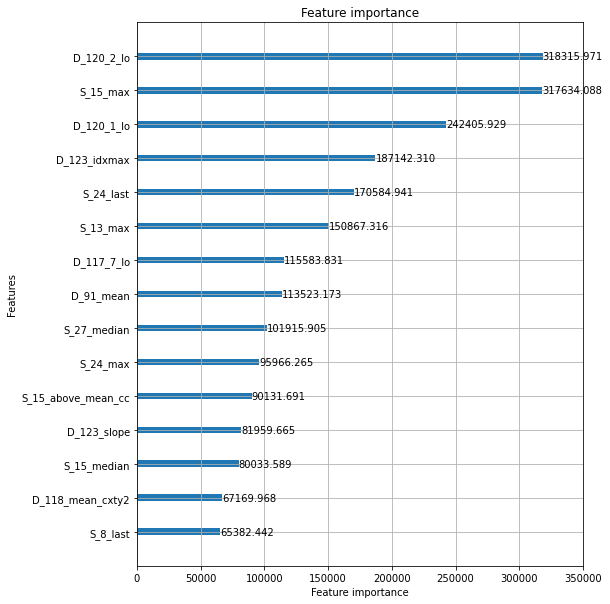

removed: ['S_15_max', 'D_120_2_lo', 'D_120_1_lo', 'D_123_idxmax', 'S_24_last']
Elapsed time: 3.1125088651974995 min.
----------------------------------------------------------------------------------------------------
ITER: 3/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.948351


[100]	valid_0's auc: 0.964357


[150]	valid_0's auc: 0.975091


[200]	valid_0's auc: 0.979838


[250]	valid_0's auc: 0.982622


[300]	valid_0's auc: 0.985334


[350]	valid_0's auc: 0.986965


[400]	valid_0's auc: 0.988052


[450]	valid_0's auc: 0.989077


[500]	valid_0's auc: 0.989881
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.989881


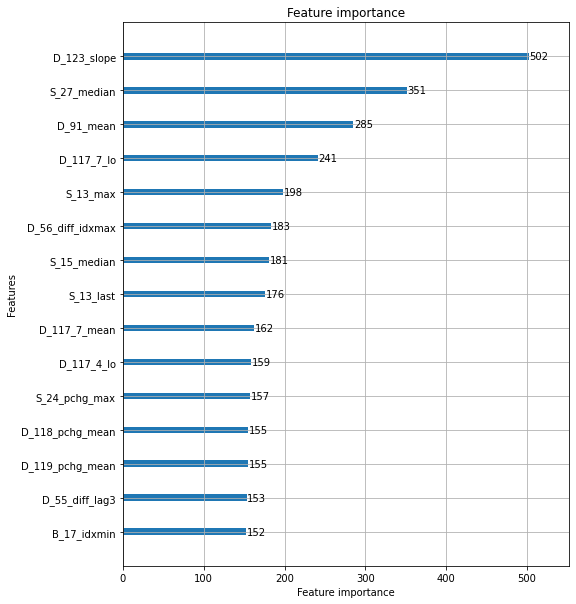

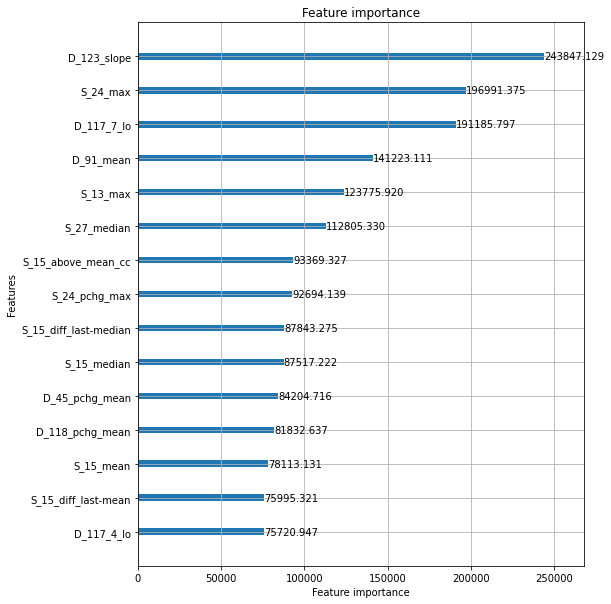

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.946037


[100]	valid_0's auc: 0.962946


[150]	valid_0's auc: 0.973713


[200]	valid_0's auc: 0.979242


[250]	valid_0's auc: 0.982654


[300]	valid_0's auc: 0.984828


[350]	valid_0's auc: 0.986495


[400]	valid_0's auc: 0.987804


[450]	valid_0's auc: 0.98863


[500]	valid_0's auc: 0.989383
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.989383


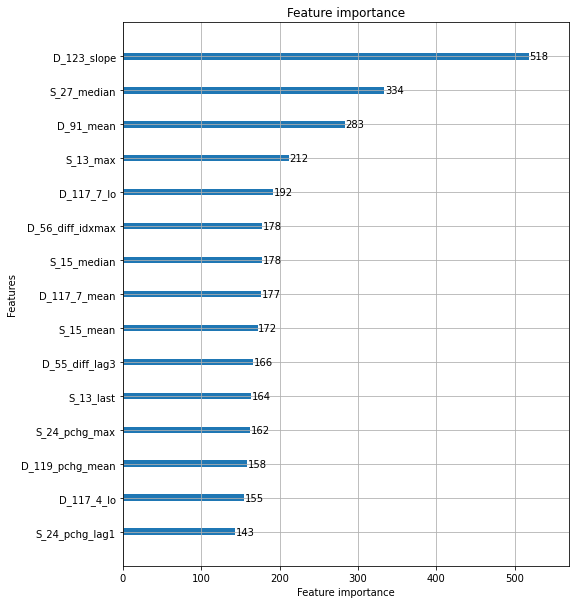

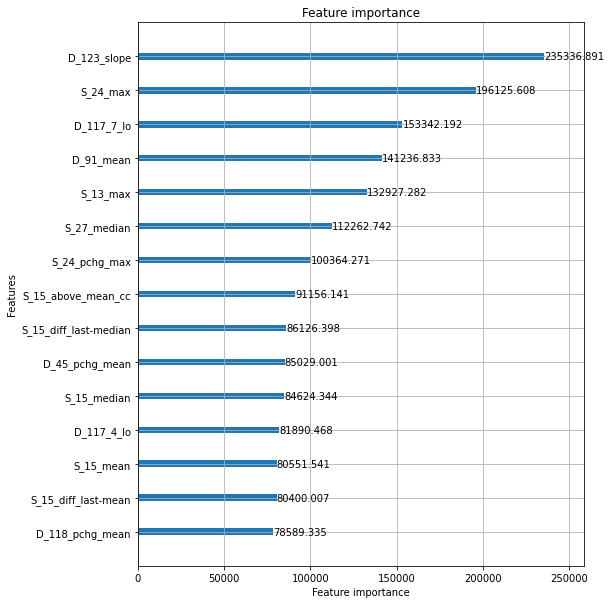

removed: ['D_123_slope', 'S_24_max', 'D_117_7_lo', 'D_91_mean', 'S_13_max']
Elapsed time: 3.0893351236979165 min.
----------------------------------------------------------------------------------------------------
ITER: 4/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.935844


[100]	valid_0's auc: 0.956411


[150]	valid_0's auc: 0.966483


[200]	valid_0's auc: 0.972625


[250]	valid_0's auc: 0.976251


[300]	valid_0's auc: 0.979528


[350]	valid_0's auc: 0.981938


[400]	valid_0's auc: 0.983455


[450]	valid_0's auc: 0.985334


[500]	valid_0's auc: 0.986483
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.986483


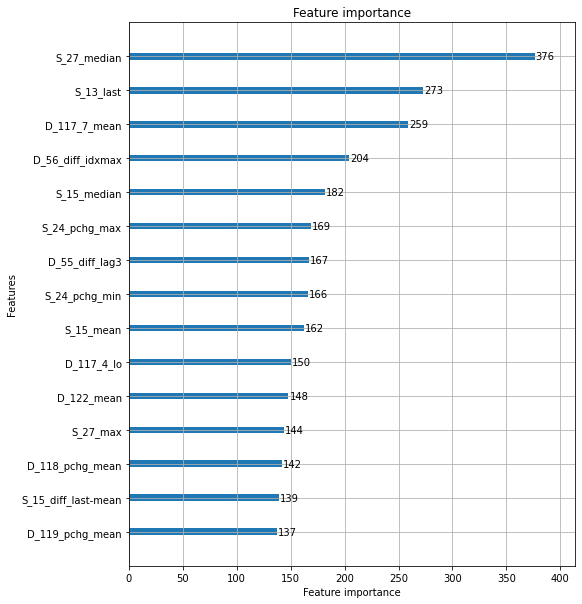

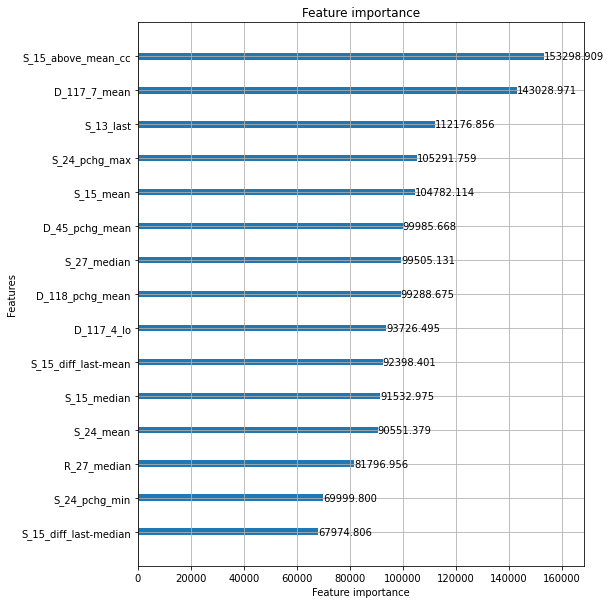

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.933357


[100]	valid_0's auc: 0.955423


[150]	valid_0's auc: 0.965551


[200]	valid_0's auc: 0.972198


[250]	valid_0's auc: 0.976741


[300]	valid_0's auc: 0.979608


[350]	valid_0's auc: 0.981429


[400]	valid_0's auc: 0.983158


[450]	valid_0's auc: 0.984611


[500]	valid_0's auc: 0.986089
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.986089


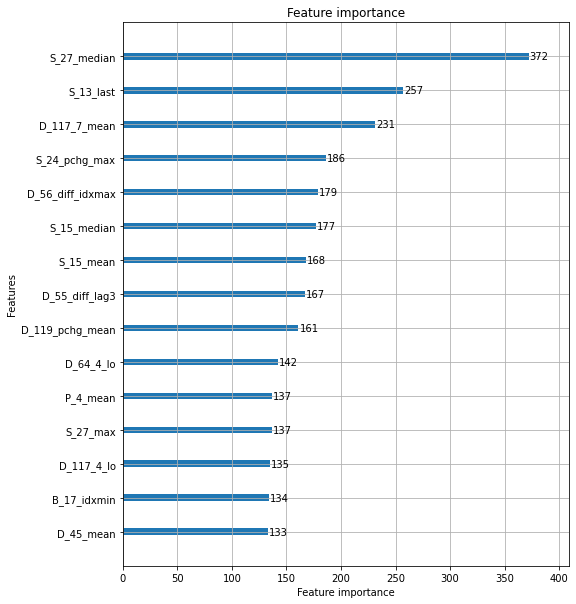

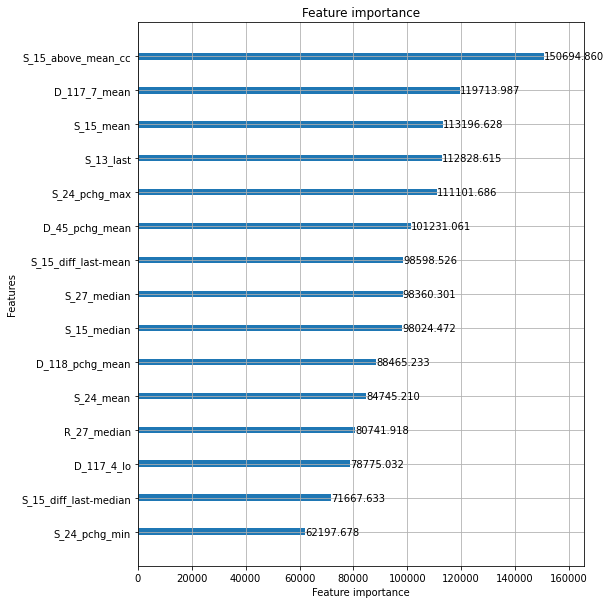

removed: ['S_15_above_mean_cc', 'D_117_7_mean', 'S_13_last', 'S_15_mean', 'S_24_pchg_max']
Elapsed time: 3.119885738690694 min.
----------------------------------------------------------------------------------------------------
ITER: 5/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.930867


[100]	valid_0's auc: 0.952098


[150]	valid_0's auc: 0.963213


[200]	valid_0's auc: 0.96976


[250]	valid_0's auc: 0.973564


[300]	valid_0's auc: 0.976412


[350]	valid_0's auc: 0.978824


[400]	valid_0's auc: 0.981306


[450]	valid_0's auc: 0.983256


[500]	valid_0's auc: 0.984555
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.984555


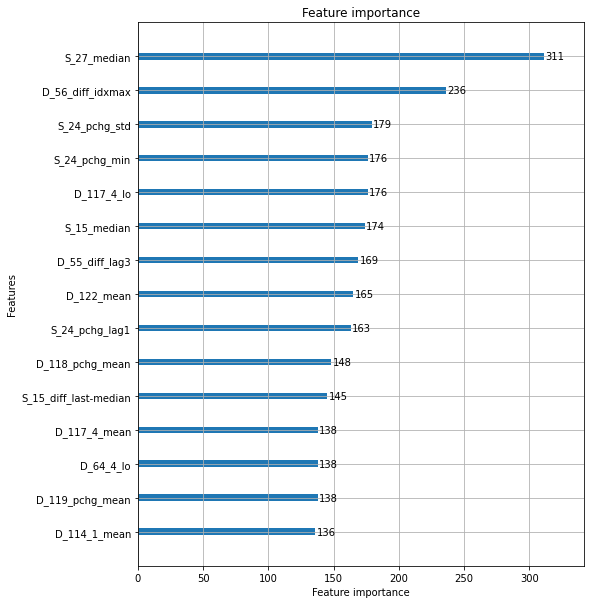

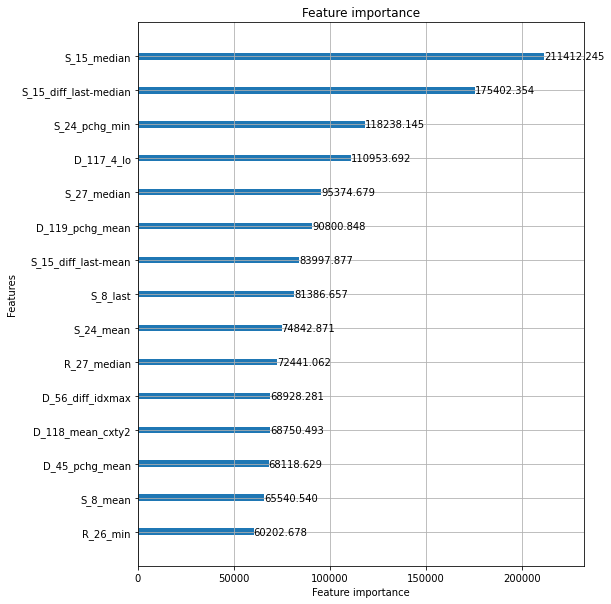

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.928919


[100]	valid_0's auc: 0.951775


[150]	valid_0's auc: 0.963019


[200]	valid_0's auc: 0.970309


[250]	valid_0's auc: 0.974567


[300]	valid_0's auc: 0.977102


[350]	valid_0's auc: 0.979334


[400]	valid_0's auc: 0.98137


[450]	valid_0's auc: 0.982796


[500]	valid_0's auc: 0.984372
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.984372


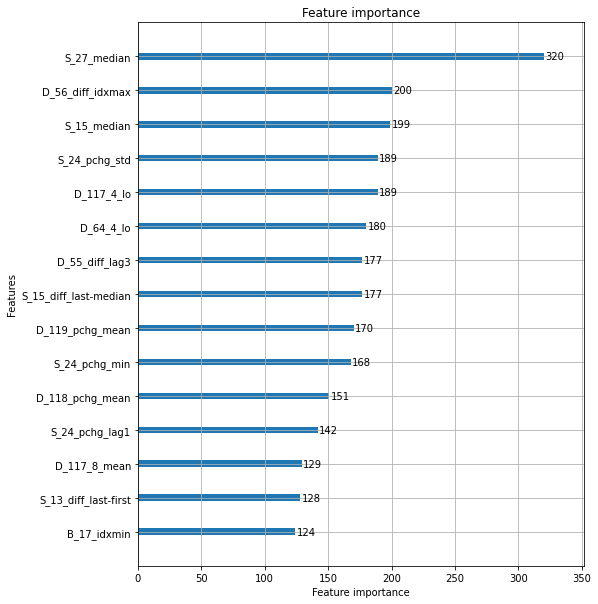

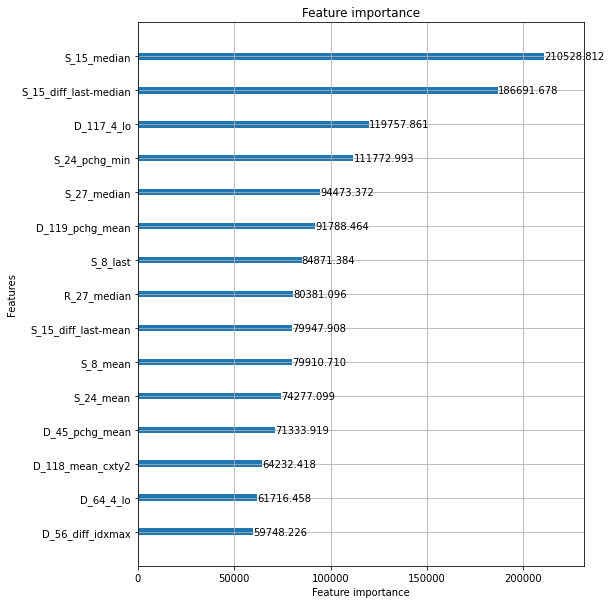

removed: ['S_15_median', 'S_15_diff_last-median', 'D_117_4_lo', 'S_24_pchg_min', 'S_27_median']
Elapsed time: 3.0967998425165812 min.
----------------------------------------------------------------------------------------------------
ITER: 6/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.919566


[100]	valid_0's auc: 0.942532


[150]	valid_0's auc: 0.95671


[200]	valid_0's auc: 0.964389


[250]	valid_0's auc: 0.969003


[300]	valid_0's auc: 0.972392


[350]	valid_0's auc: 0.975371


[400]	valid_0's auc: 0.977503


[450]	valid_0's auc: 0.979757


[500]	valid_0's auc: 0.981557
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.981557


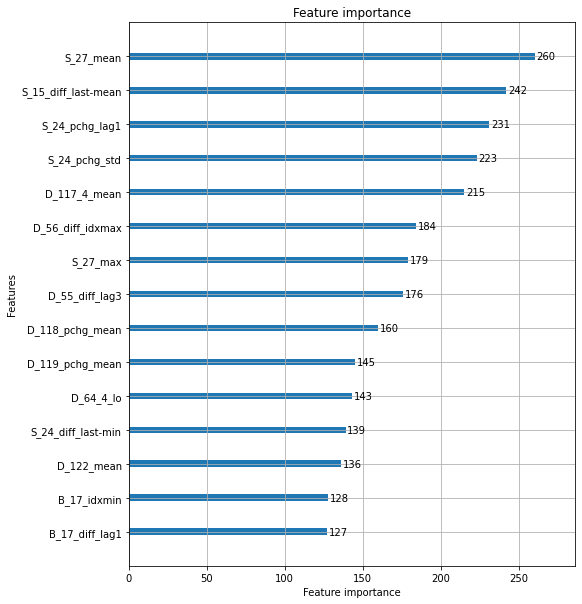

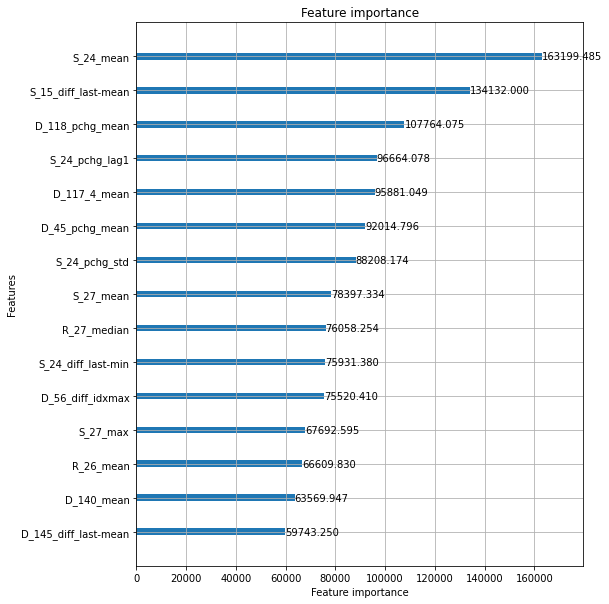

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.91705


[100]	valid_0's auc: 0.942753


[150]	valid_0's auc: 0.956196


[200]	valid_0's auc: 0.963985


[250]	valid_0's auc: 0.968549


[300]	valid_0's auc: 0.972612


[350]	valid_0's auc: 0.975445


[400]	valid_0's auc: 0.977439


[450]	valid_0's auc: 0.979197


[500]	valid_0's auc: 0.980658
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.980658


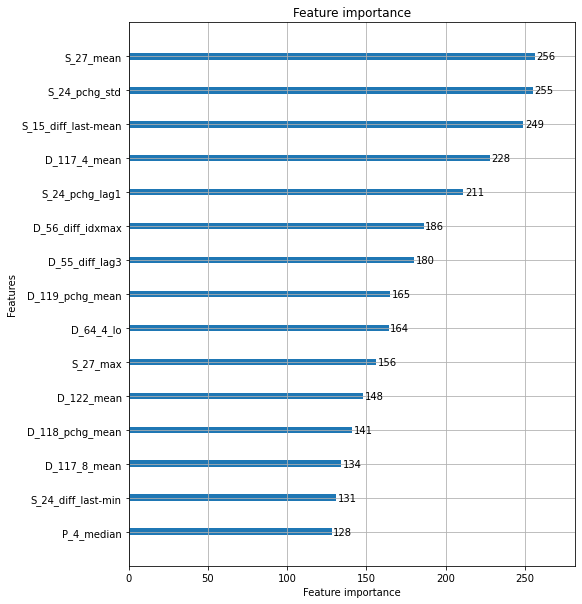

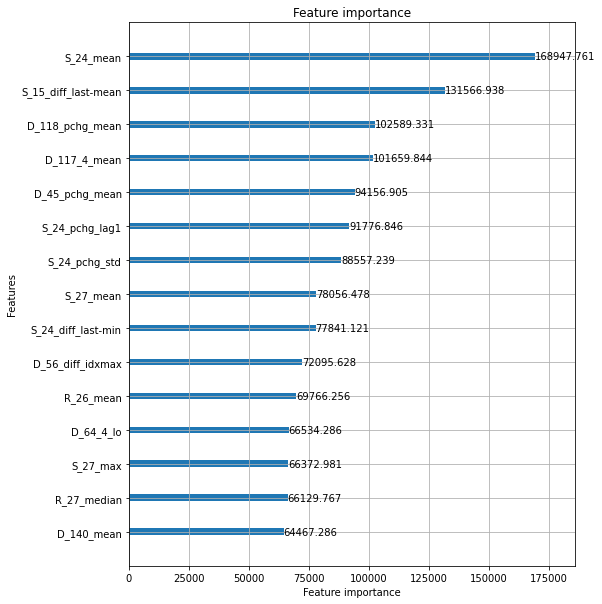

removed: ['S_24_mean', 'S_15_diff_last-mean', 'D_118_pchg_mean', 'D_117_4_mean', 'S_24_pchg_lag1']
Elapsed time: 3.056881340344747 min.
----------------------------------------------------------------------------------------------------
ITER: 7/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.910393


[100]	valid_0's auc: 0.938324


[150]	valid_0's auc: 0.950245


[200]	valid_0's auc: 0.958757


[250]	valid_0's auc: 0.96422


[300]	valid_0's auc: 0.969117


[350]	valid_0's auc: 0.972111


[400]	valid_0's auc: 0.974257


[450]	valid_0's auc: 0.976304


[500]	valid_0's auc: 0.978661
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.978661


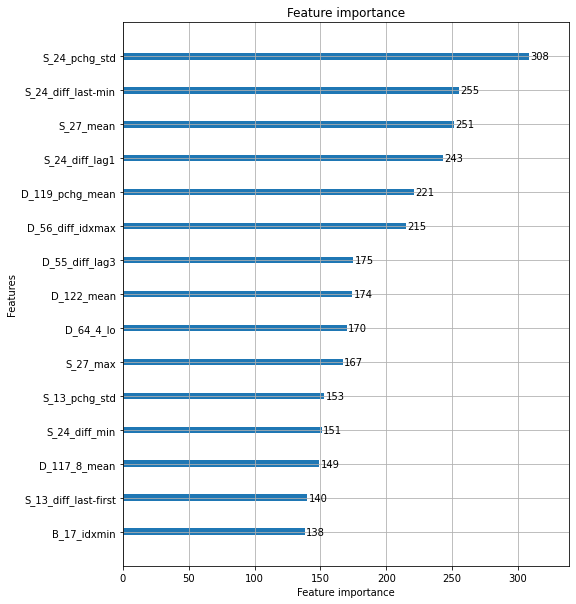

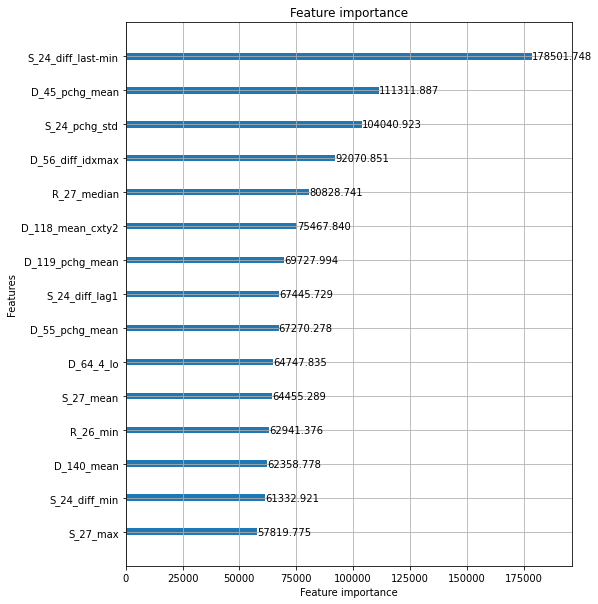

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.90857


[100]	valid_0's auc: 0.937431


[150]	valid_0's auc: 0.951144


[200]	valid_0's auc: 0.959688


[250]	valid_0's auc: 0.964673


[300]	valid_0's auc: 0.968563


[350]	valid_0's auc: 0.972156


[400]	valid_0's auc: 0.974364


[450]	valid_0's auc: 0.976401


[500]	valid_0's auc: 0.978599
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.978599


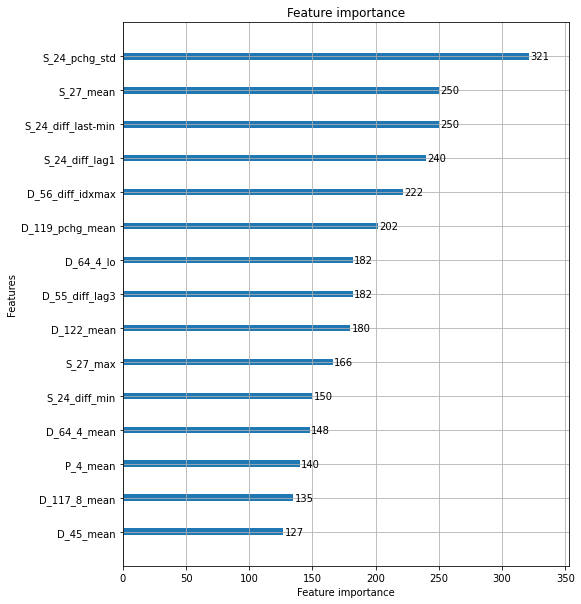

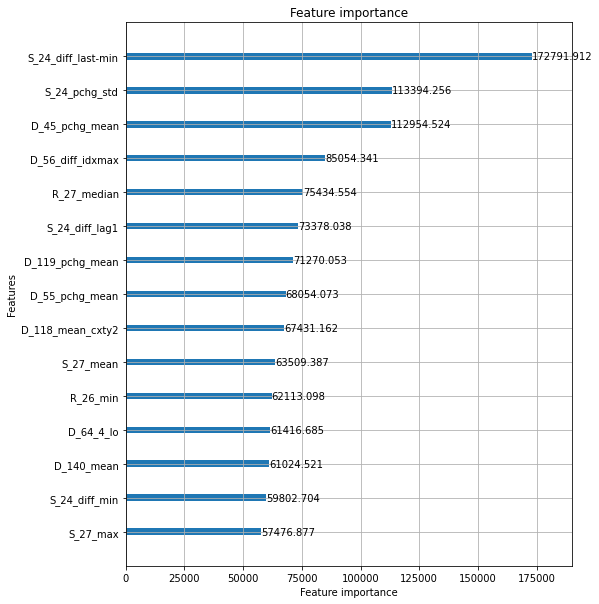

removed: ['S_24_diff_last-min', 'D_45_pchg_mean', 'S_24_pchg_std', 'D_56_diff_idxmax', 'R_27_median']
Elapsed time: 3.0539305369059244 min.
----------------------------------------------------------------------------------------------------
ITER: 8/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.898814


[100]	valid_0's auc: 0.925352


[150]	valid_0's auc: 0.940754


[200]	valid_0's auc: 0.95069


[250]	valid_0's auc: 0.956077


[300]	valid_0's auc: 0.960023


[350]	valid_0's auc: 0.964596


[400]	valid_0's auc: 0.968101


[450]	valid_0's auc: 0.971513


[500]	valid_0's auc: 0.973418
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.973418


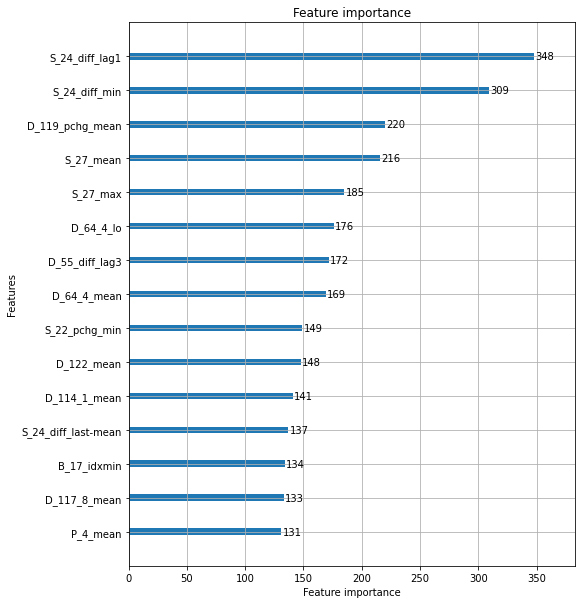

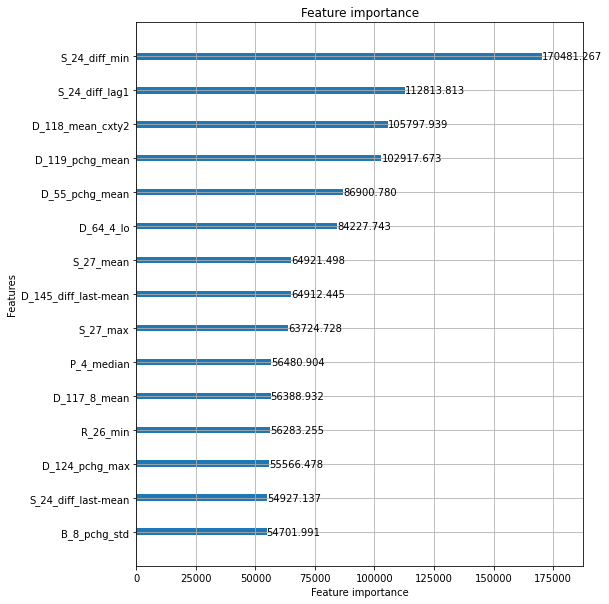

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.897885


[100]	valid_0's auc: 0.925981


[150]	valid_0's auc: 0.940405


[200]	valid_0's auc: 0.951183


[250]	valid_0's auc: 0.95623


[300]	valid_0's auc: 0.96056


[350]	valid_0's auc: 0.964516


[400]	valid_0's auc: 0.968213


[450]	valid_0's auc: 0.970857


[500]	valid_0's auc: 0.972657
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.972657


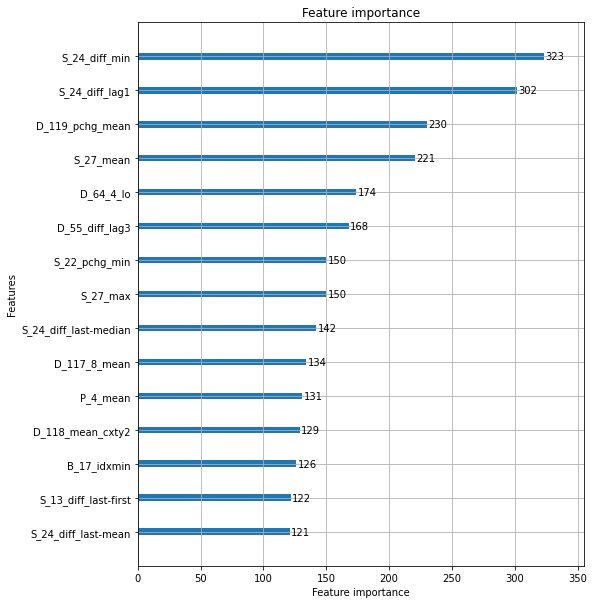

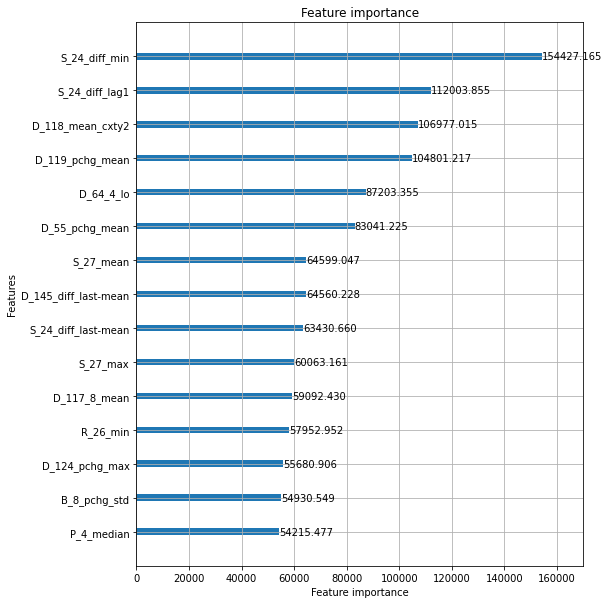

removed: ['S_24_diff_min', 'S_24_diff_lag1', 'D_118_mean_cxty2', 'D_119_pchg_mean', 'D_64_4_lo']
Elapsed time: 3.043845017751058 min.
----------------------------------------------------------------------------------------------------
ITER: 9/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.89018


[100]	valid_0's auc: 0.919391


[150]	valid_0's auc: 0.934629


[200]	valid_0's auc: 0.944253


[250]	valid_0's auc: 0.950384


[300]	valid_0's auc: 0.954686


[350]	valid_0's auc: 0.958784


[400]	valid_0's auc: 0.963071


[450]	valid_0's auc: 0.966135


[500]	valid_0's auc: 0.968625
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.968625


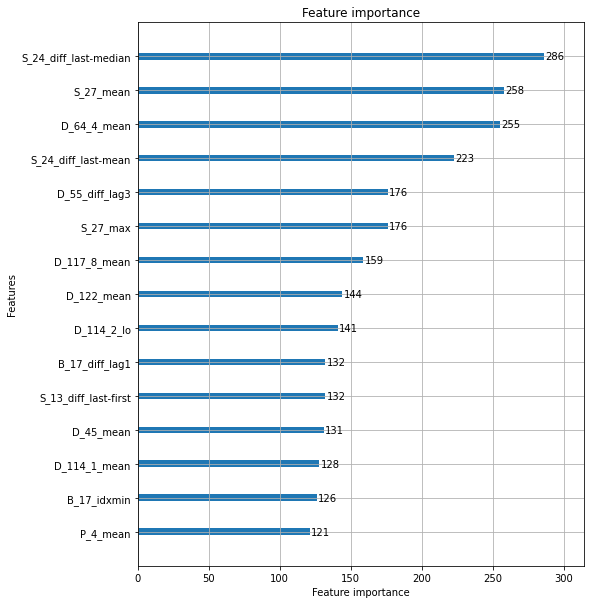

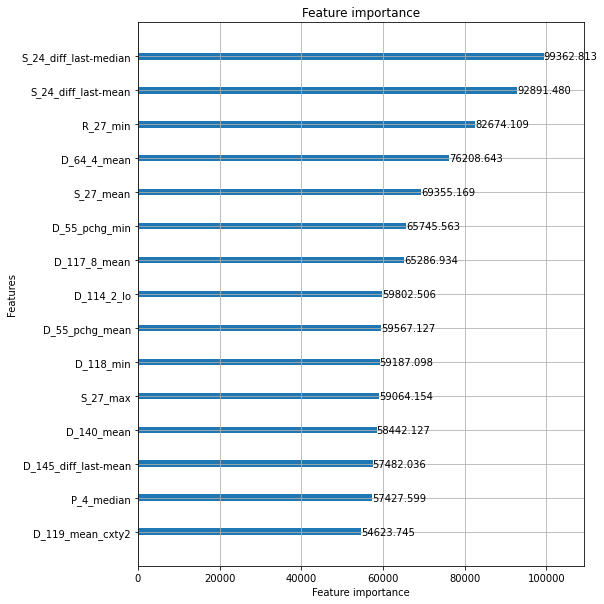

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.889455


[100]	valid_0's auc: 0.917378


[150]	valid_0's auc: 0.933701


[200]	valid_0's auc: 0.943147


[250]	valid_0's auc: 0.949489


[300]	valid_0's auc: 0.954565


[350]	valid_0's auc: 0.957978


[400]	valid_0's auc: 0.962271


[450]	valid_0's auc: 0.965056


[500]	valid_0's auc: 0.9677
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.9677


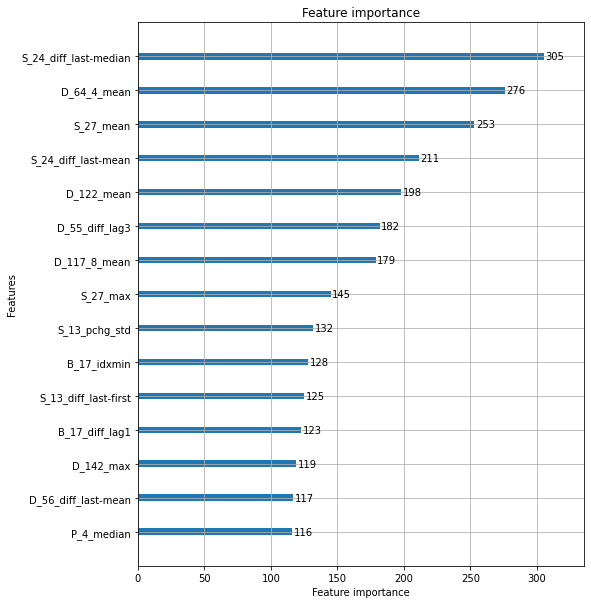

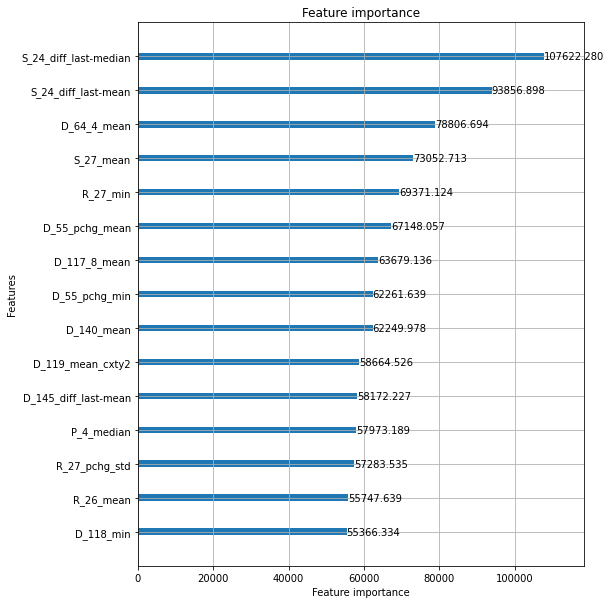

removed: ['S_24_diff_last-median', 'S_24_diff_last-mean', 'D_64_4_mean', 'R_27_min', 'S_27_mean']
Elapsed time: 3.0454099655151365 min.
----------------------------------------------------------------------------------------------------
ITER: 10/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.874499


[100]	valid_0's auc: 0.904847


[150]	valid_0's auc: 0.921937


[200]	valid_0's auc: 0.931777


[250]	valid_0's auc: 0.938519


[300]	valid_0's auc: 0.944307


[350]	valid_0's auc: 0.949032


[400]	valid_0's auc: 0.953078


[450]	valid_0's auc: 0.956692


[500]	valid_0's auc: 0.959598
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.959598


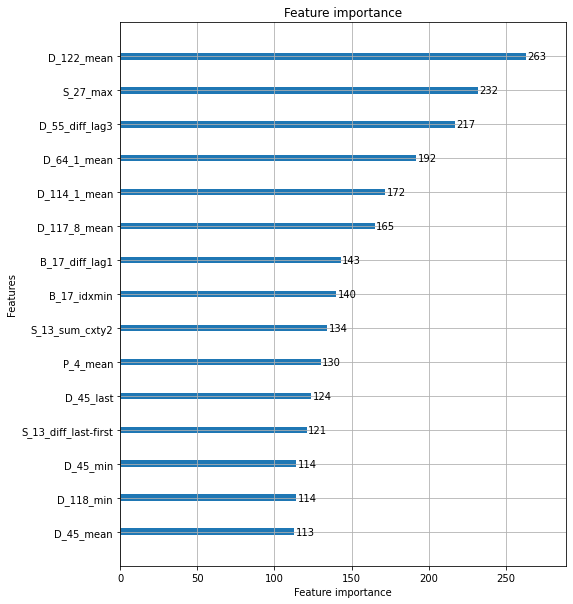

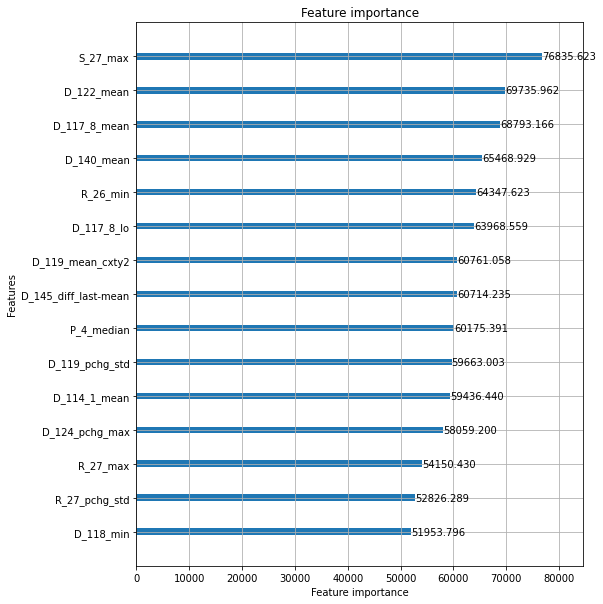

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.87349


[100]	valid_0's auc: 0.902099


[150]	valid_0's auc: 0.919582


[200]	valid_0's auc: 0.930242


[250]	valid_0's auc: 0.938218


[300]	valid_0's auc: 0.943957


[350]	valid_0's auc: 0.948175


[400]	valid_0's auc: 0.952968


[450]	valid_0's auc: 0.956875


[500]	valid_0's auc: 0.959688
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.959688


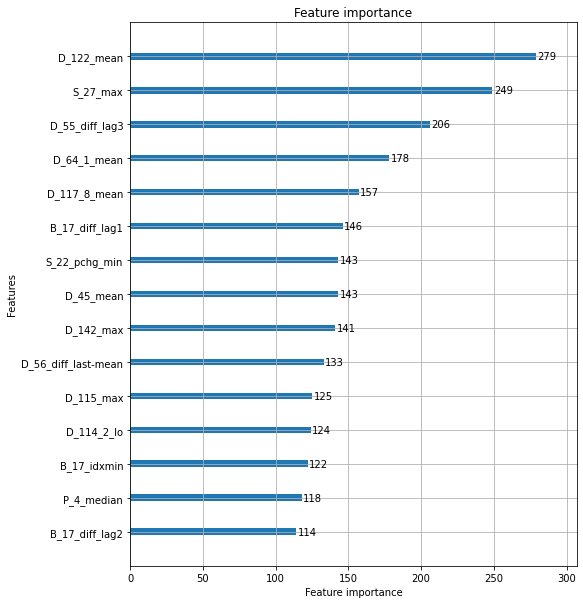

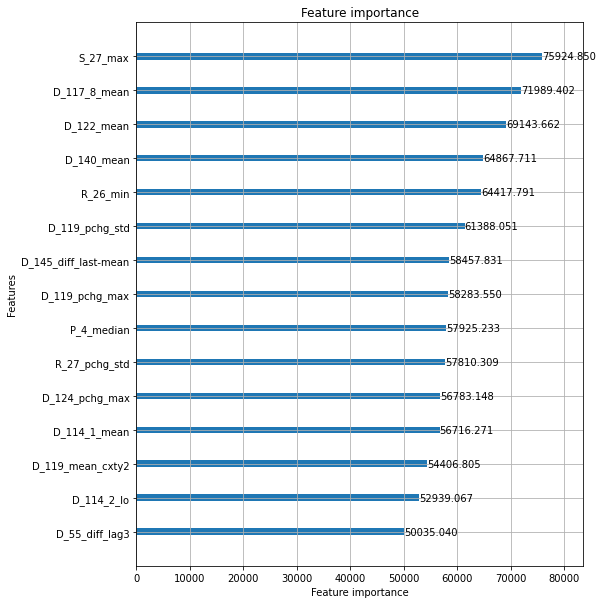

removed: ['S_27_max', 'D_117_8_mean', 'D_122_mean', 'D_140_mean', 'R_26_min']
Elapsed time: 3.0401631593704224 min.
----------------------------------------------------------------------------------------------------
ITER: 11/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.864962


[100]	valid_0's auc: 0.895235


[150]	valid_0's auc: 0.911126


[200]	valid_0's auc: 0.92333


[250]	valid_0's auc: 0.932178


[300]	valid_0's auc: 0.940596


[350]	valid_0's auc: 0.94536


[400]	valid_0's auc: 0.948955


[450]	valid_0's auc: 0.952093


[500]	valid_0's auc: 0.955032
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.955032


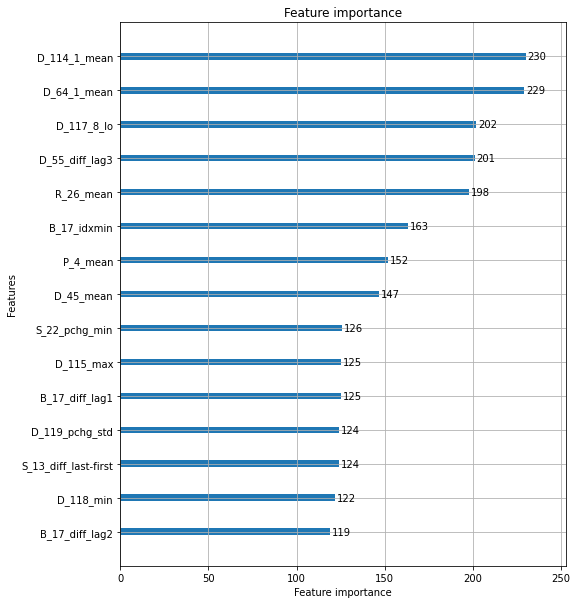

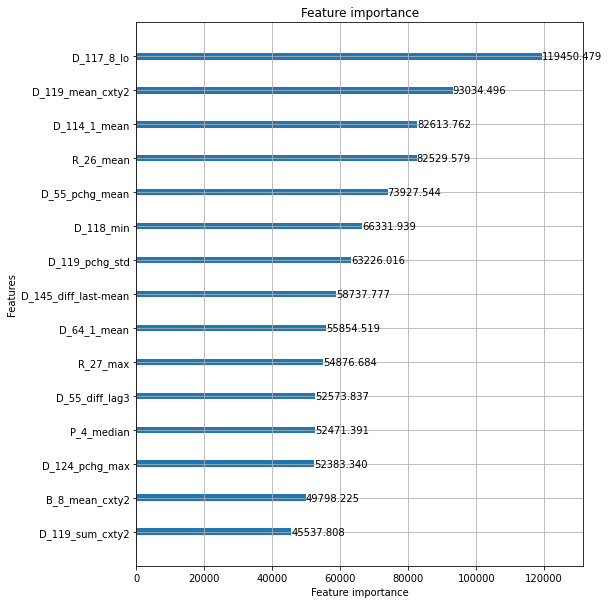

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.863772


[100]	valid_0's auc: 0.895266


[150]	valid_0's auc: 0.910846


[200]	valid_0's auc: 0.921825


[250]	valid_0's auc: 0.930954


[300]	valid_0's auc: 0.937614


[350]	valid_0's auc: 0.943161


[400]	valid_0's auc: 0.947985


[450]	valid_0's auc: 0.950864


[500]	valid_0's auc: 0.95384
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.95384


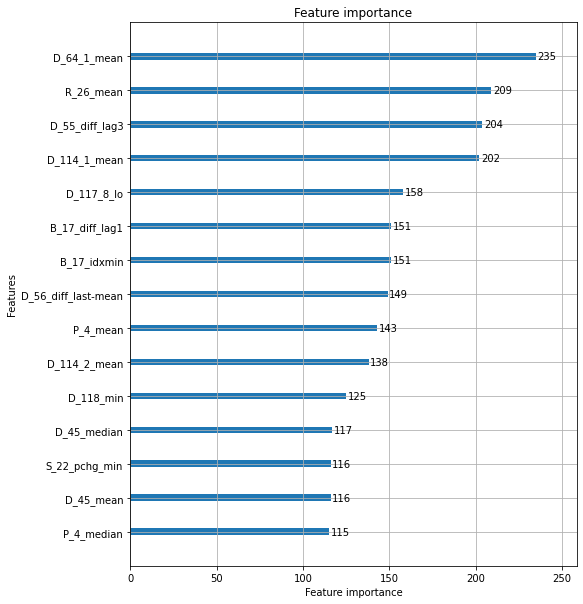

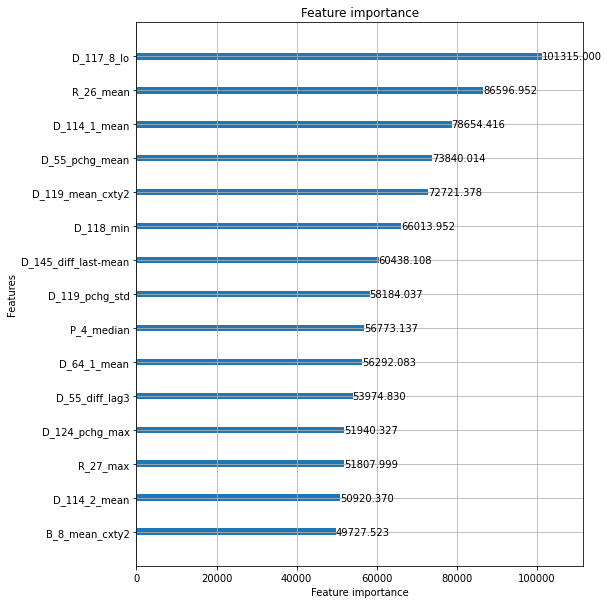

removed: ['D_117_8_lo', 'R_26_mean', 'D_119_mean_cxty2', 'D_114_1_mean', 'D_55_pchg_mean']
Elapsed time: 2.995165201028188 min.
----------------------------------------------------------------------------------------------------
ITER: 12/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.862091


[100]	valid_0's auc: 0.891809


[150]	valid_0's auc: 0.907325


[200]	valid_0's auc: 0.918288


[250]	valid_0's auc: 0.925668


[300]	valid_0's auc: 0.931706


[350]	valid_0's auc: 0.936346


[400]	valid_0's auc: 0.941423


[450]	valid_0's auc: 0.946257


[500]	valid_0's auc: 0.949156
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.949156


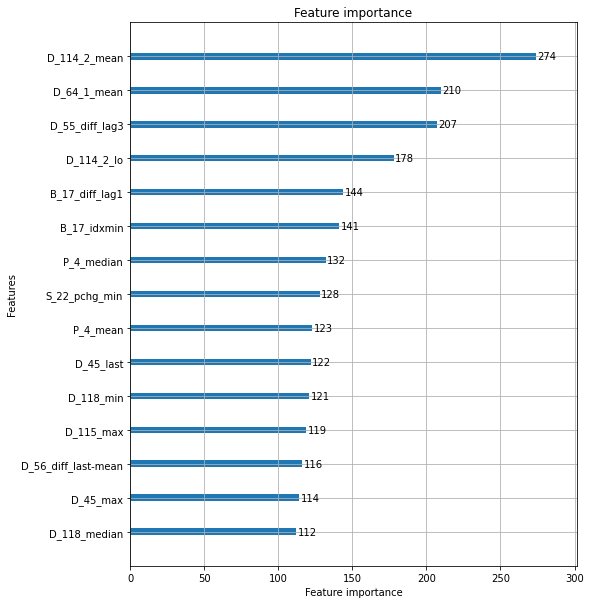

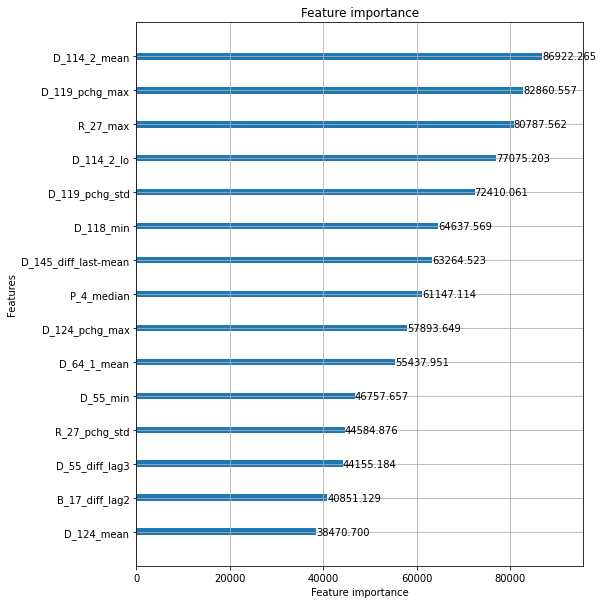

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.86254


[100]	valid_0's auc: 0.891083


[150]	valid_0's auc: 0.907443


[200]	valid_0's auc: 0.917851


[250]	valid_0's auc: 0.925908


[300]	valid_0's auc: 0.931768


[350]	valid_0's auc: 0.937297


[400]	valid_0's auc: 0.940941


[450]	valid_0's auc: 0.944645


[500]	valid_0's auc: 0.948049
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.948049


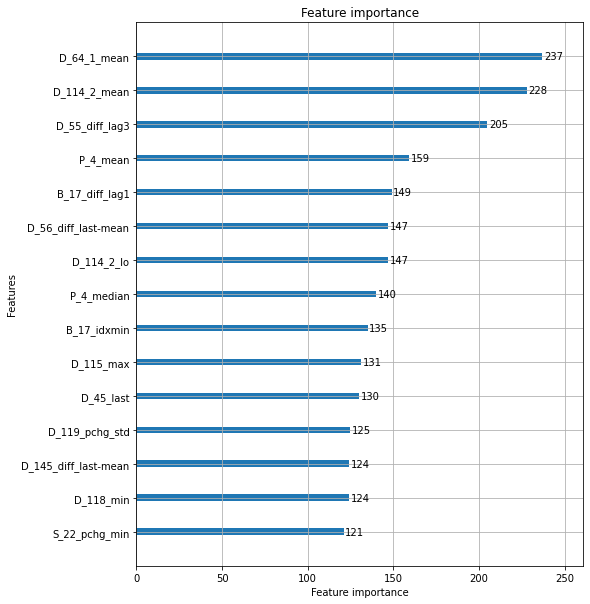

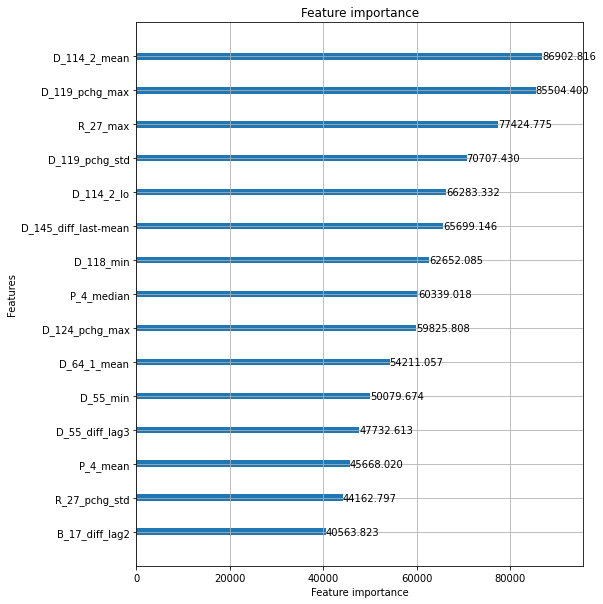

removed: ['D_114_2_mean', 'D_119_pchg_max', 'R_27_max', 'D_114_2_lo', 'D_119_pchg_std']
Elapsed time: 2.9737179040908814 min.
----------------------------------------------------------------------------------------------------
ITER: 13/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.859442


[100]	valid_0's auc: 0.884519


[150]	valid_0's auc: 0.900385


[200]	valid_0's auc: 0.911024


[250]	valid_0's auc: 0.919276


[300]	valid_0's auc: 0.926149


[350]	valid_0's auc: 0.931165


[400]	valid_0's auc: 0.936054


[450]	valid_0's auc: 0.940557


[500]	valid_0's auc: 0.943855
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.943855


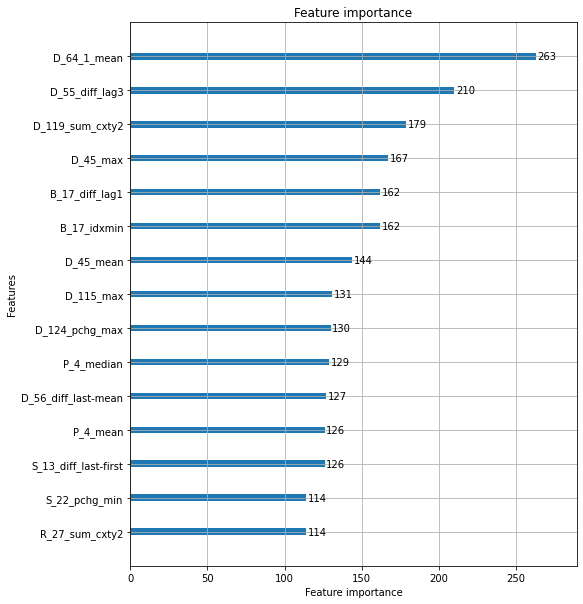

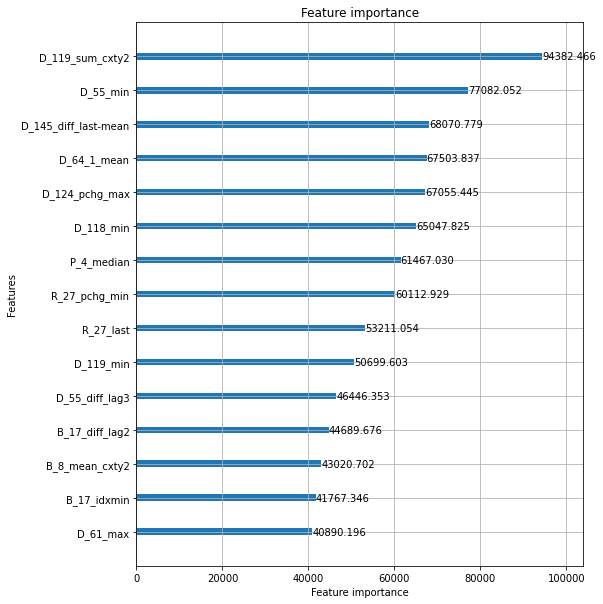

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.858989


[100]	valid_0's auc: 0.88454


[150]	valid_0's auc: 0.901277


[200]	valid_0's auc: 0.911975


[250]	valid_0's auc: 0.919639


[300]	valid_0's auc: 0.926205


[350]	valid_0's auc: 0.931284


[400]	valid_0's auc: 0.936386


[450]	valid_0's auc: 0.940521


[500]	valid_0's auc: 0.944577
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.944577


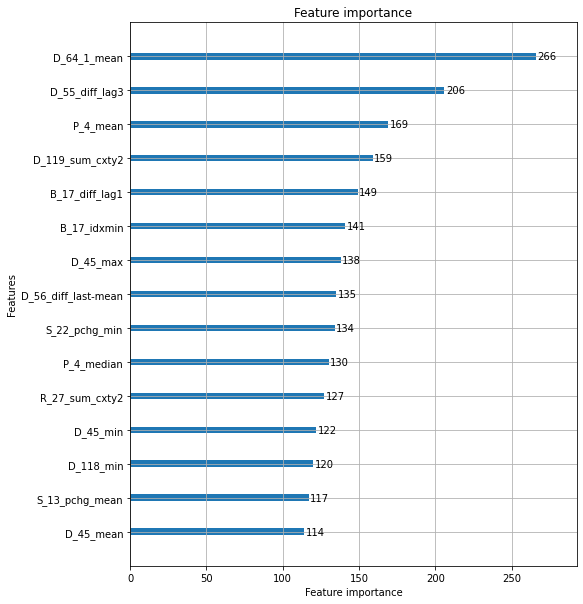

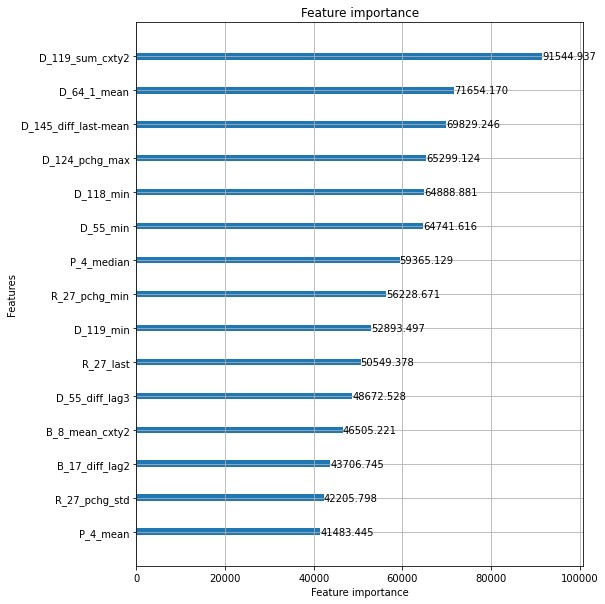

removed: ['D_119_sum_cxty2', 'D_55_min', 'D_64_1_mean', 'D_145_diff_last-mean', 'D_124_pchg_max']
Elapsed time: 2.964759016036987 min.
----------------------------------------------------------------------------------------------------
ITER: 14/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.854612


[100]	valid_0's auc: 0.881805


[150]	valid_0's auc: 0.895855


[200]	valid_0's auc: 0.906497


[250]	valid_0's auc: 0.913771


[300]	valid_0's auc: 0.920342


[350]	valid_0's auc: 0.925726


[400]	valid_0's auc: 0.931256


[450]	valid_0's auc: 0.93677


[500]	valid_0's auc: 0.939756
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.939756


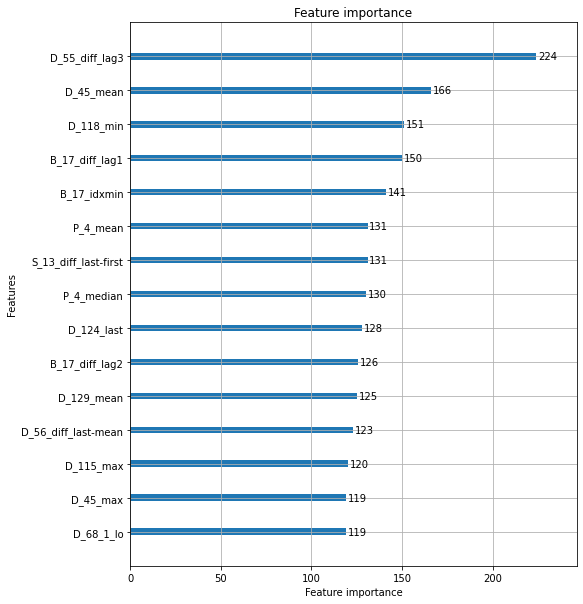

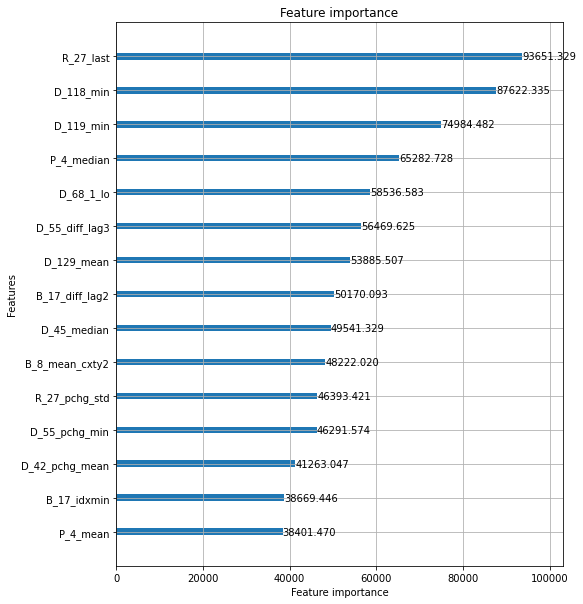

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.85443


[100]	valid_0's auc: 0.879557


[150]	valid_0's auc: 0.894753


[200]	valid_0's auc: 0.904778


[250]	valid_0's auc: 0.913168


[300]	valid_0's auc: 0.91962


[350]	valid_0's auc: 0.924586


[400]	valid_0's auc: 0.929032


[450]	valid_0's auc: 0.934218


[500]	valid_0's auc: 0.939936
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.939936


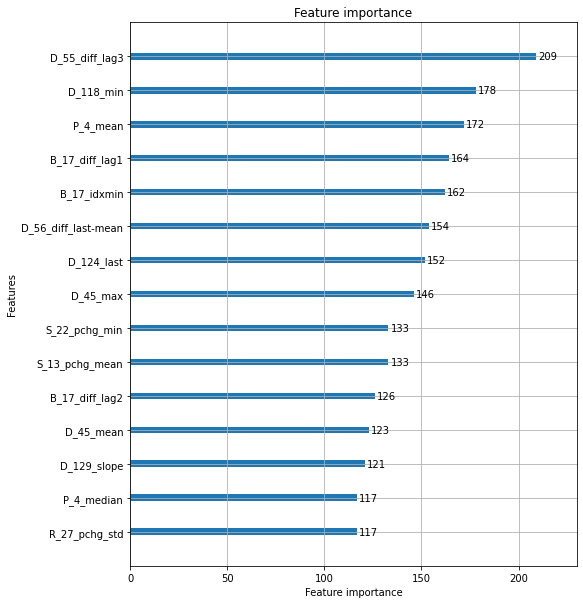

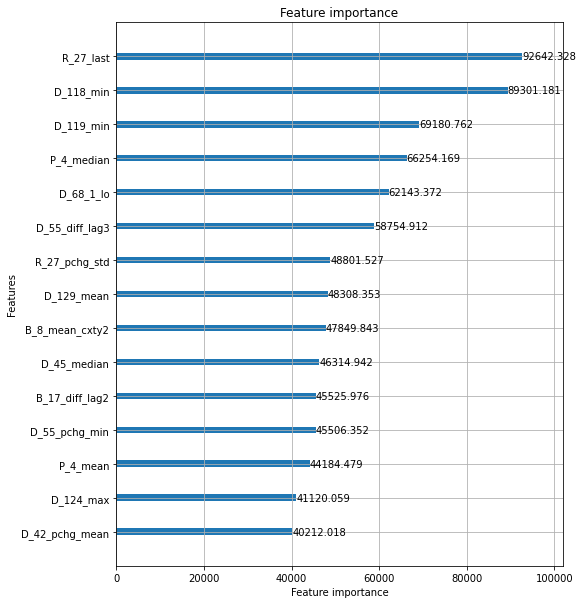

removed: ['R_27_last', 'D_118_min', 'D_119_min', 'P_4_median', 'D_68_1_lo']
Elapsed time: 3.0053743640581767 min.
----------------------------------------------------------------------------------------------------
ITER: 15/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.838508


[100]	valid_0's auc: 0.867082


[150]	valid_0's auc: 0.886085


[200]	valid_0's auc: 0.897483


[250]	valid_0's auc: 0.905433


[300]	valid_0's auc: 0.911261


[350]	valid_0's auc: 0.916897


[400]	valid_0's auc: 0.921159


[450]	valid_0's auc: 0.925848


[500]	valid_0's auc: 0.932454
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.932454


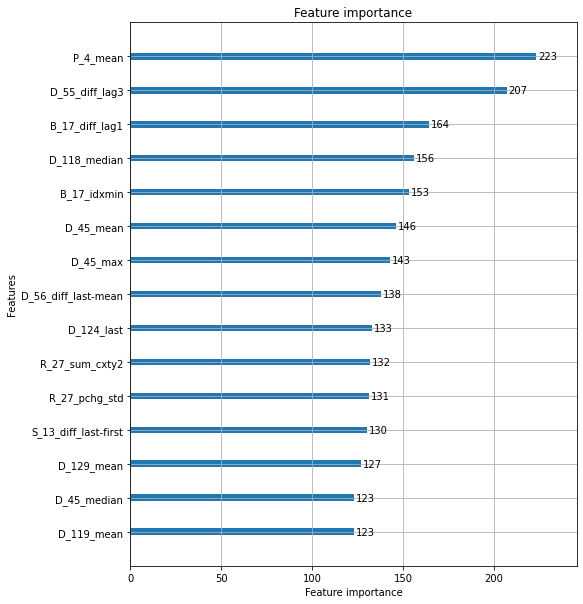

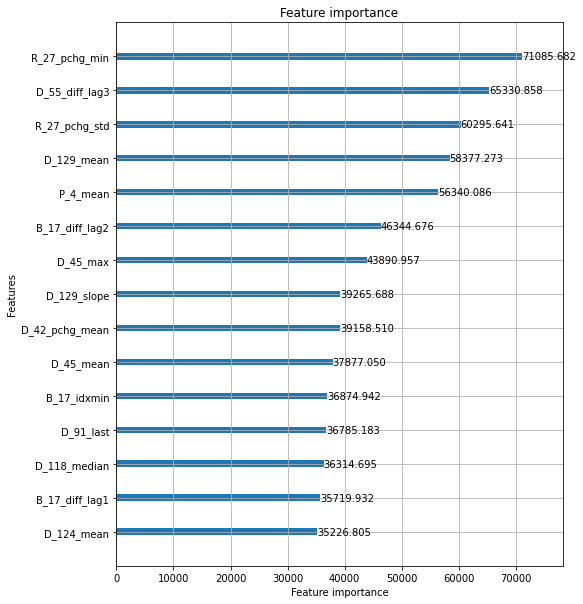

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.838327


[100]	valid_0's auc: 0.867061


[150]	valid_0's auc: 0.887192


[200]	valid_0's auc: 0.89899


[250]	valid_0's auc: 0.908194


[300]	valid_0's auc: 0.915042


[350]	valid_0's auc: 0.920294


[400]	valid_0's auc: 0.924787


[450]	valid_0's auc: 0.928816


[500]	valid_0's auc: 0.932927
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.932927


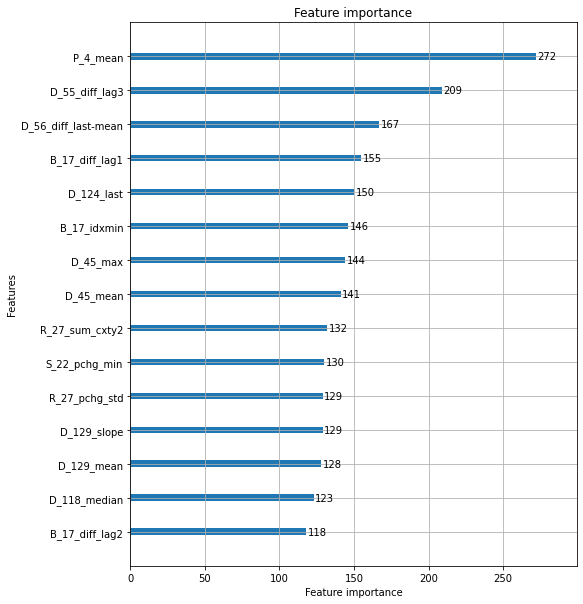

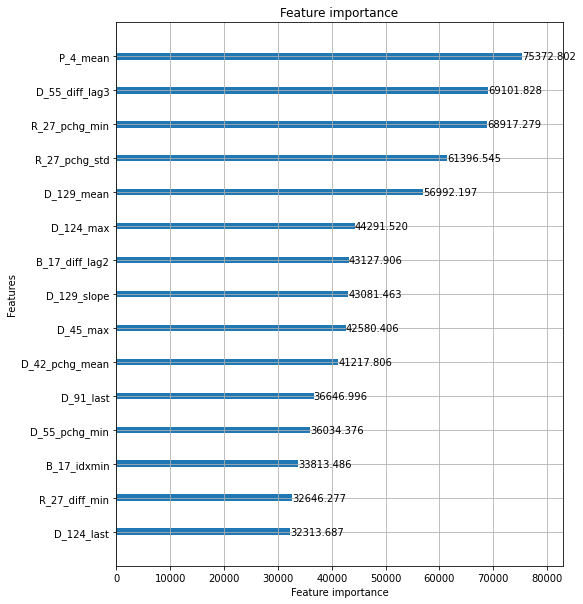

removed: ['R_27_pchg_min', 'D_55_diff_lag3', 'P_4_mean', 'R_27_pchg_std', 'D_129_mean']
Elapsed time: 2.9351267218589783 min.
----------------------------------------------------------------------------------------------------
ITER: 16/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.835692


[100]	valid_0's auc: 0.862835


[150]	valid_0's auc: 0.879308


[200]	valid_0's auc: 0.891213


[250]	valid_0's auc: 0.899306


[300]	valid_0's auc: 0.910655


[350]	valid_0's auc: 0.915824


[400]	valid_0's auc: 0.920865


[450]	valid_0's auc: 0.924441


[500]	valid_0's auc: 0.929328
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.929328


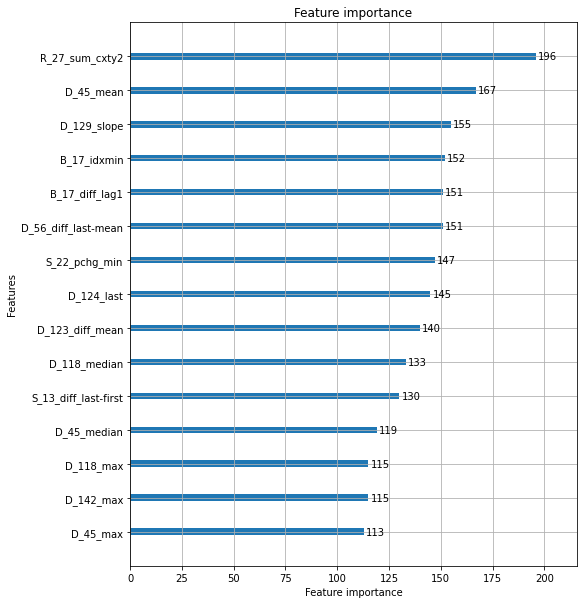

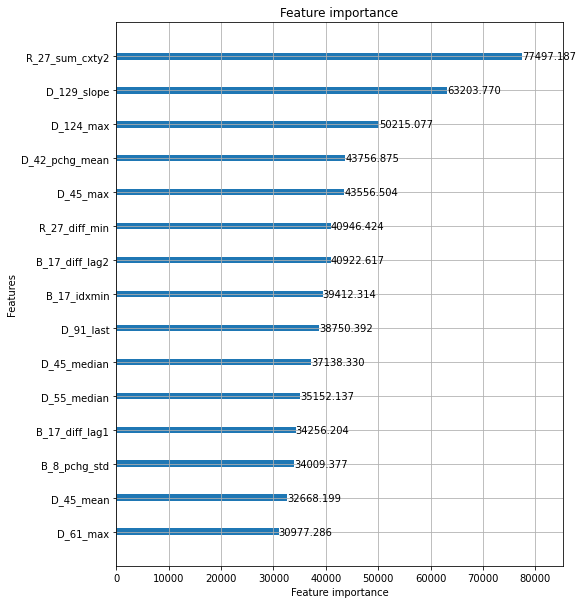

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.833313


[100]	valid_0's auc: 0.861298


[150]	valid_0's auc: 0.878152


[200]	valid_0's auc: 0.889892


[250]	valid_0's auc: 0.899518


[300]	valid_0's auc: 0.908181


[350]	valid_0's auc: 0.915321


[400]	valid_0's auc: 0.9197


[450]	valid_0's auc: 0.923168


[500]	valid_0's auc: 0.928266
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.928266


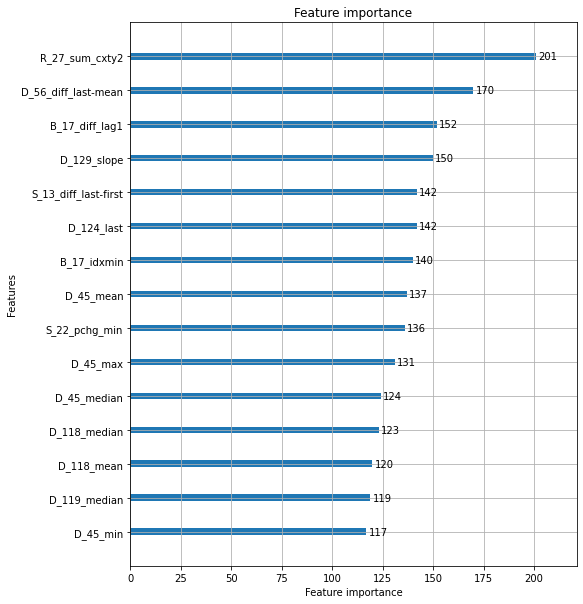

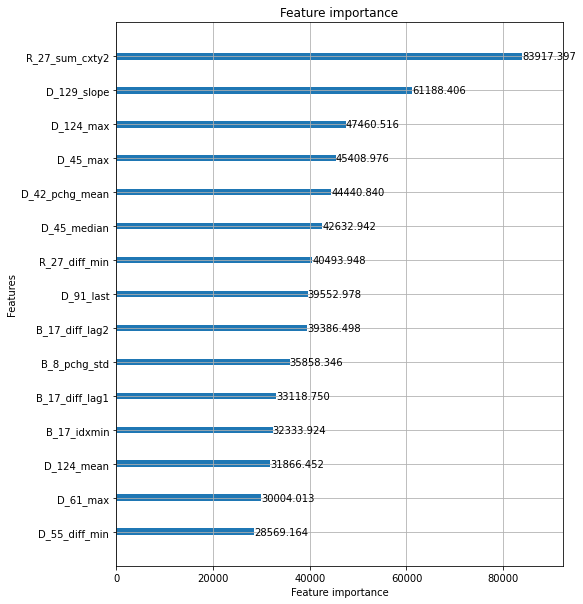

removed: ['R_27_sum_cxty2', 'D_129_slope', 'D_124_max', 'D_45_max', 'D_42_pchg_mean']
Elapsed time: 2.937291884422302 min.
----------------------------------------------------------------------------------------------------
ITER: 17/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.834339


[100]	valid_0's auc: 0.861045


[150]	valid_0's auc: 0.879131


[200]	valid_0's auc: 0.890485


[250]	valid_0's auc: 0.899404


[300]	valid_0's auc: 0.905899


[350]	valid_0's auc: 0.912216


[400]	valid_0's auc: 0.917102


[450]	valid_0's auc: 0.921082


[500]	valid_0's auc: 0.924338
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.924338


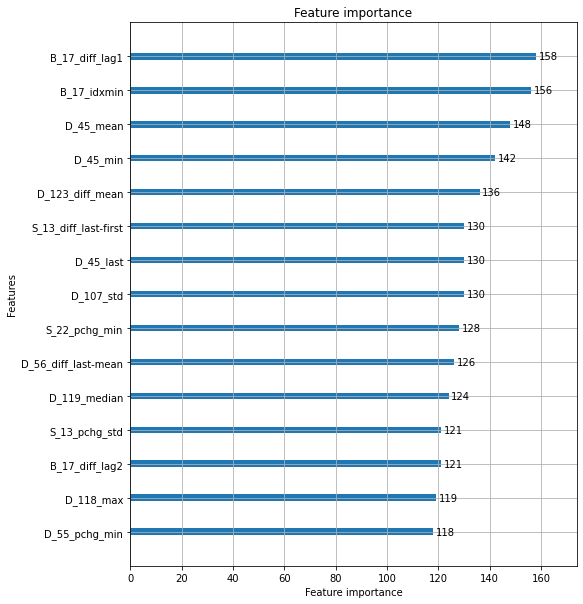

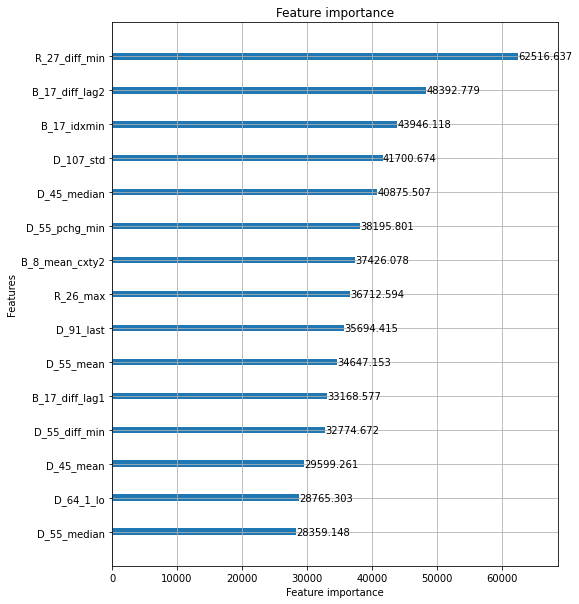

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.831907


[100]	valid_0's auc: 0.860601


[150]	valid_0's auc: 0.879376


[200]	valid_0's auc: 0.890338


[250]	valid_0's auc: 0.899352


[300]	valid_0's auc: 0.905927


[350]	valid_0's auc: 0.912888


[400]	valid_0's auc: 0.917035


[450]	valid_0's auc: 0.921026


[500]	valid_0's auc: 0.924381
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.924381


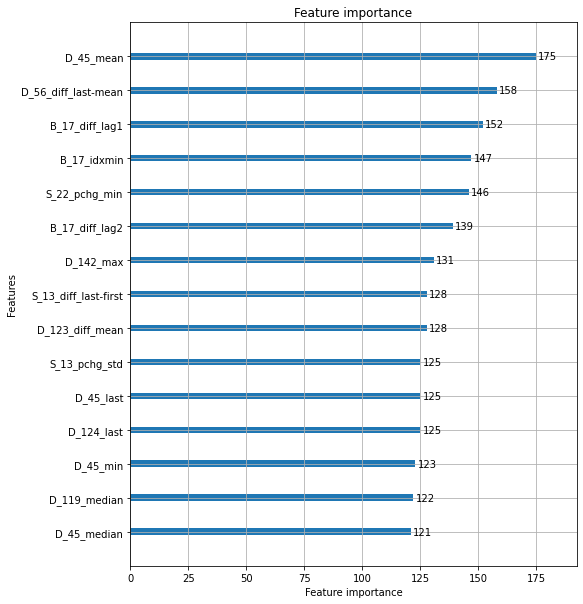

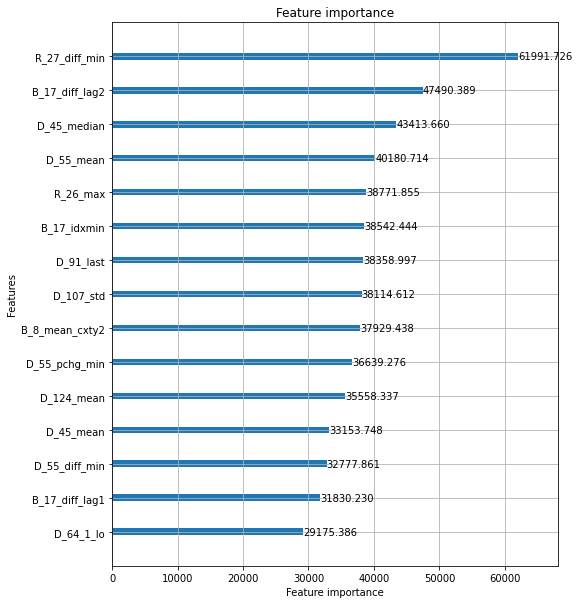

removed: ['R_27_diff_min', 'B_17_diff_lag2', 'D_45_median', 'B_17_idxmin', 'D_107_std']
Elapsed time: 2.9607849677403766 min.
----------------------------------------------------------------------------------------------------
ITER: 18/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.820977


[100]	valid_0's auc: 0.852805


[150]	valid_0's auc: 0.870294


[200]	valid_0's auc: 0.881971


[250]	valid_0's auc: 0.891448


[300]	valid_0's auc: 0.899009


[350]	valid_0's auc: 0.905403


[400]	valid_0's auc: 0.909892


[450]	valid_0's auc: 0.915186


[500]	valid_0's auc: 0.918847
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.918847


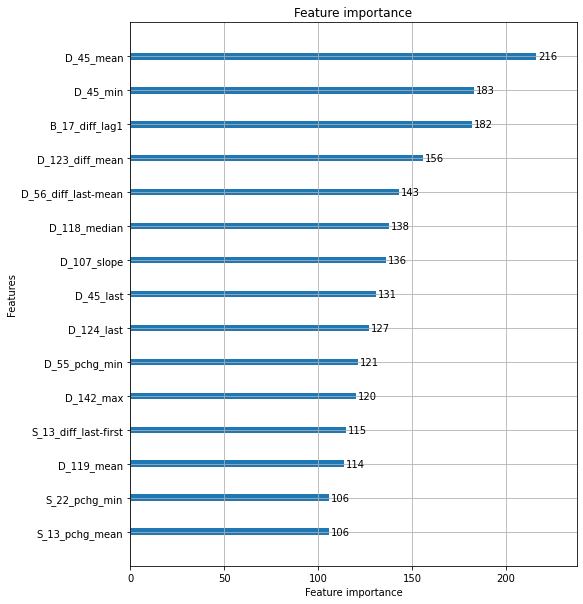

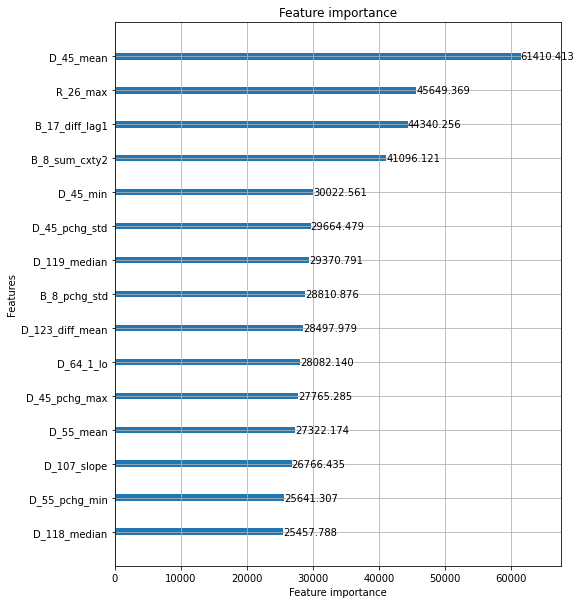

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.819432


[100]	valid_0's auc: 0.851448


[150]	valid_0's auc: 0.86871


[200]	valid_0's auc: 0.881624


[250]	valid_0's auc: 0.892579


[300]	valid_0's auc: 0.899763


[350]	valid_0's auc: 0.906018


[400]	valid_0's auc: 0.910287


[450]	valid_0's auc: 0.915281


[500]	valid_0's auc: 0.918815
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.918815


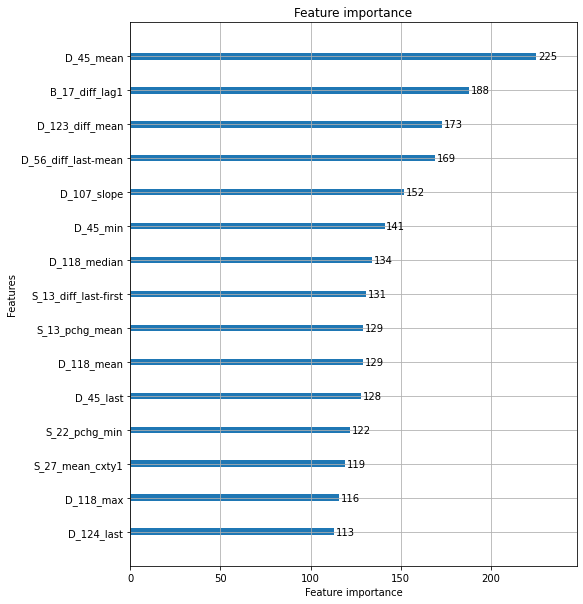

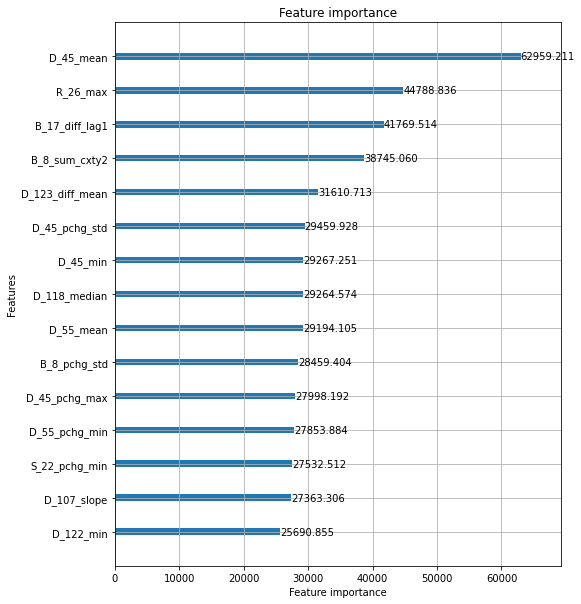

removed: ['D_45_mean', 'R_26_max', 'B_17_diff_lag1', 'B_8_sum_cxty2', 'D_123_diff_mean']
Elapsed time: 2.9136446078618365 min.
----------------------------------------------------------------------------------------------------
ITER: 19/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.81721


[100]	valid_0's auc: 0.847395


[150]	valid_0's auc: 0.865525


[200]	valid_0's auc: 0.877967


[250]	valid_0's auc: 0.889408


[300]	valid_0's auc: 0.896675


[350]	valid_0's auc: 0.903718


[400]	valid_0's auc: 0.90887


[450]	valid_0's auc: 0.912862


[500]	valid_0's auc: 0.917364
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.917364


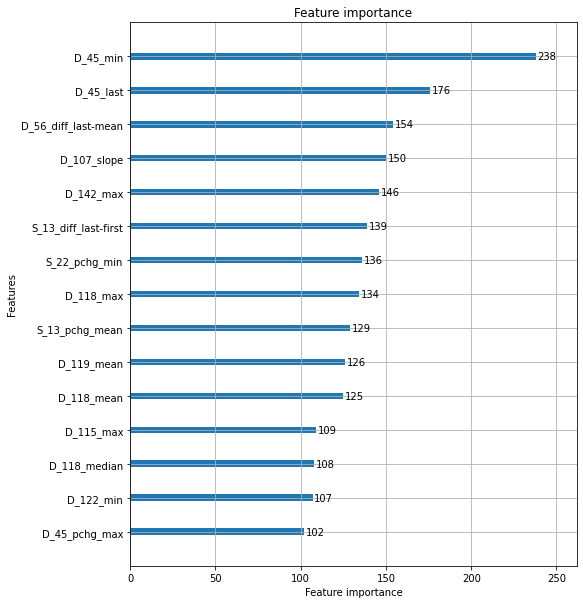

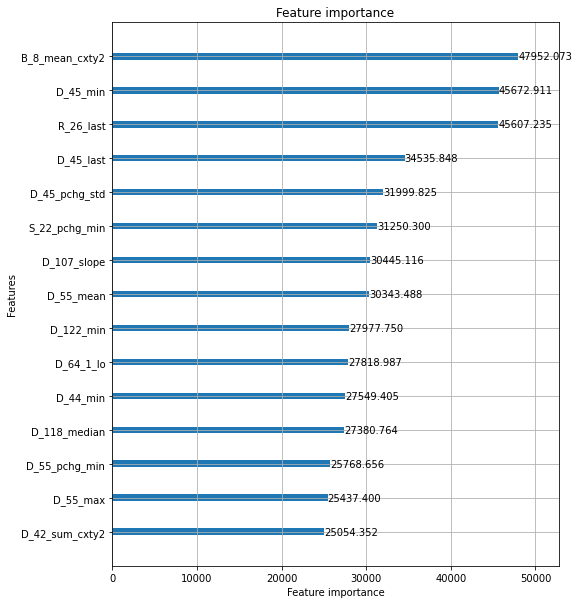

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.817147


[100]	valid_0's auc: 0.8478


[150]	valid_0's auc: 0.865201


[200]	valid_0's auc: 0.877964


[250]	valid_0's auc: 0.889458


[300]	valid_0's auc: 0.899113


[350]	valid_0's auc: 0.906139


[400]	valid_0's auc: 0.911412


[450]	valid_0's auc: 0.914805


[500]	valid_0's auc: 0.918595
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.918595


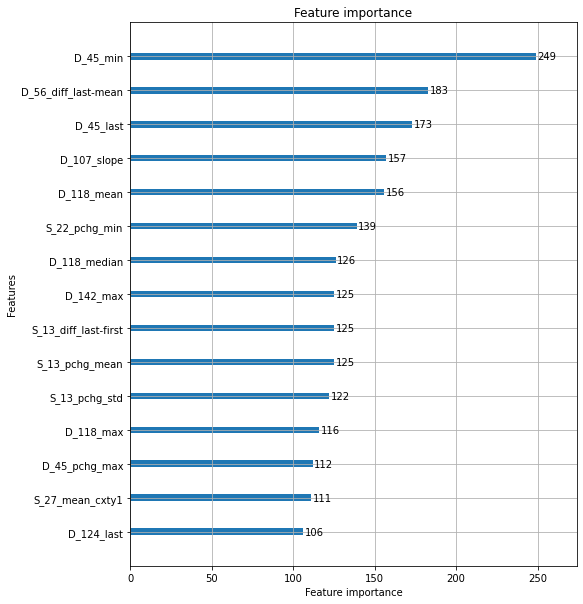

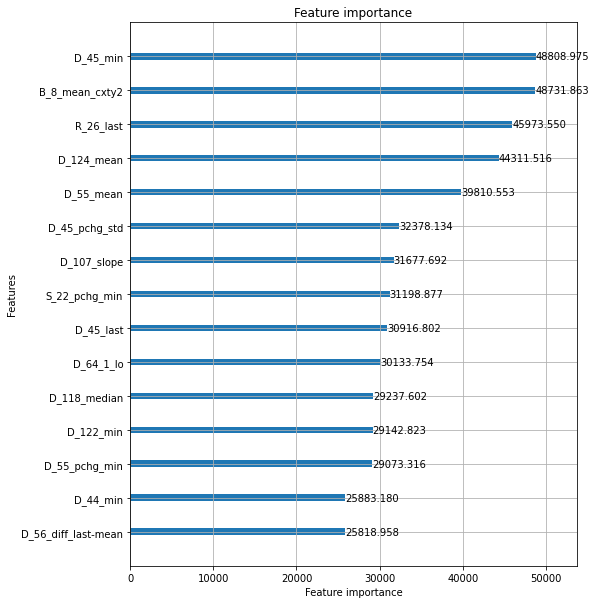

removed: ['B_8_mean_cxty2', 'D_45_min', 'R_26_last', 'D_55_mean', 'D_124_mean']
Elapsed time: 2.915938127040863 min.
----------------------------------------------------------------------------------------------------
ITER: 20/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.811053


[100]	valid_0's auc: 0.84082


[150]	valid_0's auc: 0.858681


[200]	valid_0's auc: 0.873231


[250]	valid_0's auc: 0.884654


[300]	valid_0's auc: 0.892892


[350]	valid_0's auc: 0.898967


[400]	valid_0's auc: 0.904054


[450]	valid_0's auc: 0.908521


[500]	valid_0's auc: 0.91226
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.91226


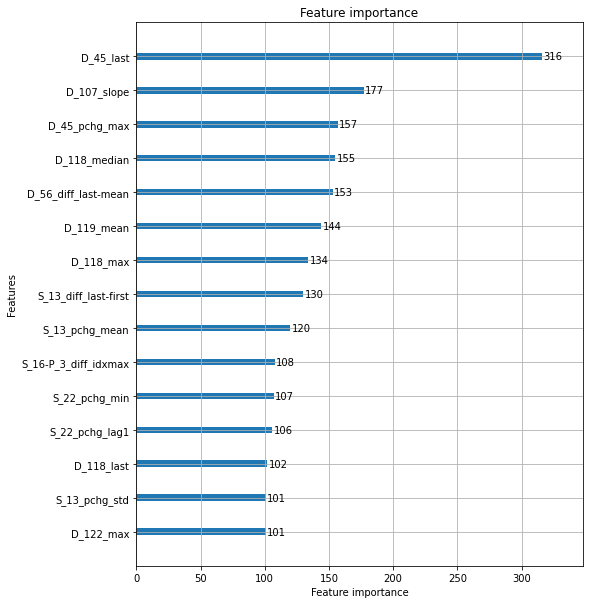

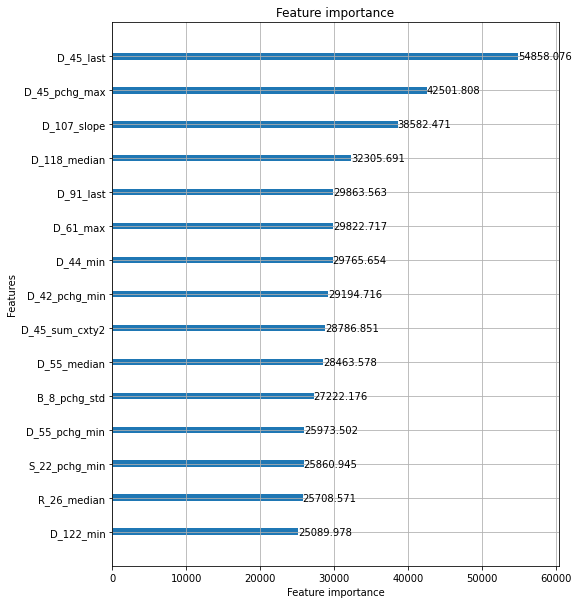

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.81254


[100]	valid_0's auc: 0.841682


[150]	valid_0's auc: 0.860843


[200]	valid_0's auc: 0.873926


[250]	valid_0's auc: 0.885012


[300]	valid_0's auc: 0.892975


[350]	valid_0's auc: 0.898506


[400]	valid_0's auc: 0.903726


[450]	valid_0's auc: 0.909014


[500]	valid_0's auc: 0.912825
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.912825


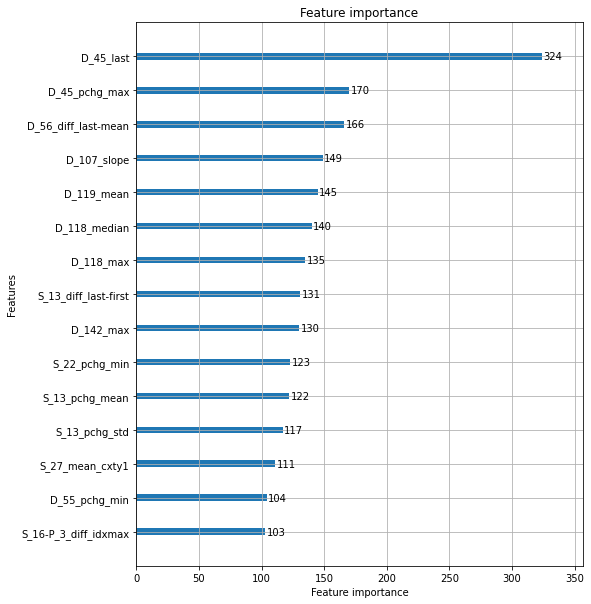

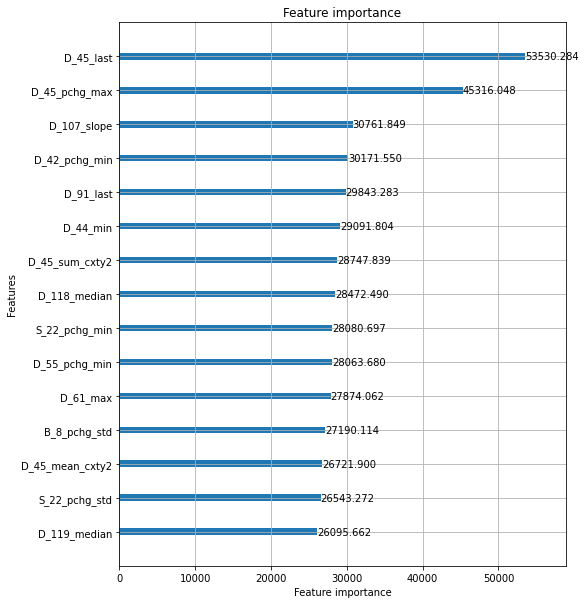

removed: ['D_45_last', 'D_45_pchg_max', 'D_107_slope', 'D_118_median', 'D_91_last']
Elapsed time: 2.8955299814542133 min.
----------------------------------------------------------------------------------------------------
ITER: 21/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.808633


[100]	valid_0's auc: 0.836455


[150]	valid_0's auc: 0.856097


[200]	valid_0's auc: 0.868492


[250]	valid_0's auc: 0.878862


[300]	valid_0's auc: 0.887355


[350]	valid_0's auc: 0.892697


[400]	valid_0's auc: 0.898046


[450]	valid_0's auc: 0.90368


[500]	valid_0's auc: 0.907466
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.907466


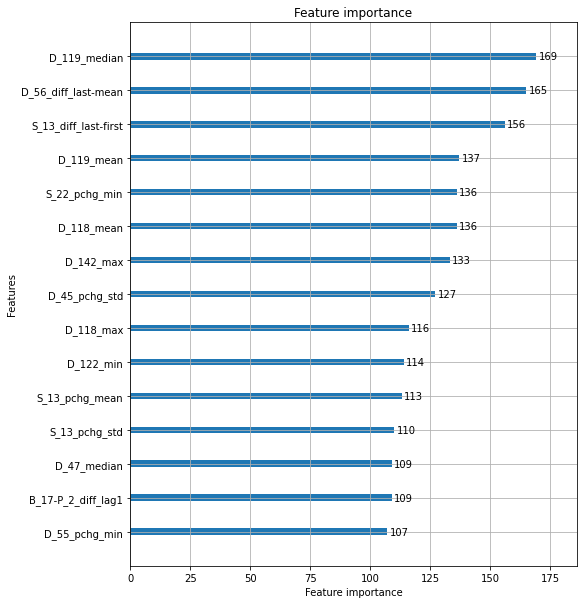

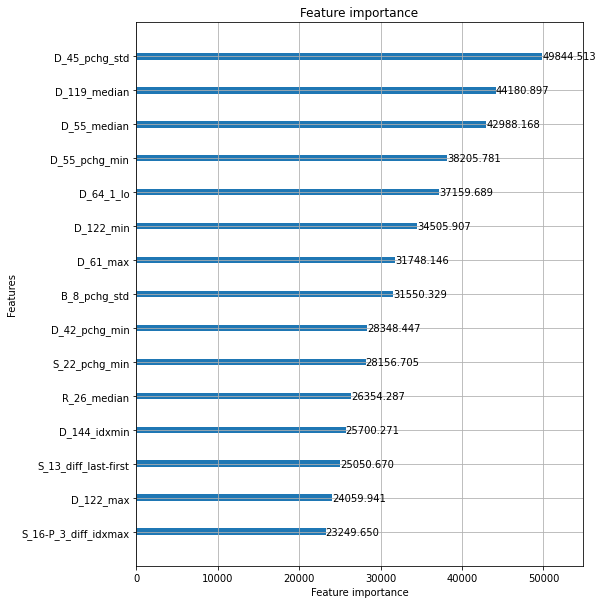

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.806952


[100]	valid_0's auc: 0.835093


[150]	valid_0's auc: 0.85506


[200]	valid_0's auc: 0.86789


[250]	valid_0's auc: 0.878276


[300]	valid_0's auc: 0.885965


[350]	valid_0's auc: 0.891507


[400]	valid_0's auc: 0.897064


[450]	valid_0's auc: 0.901786


[500]	valid_0's auc: 0.906152
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.906152


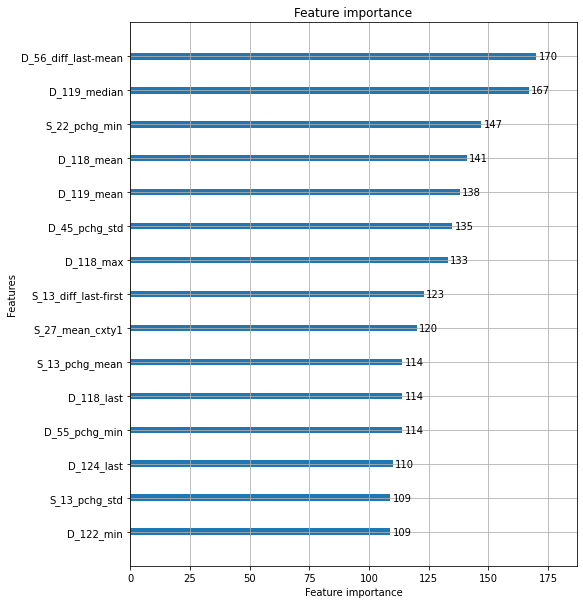

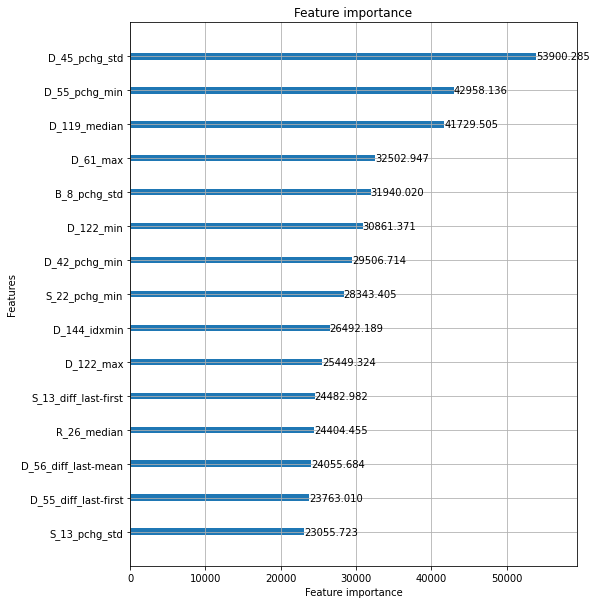

removed: ['D_45_pchg_std', 'D_119_median', 'D_55_pchg_min', 'D_122_min', 'D_61_max']
Elapsed time: 2.885021471977234 min.
----------------------------------------------------------------------------------------------------
ITER: 22/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.802613


[100]	valid_0's auc: 0.833757


[150]	valid_0's auc: 0.85104


[200]	valid_0's auc: 0.864073


[250]	valid_0's auc: 0.874417


[300]	valid_0's auc: 0.882719


[350]	valid_0's auc: 0.889812


[400]	valid_0's auc: 0.89542


[450]	valid_0's auc: 0.899658


[500]	valid_0's auc: 0.904514
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.904514


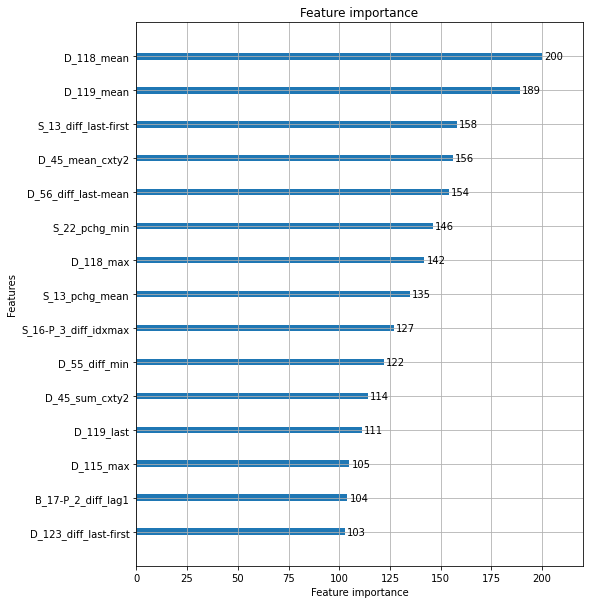

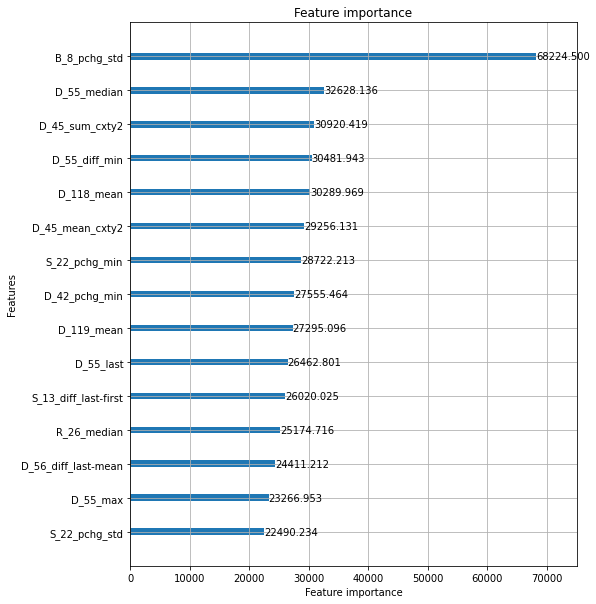

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.800865


[100]	valid_0's auc: 0.832291


[150]	valid_0's auc: 0.849911


[200]	valid_0's auc: 0.863212


[250]	valid_0's auc: 0.874587


[300]	valid_0's auc: 0.882035


[350]	valid_0's auc: 0.889001


[400]	valid_0's auc: 0.893997


[450]	valid_0's auc: 0.898603


[500]	valid_0's auc: 0.903379
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.903379


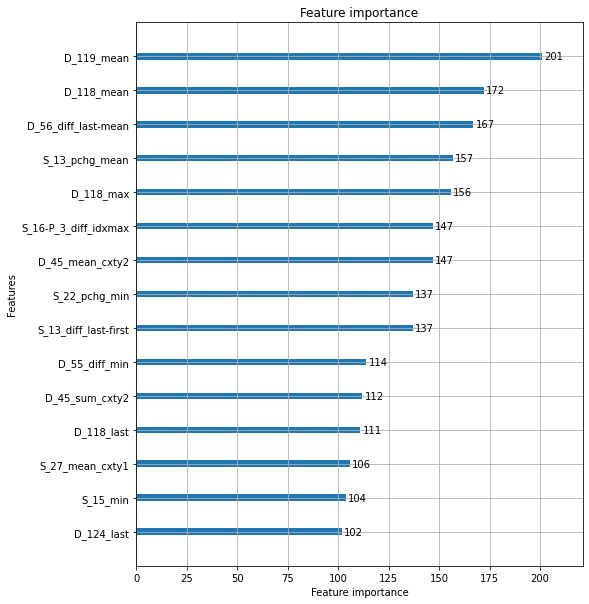

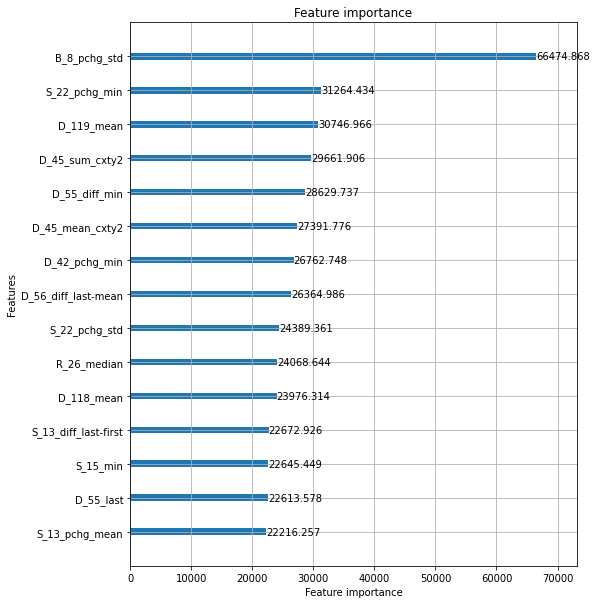

removed: ['B_8_pchg_std', 'D_45_sum_cxty2', 'S_22_pchg_min', 'D_55_diff_min', 'D_119_mean']
Elapsed time: 2.8644311666488647 min.
----------------------------------------------------------------------------------------------------
ITER: 23/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.804838


[100]	valid_0's auc: 0.833648


[150]	valid_0's auc: 0.851853


[200]	valid_0's auc: 0.865764


[250]	valid_0's auc: 0.87529


[300]	valid_0's auc: 0.882701


[350]	valid_0's auc: 0.888613


[400]	valid_0's auc: 0.893896


[450]	valid_0's auc: 0.898616


[500]	valid_0's auc: 0.90292
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.90292


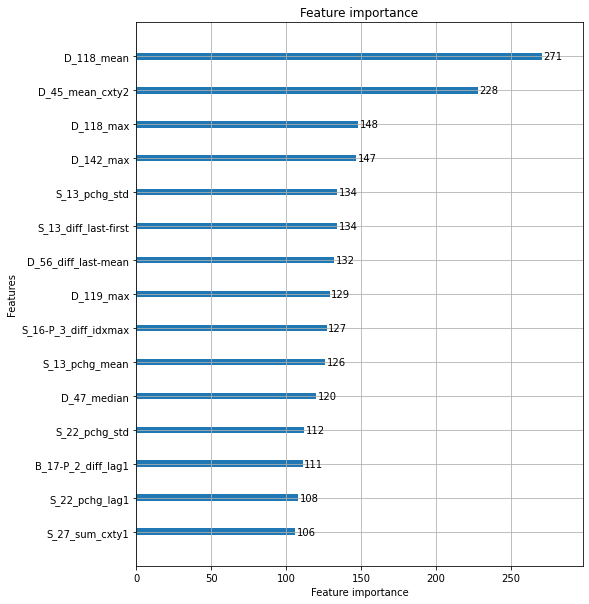

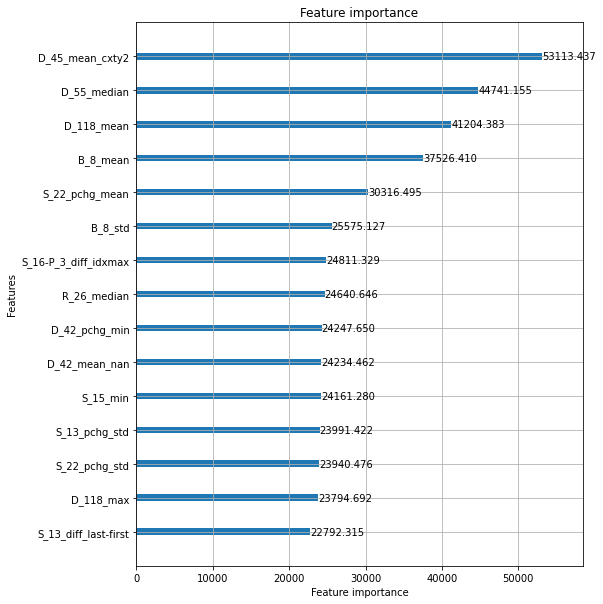

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.801505


[100]	valid_0's auc: 0.833114


[150]	valid_0's auc: 0.851221


[200]	valid_0's auc: 0.864563


[250]	valid_0's auc: 0.875315


[300]	valid_0's auc: 0.883944


[350]	valid_0's auc: 0.889679


[400]	valid_0's auc: 0.894496


[450]	valid_0's auc: 0.898667


[500]	valid_0's auc: 0.901978
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.901978


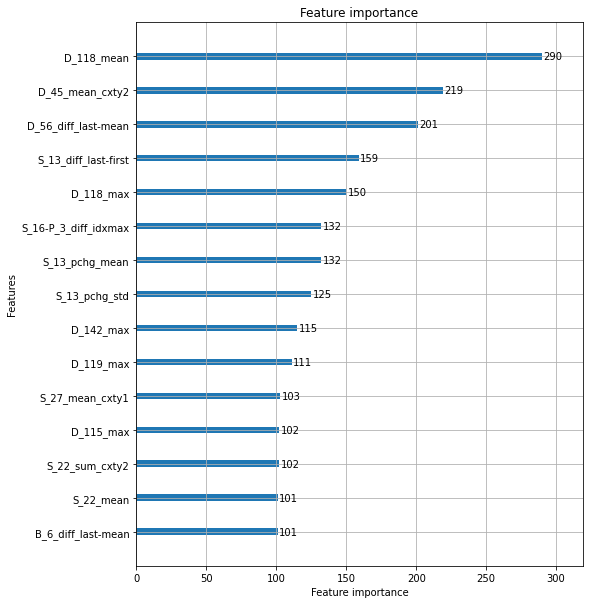

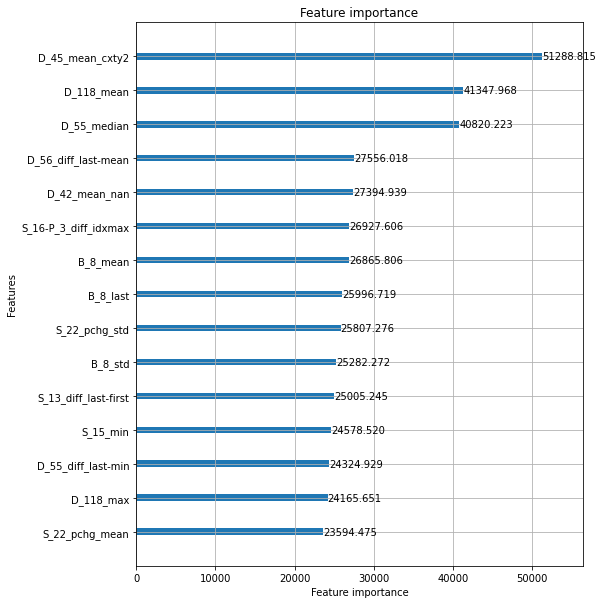

removed: ['D_45_mean_cxty2', 'D_55_median', 'D_118_mean', 'B_8_mean', 'S_22_pchg_mean']
Elapsed time: 2.8166364590326944 min.
----------------------------------------------------------------------------------------------------
ITER: 24/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.797433


[100]	valid_0's auc: 0.826623


[150]	valid_0's auc: 0.846765


[200]	valid_0's auc: 0.860025


[250]	valid_0's auc: 0.87023


[300]	valid_0's auc: 0.877844


[350]	valid_0's auc: 0.885188


[400]	valid_0's auc: 0.890775


[450]	valid_0's auc: 0.896047


[500]	valid_0's auc: 0.899914
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.899914


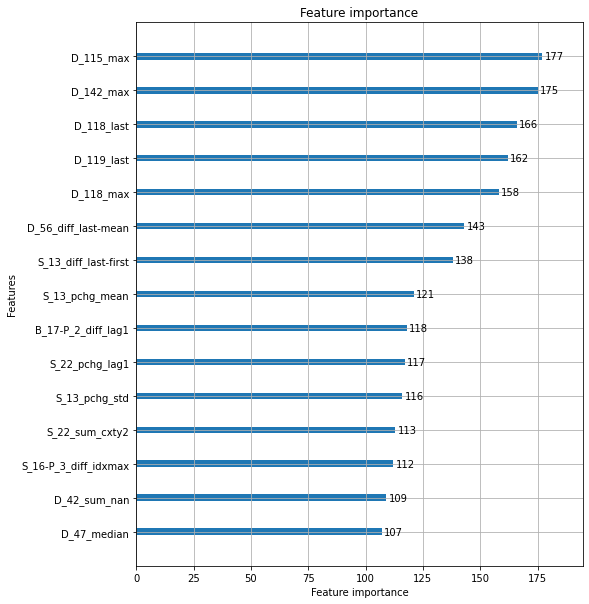

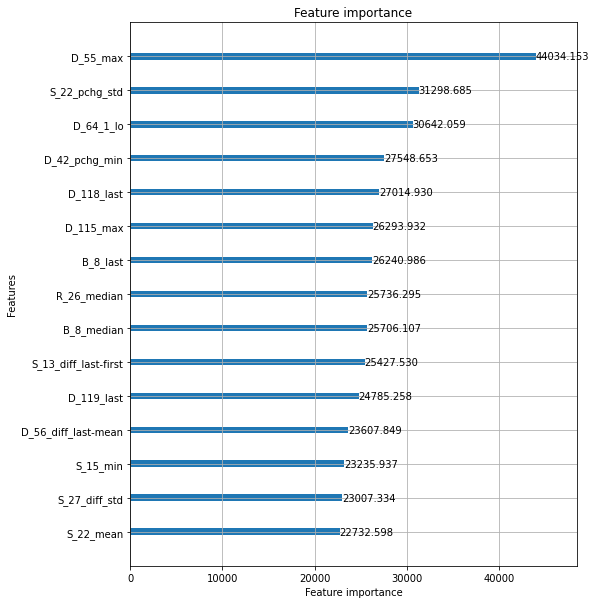

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.792472


[100]	valid_0's auc: 0.826775


[150]	valid_0's auc: 0.846445


[200]	valid_0's auc: 0.85867


[250]	valid_0's auc: 0.868216


[300]	valid_0's auc: 0.876622


[350]	valid_0's auc: 0.883323


[400]	valid_0's auc: 0.888702


[450]	valid_0's auc: 0.894317


[500]	valid_0's auc: 0.897837
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.897837


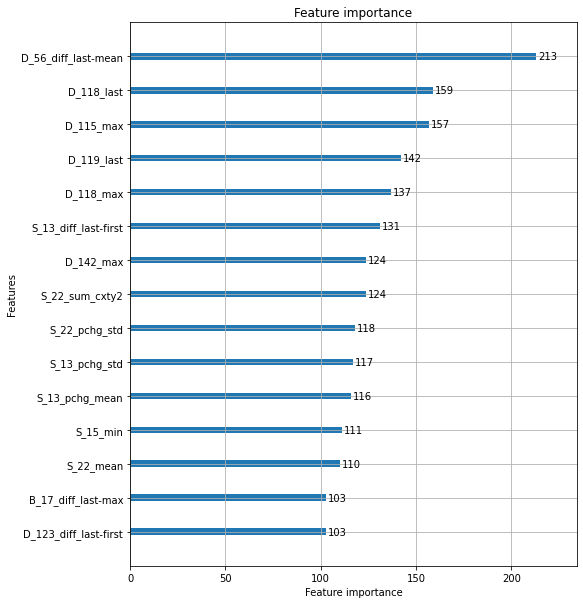

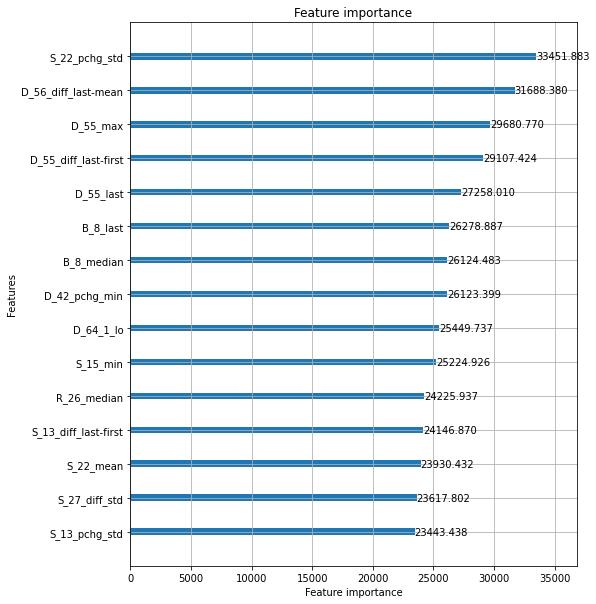

removed: ['D_55_max', 'S_22_pchg_std', 'D_64_1_lo', 'D_56_diff_last-mean', 'D_42_pchg_min']
Elapsed time: 2.8400471846262616 min.
----------------------------------------------------------------------------------------------------
ITER: 25/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.796373


[100]	valid_0's auc: 0.826944


[150]	valid_0's auc: 0.845943


[200]	valid_0's auc: 0.85955


[250]	valid_0's auc: 0.869614


[300]	valid_0's auc: 0.877085


[350]	valid_0's auc: 0.883895


[400]	valid_0's auc: 0.888584


[450]	valid_0's auc: 0.893428


[500]	valid_0's auc: 0.897169
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.897169


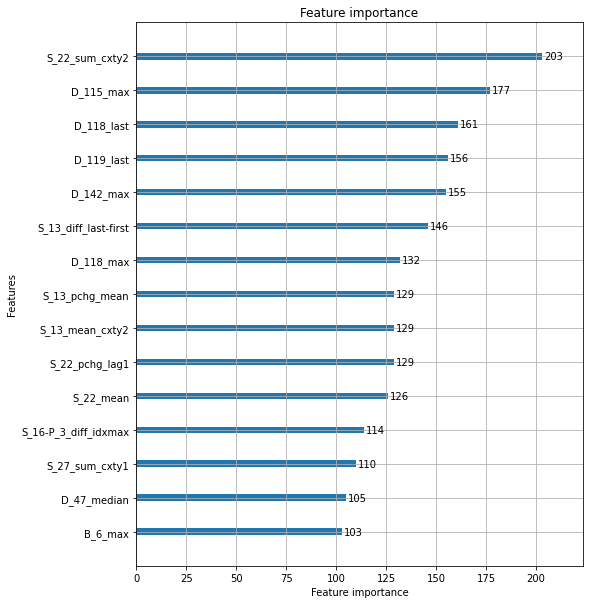

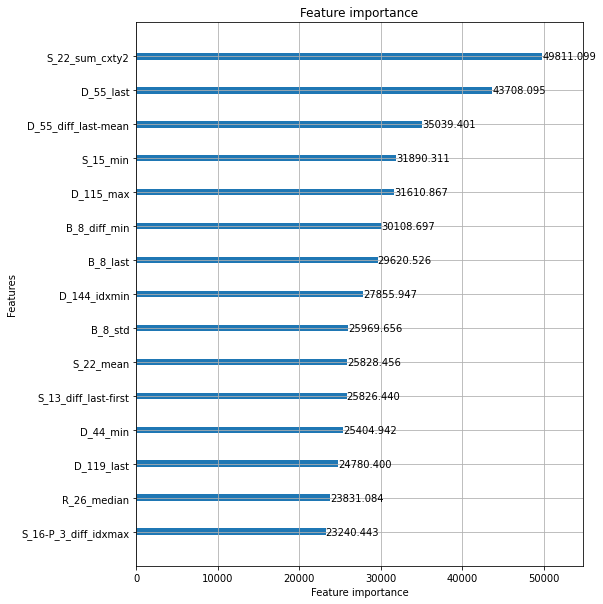

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.797324


[100]	valid_0's auc: 0.825738


[150]	valid_0's auc: 0.844541


[200]	valid_0's auc: 0.858043


[250]	valid_0's auc: 0.869458


[300]	valid_0's auc: 0.876847


[350]	valid_0's auc: 0.883154


[400]	valid_0's auc: 0.888027


[450]	valid_0's auc: 0.892182


[500]	valid_0's auc: 0.896131
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.896131


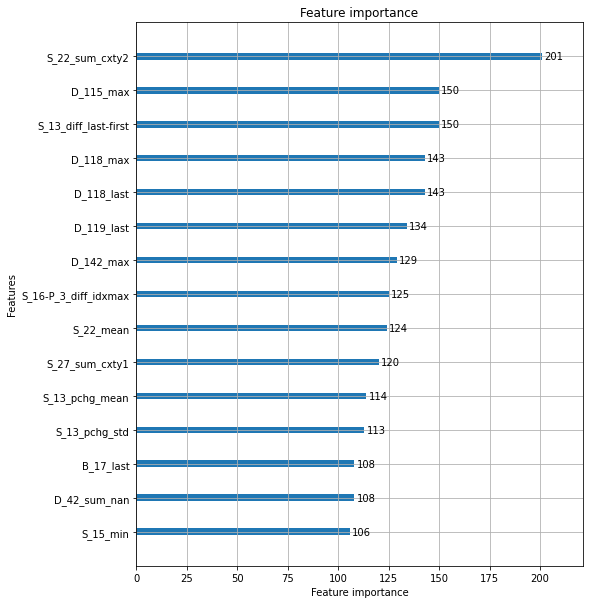

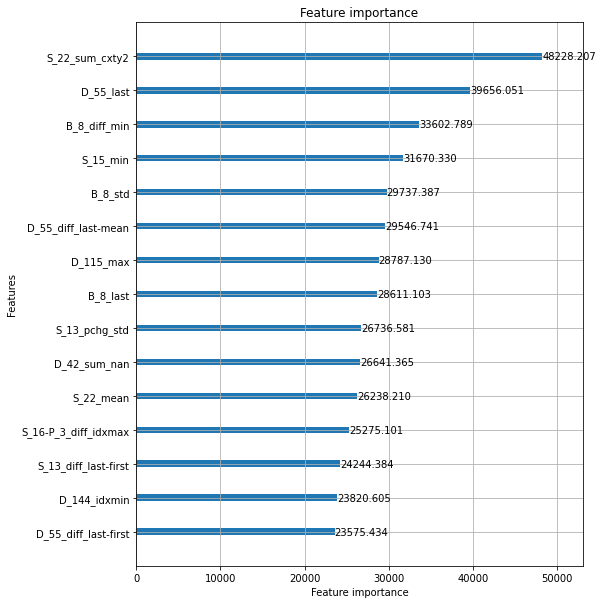

removed: ['S_22_sum_cxty2', 'D_55_last', 'D_55_diff_last-mean', 'B_8_diff_min', 'S_15_min']
Elapsed time: 2.767964307467143 min.
----------------------------------------------------------------------------------------------------
ITER: 26/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.795601


[100]	valid_0's auc: 0.822406


[150]	valid_0's auc: 0.84028


[200]	valid_0's auc: 0.853205


[250]	valid_0's auc: 0.86347


[300]	valid_0's auc: 0.871623


[350]	valid_0's auc: 0.878021


[400]	valid_0's auc: 0.884411


[450]	valid_0's auc: 0.888689


[500]	valid_0's auc: 0.892696
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.892696


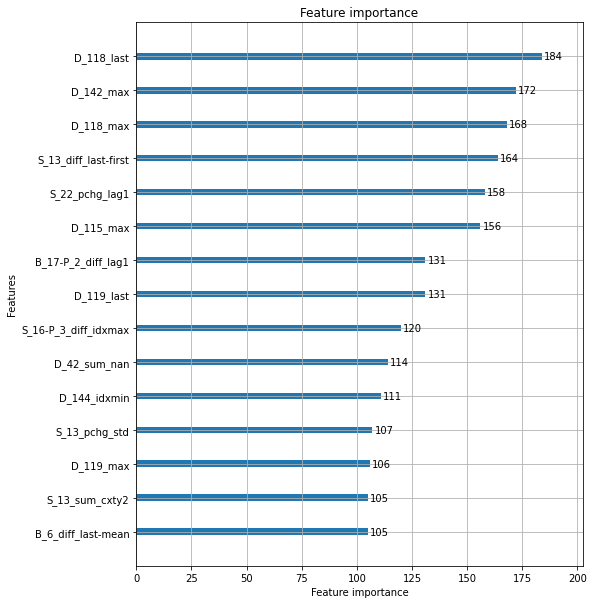

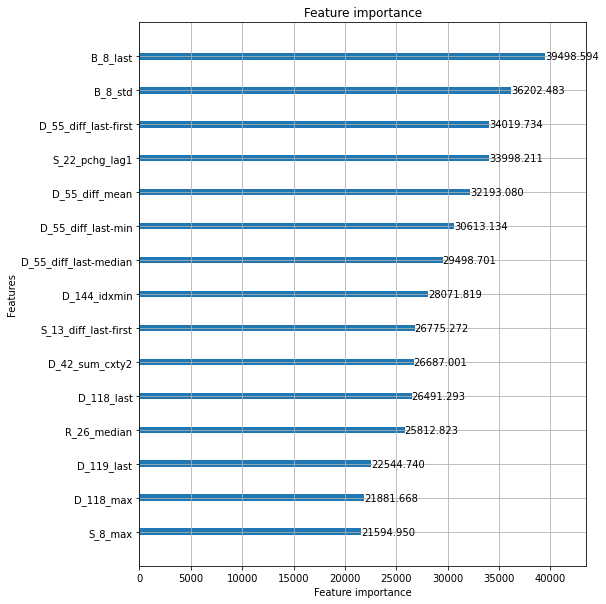

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.796027


[100]	valid_0's auc: 0.821776


[150]	valid_0's auc: 0.839541


[200]	valid_0's auc: 0.85299


[250]	valid_0's auc: 0.863326


[300]	valid_0's auc: 0.87218


[350]	valid_0's auc: 0.878485


[400]	valid_0's auc: 0.883945


[450]	valid_0's auc: 0.88856


[500]	valid_0's auc: 0.892375
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.892375


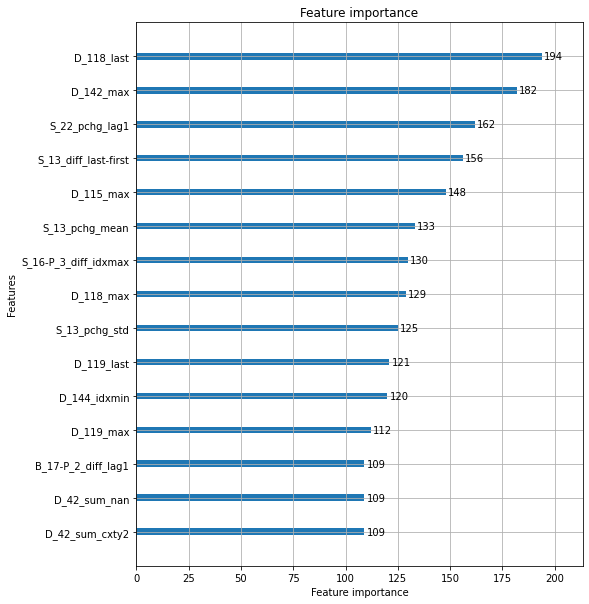

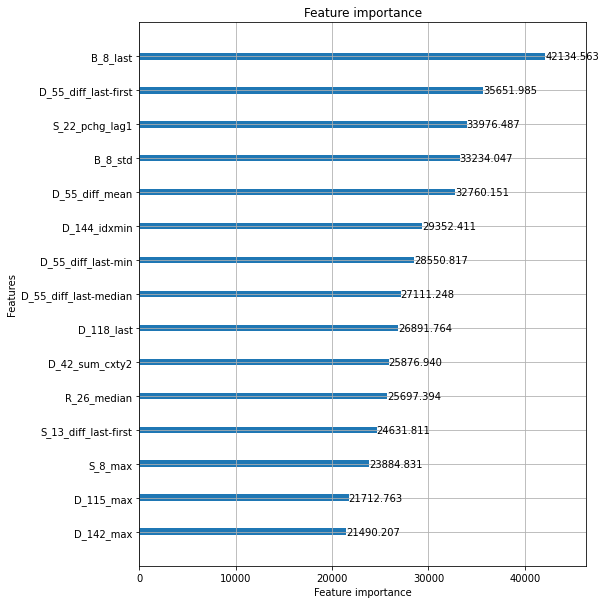

removed: ['B_8_last', 'D_55_diff_last-first', 'B_8_std', 'S_22_pchg_lag1', 'D_55_diff_mean']
Elapsed time: 2.762558726469676 min.
----------------------------------------------------------------------------------------------------
ITER: 27/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.790975


[100]	valid_0's auc: 0.817987


[150]	valid_0's auc: 0.837897


[200]	valid_0's auc: 0.851963


[250]	valid_0's auc: 0.861955


[300]	valid_0's auc: 0.870084


[350]	valid_0's auc: 0.876063


[400]	valid_0's auc: 0.882056


[450]	valid_0's auc: 0.886728


[500]	valid_0's auc: 0.890683
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.890683


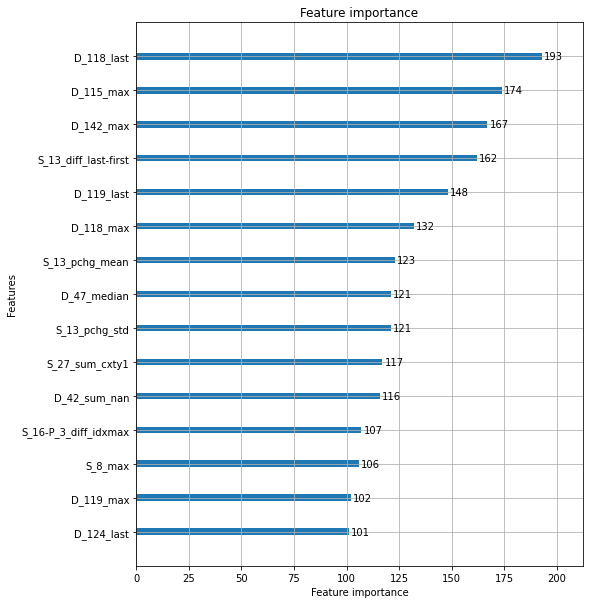

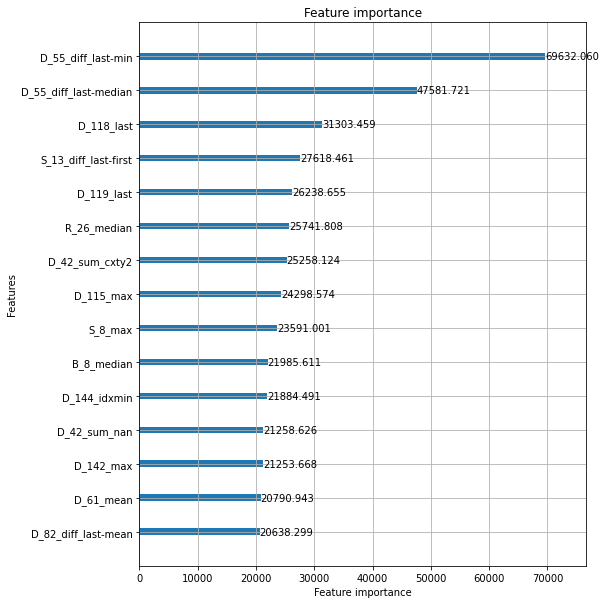

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.789121


[100]	valid_0's auc: 0.817312


[150]	valid_0's auc: 0.836758


[200]	valid_0's auc: 0.849585


[250]	valid_0's auc: 0.861148


[300]	valid_0's auc: 0.868788


[350]	valid_0's auc: 0.875464


[400]	valid_0's auc: 0.880753


[450]	valid_0's auc: 0.885229


[500]	valid_0's auc: 0.888822
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.888822


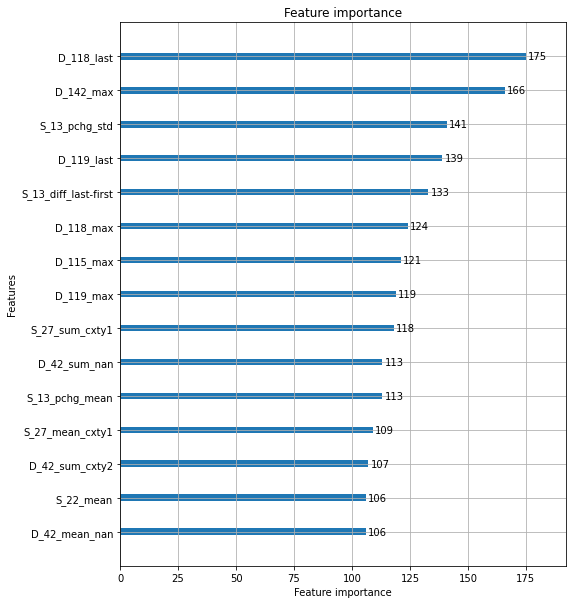

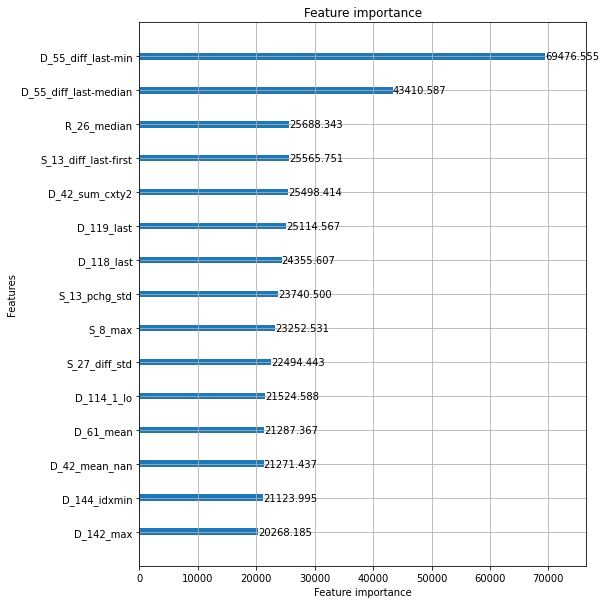

removed: ['D_55_diff_last-min', 'D_55_diff_last-median', 'D_118_last', 'S_13_diff_last-first', 'R_26_median']
Elapsed time: 2.7500577211380004 min.
----------------------------------------------------------------------------------------------------
ITER: 28/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.776082


[100]	valid_0's auc: 0.811242


[150]	valid_0's auc: 0.830444


[200]	valid_0's auc: 0.845133


[250]	valid_0's auc: 0.855953


[300]	valid_0's auc: 0.864744


[350]	valid_0's auc: 0.87142


[400]	valid_0's auc: 0.877022


[450]	valid_0's auc: 0.881817


[500]	valid_0's auc: 0.88617
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.88617


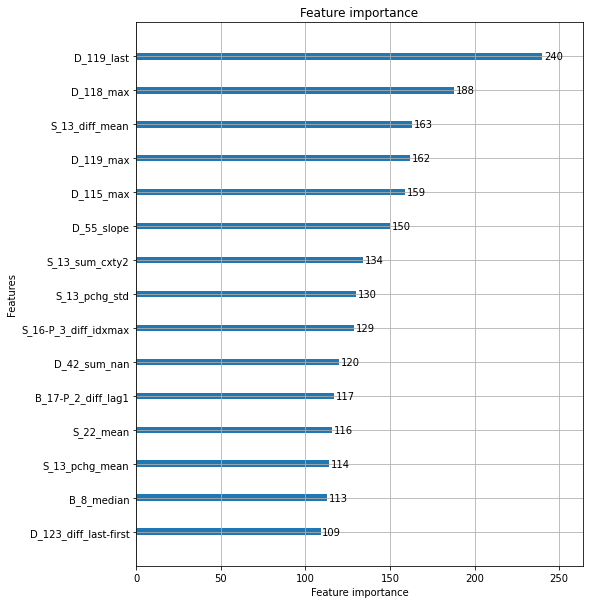

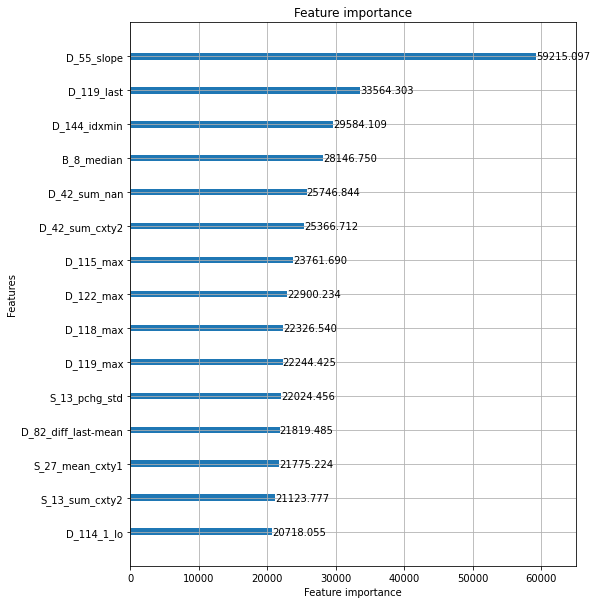

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.775269


[100]	valid_0's auc: 0.811473


[150]	valid_0's auc: 0.83167


[200]	valid_0's auc: 0.844155


[250]	valid_0's auc: 0.854681


[300]	valid_0's auc: 0.864514


[350]	valid_0's auc: 0.87131


[400]	valid_0's auc: 0.876619


[450]	valid_0's auc: 0.881734


[500]	valid_0's auc: 0.885554
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.885554


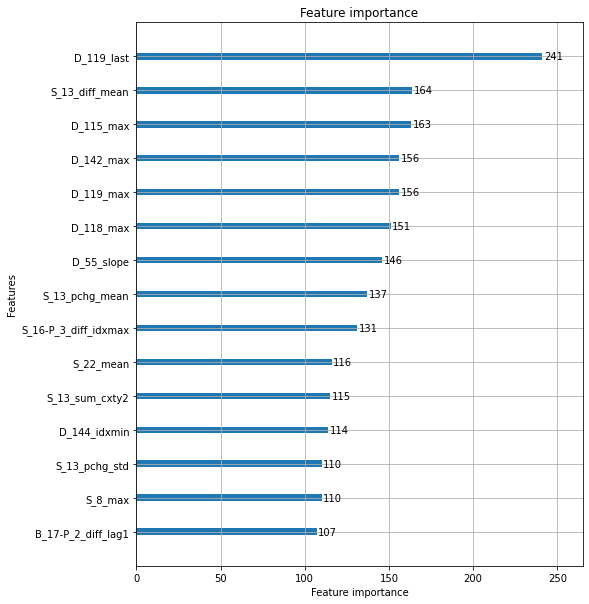

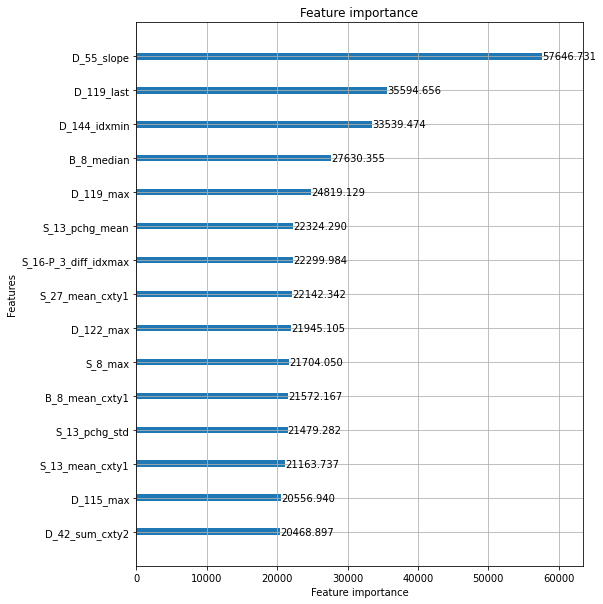

removed: ['D_55_slope', 'D_119_last', 'D_144_idxmin', 'B_8_median', 'D_119_max']
Elapsed time: 2.763655424118042 min.
----------------------------------------------------------------------------------------------------
ITER: 29/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.766385


[100]	valid_0's auc: 0.799515


[150]	valid_0's auc: 0.819922


[200]	valid_0's auc: 0.833909


[250]	valid_0's auc: 0.845466


[300]	valid_0's auc: 0.853472


[350]	valid_0's auc: 0.860414


[400]	valid_0's auc: 0.866547


[450]	valid_0's auc: 0.871009


[500]	valid_0's auc: 0.87479
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.87479


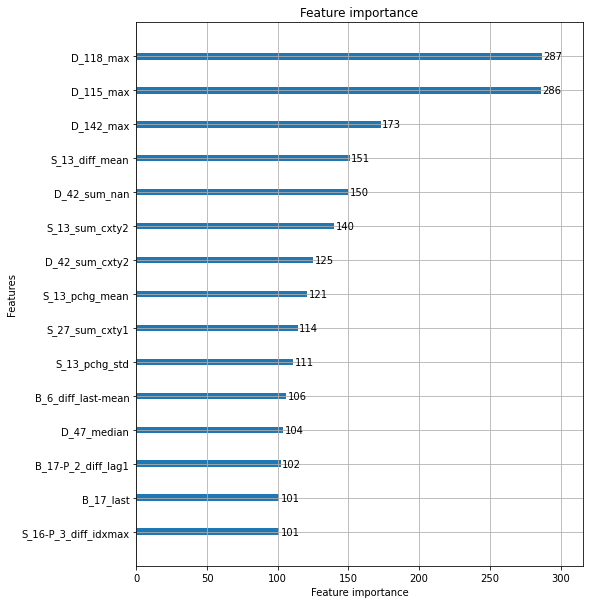

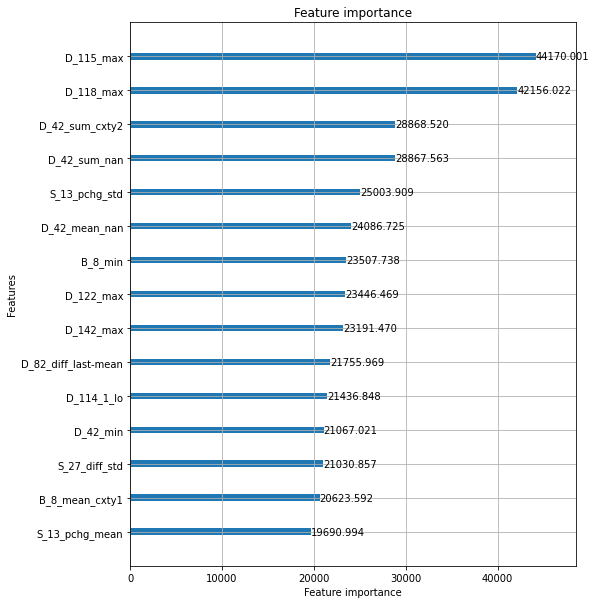

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.763789


[100]	valid_0's auc: 0.796115


[150]	valid_0's auc: 0.817475


[200]	valid_0's auc: 0.831722


[250]	valid_0's auc: 0.843489


[300]	valid_0's auc: 0.851445


[350]	valid_0's auc: 0.858243


[400]	valid_0's auc: 0.863948


[450]	valid_0's auc: 0.868804


[500]	valid_0's auc: 0.873339
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.873339


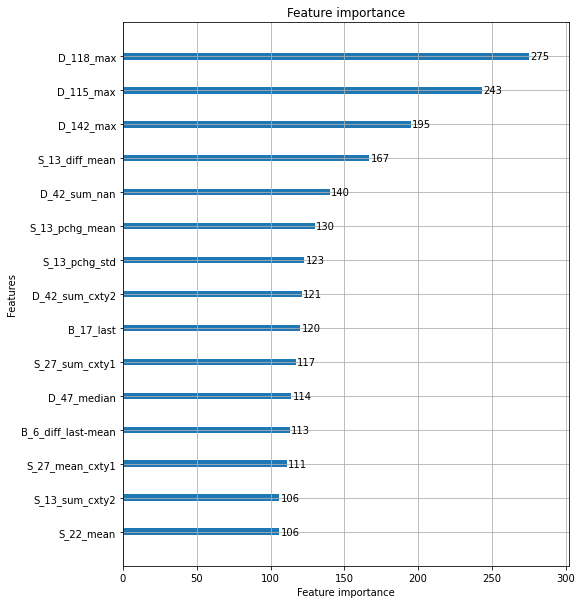

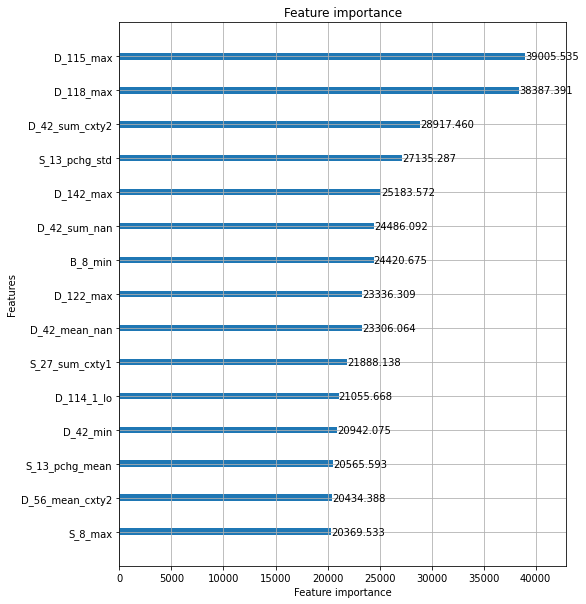

removed: ['D_115_max', 'D_118_max', 'D_42_sum_cxty2', 'D_42_sum_nan', 'S_13_pchg_std']
Elapsed time: 2.717586088180542 min.
----------------------------------------------------------------------------------------------------
ITER: 30/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.765961


[100]	valid_0's auc: 0.792253


[150]	valid_0's auc: 0.812888


[200]	valid_0's auc: 0.827429


[250]	valid_0's auc: 0.839679


[300]	valid_0's auc: 0.84836


[350]	valid_0's auc: 0.854849


[400]	valid_0's auc: 0.860536


[450]	valid_0's auc: 0.865185


[500]	valid_0's auc: 0.869182
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.869182


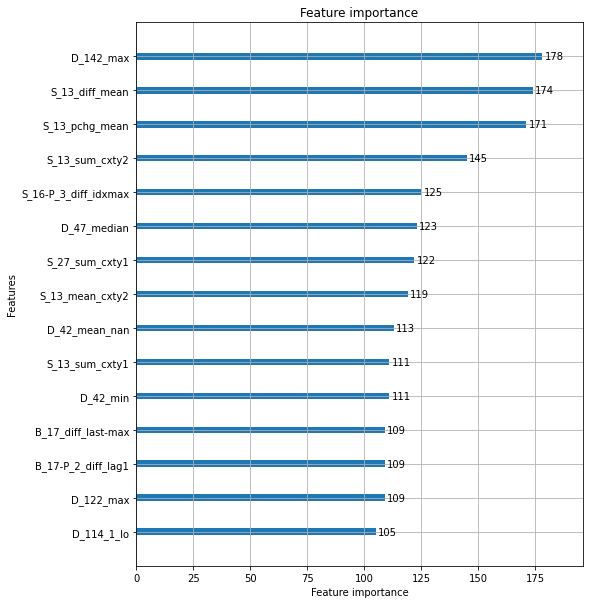

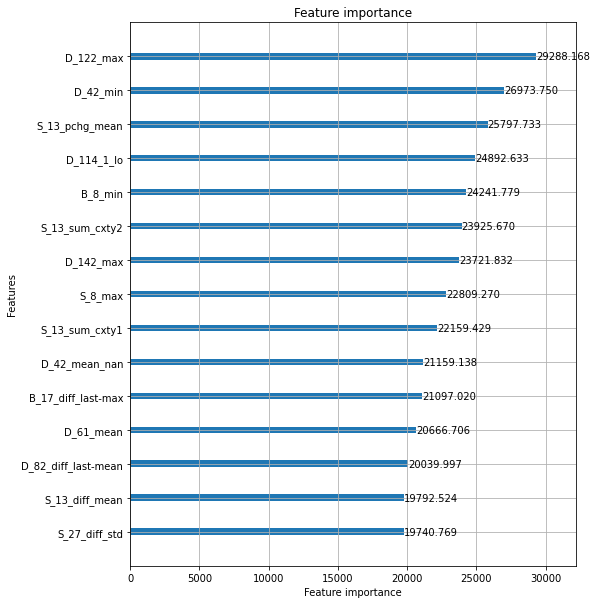

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.763115


[100]	valid_0's auc: 0.790348


[150]	valid_0's auc: 0.810602


[200]	valid_0's auc: 0.824801


[250]	valid_0's auc: 0.836317


[300]	valid_0's auc: 0.845139


[350]	valid_0's auc: 0.852321


[400]	valid_0's auc: 0.857985


[450]	valid_0's auc: 0.862742


[500]	valid_0's auc: 0.867027
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.867027


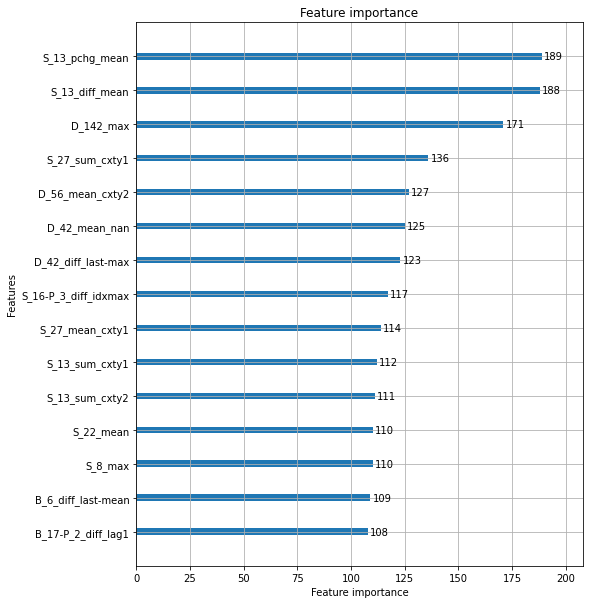

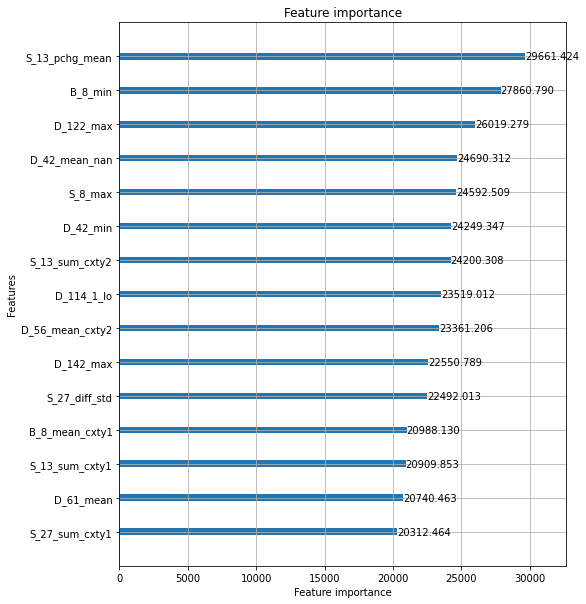

removed: ['S_13_pchg_mean', 'D_122_max', 'B_8_min', 'D_42_min', 'D_114_1_lo']
Elapsed time: 2.741009553273519 min.
----------------------------------------------------------------------------------------------------
ITER: 31/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.759836


[100]	valid_0's auc: 0.79023


[150]	valid_0's auc: 0.81085


[200]	valid_0's auc: 0.824801


[250]	valid_0's auc: 0.83547


[300]	valid_0's auc: 0.844156


[350]	valid_0's auc: 0.851064


[400]	valid_0's auc: 0.857021


[450]	valid_0's auc: 0.861396


[500]	valid_0's auc: 0.865458
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.865458


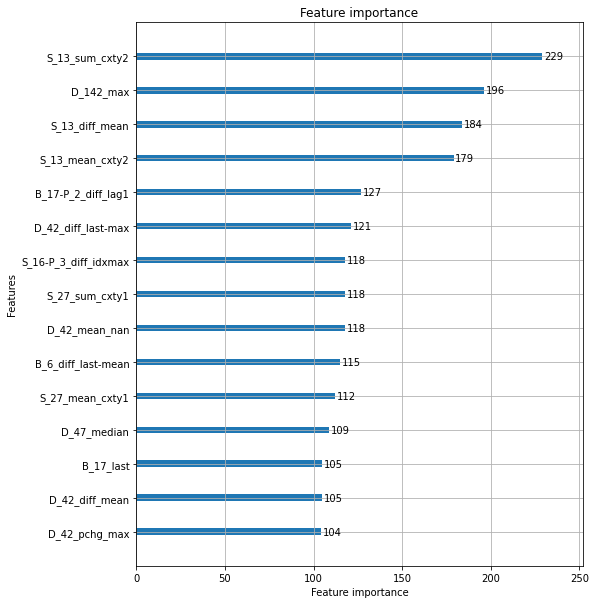

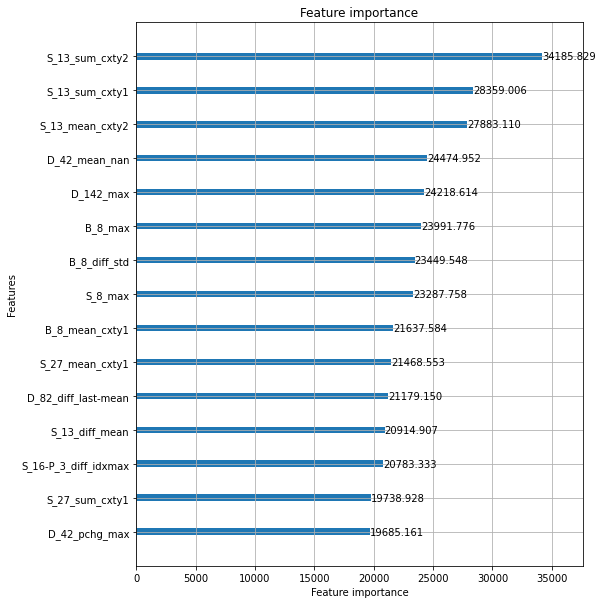

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.75969


[100]	valid_0's auc: 0.78911


[150]	valid_0's auc: 0.810085


[200]	valid_0's auc: 0.824475


[250]	valid_0's auc: 0.835321


[300]	valid_0's auc: 0.843564


[350]	valid_0's auc: 0.850841


[400]	valid_0's auc: 0.856277


[450]	valid_0's auc: 0.861409


[500]	valid_0's auc: 0.865426
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.865426


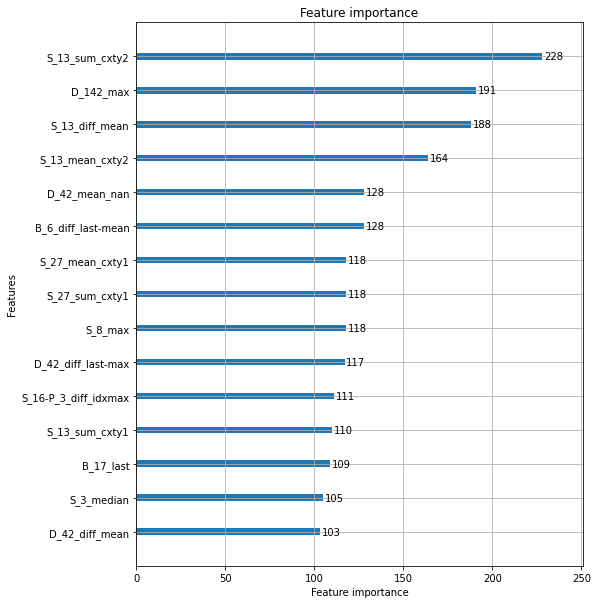

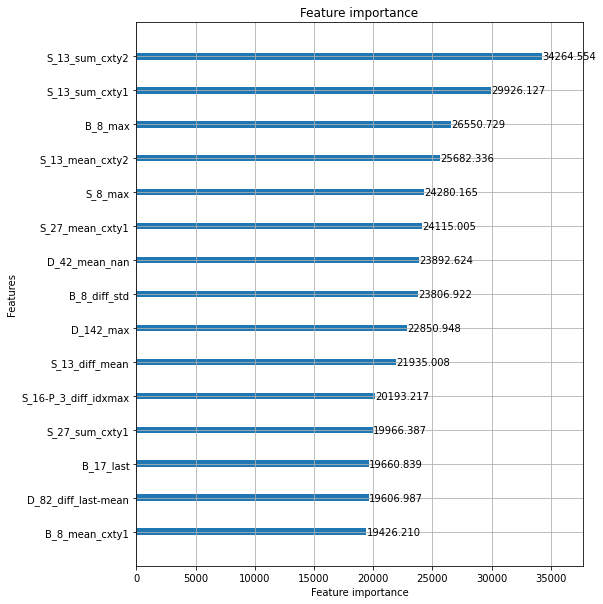

removed: ['S_13_sum_cxty2', 'S_13_sum_cxty1', 'S_13_mean_cxty2', 'B_8_max', 'D_42_mean_nan']
Elapsed time: 2.687057109673818 min.
----------------------------------------------------------------------------------------------------
ITER: 32/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.752033


[100]	valid_0's auc: 0.783297


[150]	valid_0's auc: 0.805255


[200]	valid_0's auc: 0.820282


[250]	valid_0's auc: 0.831417


[300]	valid_0's auc: 0.840208


[350]	valid_0's auc: 0.846798


[400]	valid_0's auc: 0.852524


[450]	valid_0's auc: 0.857499


[500]	valid_0's auc: 0.861396
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.861396


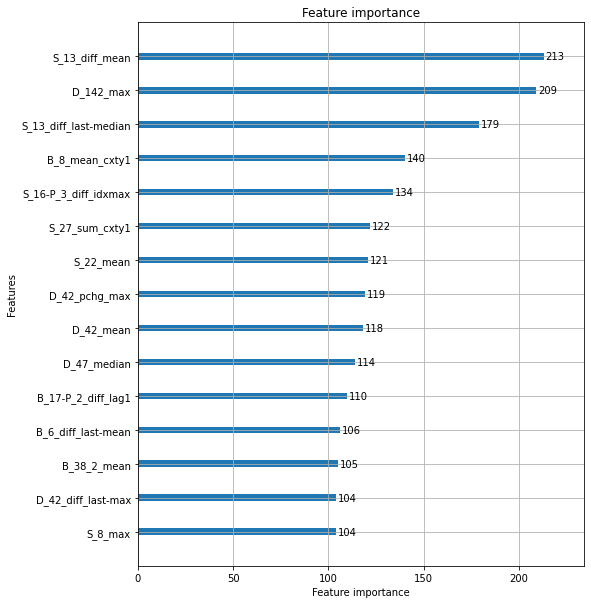

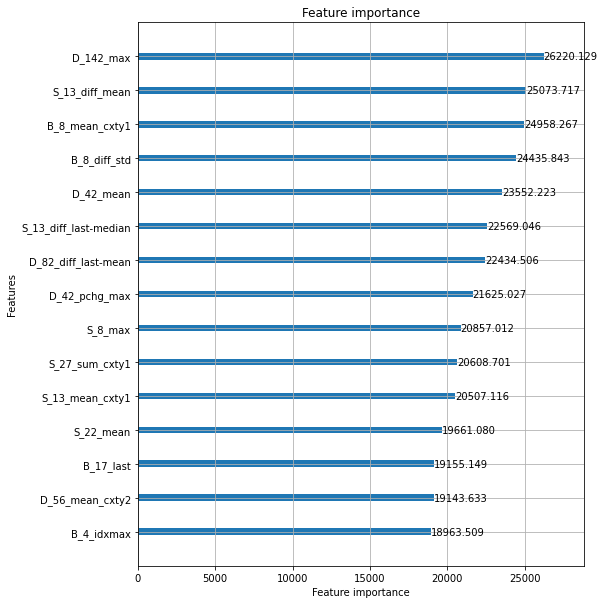

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.752448


[100]	valid_0's auc: 0.784678


[150]	valid_0's auc: 0.804303


[200]	valid_0's auc: 0.819321


[250]	valid_0's auc: 0.830707


[300]	valid_0's auc: 0.840537


[350]	valid_0's auc: 0.846131


[400]	valid_0's auc: 0.852195


[450]	valid_0's auc: 0.857691


[500]	valid_0's auc: 0.861373
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.861373


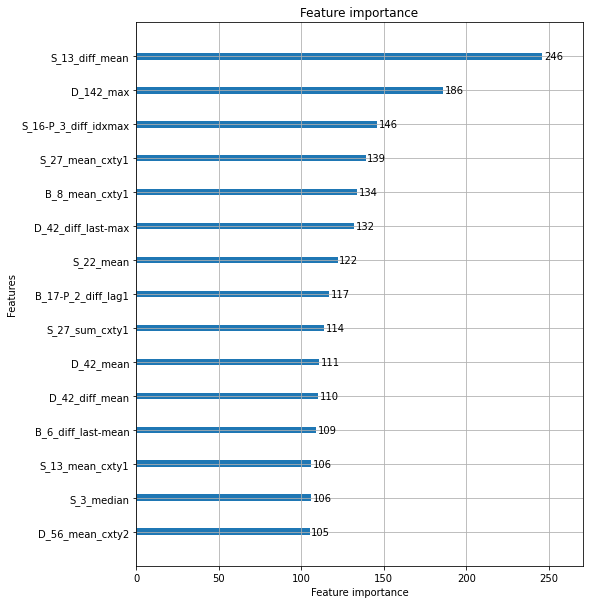

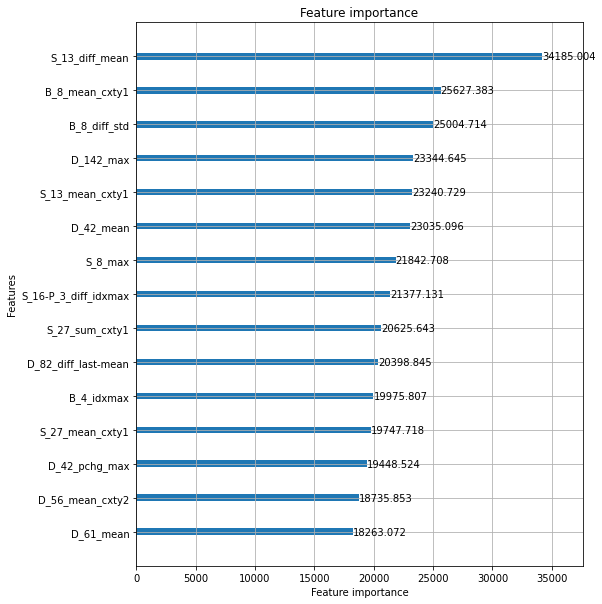

removed: ['S_13_diff_mean', 'B_8_mean_cxty1', 'D_142_max', 'B_8_diff_std', 'D_42_mean']
Elapsed time: 2.7034447034200033 min.
----------------------------------------------------------------------------------------------------
ITER: 33/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.756519


[100]	valid_0's auc: 0.785819


[150]	valid_0's auc: 0.805124


[200]	valid_0's auc: 0.820101


[250]	valid_0's auc: 0.831026


[300]	valid_0's auc: 0.839313


[350]	valid_0's auc: 0.845671


[400]	valid_0's auc: 0.85131


[450]	valid_0's auc: 0.856264


[500]	valid_0's auc: 0.860464
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.860464


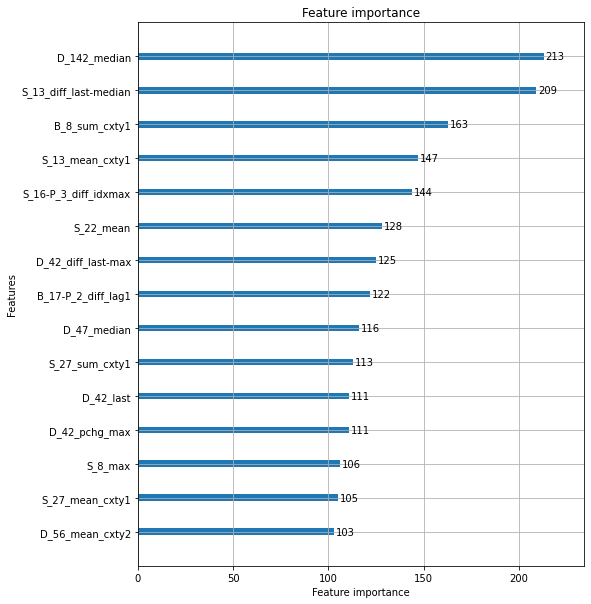

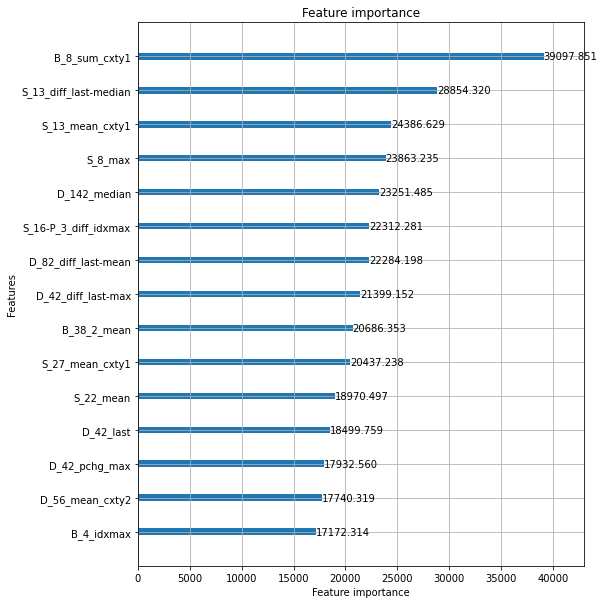

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.755315


[100]	valid_0's auc: 0.784266


[150]	valid_0's auc: 0.803596


[200]	valid_0's auc: 0.818718


[250]	valid_0's auc: 0.83007


[300]	valid_0's auc: 0.838637


[350]	valid_0's auc: 0.844951


[400]	valid_0's auc: 0.851101


[450]	valid_0's auc: 0.855808


[500]	valid_0's auc: 0.860246
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.860246


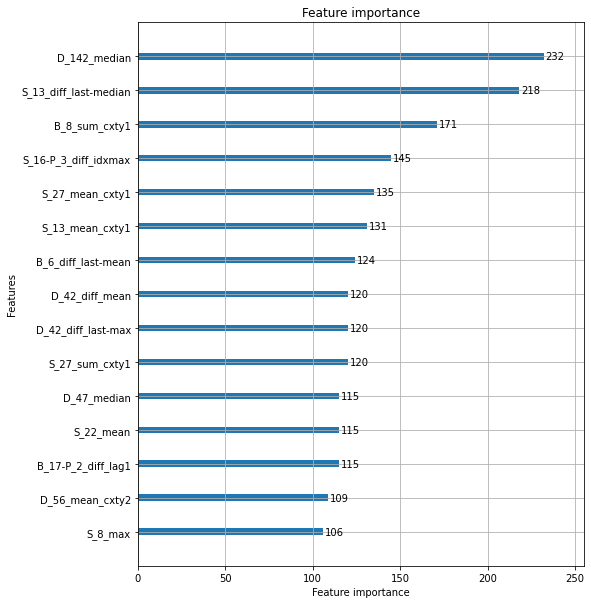

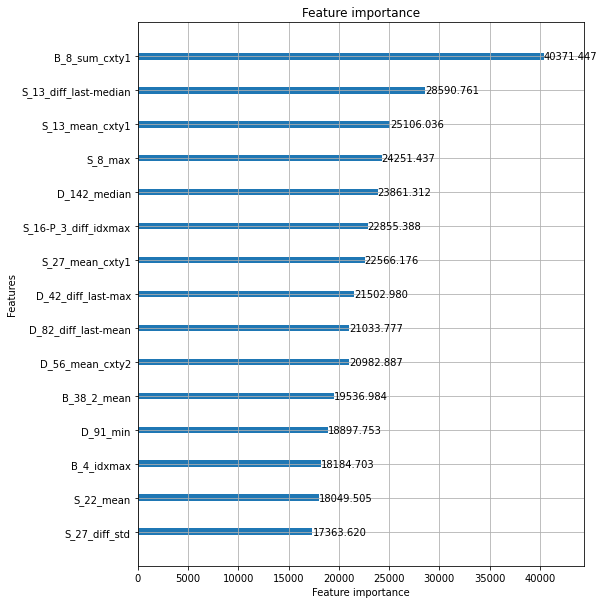

removed: ['B_8_sum_cxty1', 'S_13_diff_last-median', 'S_13_mean_cxty1', 'S_8_max', 'D_142_median']
Elapsed time: 2.695566634337107 min.
----------------------------------------------------------------------------------------------------
ITER: 34/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.750022


[100]	valid_0's auc: 0.777798


[150]	valid_0's auc: 0.796374


[200]	valid_0's auc: 0.812201


[250]	valid_0's auc: 0.822737


[300]	valid_0's auc: 0.830885


[350]	valid_0's auc: 0.83788


[400]	valid_0's auc: 0.843655


[450]	valid_0's auc: 0.848923


[500]	valid_0's auc: 0.85338
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.85338


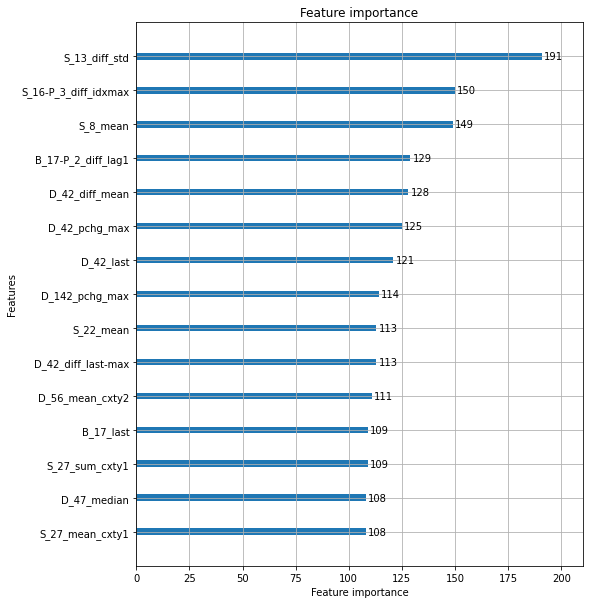

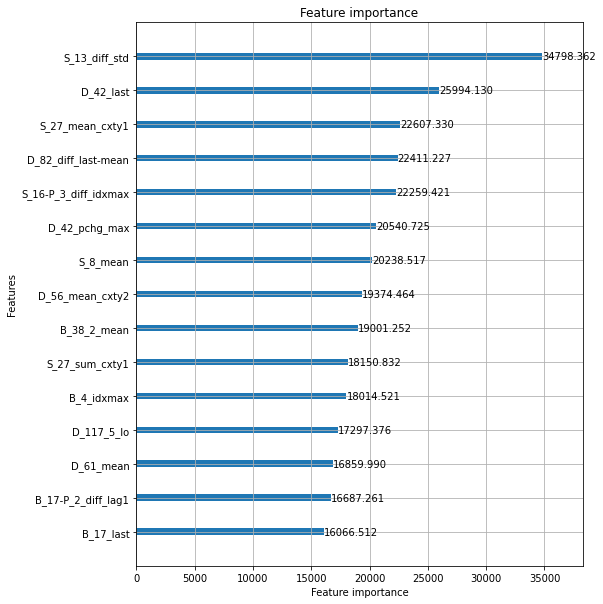

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.749643


[100]	valid_0's auc: 0.777879


[150]	valid_0's auc: 0.796999


[200]	valid_0's auc: 0.812156


[250]	valid_0's auc: 0.822811


[300]	valid_0's auc: 0.830362


[350]	valid_0's auc: 0.837709


[400]	valid_0's auc: 0.8432


[450]	valid_0's auc: 0.847935


[500]	valid_0's auc: 0.852368
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.852368


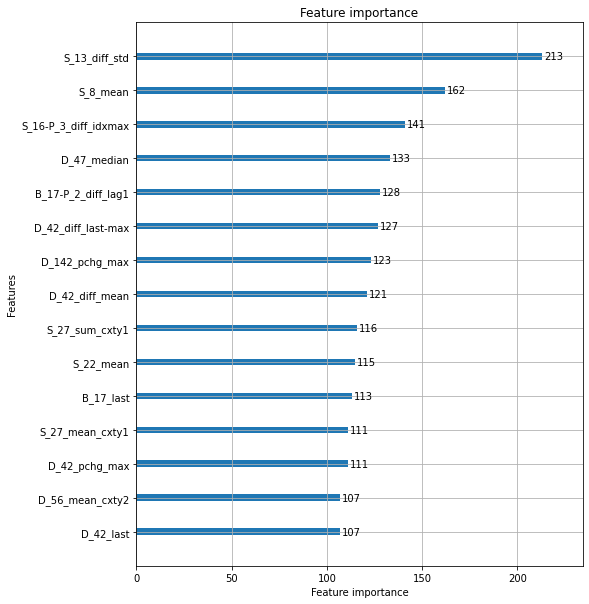

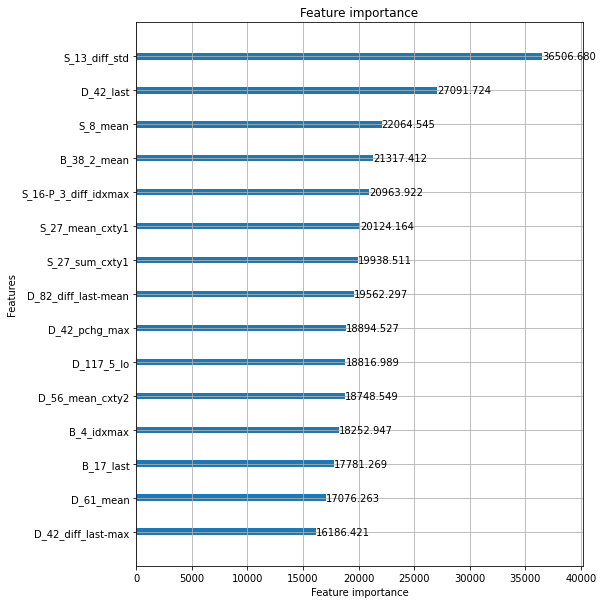

removed: ['S_13_diff_std', 'D_42_last', 'S_16-P_3_diff_idxmax', 'S_27_mean_cxty1', 'S_8_mean']
Elapsed time: 2.6495762268702188 min.
----------------------------------------------------------------------------------------------------
ITER: 35/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.745914


[100]	valid_0's auc: 0.774685


[150]	valid_0's auc: 0.795242


[200]	valid_0's auc: 0.809569


[250]	valid_0's auc: 0.819812


[300]	valid_0's auc: 0.82806


[350]	valid_0's auc: 0.835851


[400]	valid_0's auc: 0.841853


[450]	valid_0's auc: 0.846334


[500]	valid_0's auc: 0.850611
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.850611


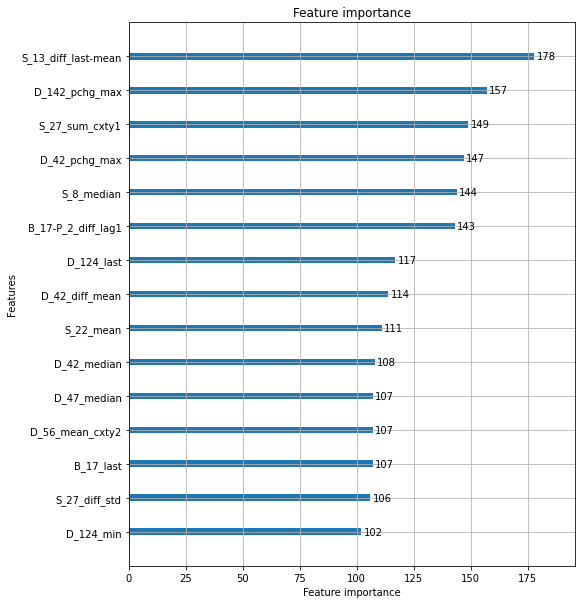

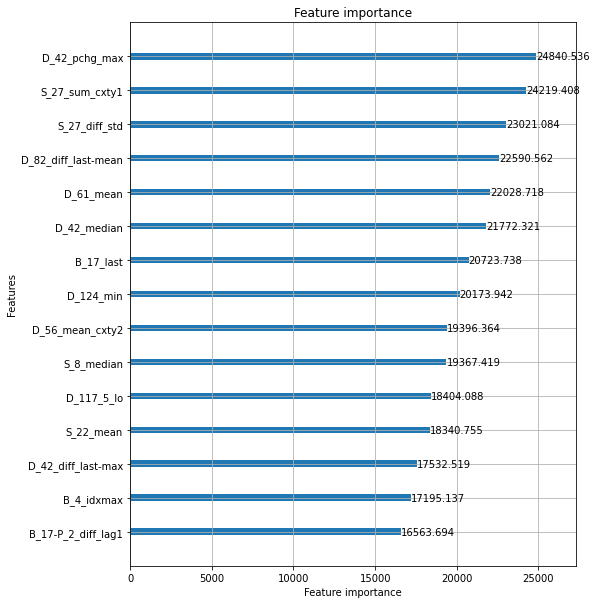

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.744885


[100]	valid_0's auc: 0.776059


[150]	valid_0's auc: 0.795152


[200]	valid_0's auc: 0.808877


[250]	valid_0's auc: 0.818258


[300]	valid_0's auc: 0.827212


[350]	valid_0's auc: 0.834442


[400]	valid_0's auc: 0.840152


[450]	valid_0's auc: 0.844763


[500]	valid_0's auc: 0.849606
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.849606


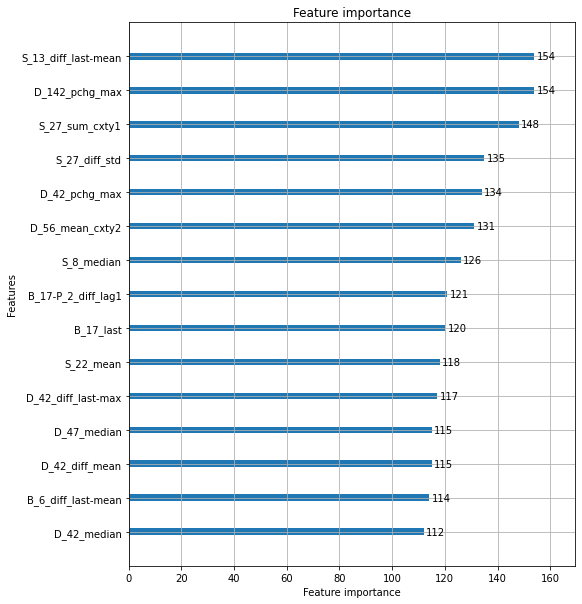

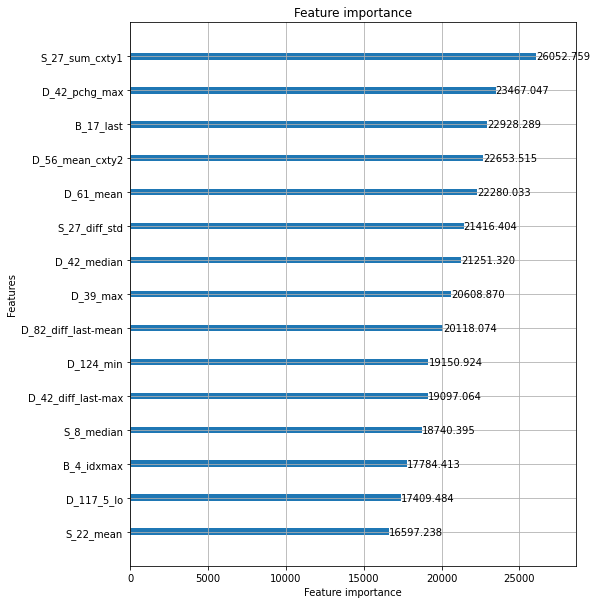

removed: ['S_27_sum_cxty1', 'D_42_pchg_max', 'S_27_diff_std', 'D_61_mean', 'B_17_last']
Elapsed time: 2.6873950163523355 min.
----------------------------------------------------------------------------------------------------
ITER: 36/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.745296


[100]	valid_0's auc: 0.775179


[150]	valid_0's auc: 0.793219


[200]	valid_0's auc: 0.805477


[250]	valid_0's auc: 0.816338


[300]	valid_0's auc: 0.825892


[350]	valid_0's auc: 0.832246


[400]	valid_0's auc: 0.838812


[450]	valid_0's auc: 0.843389


[500]	valid_0's auc: 0.848109
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.848109


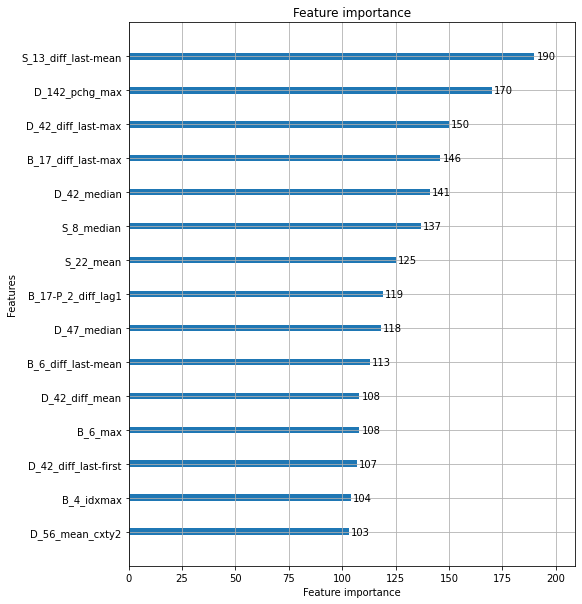

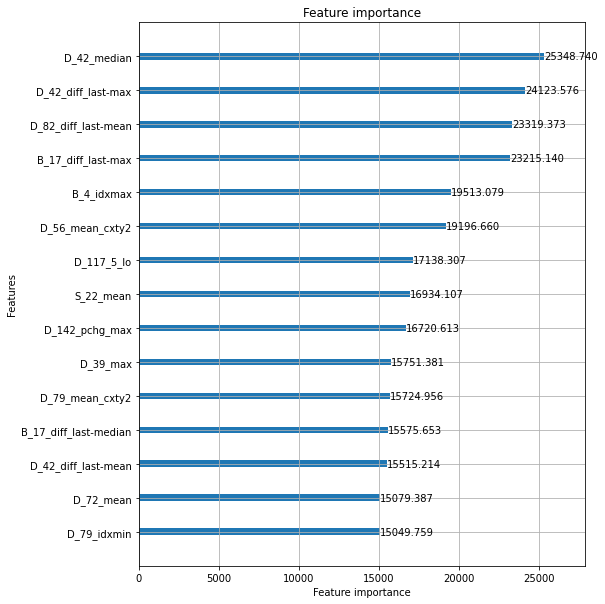

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.744128


[100]	valid_0's auc: 0.772414


[150]	valid_0's auc: 0.791591


[200]	valid_0's auc: 0.805719


[250]	valid_0's auc: 0.816159


[300]	valid_0's auc: 0.824286


[350]	valid_0's auc: 0.831513


[400]	valid_0's auc: 0.837355


[450]	valid_0's auc: 0.841876


[500]	valid_0's auc: 0.846548
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.846548


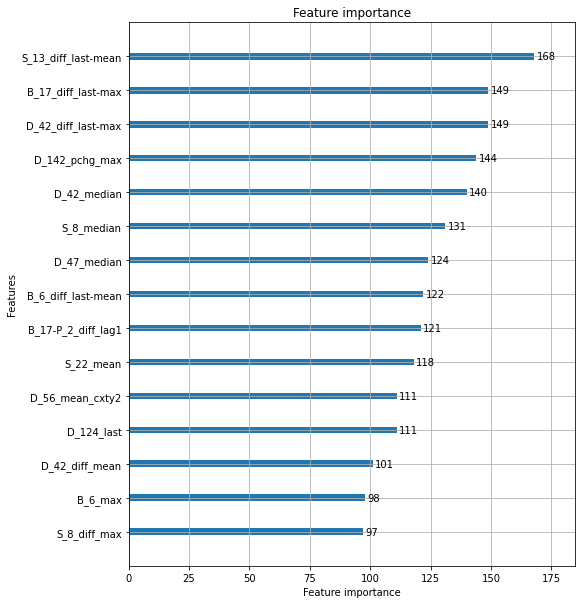

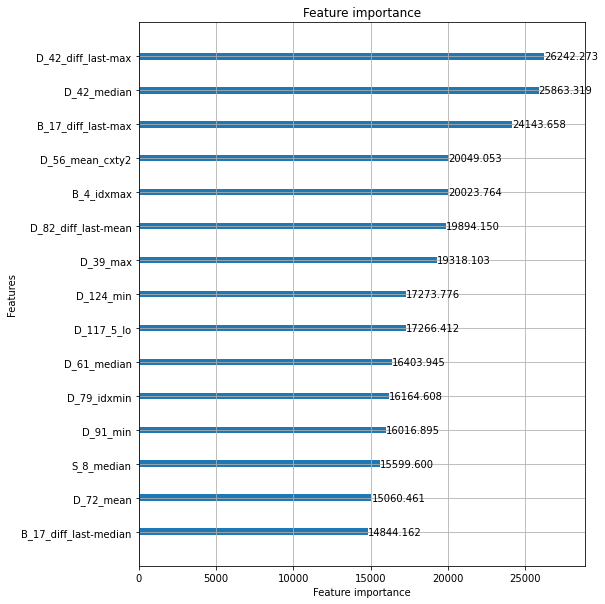

removed: ['D_42_median', 'D_42_diff_last-max', 'B_17_diff_last-max', 'D_82_diff_last-mean', 'B_4_idxmax']
Elapsed time: 2.6319900075594584 min.
----------------------------------------------------------------------------------------------------
ITER: 37/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.740872


[100]	valid_0's auc: 0.770457


[150]	valid_0's auc: 0.789316


[200]	valid_0's auc: 0.802943


[250]	valid_0's auc: 0.81367


[300]	valid_0's auc: 0.821664


[350]	valid_0's auc: 0.828621


[400]	valid_0's auc: 0.834292


[450]	valid_0's auc: 0.839729


[500]	valid_0's auc: 0.844116
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.844116


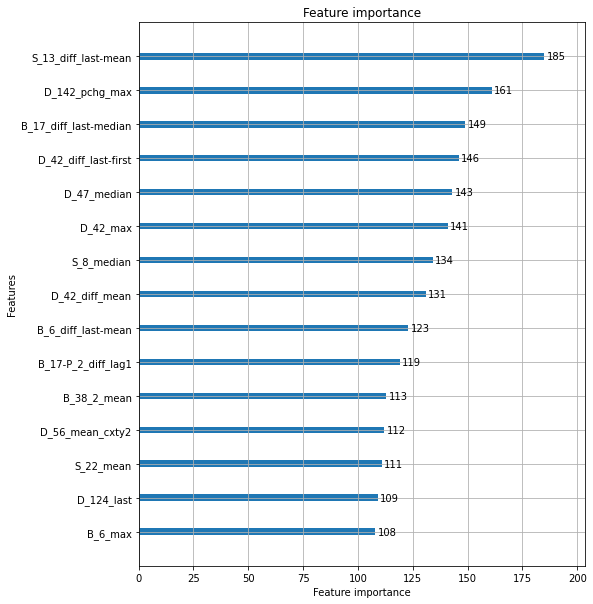

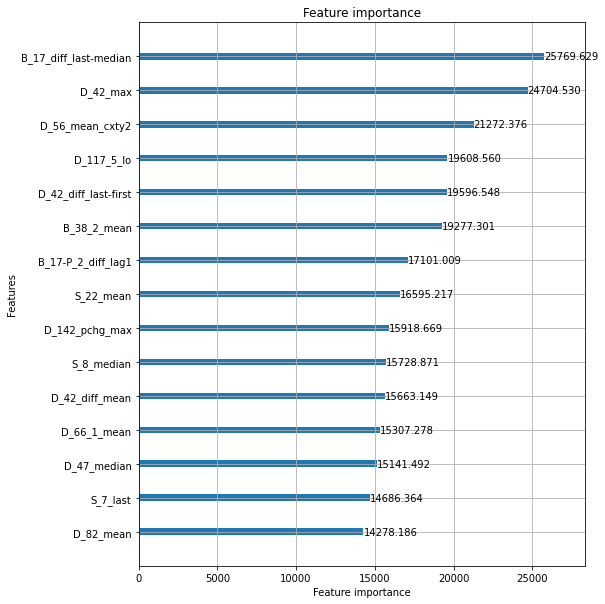

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.739919


[100]	valid_0's auc: 0.770683


[150]	valid_0's auc: 0.788612


[200]	valid_0's auc: 0.802204


[250]	valid_0's auc: 0.813583


[300]	valid_0's auc: 0.821211


[350]	valid_0's auc: 0.828789


[400]	valid_0's auc: 0.834689


[450]	valid_0's auc: 0.839509


[500]	valid_0's auc: 0.843792
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.843792


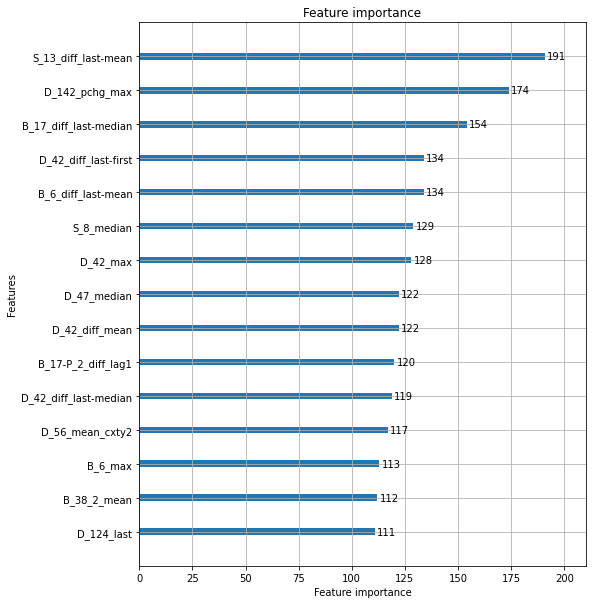

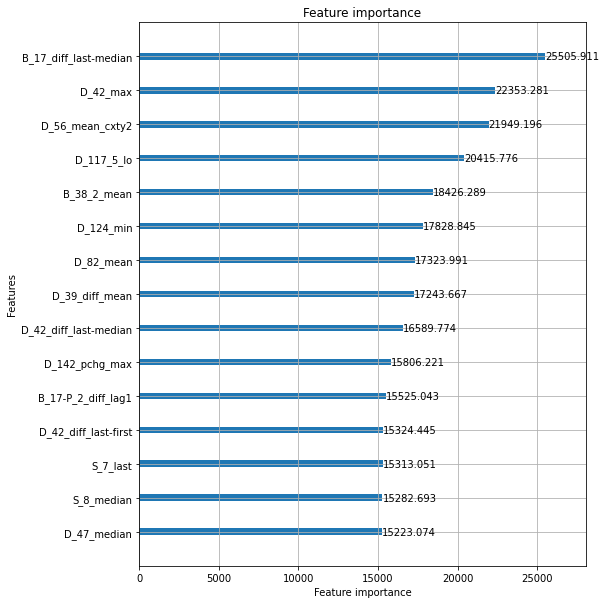

removed: ['B_17_diff_last-median', 'D_42_max', 'D_56_mean_cxty2', 'D_117_5_lo', 'B_38_2_mean']
Elapsed time: 2.6541786670684813 min.
----------------------------------------------------------------------------------------------------
ITER: 38/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.734097


[100]	valid_0's auc: 0.764058


[150]	valid_0's auc: 0.784164


[200]	valid_0's auc: 0.79693


[250]	valid_0's auc: 0.807241


[300]	valid_0's auc: 0.816699


[350]	valid_0's auc: 0.823915


[400]	valid_0's auc: 0.8298


[450]	valid_0's auc: 0.834595


[500]	valid_0's auc: 0.838976
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.838976


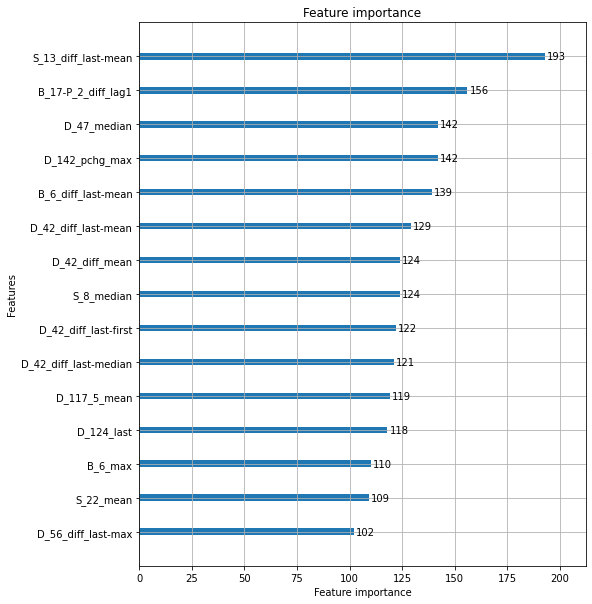

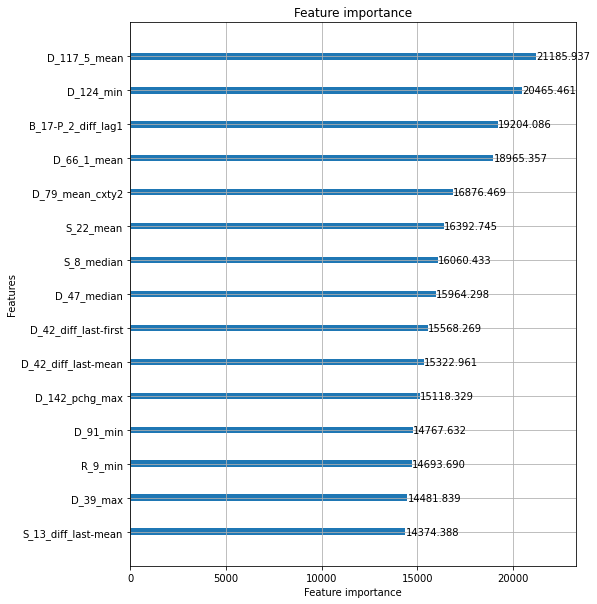

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.733871


[100]	valid_0's auc: 0.762926


[150]	valid_0's auc: 0.784898


[200]	valid_0's auc: 0.798508


[250]	valid_0's auc: 0.80958


[300]	valid_0's auc: 0.817529


[350]	valid_0's auc: 0.824153


[400]	valid_0's auc: 0.829968


[450]	valid_0's auc: 0.834784


[500]	valid_0's auc: 0.839504
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.839504


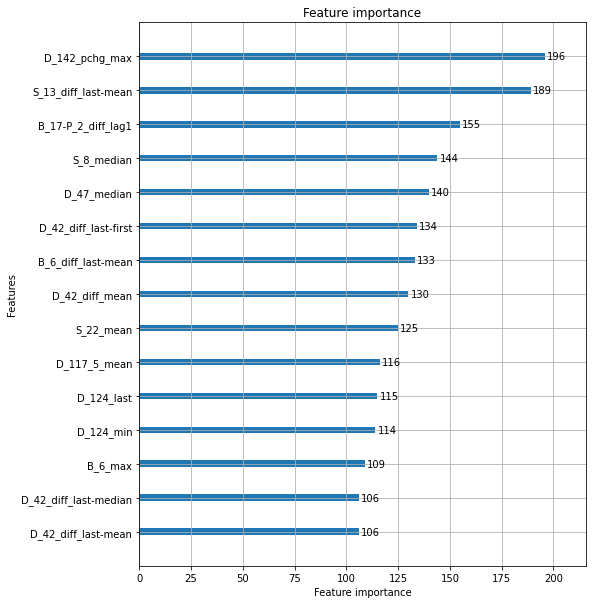

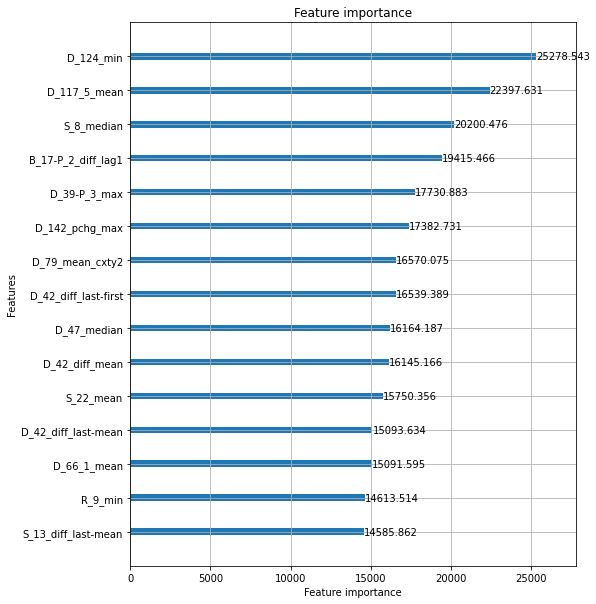

removed: ['D_124_min', 'D_117_5_mean', 'B_17-P_2_diff_lag1', 'S_8_median', 'D_66_1_mean']
Elapsed time: 2.614757978916168 min.
----------------------------------------------------------------------------------------------------
ITER: 39/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.724675


[100]	valid_0's auc: 0.757063


[150]	valid_0's auc: 0.778101


[200]	valid_0's auc: 0.791686


[250]	valid_0's auc: 0.802974


[300]	valid_0's auc: 0.81139


[350]	valid_0's auc: 0.81834


[400]	valid_0's auc: 0.825006


[450]	valid_0's auc: 0.829701


[500]	valid_0's auc: 0.83413
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.83413


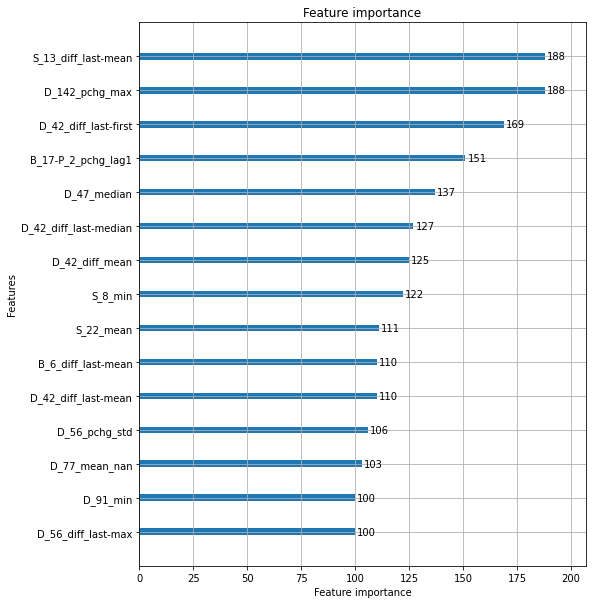

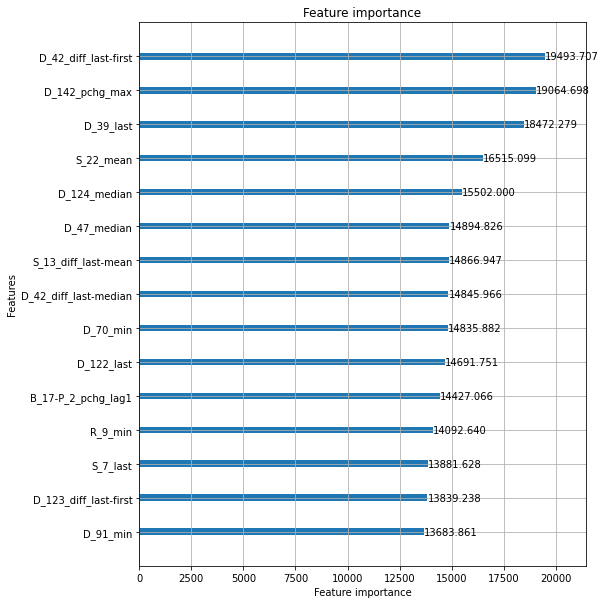

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.72524


[100]	valid_0's auc: 0.756583


[150]	valid_0's auc: 0.776488


[200]	valid_0's auc: 0.791296


[250]	valid_0's auc: 0.801682


[300]	valid_0's auc: 0.810387


[350]	valid_0's auc: 0.816794


[400]	valid_0's auc: 0.823947


[450]	valid_0's auc: 0.828723


[500]	valid_0's auc: 0.833165
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.833165


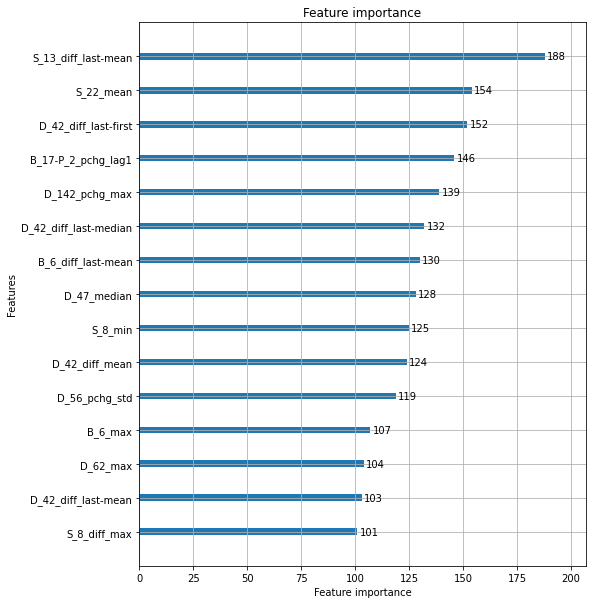

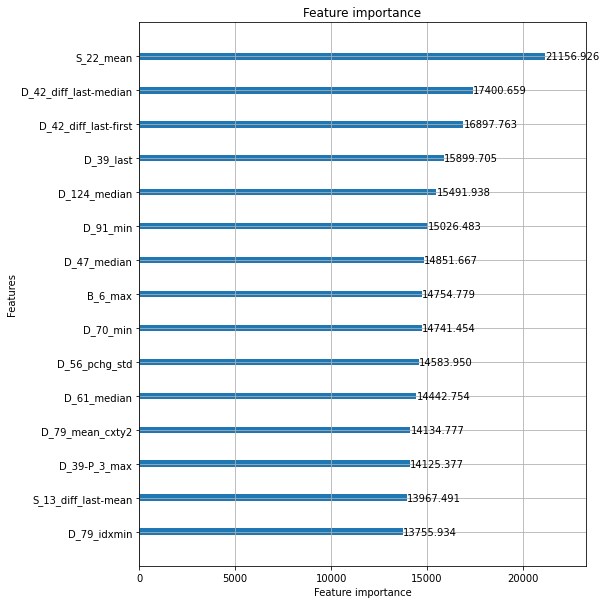

removed: ['S_22_mean', 'D_42_diff_last-first', 'D_39_last', 'D_42_diff_last-median', 'D_142_pchg_max']
Elapsed time: 2.6256736397743223 min.
----------------------------------------------------------------------------------------------------
ITER: 40/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.723225


[100]	valid_0's auc: 0.756027


[150]	valid_0's auc: 0.777439


[200]	valid_0's auc: 0.790398


[250]	valid_0's auc: 0.800649


[300]	valid_0's auc: 0.809597


[350]	valid_0's auc: 0.816008


[400]	valid_0's auc: 0.821527


[450]	valid_0's auc: 0.82659


[500]	valid_0's auc: 0.830702
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.830702


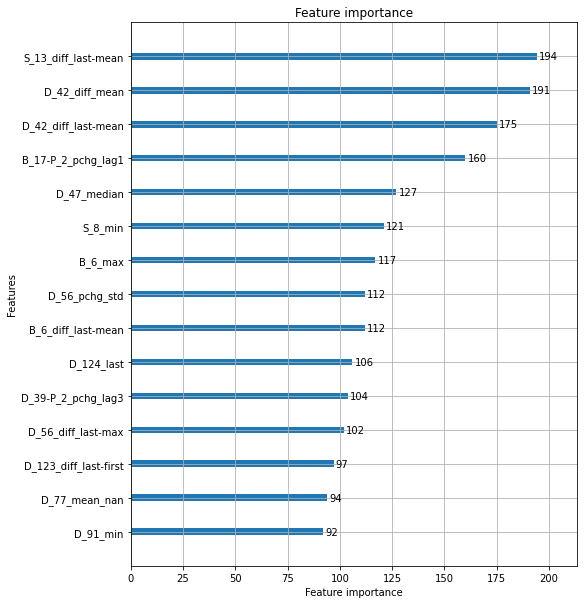

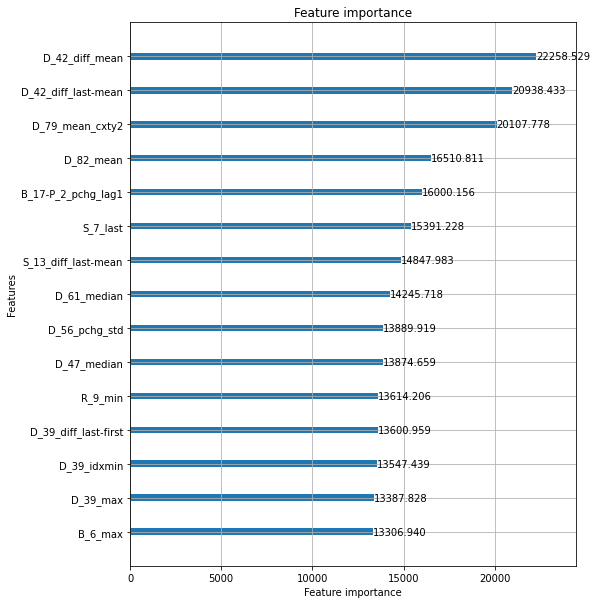

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.72213


[100]	valid_0's auc: 0.755499


[150]	valid_0's auc: 0.776622


[200]	valid_0's auc: 0.78958


[250]	valid_0's auc: 0.799658


[300]	valid_0's auc: 0.807725


[350]	valid_0's auc: 0.814478


[400]	valid_0's auc: 0.820357


[450]	valid_0's auc: 0.825874


[500]	valid_0's auc: 0.830307
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.830307


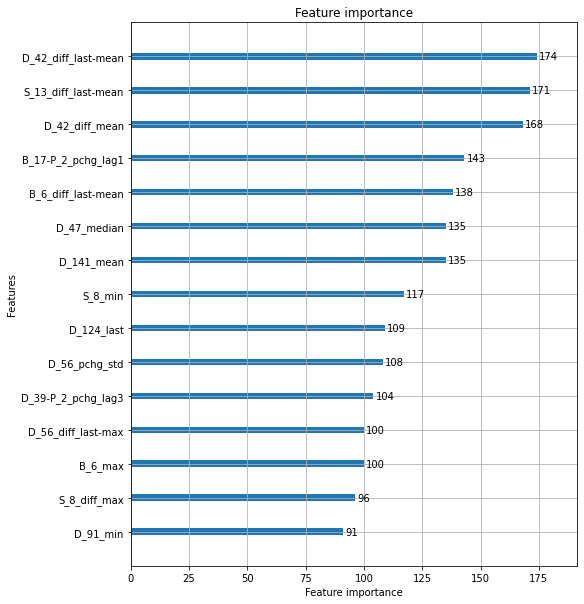

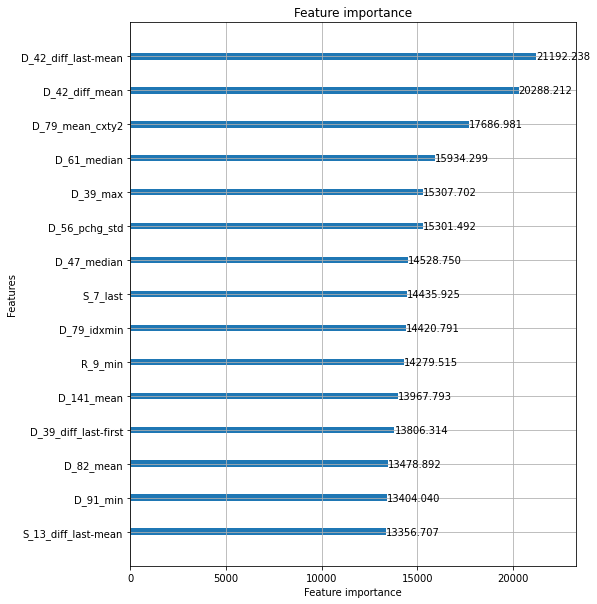

removed: ['D_42_diff_mean', 'D_42_diff_last-mean', 'D_79_mean_cxty2', 'D_61_median', 'D_82_mean']
Elapsed time: 2.5939056475957236 min.
----------------------------------------------------------------------------------------------------
ITER: 41/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.717695


[100]	valid_0's auc: 0.754305


[150]	valid_0's auc: 0.773946


[200]	valid_0's auc: 0.787561


[250]	valid_0's auc: 0.797962


[300]	valid_0's auc: 0.806471


[350]	valid_0's auc: 0.812915


[400]	valid_0's auc: 0.818724


[450]	valid_0's auc: 0.824186


[500]	valid_0's auc: 0.828754
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.828754


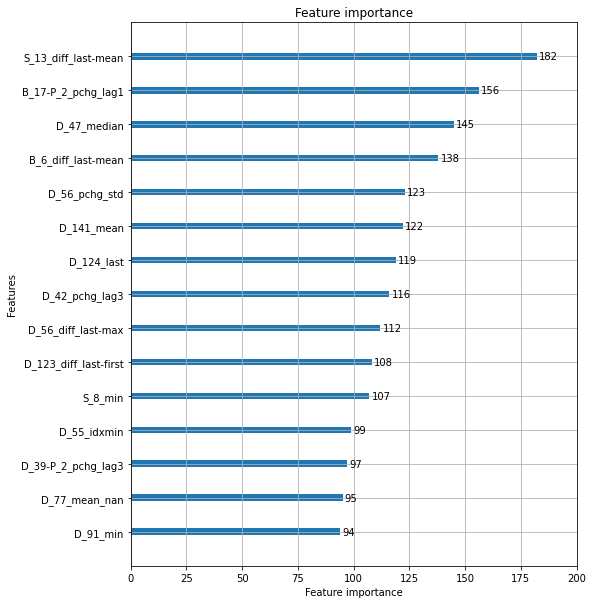

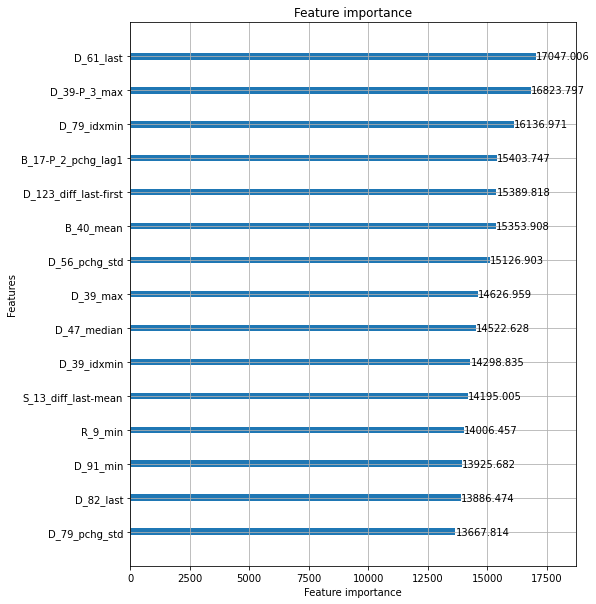

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.717506


[100]	valid_0's auc: 0.754374


[150]	valid_0's auc: 0.773302


[200]	valid_0's auc: 0.786752


[250]	valid_0's auc: 0.798953


[300]	valid_0's auc: 0.807053


[350]	valid_0's auc: 0.813482


[400]	valid_0's auc: 0.819922


[450]	valid_0's auc: 0.824566


[500]	valid_0's auc: 0.829097
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.829097


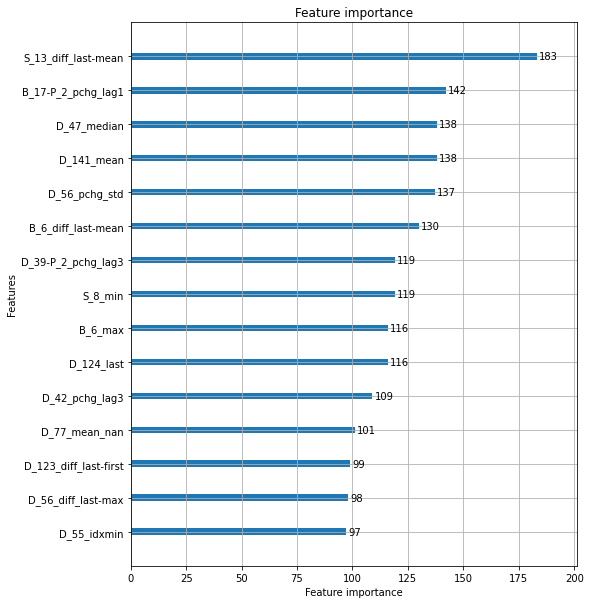

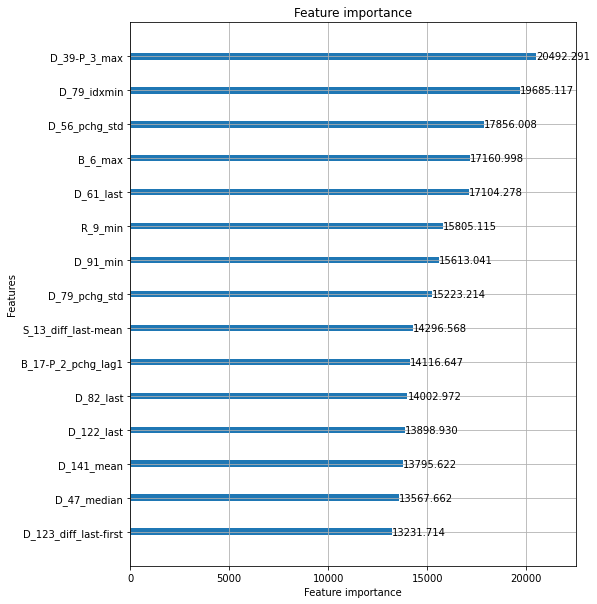

removed: ['D_39-P_3_max', 'D_79_idxmin', 'D_61_last', 'D_56_pchg_std', 'B_6_max']
Elapsed time: 2.5881362239519756 min.
----------------------------------------------------------------------------------------------------
ITER: 42/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.718891


[100]	valid_0's auc: 0.751841


[150]	valid_0's auc: 0.771889


[200]	valid_0's auc: 0.78663


[250]	valid_0's auc: 0.797773


[300]	valid_0's auc: 0.806305


[350]	valid_0's auc: 0.813208


[400]	valid_0's auc: 0.819307


[450]	valid_0's auc: 0.824366


[500]	valid_0's auc: 0.829222
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.829222


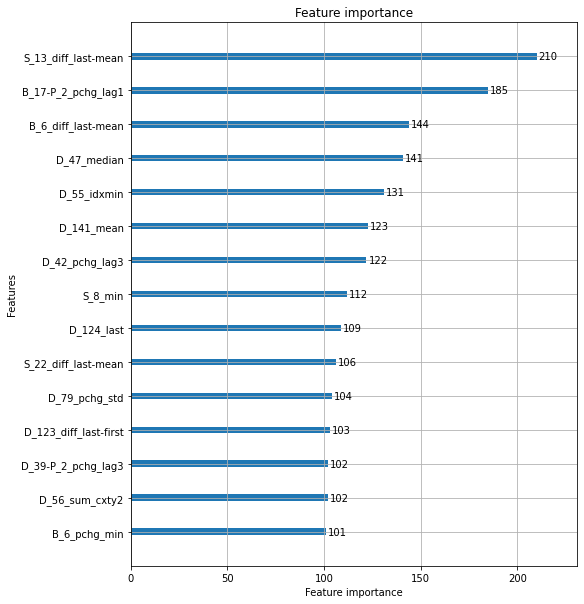

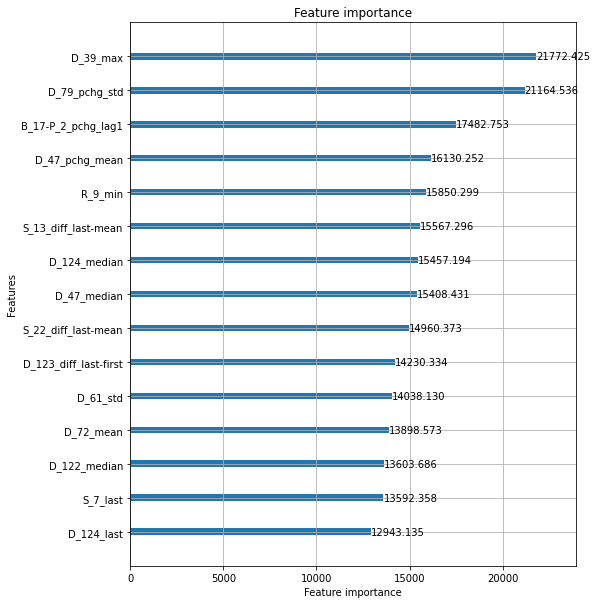

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.716162


[100]	valid_0's auc: 0.751505


[150]	valid_0's auc: 0.771297


[200]	valid_0's auc: 0.784722


[250]	valid_0's auc: 0.796974


[300]	valid_0's auc: 0.80509


[350]	valid_0's auc: 0.812133


[400]	valid_0's auc: 0.818519


[450]	valid_0's auc: 0.823596


[500]	valid_0's auc: 0.828639
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.828639


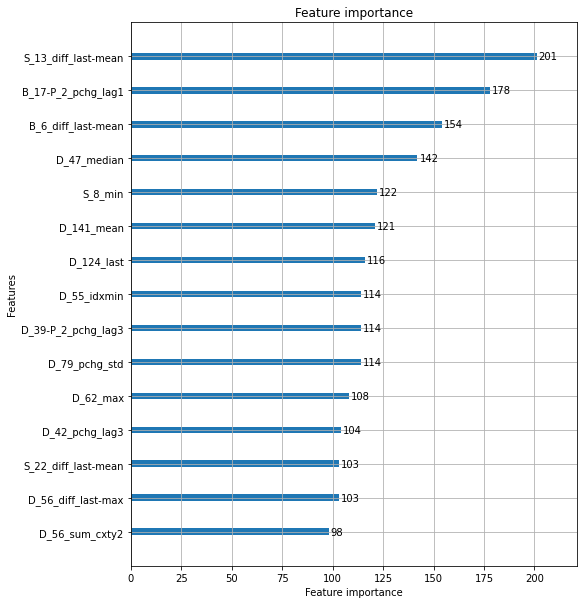

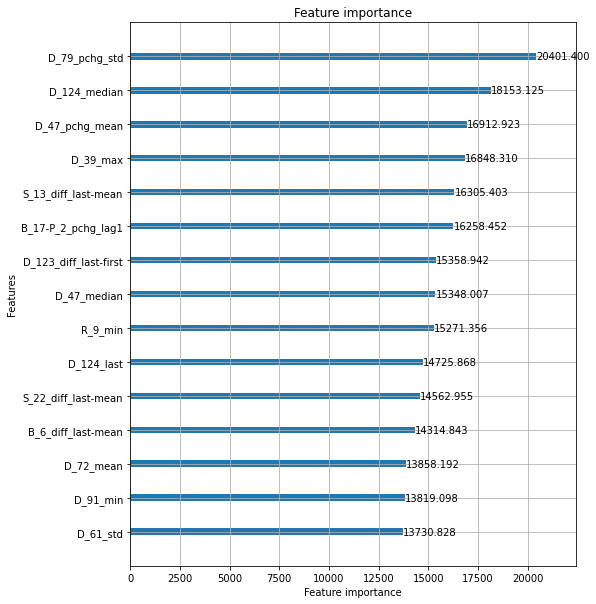

removed: ['D_79_pchg_std', 'D_39_max', 'B_17-P_2_pchg_lag1', 'D_124_median', 'D_47_pchg_mean']
Elapsed time: 2.581703948974609 min.
----------------------------------------------------------------------------------------------------
ITER: 43/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.710596


[100]	valid_0's auc: 0.745879


[150]	valid_0's auc: 0.767834


[200]	valid_0's auc: 0.781146


[250]	valid_0's auc: 0.792184


[300]	valid_0's auc: 0.800282


[350]	valid_0's auc: 0.807578


[400]	valid_0's auc: 0.813352


[450]	valid_0's auc: 0.81843


[500]	valid_0's auc: 0.822745
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.822745


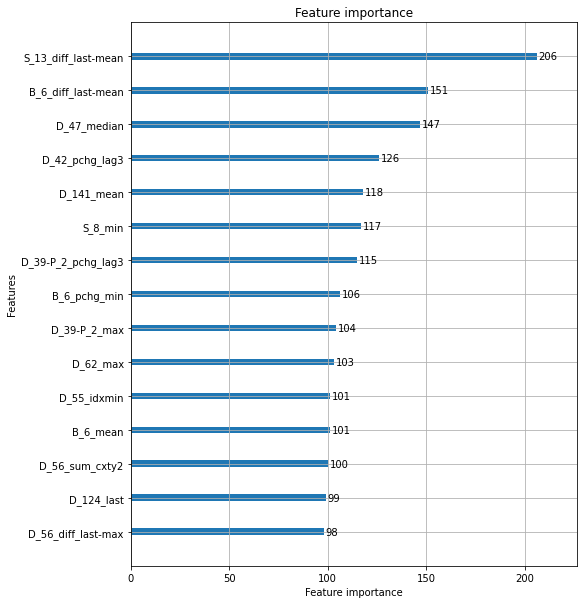

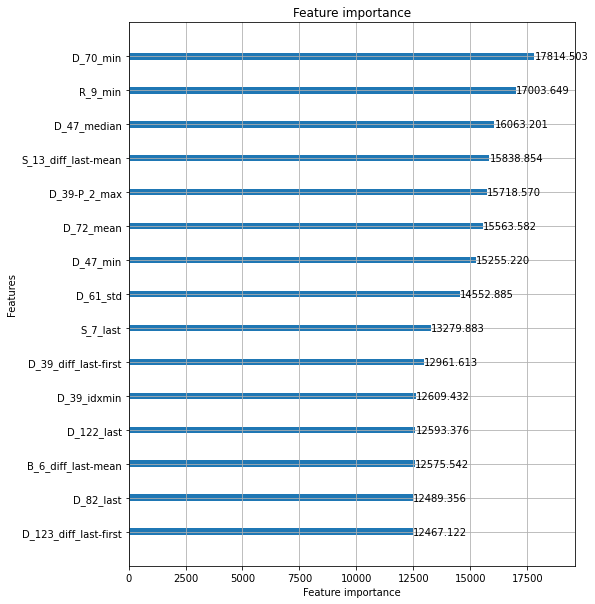

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.710854


[100]	valid_0's auc: 0.74403


[150]	valid_0's auc: 0.764616


[200]	valid_0's auc: 0.778769


[250]	valid_0's auc: 0.789513


[300]	valid_0's auc: 0.798234


[350]	valid_0's auc: 0.804988


[400]	valid_0's auc: 0.810458


[450]	valid_0's auc: 0.815626


[500]	valid_0's auc: 0.820718
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.820718


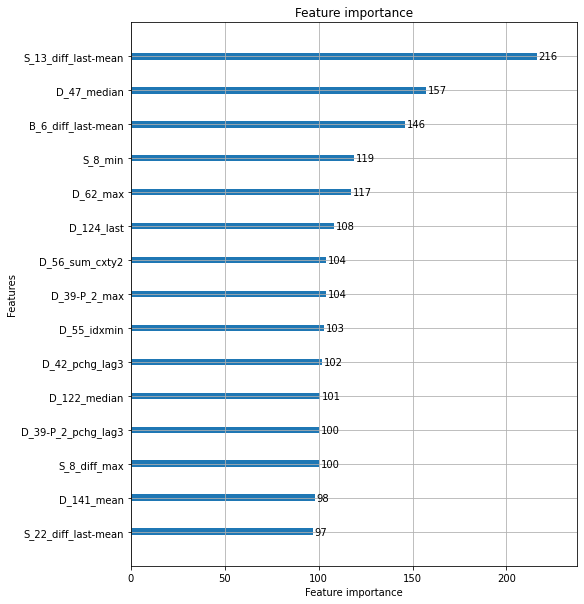

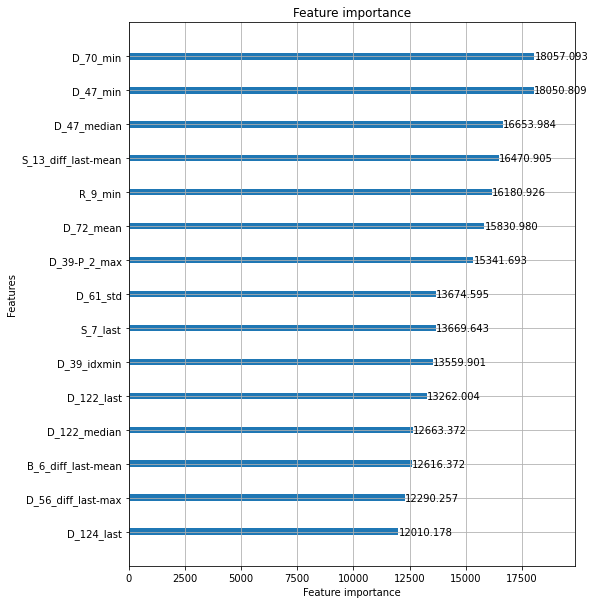

removed: ['D_70_min', 'D_47_min', 'R_9_min', 'D_47_median', 'S_13_diff_last-mean']
Elapsed time: 2.573879289627075 min.
----------------------------------------------------------------------------------------------------
ITER: 44/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.710891


[100]	valid_0's auc: 0.742153


[150]	valid_0's auc: 0.761212


[200]	valid_0's auc: 0.775894


[250]	valid_0's auc: 0.786626


[300]	valid_0's auc: 0.796437


[350]	valid_0's auc: 0.802754


[400]	valid_0's auc: 0.809157


[450]	valid_0's auc: 0.813452


[500]	valid_0's auc: 0.817916
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.817916


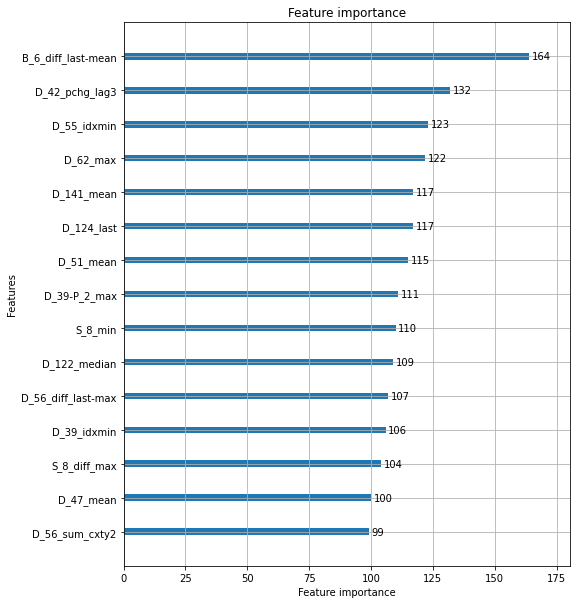

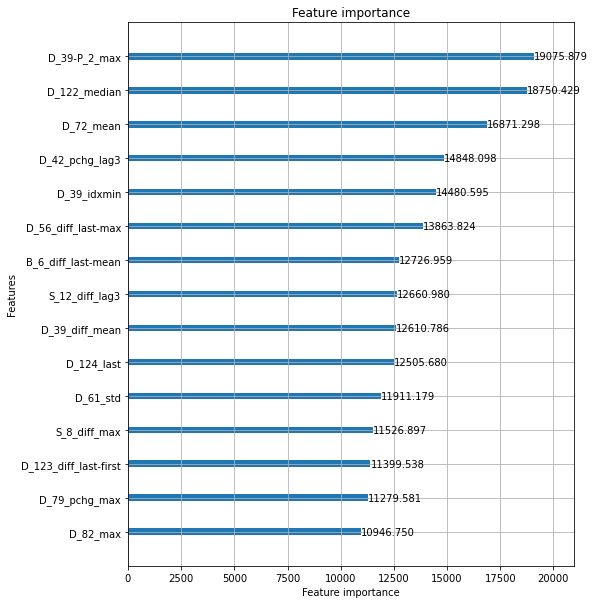

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.710922


[100]	valid_0's auc: 0.741009


[150]	valid_0's auc: 0.762099


[200]	valid_0's auc: 0.776655


[250]	valid_0's auc: 0.78795


[300]	valid_0's auc: 0.795785


[350]	valid_0's auc: 0.8026


[400]	valid_0's auc: 0.808572


[450]	valid_0's auc: 0.813782


[500]	valid_0's auc: 0.818271
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.818271


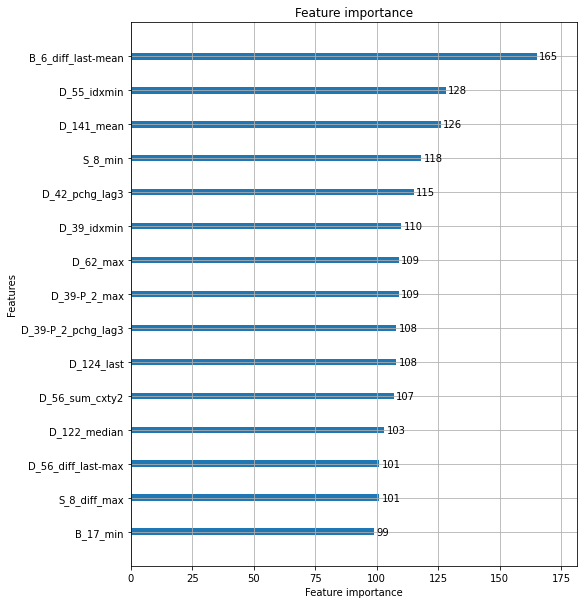

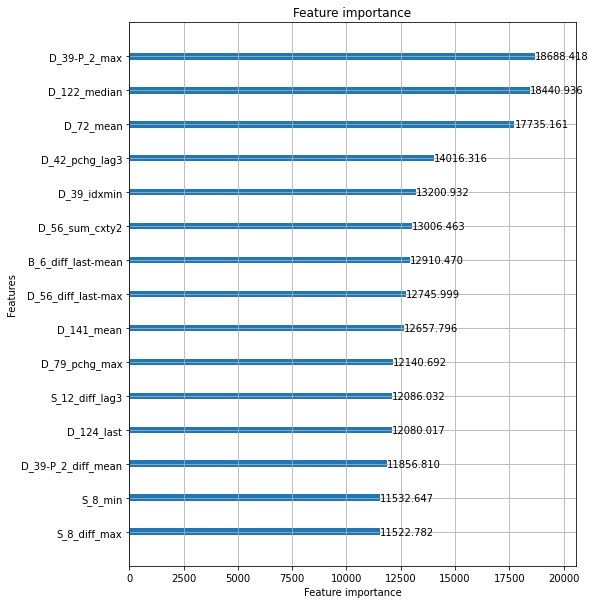

removed: ['D_39-P_2_max', 'D_122_median', 'D_72_mean', 'D_42_pchg_lag3', 'D_39_idxmin']
Elapsed time: 2.5563549041748046 min.
----------------------------------------------------------------------------------------------------
ITER: 45/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.702689


[100]	valid_0's auc: 0.734227


[150]	valid_0's auc: 0.753795


[200]	valid_0's auc: 0.769693


[250]	valid_0's auc: 0.779986


[300]	valid_0's auc: 0.787796


[350]	valid_0's auc: 0.794383


[400]	valid_0's auc: 0.800602


[450]	valid_0's auc: 0.80605


[500]	valid_0's auc: 0.811084
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.811084


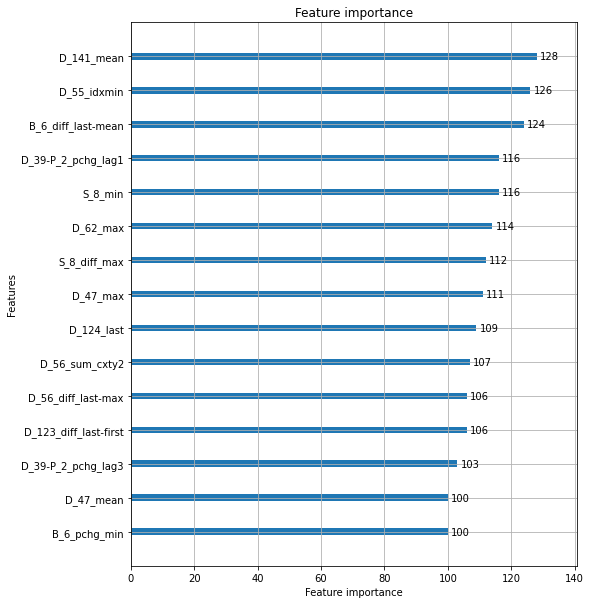

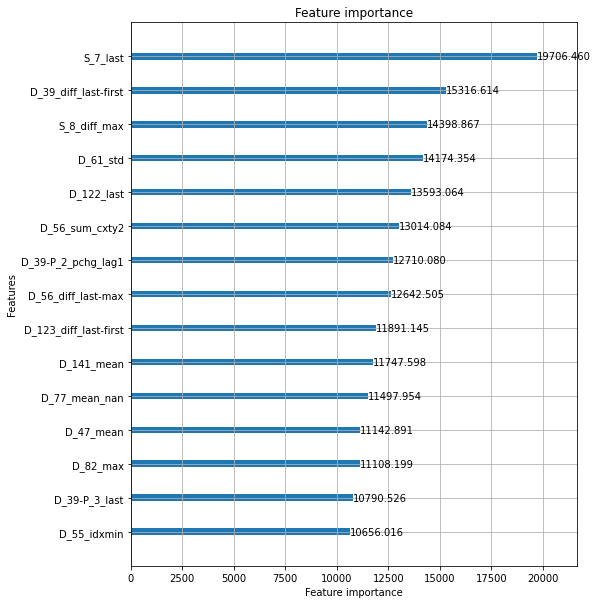

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.701499


[100]	valid_0's auc: 0.733003


[150]	valid_0's auc: 0.753693


[200]	valid_0's auc: 0.768448


[250]	valid_0's auc: 0.778829


[300]	valid_0's auc: 0.787468


[350]	valid_0's auc: 0.794309


[400]	valid_0's auc: 0.800407


[450]	valid_0's auc: 0.805733


[500]	valid_0's auc: 0.810816
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.810816


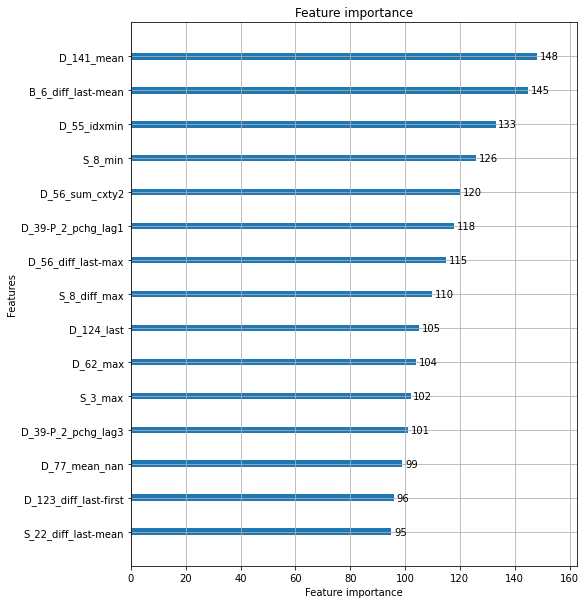

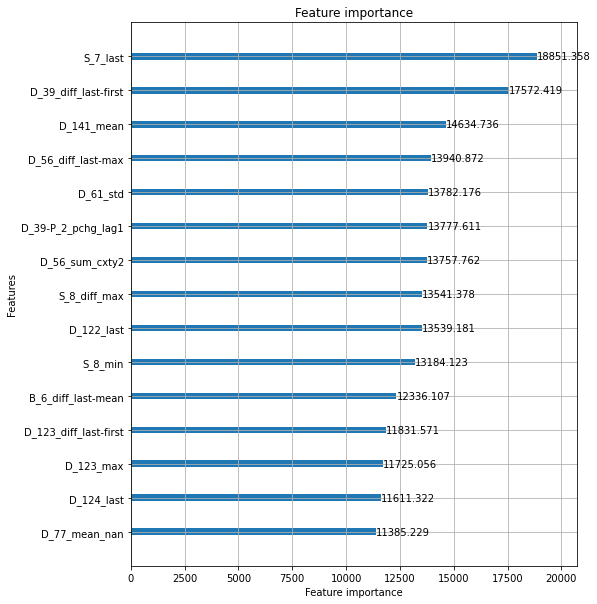

removed: ['S_7_last', 'D_39_diff_last-first', 'D_61_std', 'S_8_diff_max', 'D_122_last']
Elapsed time: 2.5562763690948485 min.
----------------------------------------------------------------------------------------------------
ITER: 46/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.707227


[100]	valid_0's auc: 0.734952


[150]	valid_0's auc: 0.756521


[200]	valid_0's auc: 0.768739


[250]	valid_0's auc: 0.77908


[300]	valid_0's auc: 0.787056


[350]	valid_0's auc: 0.794302


[400]	valid_0's auc: 0.800609


[450]	valid_0's auc: 0.805688


[500]	valid_0's auc: 0.810511
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.810511


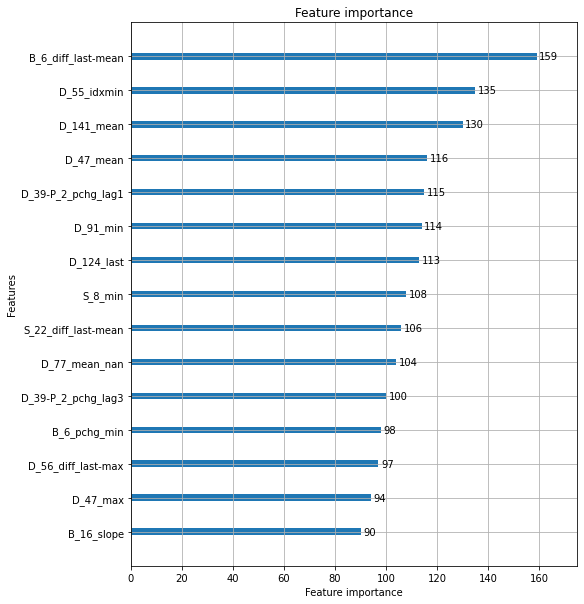

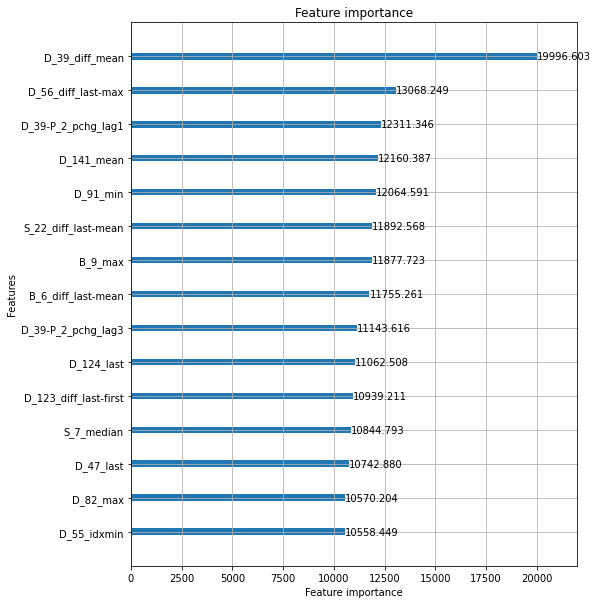

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.704279


[100]	valid_0's auc: 0.735394


[150]	valid_0's auc: 0.755409


[200]	valid_0's auc: 0.767069


[250]	valid_0's auc: 0.778561


[300]	valid_0's auc: 0.786963


[350]	valid_0's auc: 0.79317


[400]	valid_0's auc: 0.799877


[450]	valid_0's auc: 0.804901


[500]	valid_0's auc: 0.809659
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.809659


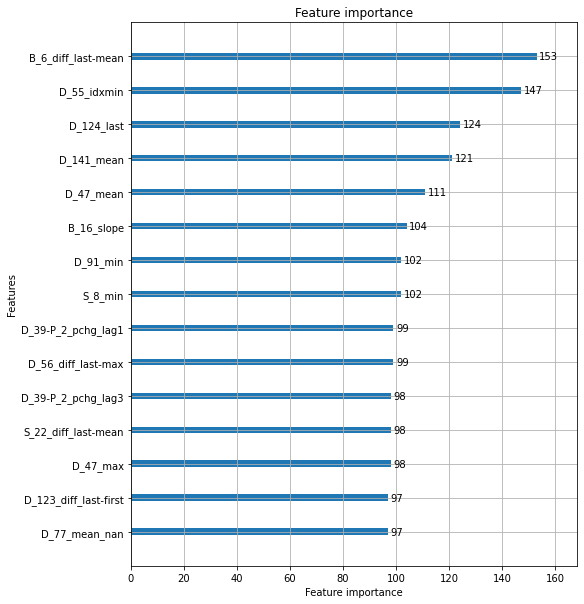

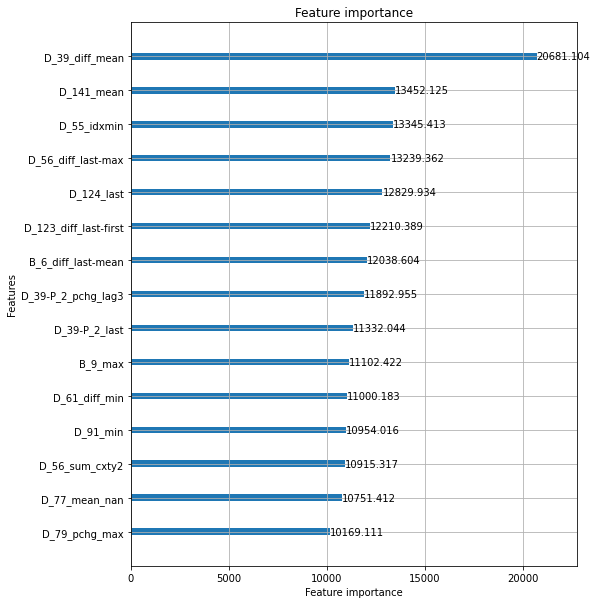

removed: ['D_39_diff_mean', 'D_56_diff_last-max', 'D_141_mean', 'D_55_idxmin', 'D_124_last']
Elapsed time: 2.5257649183273316 min.
----------------------------------------------------------------------------------------------------
ITER: 47/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.702898


[100]	valid_0's auc: 0.733218


[150]	valid_0's auc: 0.75218


[200]	valid_0's auc: 0.76611


[250]	valid_0's auc: 0.777509


[300]	valid_0's auc: 0.785606


[350]	valid_0's auc: 0.792144


[400]	valid_0's auc: 0.79743


[450]	valid_0's auc: 0.8027


[500]	valid_0's auc: 0.807219
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.807219


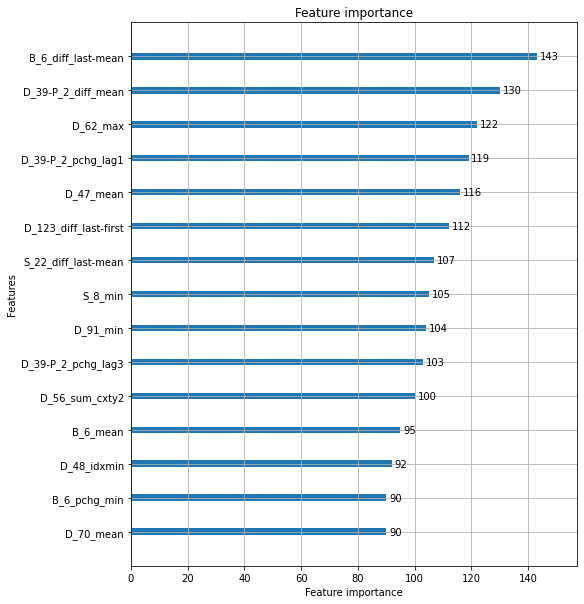

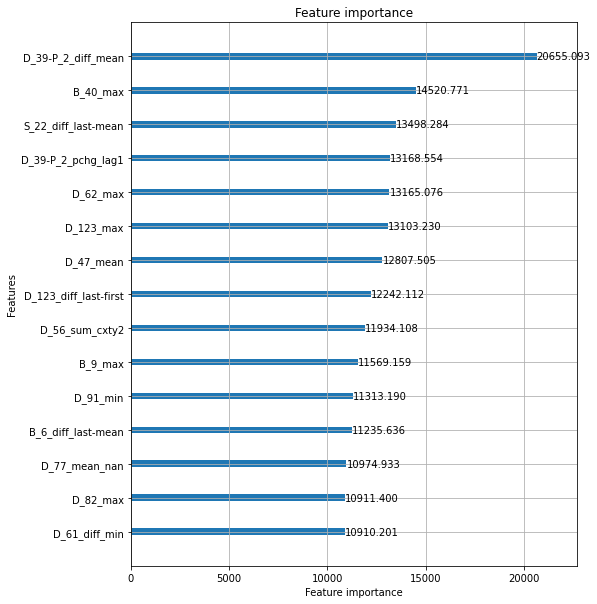

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.701243


[100]	valid_0's auc: 0.732288


[150]	valid_0's auc: 0.750831


[200]	valid_0's auc: 0.763485


[250]	valid_0's auc: 0.773924


[300]	valid_0's auc: 0.784149


[350]	valid_0's auc: 0.790759


[400]	valid_0's auc: 0.797045


[450]	valid_0's auc: 0.801869


[500]	valid_0's auc: 0.80631
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.80631


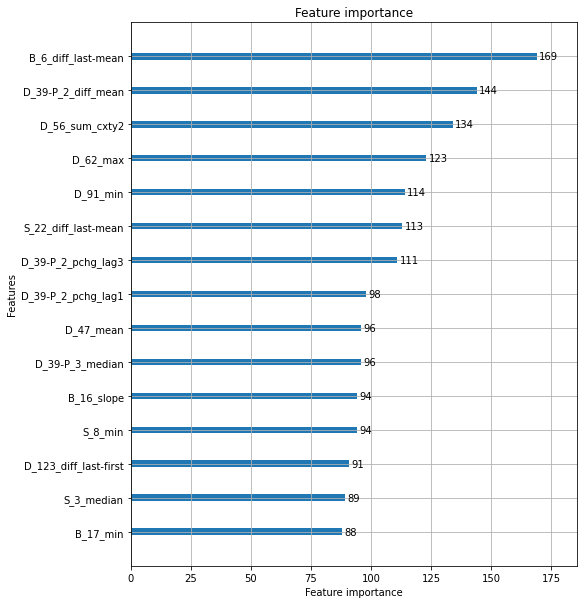

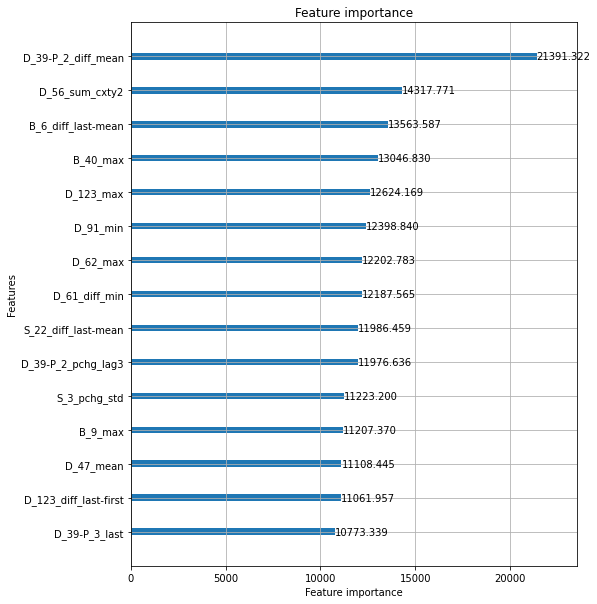

removed: ['D_39-P_2_diff_mean', 'B_40_max', 'D_56_sum_cxty2', 'D_123_max', 'S_22_diff_last-mean']
Elapsed time: 2.5212381800015766 min.
----------------------------------------------------------------------------------------------------
ITER: 48/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.694863


[100]	valid_0's auc: 0.725559


[150]	valid_0's auc: 0.746857


[200]	valid_0's auc: 0.76072


[250]	valid_0's auc: 0.771586


[300]	valid_0's auc: 0.779185


[350]	valid_0's auc: 0.786959


[400]	valid_0's auc: 0.792436


[450]	valid_0's auc: 0.797928


[500]	valid_0's auc: 0.802449
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.802449


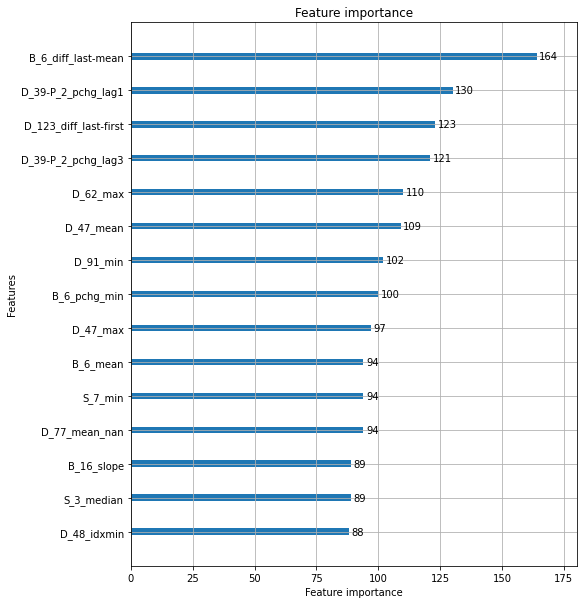

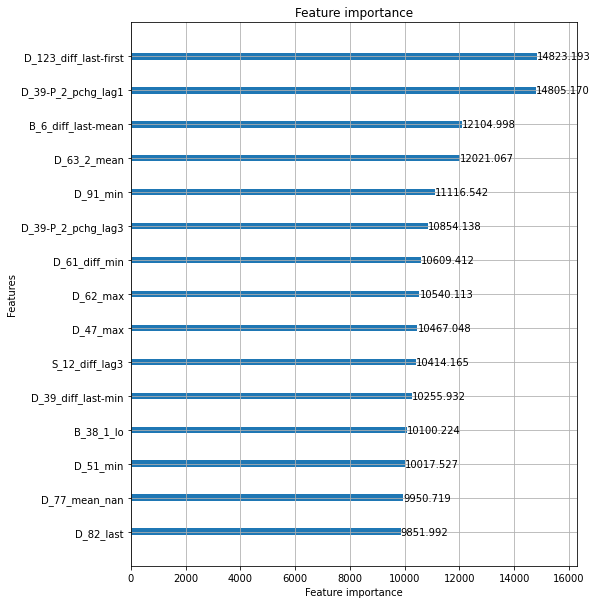

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.696093


[100]	valid_0's auc: 0.725564


[150]	valid_0's auc: 0.746346


[200]	valid_0's auc: 0.760988


[250]	valid_0's auc: 0.771707


[300]	valid_0's auc: 0.778918


[350]	valid_0's auc: 0.786113


[400]	valid_0's auc: 0.792032


[450]	valid_0's auc: 0.797259


[500]	valid_0's auc: 0.802204
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.802204


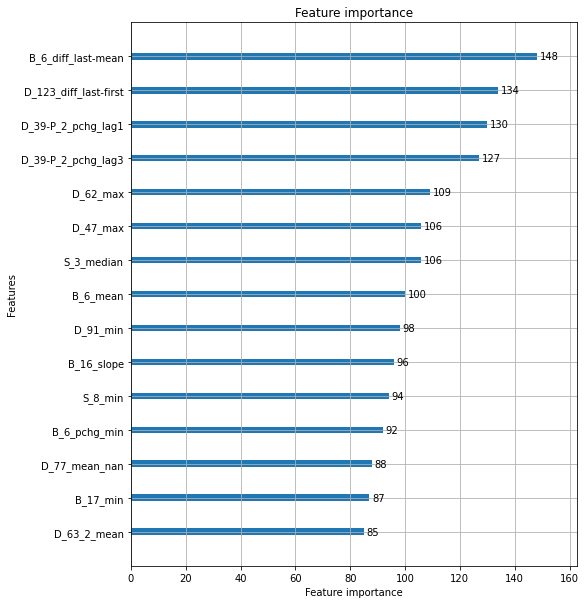

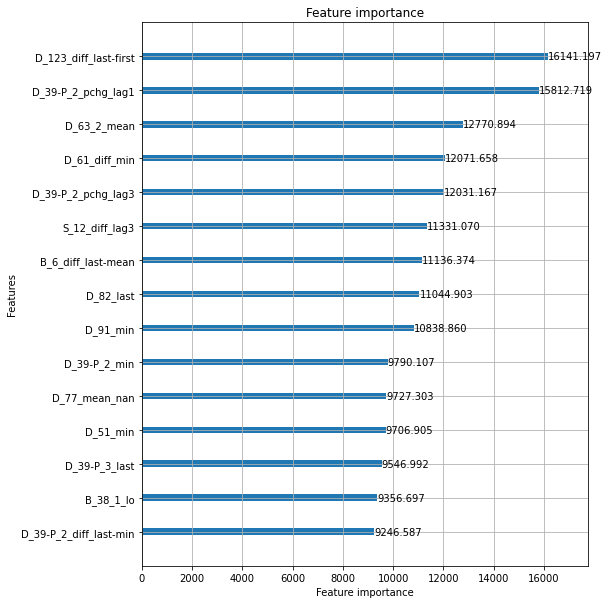

removed: ['D_123_diff_last-first', 'D_39-P_2_pchg_lag1', 'D_63_2_mean', 'B_6_diff_last-mean', 'D_39-P_2_pchg_lag3']
Elapsed time: 2.5038535793622336 min.
----------------------------------------------------------------------------------------------------
ITER: 49/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.692711


[100]	valid_0's auc: 0.72071


[150]	valid_0's auc: 0.739293


[200]	valid_0's auc: 0.751777


[250]	valid_0's auc: 0.763152


[300]	valid_0's auc: 0.770685


[350]	valid_0's auc: 0.777547


[400]	valid_0's auc: 0.783797


[450]	valid_0's auc: 0.789306


[500]	valid_0's auc: 0.793886
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.793886


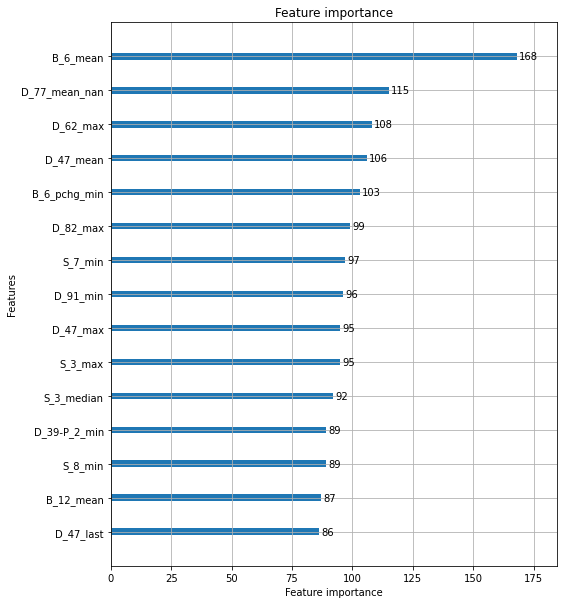

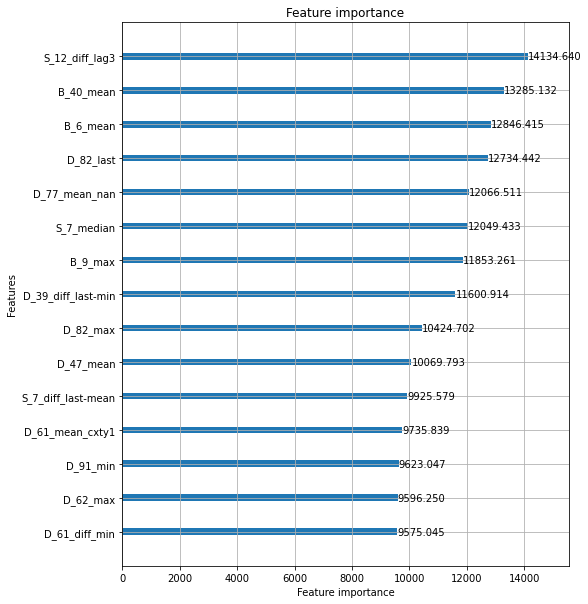

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.690679


[100]	valid_0's auc: 0.719067


[150]	valid_0's auc: 0.738025


[200]	valid_0's auc: 0.751173


[250]	valid_0's auc: 0.761756


[300]	valid_0's auc: 0.769604


[350]	valid_0's auc: 0.776273


[400]	valid_0's auc: 0.782117


[450]	valid_0's auc: 0.787841


[500]	valid_0's auc: 0.792649
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.792649


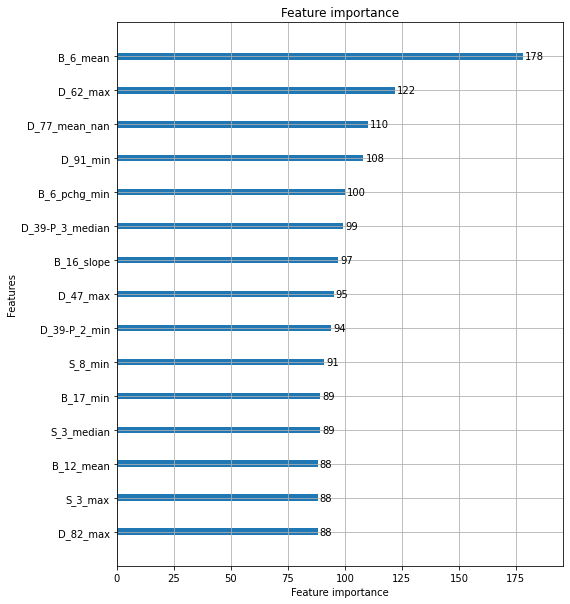

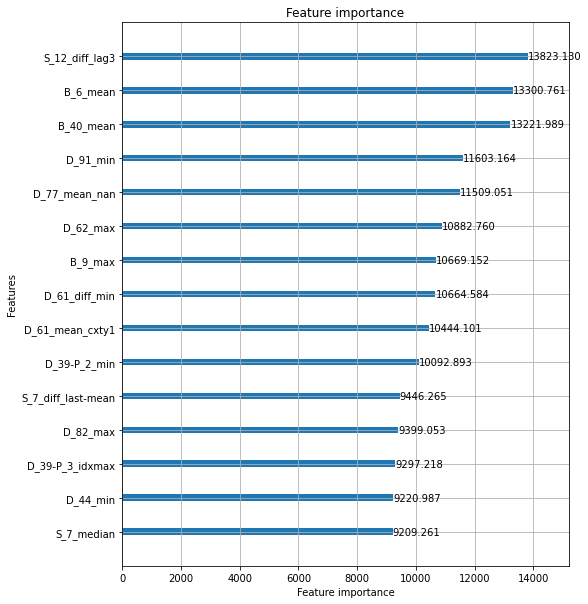

removed: ['S_12_diff_lag3', 'B_40_mean', 'B_6_mean', 'D_77_mean_nan', 'B_9_max']
Elapsed time: 2.5108948707580567 min.
----------------------------------------------------------------------------------------------------
ITER: 50/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.688316


[100]	valid_0's auc: 0.715643


[150]	valid_0's auc: 0.735211


[200]	valid_0's auc: 0.749392


[250]	valid_0's auc: 0.759427


[300]	valid_0's auc: 0.767522


[350]	valid_0's auc: 0.774801


[400]	valid_0's auc: 0.780763


[450]	valid_0's auc: 0.785851


[500]	valid_0's auc: 0.790903
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.790903


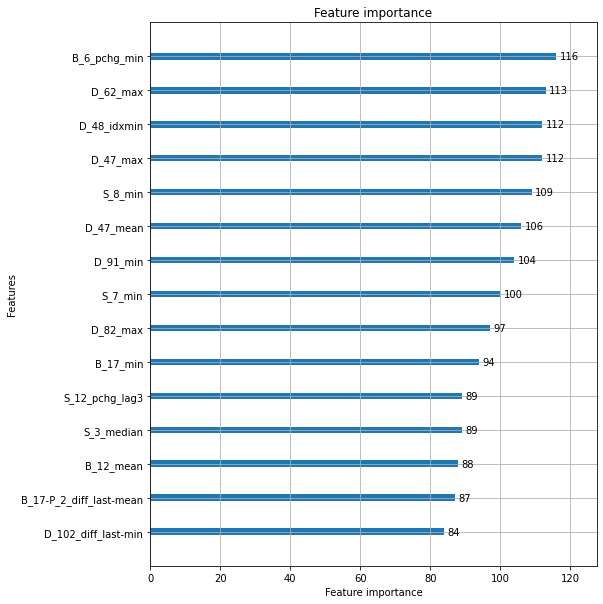

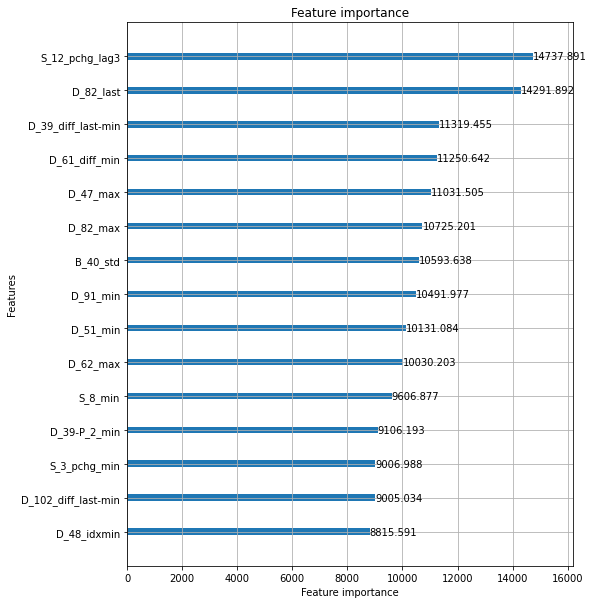

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.688817


[100]	valid_0's auc: 0.717024


[150]	valid_0's auc: 0.736386


[200]	valid_0's auc: 0.749458


[250]	valid_0's auc: 0.759646


[300]	valid_0's auc: 0.7683


[350]	valid_0's auc: 0.774696


[400]	valid_0's auc: 0.780612


[450]	valid_0's auc: 0.786077


[500]	valid_0's auc: 0.790656
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.790656


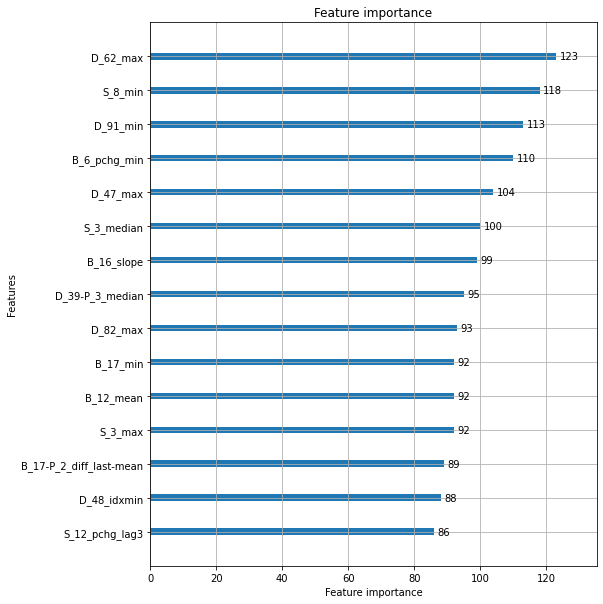

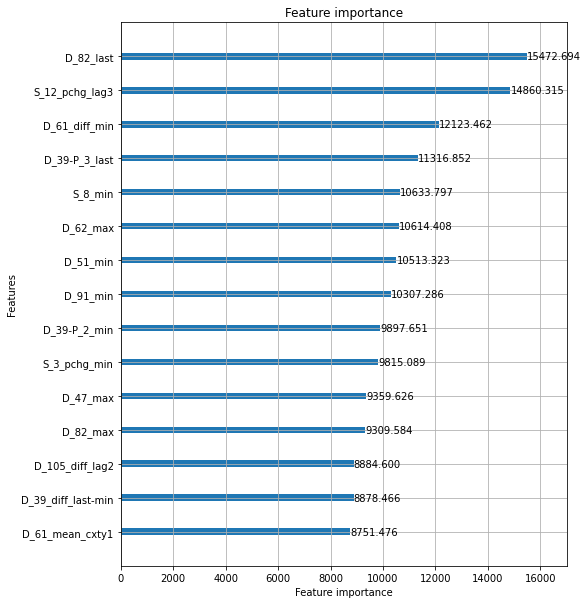

removed: ['D_82_last', 'S_12_pchg_lag3', 'D_61_diff_min', 'D_91_min', 'D_62_max']
Elapsed time: 2.486247185866038 min.
----------------------------------------------------------------------------------------------------
ITER: 51/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.684293


[100]	valid_0's auc: 0.709781


[150]	valid_0's auc: 0.728428


[200]	valid_0's auc: 0.741667


[250]	valid_0's auc: 0.751332


[300]	valid_0's auc: 0.759764


[350]	valid_0's auc: 0.766402


[400]	valid_0's auc: 0.772839


[450]	valid_0's auc: 0.778418


[500]	valid_0's auc: 0.782865
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.782865


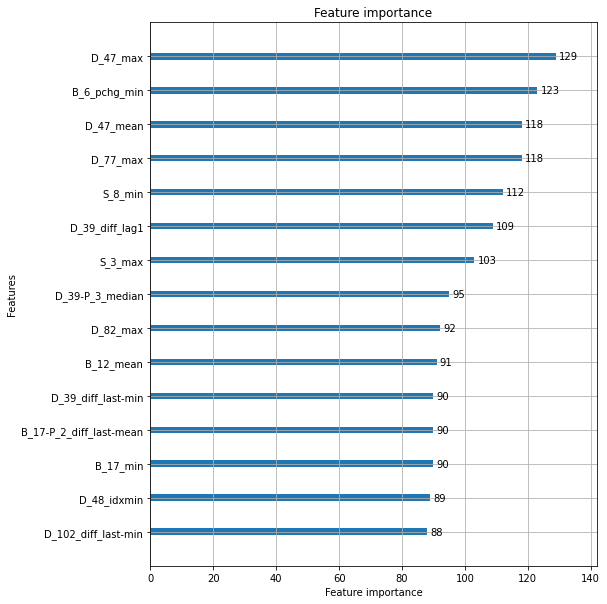

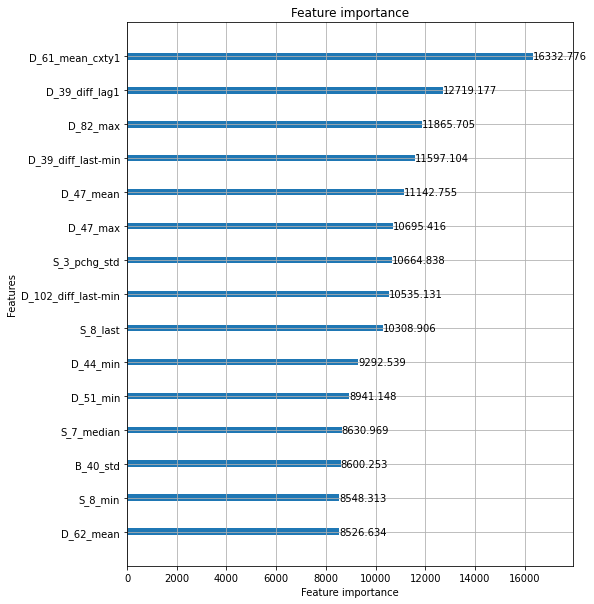

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.683518


[100]	valid_0's auc: 0.708394


[150]	valid_0's auc: 0.726792


[200]	valid_0's auc: 0.740481


[250]	valid_0's auc: 0.7505


[300]	valid_0's auc: 0.75902


[350]	valid_0's auc: 0.766189


[400]	valid_0's auc: 0.772954


[450]	valid_0's auc: 0.77842


[500]	valid_0's auc: 0.782889
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.782889


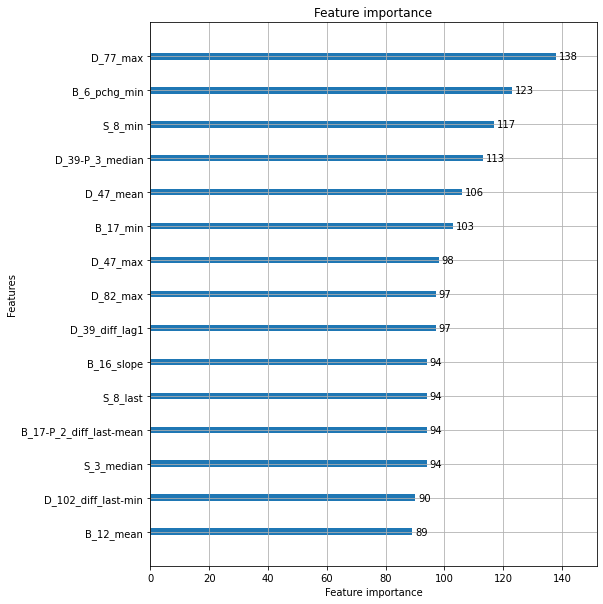

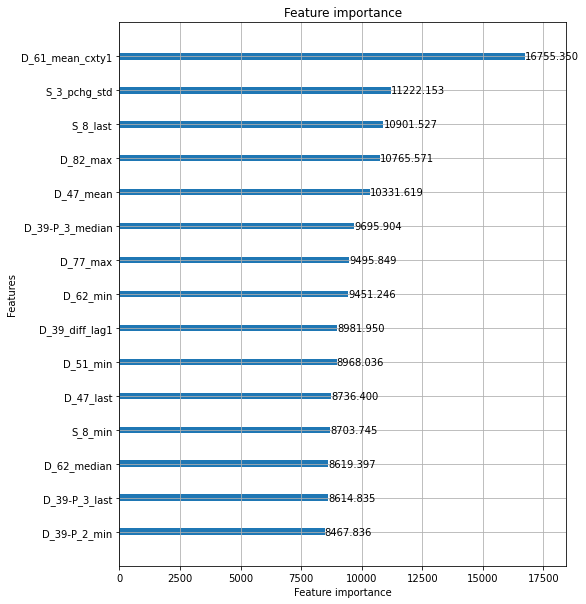

removed: ['D_61_mean_cxty1', 'D_82_max', 'S_3_pchg_std', 'D_39_diff_lag1', 'D_47_mean']
Elapsed time: 2.499634651343028 min.
----------------------------------------------------------------------------------------------------
ITER: 52/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.680078


[100]	valid_0's auc: 0.704664


[150]	valid_0's auc: 0.722709


[200]	valid_0's auc: 0.736906


[250]	valid_0's auc: 0.747169


[300]	valid_0's auc: 0.756344


[350]	valid_0's auc: 0.763286


[400]	valid_0's auc: 0.769346


[450]	valid_0's auc: 0.774573


[500]	valid_0's auc: 0.779743
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.779743


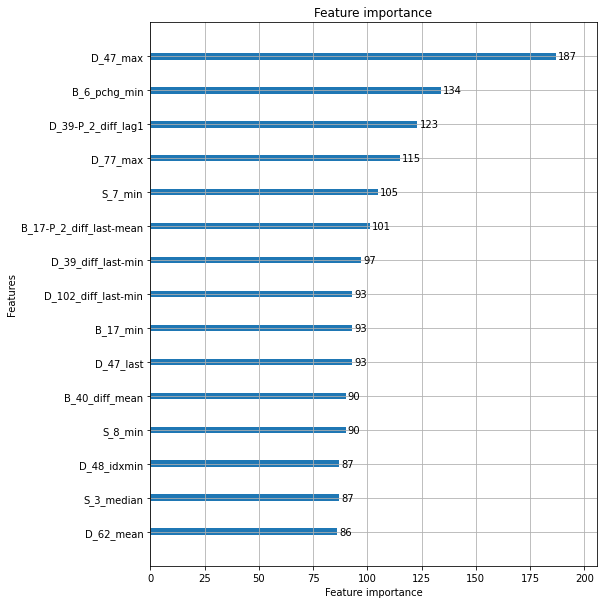

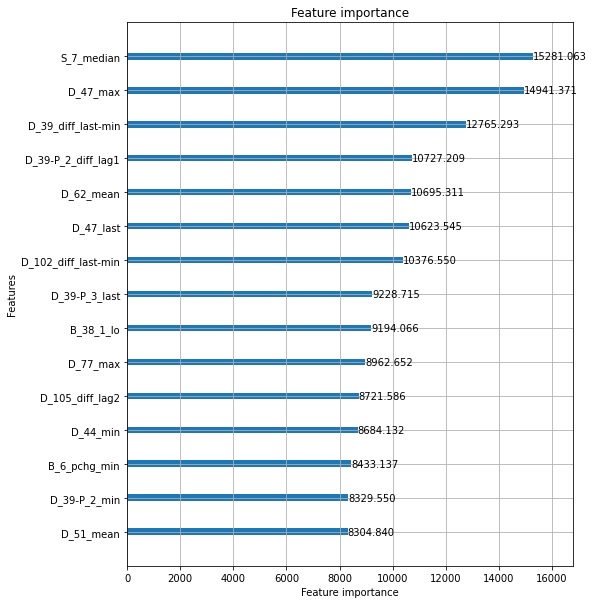

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.678871


[100]	valid_0's auc: 0.703244


[150]	valid_0's auc: 0.721266


[200]	valid_0's auc: 0.736383


[250]	valid_0's auc: 0.746606


[300]	valid_0's auc: 0.754996


[350]	valid_0's auc: 0.762203


[400]	valid_0's auc: 0.768898


[450]	valid_0's auc: 0.774388


[500]	valid_0's auc: 0.77906
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.77906


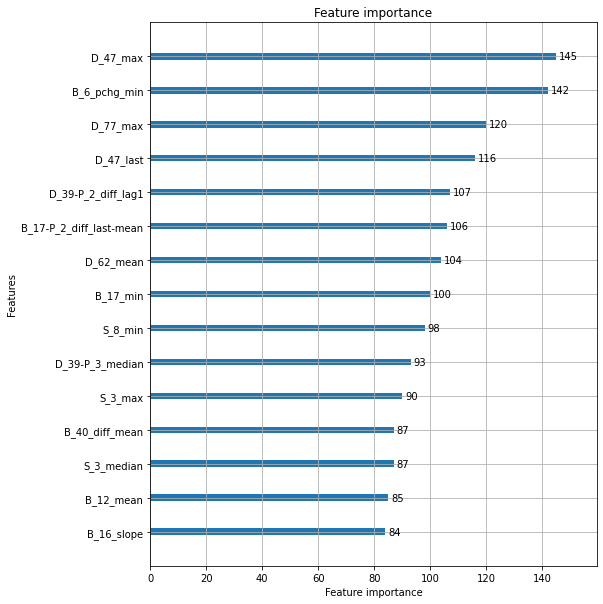

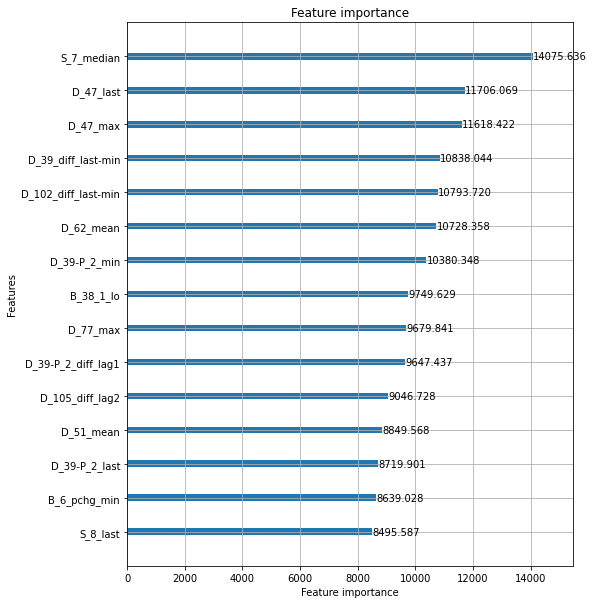

removed: ['S_7_median', 'D_47_max', 'D_39_diff_last-min', 'D_47_last', 'D_62_mean']
Elapsed time: 2.477094821135203 min.
----------------------------------------------------------------------------------------------------
ITER: 53/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.675545


[100]	valid_0's auc: 0.703626


[150]	valid_0's auc: 0.722476


[200]	valid_0's auc: 0.73567


[250]	valid_0's auc: 0.746025


[300]	valid_0's auc: 0.754557


[350]	valid_0's auc: 0.76127


[400]	valid_0's auc: 0.767445


[450]	valid_0's auc: 0.772774


[500]	valid_0's auc: 0.77805
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.77805


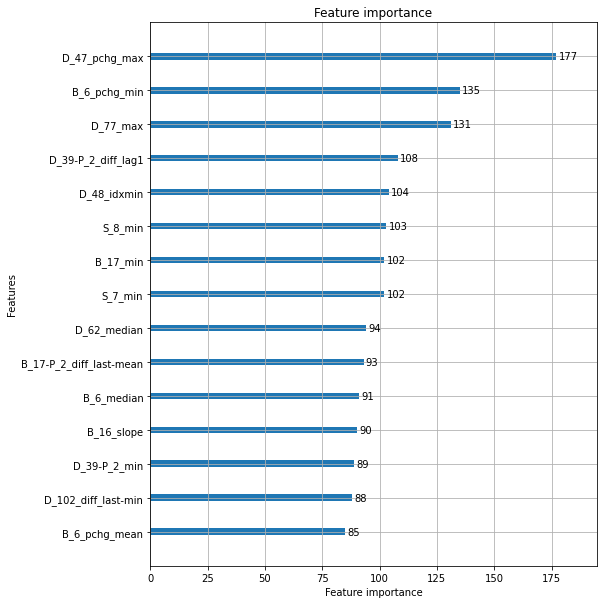

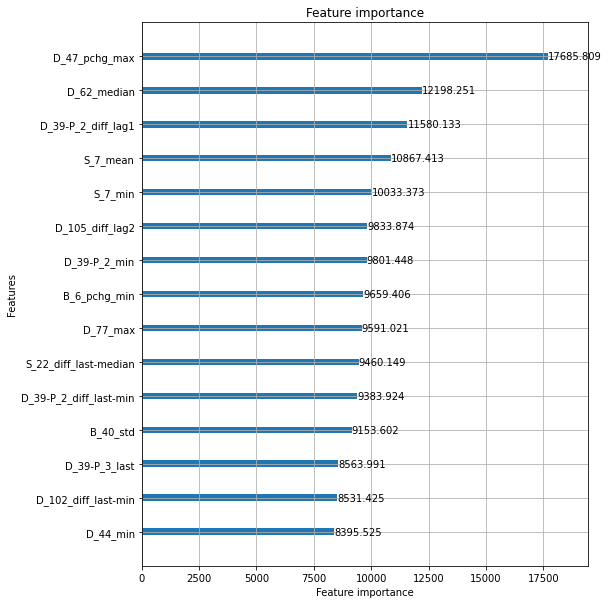

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.678208


[100]	valid_0's auc: 0.703924


[150]	valid_0's auc: 0.722577


[200]	valid_0's auc: 0.736323


[250]	valid_0's auc: 0.746981


[300]	valid_0's auc: 0.754768


[350]	valid_0's auc: 0.761678


[400]	valid_0's auc: 0.767568


[450]	valid_0's auc: 0.772579


[500]	valid_0's auc: 0.777452
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.777452


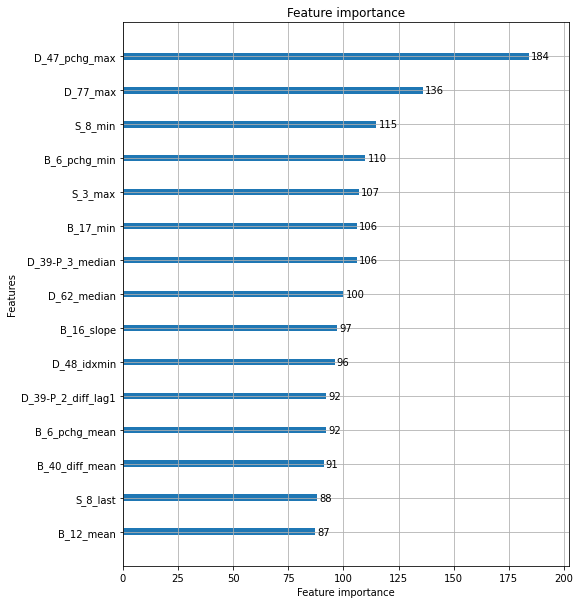

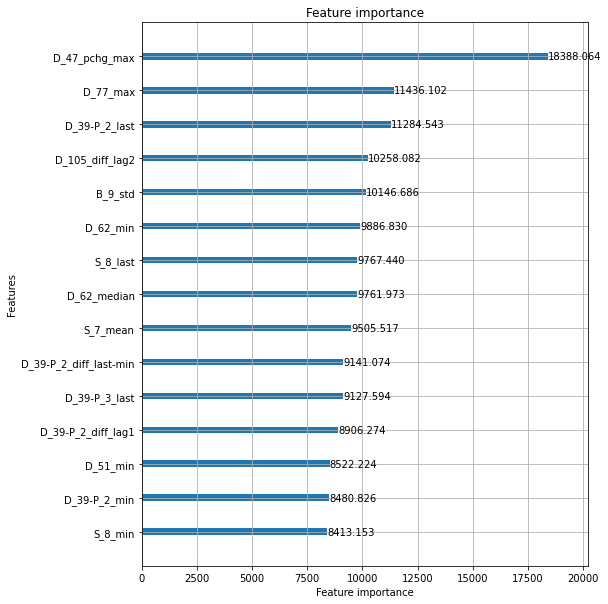

removed: ['D_47_pchg_max', 'D_62_median', 'D_77_max', 'D_39-P_2_diff_lag1', 'S_7_mean']
Elapsed time: 2.473924088478088 min.
----------------------------------------------------------------------------------------------------
ITER: 54/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.675111


[100]	valid_0's auc: 0.701968


[150]	valid_0's auc: 0.720761


[200]	valid_0's auc: 0.734584


[250]	valid_0's auc: 0.744363


[300]	valid_0's auc: 0.752302


[350]	valid_0's auc: 0.759158


[400]	valid_0's auc: 0.765229


[450]	valid_0's auc: 0.7705


[500]	valid_0's auc: 0.774993
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.774993


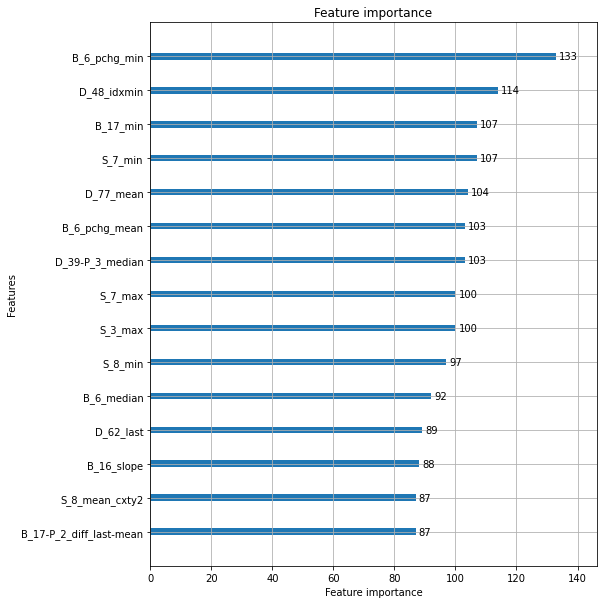

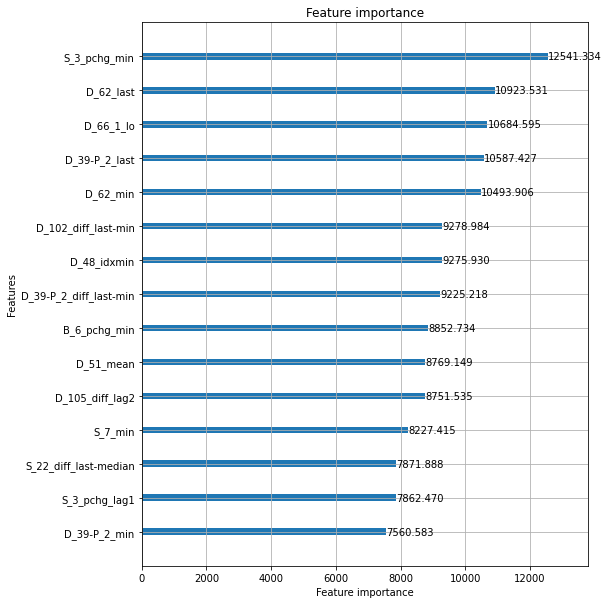

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.675616


[100]	valid_0's auc: 0.702217


[150]	valid_0's auc: 0.718773


[200]	valid_0's auc: 0.732844


[250]	valid_0's auc: 0.743413


[300]	valid_0's auc: 0.752261


[350]	valid_0's auc: 0.758782


[400]	valid_0's auc: 0.764766


[450]	valid_0's auc: 0.77004


[500]	valid_0's auc: 0.775088
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.775088


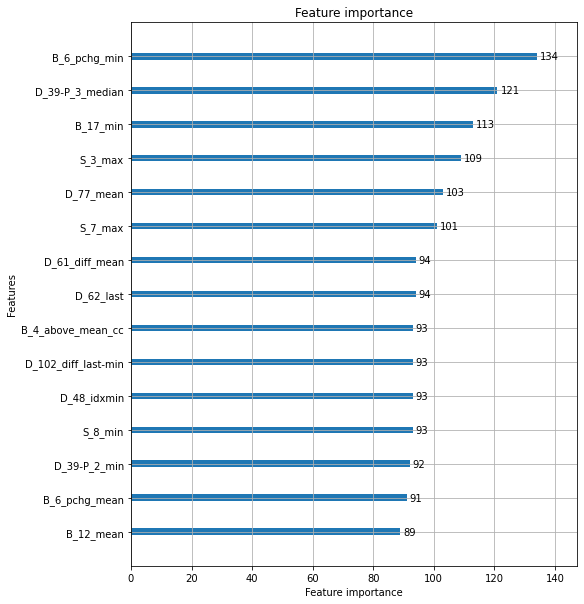

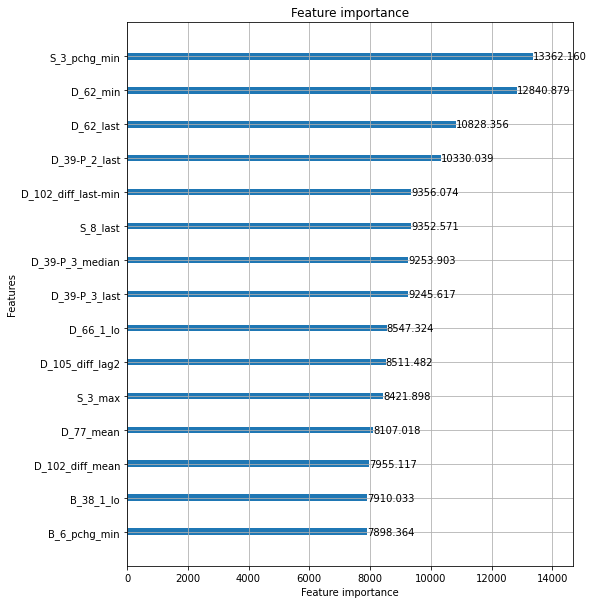

removed: ['S_3_pchg_min', 'D_62_min', 'D_62_last', 'D_39-P_2_last', 'D_66_1_lo']
Elapsed time: 2.45303973754247 min.
----------------------------------------------------------------------------------------------------
ITER: 55/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.671938


[100]	valid_0's auc: 0.700394


[150]	valid_0's auc: 0.718075


[200]	valid_0's auc: 0.732104


[250]	valid_0's auc: 0.742295


[300]	valid_0's auc: 0.750614


[350]	valid_0's auc: 0.758021


[400]	valid_0's auc: 0.763867


[450]	valid_0's auc: 0.769112


[500]	valid_0's auc: 0.773876
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.773876


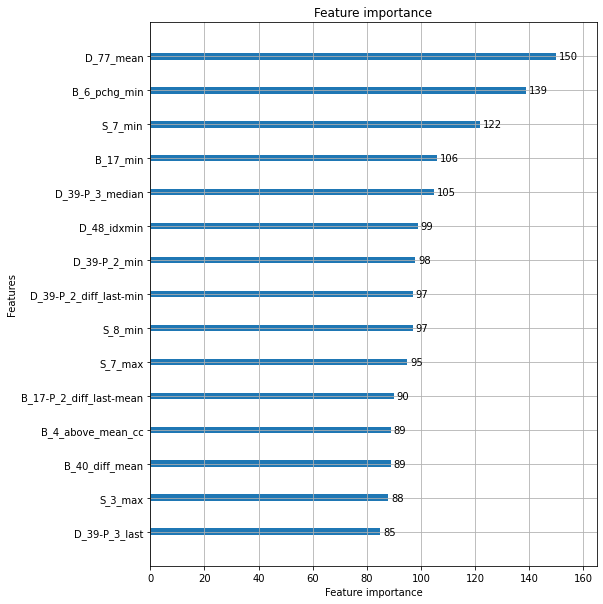

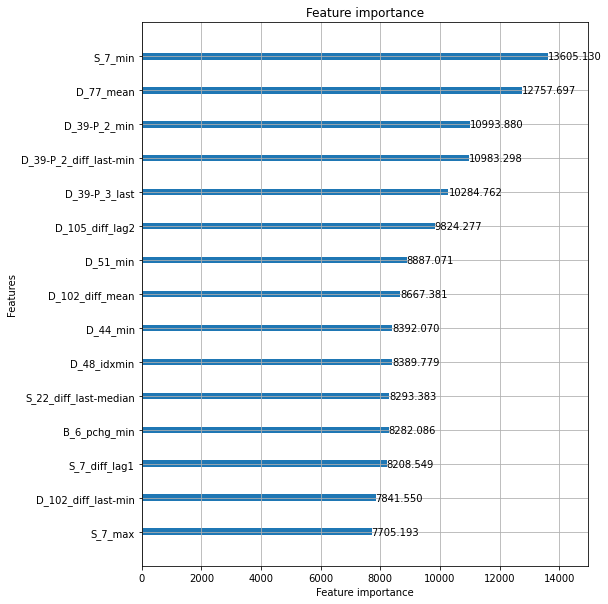

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.67114


[100]	valid_0's auc: 0.70037


[150]	valid_0's auc: 0.71764


[200]	valid_0's auc: 0.730049


[250]	valid_0's auc: 0.740775


[300]	valid_0's auc: 0.750087


[350]	valid_0's auc: 0.758091


[400]	valid_0's auc: 0.763693


[450]	valid_0's auc: 0.768854


[500]	valid_0's auc: 0.773287
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.773287


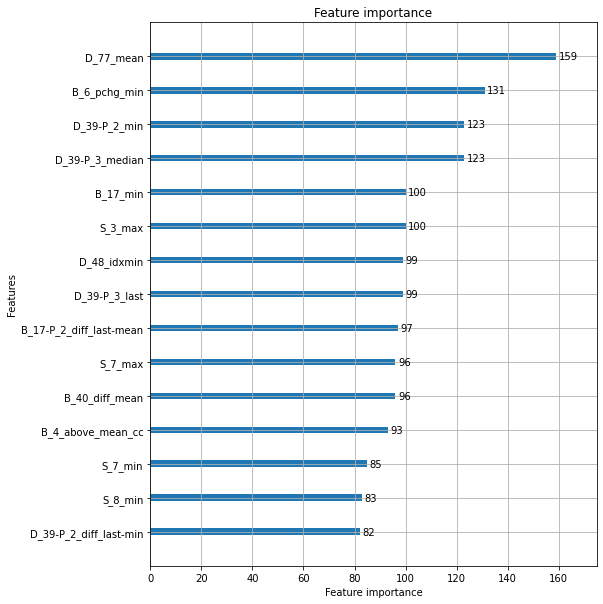

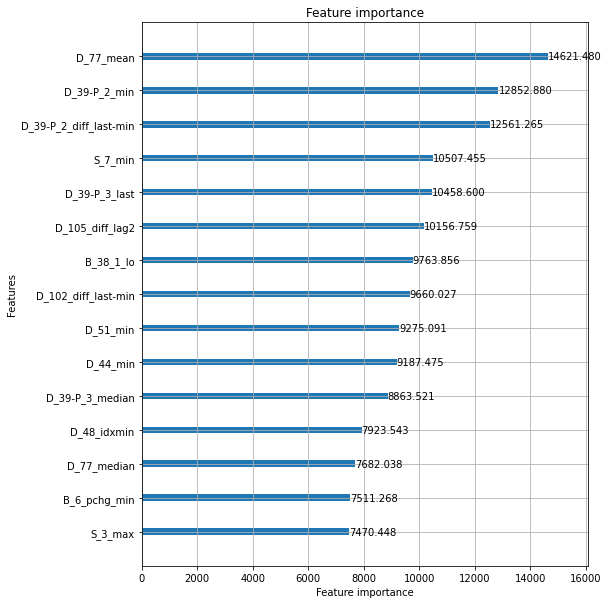

removed: ['D_77_mean', 'S_7_min', 'D_39-P_2_min', 'D_39-P_2_diff_last-min', 'D_39-P_3_last']
Elapsed time: 2.479804277420044 min.
----------------------------------------------------------------------------------------------------
ITER: 56/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.669584


[100]	valid_0's auc: 0.697174


[150]	valid_0's auc: 0.715483


[200]	valid_0's auc: 0.728906


[250]	valid_0's auc: 0.739591


[300]	valid_0's auc: 0.747493


[350]	valid_0's auc: 0.755088


[400]	valid_0's auc: 0.761641


[450]	valid_0's auc: 0.766595


[500]	valid_0's auc: 0.770802
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.770802


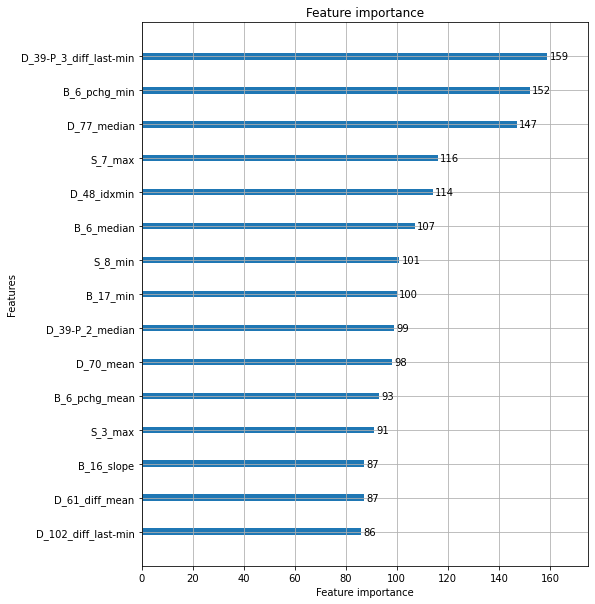

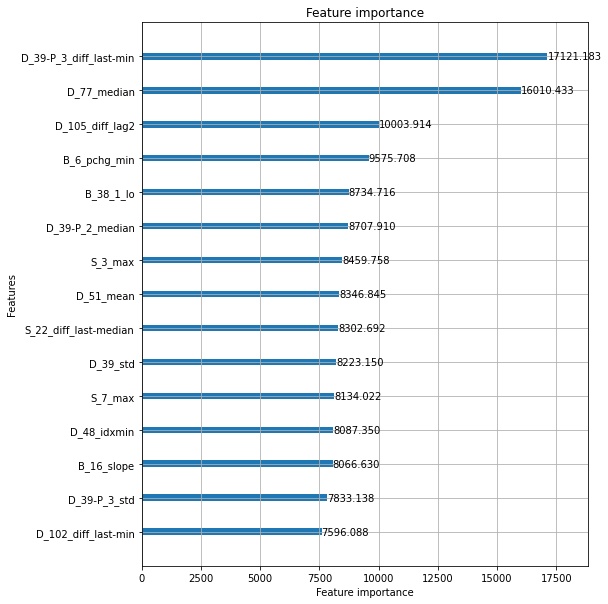

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.670707


[100]	valid_0's auc: 0.696271


[150]	valid_0's auc: 0.714874


[200]	valid_0's auc: 0.728846


[250]	valid_0's auc: 0.739311


[300]	valid_0's auc: 0.747622


[350]	valid_0's auc: 0.754759


[400]	valid_0's auc: 0.760939


[450]	valid_0's auc: 0.766766


[500]	valid_0's auc: 0.771518
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.771518


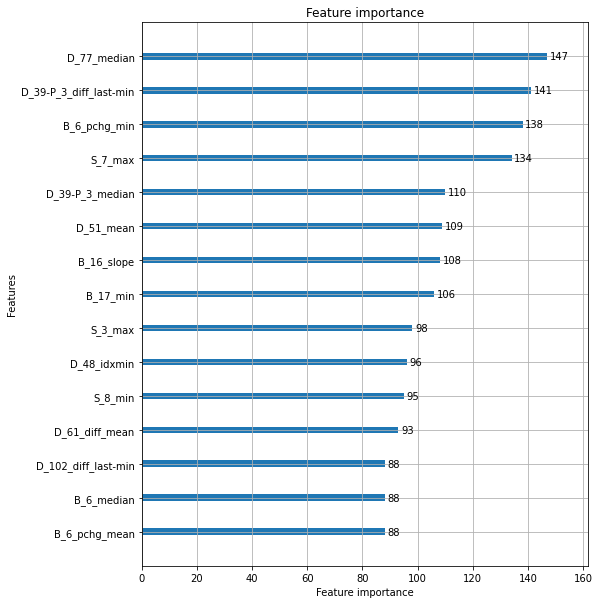

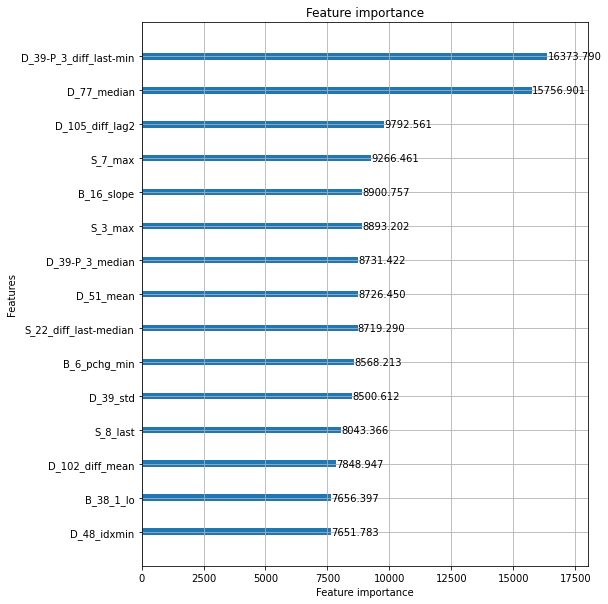

removed: ['D_39-P_3_diff_last-min', 'D_77_median', 'D_105_diff_lag2', 'B_6_pchg_min', 'S_7_max']
Elapsed time: 2.429966688156128 min.
----------------------------------------------------------------------------------------------------
ITER: 57/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.66199


[100]	valid_0's auc: 0.687591


[150]	valid_0's auc: 0.706566


[200]	valid_0's auc: 0.719305


[250]	valid_0's auc: 0.730232


[300]	valid_0's auc: 0.739093


[350]	valid_0's auc: 0.746406


[400]	valid_0's auc: 0.752275


[450]	valid_0's auc: 0.757015


[500]	valid_0's auc: 0.761969
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.761969


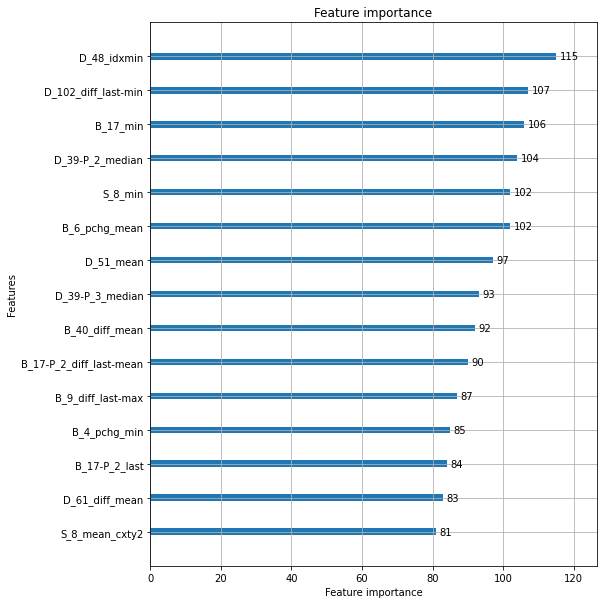

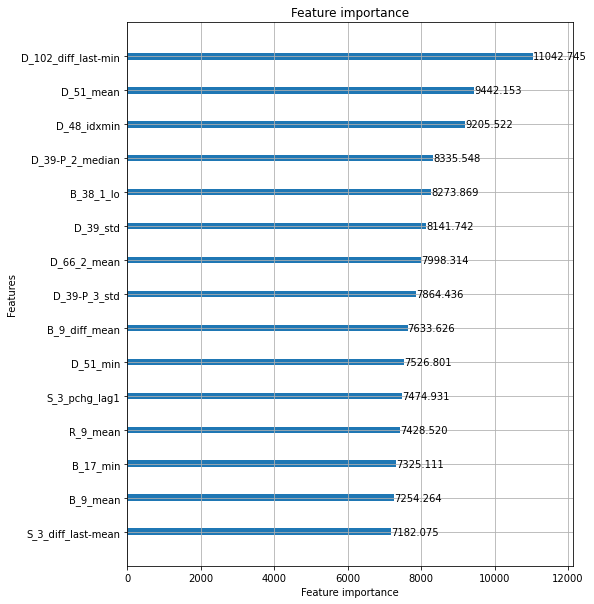

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.663631


[100]	valid_0's auc: 0.688071


[150]	valid_0's auc: 0.706638


[200]	valid_0's auc: 0.719905


[250]	valid_0's auc: 0.730777


[300]	valid_0's auc: 0.739487


[350]	valid_0's auc: 0.746906


[400]	valid_0's auc: 0.752923


[450]	valid_0's auc: 0.757704


[500]	valid_0's auc: 0.762294
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.762294


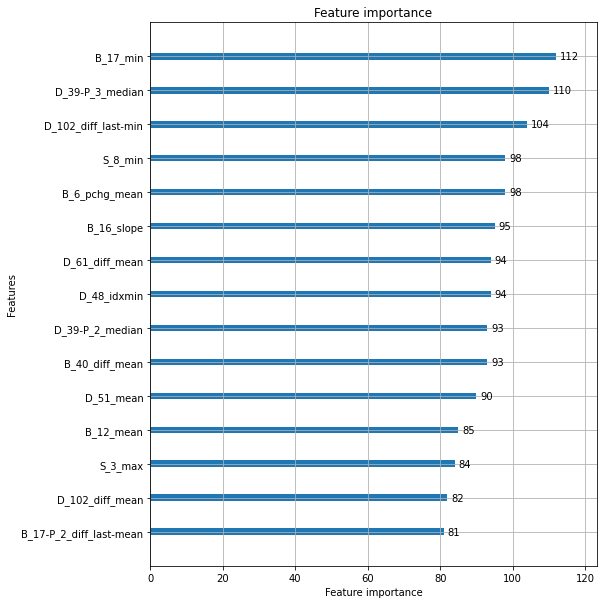

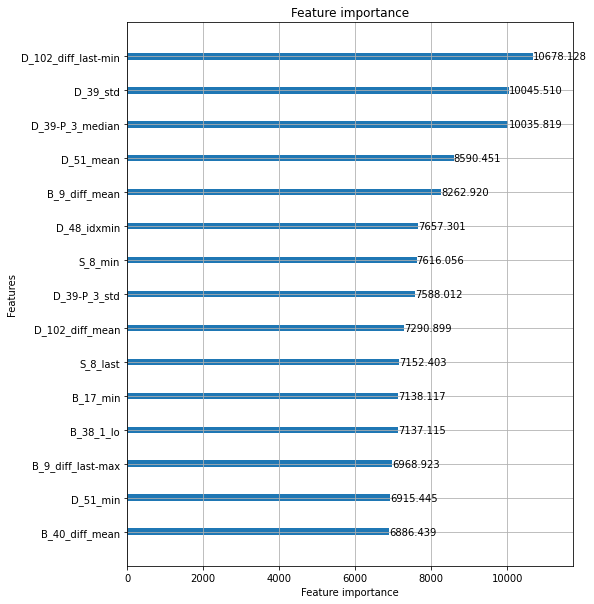

removed: ['D_102_diff_last-min', 'D_39_std', 'D_51_mean', 'D_39-P_3_median', 'D_48_idxmin']
Elapsed time: 2.4344474911689757 min.
----------------------------------------------------------------------------------------------------
ITER: 58/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.660958


[100]	valid_0's auc: 0.686051


[150]	valid_0's auc: 0.703706


[200]	valid_0's auc: 0.717309


[250]	valid_0's auc: 0.727508


[300]	valid_0's auc: 0.736023


[350]	valid_0's auc: 0.742691


[400]	valid_0's auc: 0.74878


[450]	valid_0's auc: 0.754381


[500]	valid_0's auc: 0.758707
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.758707


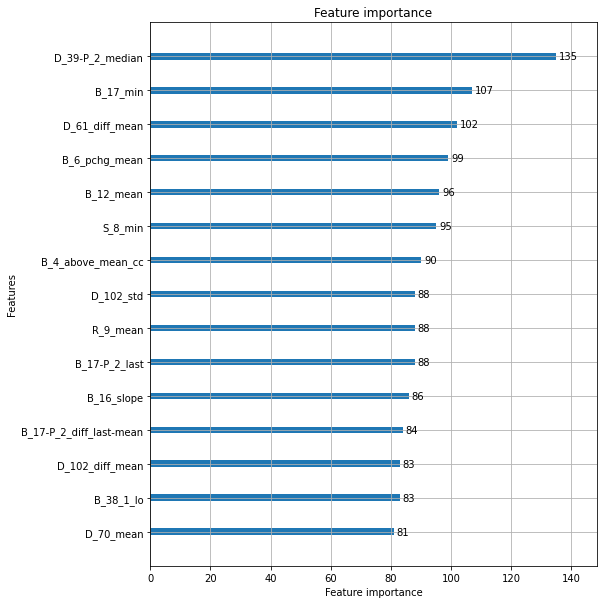

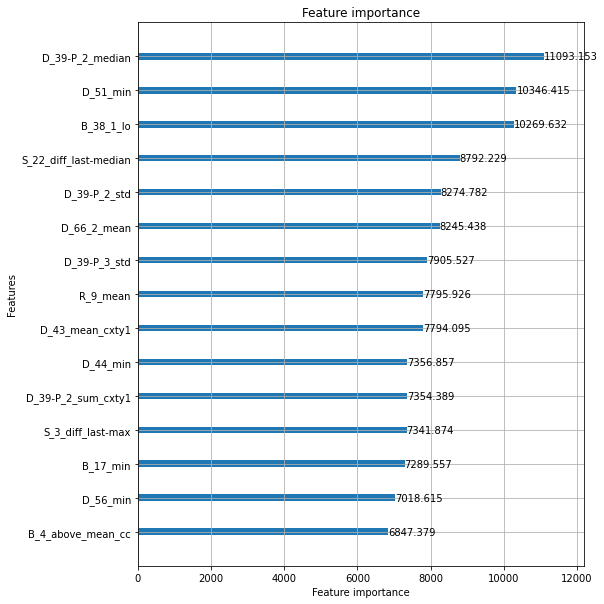

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.661737


[100]	valid_0's auc: 0.686507


[150]	valid_0's auc: 0.703711


[200]	valid_0's auc: 0.716558


[250]	valid_0's auc: 0.72733


[300]	valid_0's auc: 0.73552


[350]	valid_0's auc: 0.743253


[400]	valid_0's auc: 0.74964


[450]	valid_0's auc: 0.754242


[500]	valid_0's auc: 0.759329
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.759329


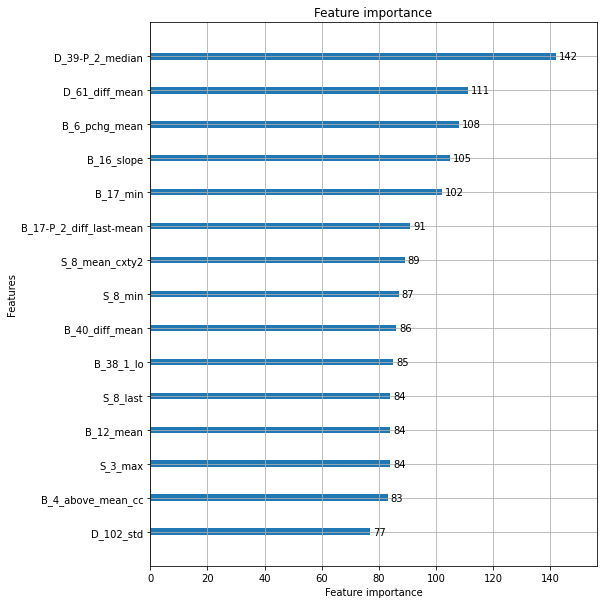

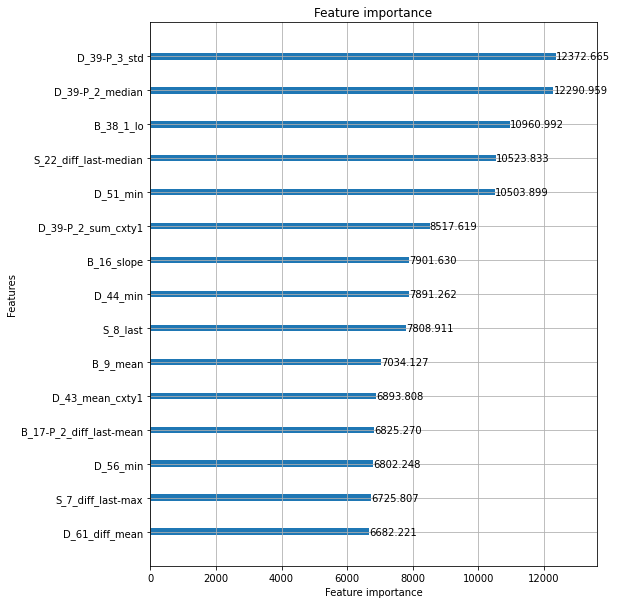

removed: ['D_39-P_2_median', 'B_38_1_lo', 'D_51_min', 'D_39-P_3_std', 'S_22_diff_last-median']
Elapsed time: 2.4167874137560528 min.
----------------------------------------------------------------------------------------------------
ITER: 59/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.658292


[100]	valid_0's auc: 0.683098


[150]	valid_0's auc: 0.700819


[200]	valid_0's auc: 0.713147


[250]	valid_0's auc: 0.723453


[300]	valid_0's auc: 0.731023


[350]	valid_0's auc: 0.737468


[400]	valid_0's auc: 0.743497


[450]	valid_0's auc: 0.748614


[500]	valid_0's auc: 0.752999
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.752999


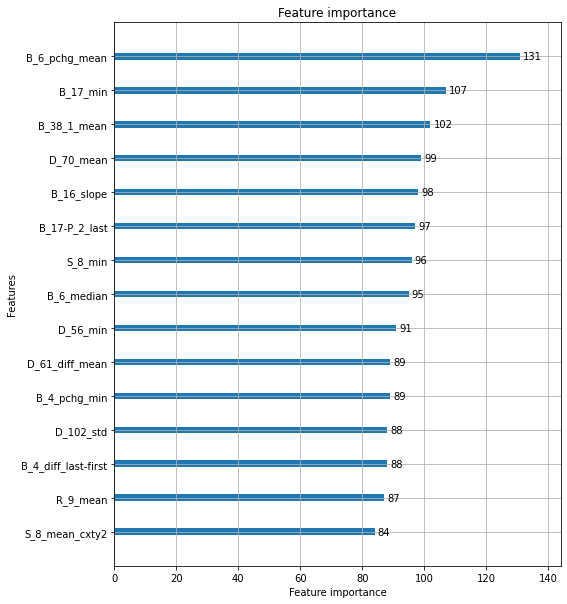

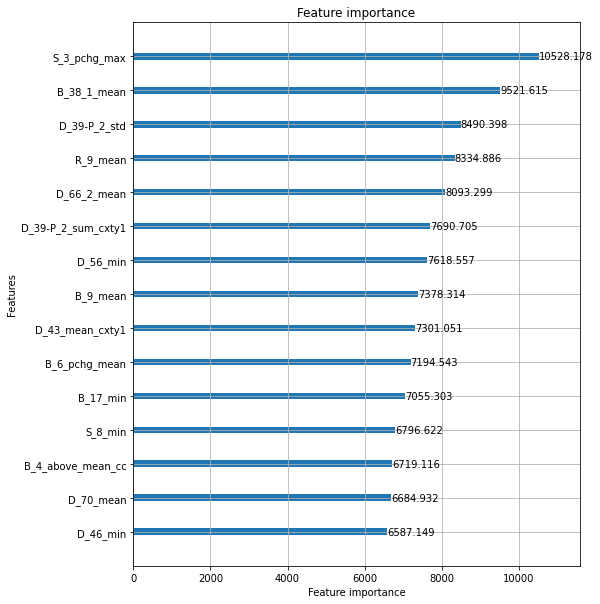

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.657736


[100]	valid_0's auc: 0.681769


[150]	valid_0's auc: 0.699017


[200]	valid_0's auc: 0.711774


[250]	valid_0's auc: 0.721832


[300]	valid_0's auc: 0.730558


[350]	valid_0's auc: 0.737517


[400]	valid_0's auc: 0.743058


[450]	valid_0's auc: 0.748443


[500]	valid_0's auc: 0.753133
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.753133


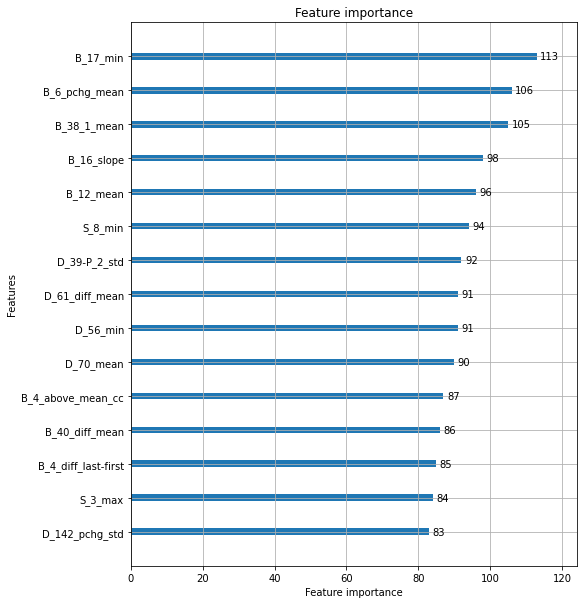

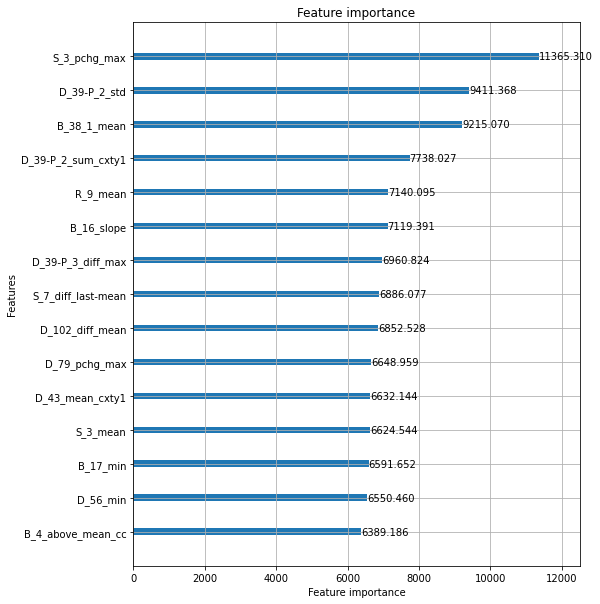

removed: ['S_3_pchg_max', 'B_38_1_mean', 'D_39-P_2_std', 'R_9_mean', 'D_39-P_2_sum_cxty1']
Elapsed time: 2.440078592300415 min.
----------------------------------------------------------------------------------------------------
ITER: 60/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.653335


[100]	valid_0's auc: 0.678124


[150]	valid_0's auc: 0.6959


[200]	valid_0's auc: 0.708467


[250]	valid_0's auc: 0.718804


[300]	valid_0's auc: 0.726795


[350]	valid_0's auc: 0.733566


[400]	valid_0's auc: 0.739404


[450]	valid_0's auc: 0.744642


[500]	valid_0's auc: 0.749236
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.749236


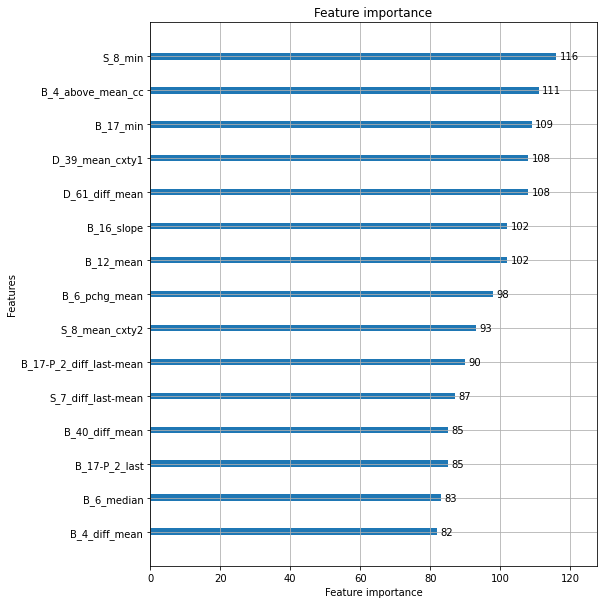

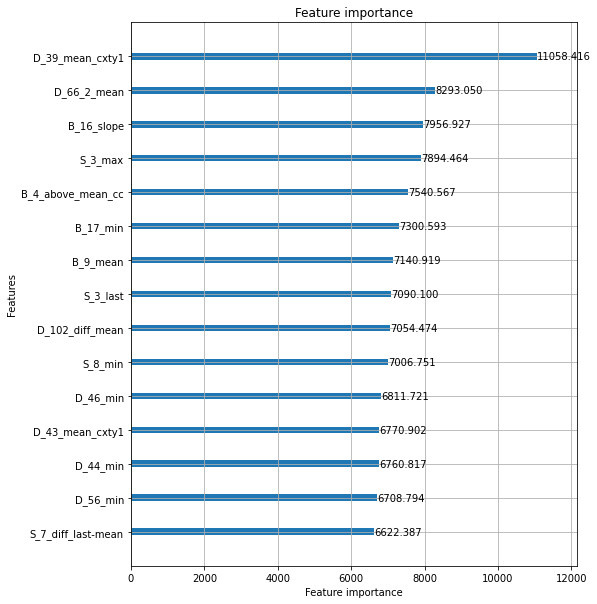

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.655242


[100]	valid_0's auc: 0.678271


[150]	valid_0's auc: 0.69594


[200]	valid_0's auc: 0.708672


[250]	valid_0's auc: 0.719317


[300]	valid_0's auc: 0.727855


[350]	valid_0's auc: 0.734562


[400]	valid_0's auc: 0.74053


[450]	valid_0's auc: 0.745673


[500]	valid_0's auc: 0.750026
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.750026


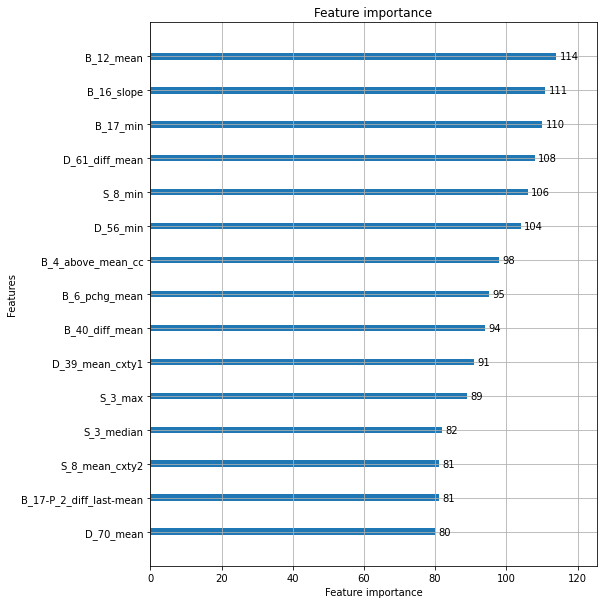

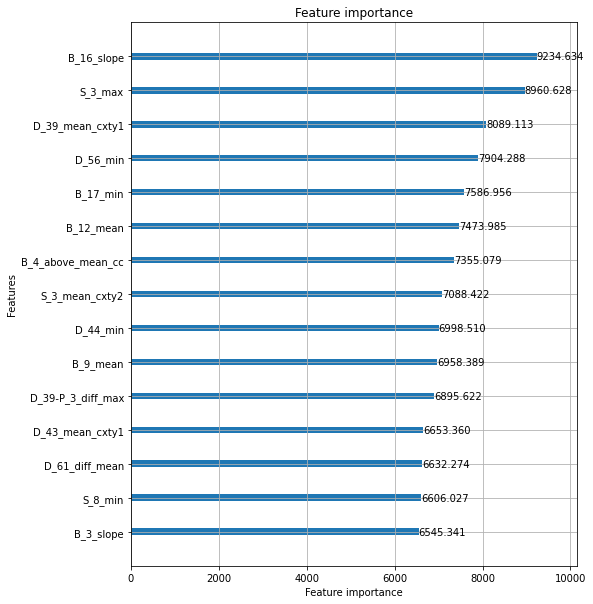

removed: ['D_39_mean_cxty1', 'B_16_slope', 'S_3_max', 'B_4_above_mean_cc', 'B_17_min']
Elapsed time: 2.393074544270833 min.
----------------------------------------------------------------------------------------------------
ITER: 61/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.651474


[100]	valid_0's auc: 0.677234


[150]	valid_0's auc: 0.694932


[200]	valid_0's auc: 0.707518


[250]	valid_0's auc: 0.717356


[300]	valid_0's auc: 0.725228


[350]	valid_0's auc: 0.732242


[400]	valid_0's auc: 0.73762


[450]	valid_0's auc: 0.742502


[500]	valid_0's auc: 0.746952
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.746952


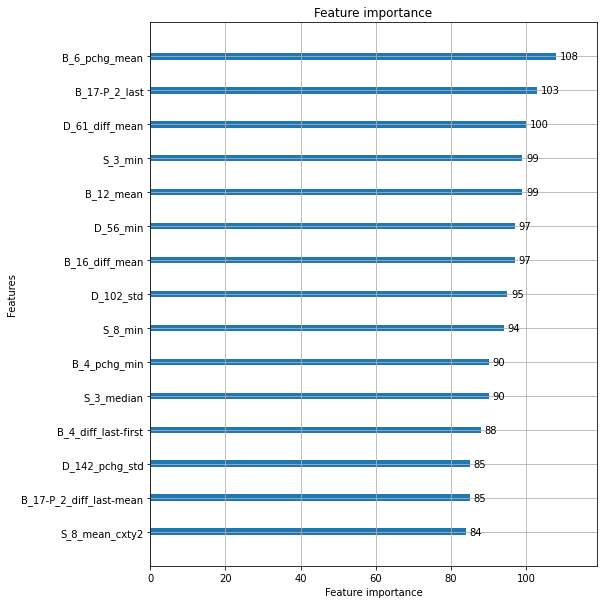

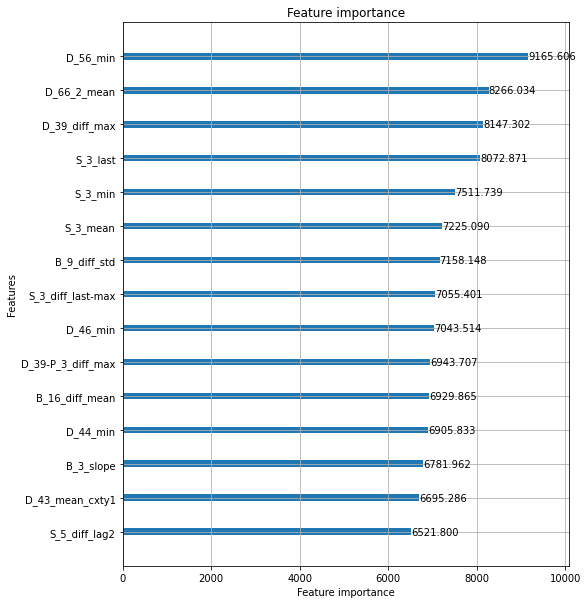

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.655456


[100]	valid_0's auc: 0.677833


[150]	valid_0's auc: 0.695526


[200]	valid_0's auc: 0.707809


[250]	valid_0's auc: 0.7179


[300]	valid_0's auc: 0.725625


[350]	valid_0's auc: 0.732696


[400]	valid_0's auc: 0.737897


[450]	valid_0's auc: 0.743229


[500]	valid_0's auc: 0.747875
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.747875


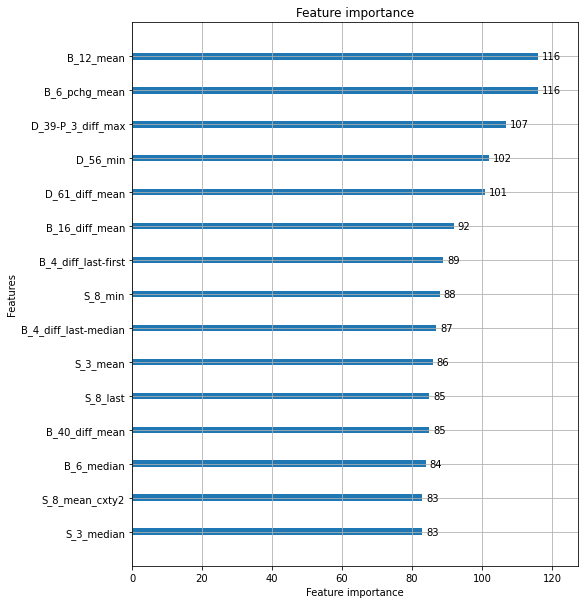

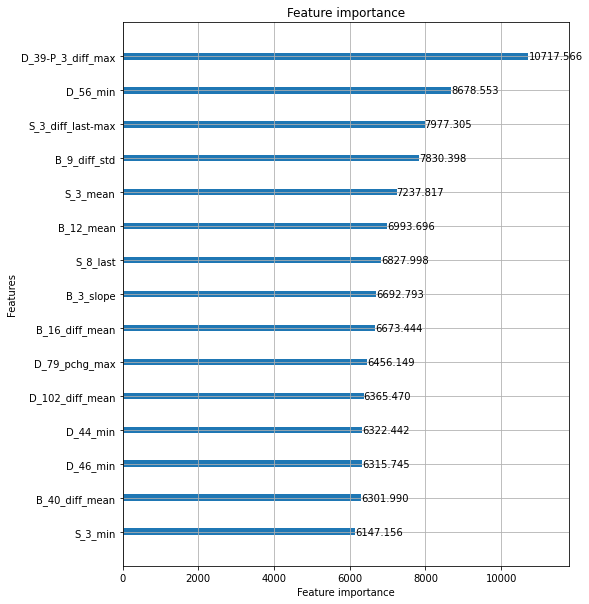

removed: ['D_56_min', 'D_39-P_3_diff_max', 'S_3_diff_last-max', 'B_9_diff_std', 'S_3_mean']
Elapsed time: 2.412962599595388 min.
----------------------------------------------------------------------------------------------------
ITER: 62/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.652818


[100]	valid_0's auc: 0.676407


[150]	valid_0's auc: 0.692397


[200]	valid_0's auc: 0.704816


[250]	valid_0's auc: 0.715549


[300]	valid_0's auc: 0.723444


[350]	valid_0's auc: 0.730417


[400]	valid_0's auc: 0.736869


[450]	valid_0's auc: 0.742306


[500]	valid_0's auc: 0.747274
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.747274


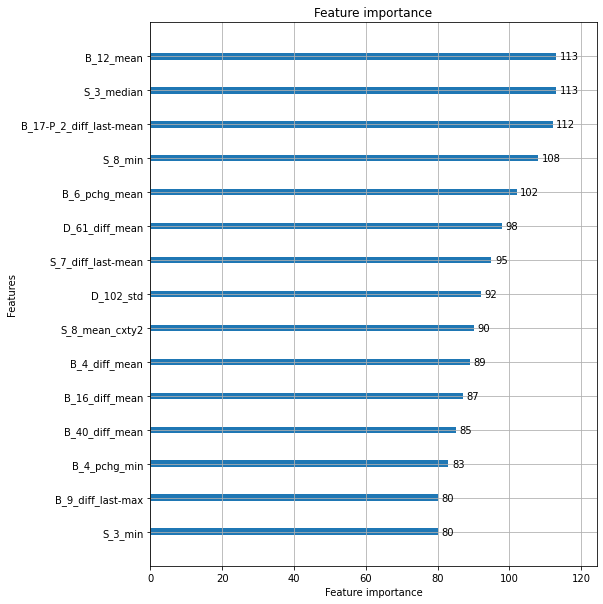

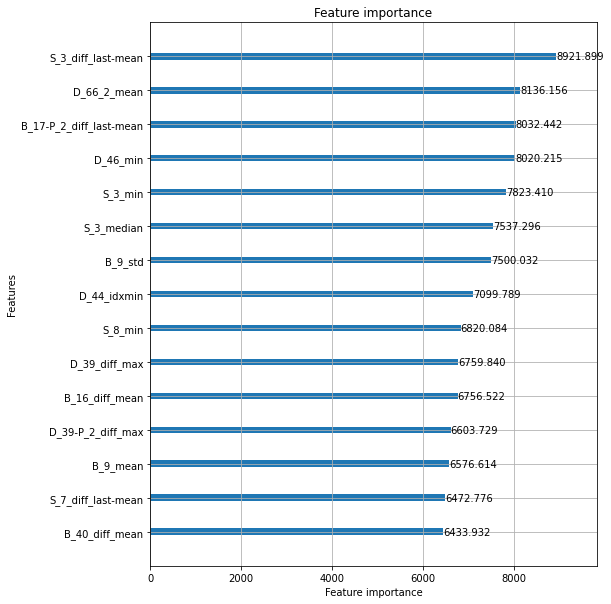

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.651926


[100]	valid_0's auc: 0.6763


[150]	valid_0's auc: 0.693428


[200]	valid_0's auc: 0.706425


[250]	valid_0's auc: 0.715904


[300]	valid_0's auc: 0.724725


[350]	valid_0's auc: 0.731232


[400]	valid_0's auc: 0.737353


[450]	valid_0's auc: 0.74203


[500]	valid_0's auc: 0.746339
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.746339


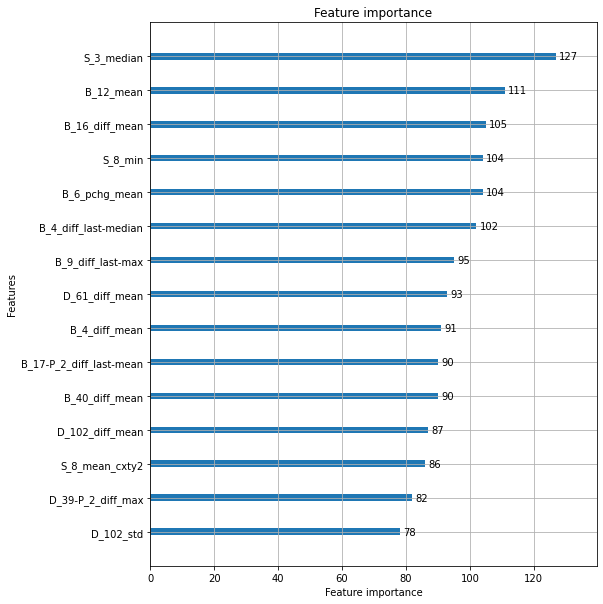

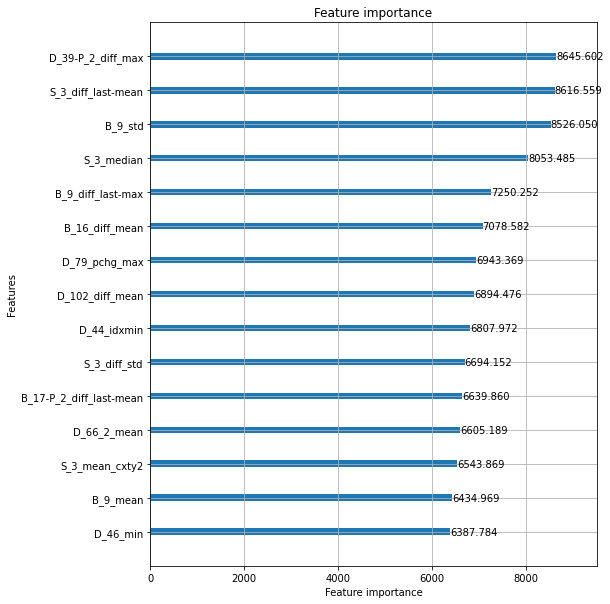

removed: ['S_3_diff_last-mean', 'B_9_std', 'S_3_median', 'D_39-P_2_diff_max', 'D_66_2_mean']
Elapsed time: 2.368171338240306 min.
----------------------------------------------------------------------------------------------------
ITER: 63/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.651818


[100]	valid_0's auc: 0.675262


[150]	valid_0's auc: 0.692858


[200]	valid_0's auc: 0.705429


[250]	valid_0's auc: 0.714994


[300]	valid_0's auc: 0.72258


[350]	valid_0's auc: 0.72945


[400]	valid_0's auc: 0.735058


[450]	valid_0's auc: 0.740061


[500]	valid_0's auc: 0.744715
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.744715


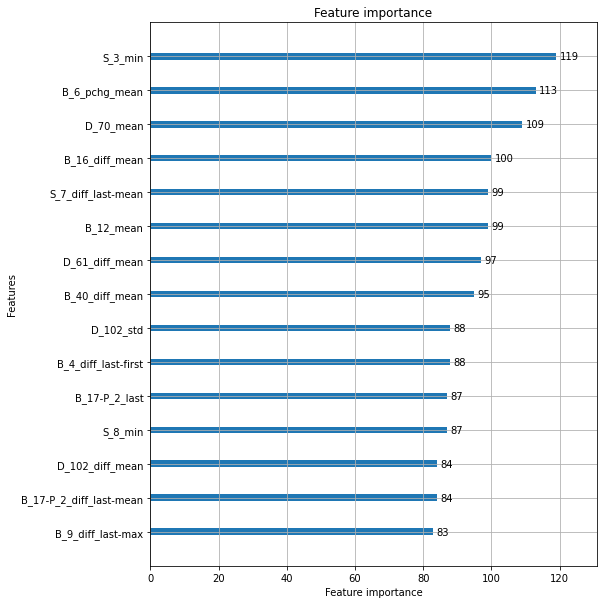

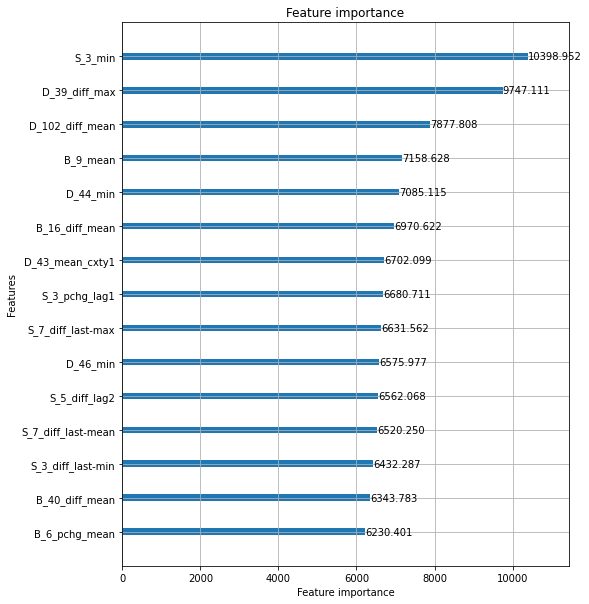

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.653715


[100]	valid_0's auc: 0.675982


[150]	valid_0's auc: 0.693093


[200]	valid_0's auc: 0.705464


[250]	valid_0's auc: 0.71496


[300]	valid_0's auc: 0.72305


[350]	valid_0's auc: 0.729451


[400]	valid_0's auc: 0.735181


[450]	valid_0's auc: 0.739906


[500]	valid_0's auc: 0.744906
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.744906


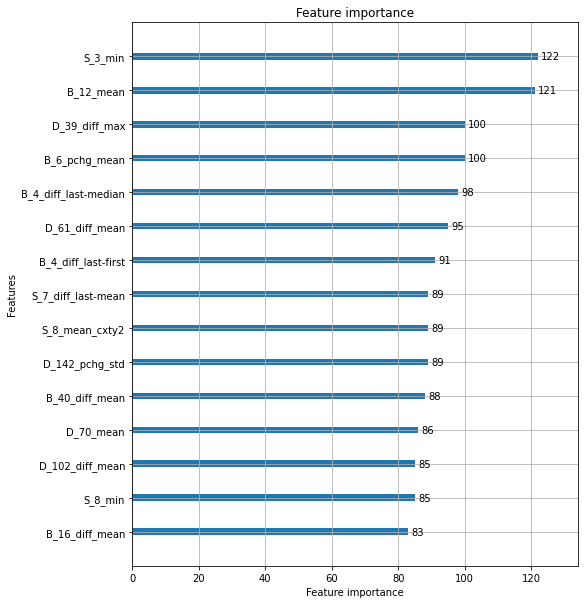

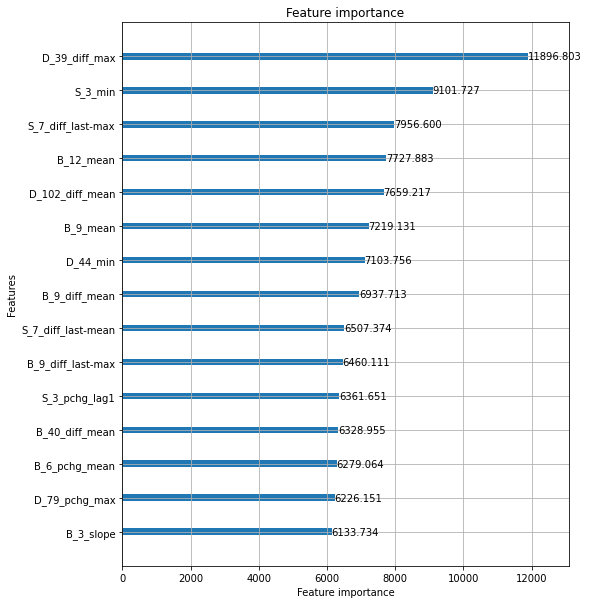

removed: ['D_39_diff_max', 'S_3_min', 'D_102_diff_mean', 'S_7_diff_last-max', 'B_9_mean']
Elapsed time: 2.3799663901329042 min.
----------------------------------------------------------------------------------------------------
ITER: 64/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.64995


[100]	valid_0's auc: 0.67397


[150]	valid_0's auc: 0.691104


[200]	valid_0's auc: 0.703297


[250]	valid_0's auc: 0.712588


[300]	valid_0's auc: 0.719938


[350]	valid_0's auc: 0.726851


[400]	valid_0's auc: 0.732484


[450]	valid_0's auc: 0.73778


[500]	valid_0's auc: 0.742733
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.742733


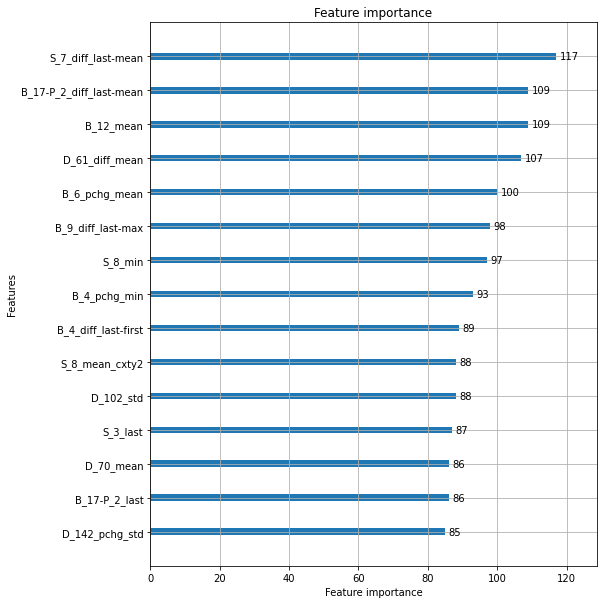

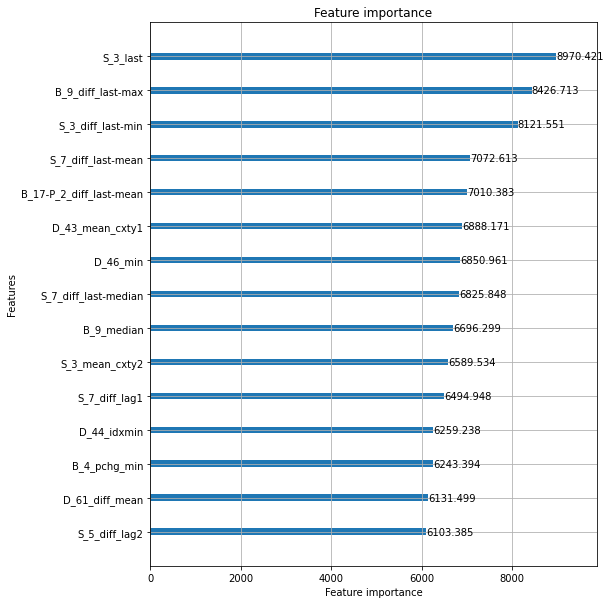

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.650976


[100]	valid_0's auc: 0.675473


[150]	valid_0's auc: 0.691344


[200]	valid_0's auc: 0.70347


[250]	valid_0's auc: 0.712634


[300]	valid_0's auc: 0.720399


[350]	valid_0's auc: 0.727307


[400]	valid_0's auc: 0.733138


[450]	valid_0's auc: 0.738486


[500]	valid_0's auc: 0.742944
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.742944


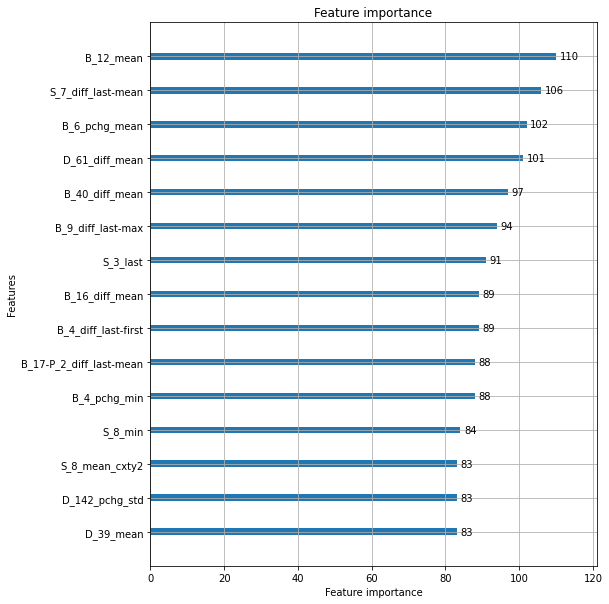

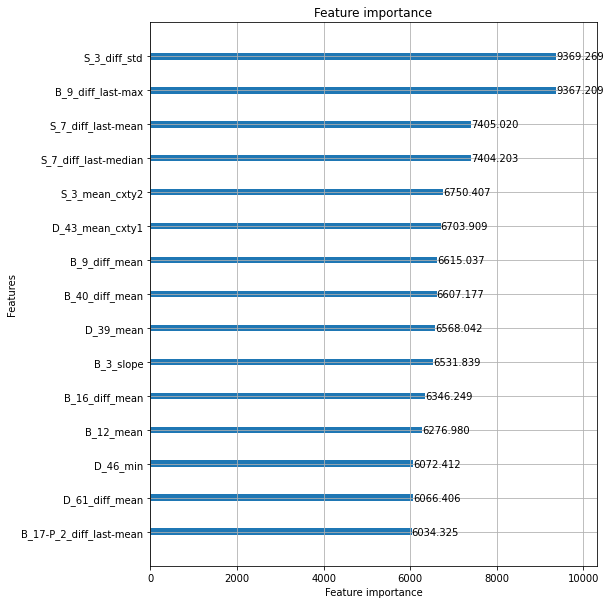

removed: ['B_9_diff_last-max', 'S_7_diff_last-mean', 'S_7_diff_last-median', 'S_3_diff_std', 'S_3_last']
Elapsed time: 2.3635526935259503 min.
----------------------------------------------------------------------------------------------------
ITER: 65/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.650047


[100]	valid_0's auc: 0.674351


[150]	valid_0's auc: 0.691204


[200]	valid_0's auc: 0.70297


[250]	valid_0's auc: 0.712588


[300]	valid_0's auc: 0.719968


[350]	valid_0's auc: 0.725946


[400]	valid_0's auc: 0.73182


[450]	valid_0's auc: 0.736446


[500]	valid_0's auc: 0.740566
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.740566


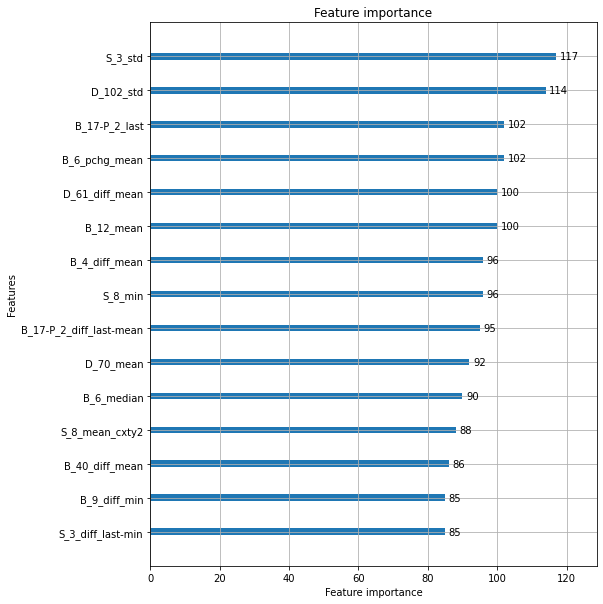

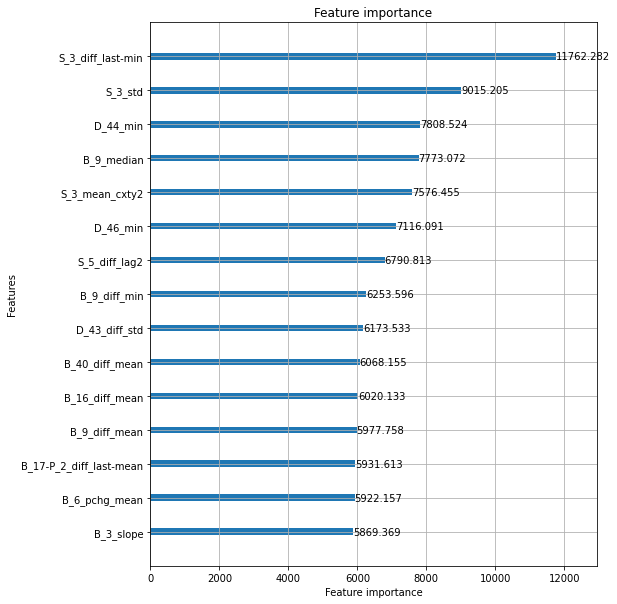

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.649388


[100]	valid_0's auc: 0.674758


[150]	valid_0's auc: 0.691328


[200]	valid_0's auc: 0.703038


[250]	valid_0's auc: 0.712042


[300]	valid_0's auc: 0.719626


[350]	valid_0's auc: 0.726064


[400]	valid_0's auc: 0.731825


[450]	valid_0's auc: 0.736195


[500]	valid_0's auc: 0.740761
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.740761


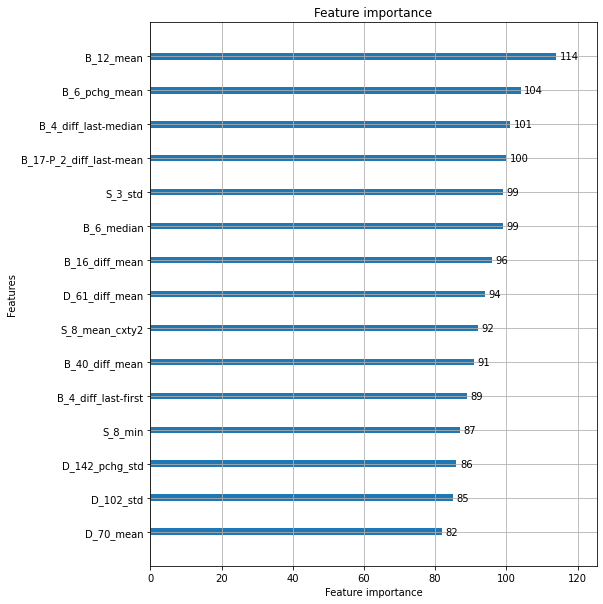

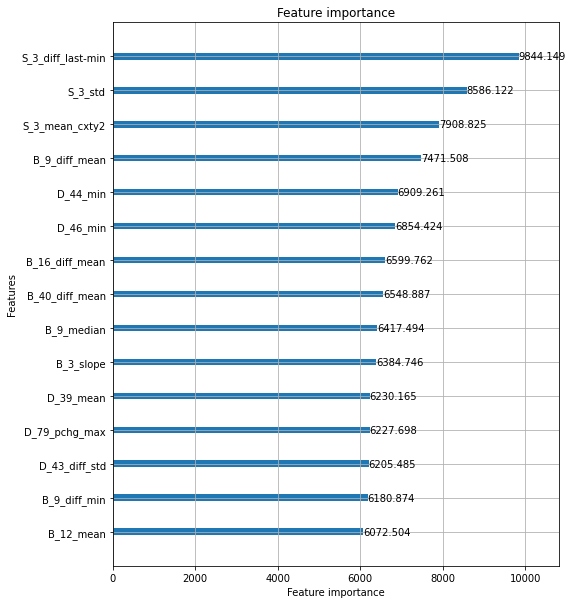

removed: ['S_3_diff_last-min', 'S_3_std', 'S_3_mean_cxty2', 'D_44_min', 'B_9_median']
Elapsed time: 2.3613324681917827 min.
----------------------------------------------------------------------------------------------------
ITER: 66/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.648547


[100]	valid_0's auc: 0.671906


[150]	valid_0's auc: 0.689859


[200]	valid_0's auc: 0.701574


[250]	valid_0's auc: 0.711509


[300]	valid_0's auc: 0.71876


[350]	valid_0's auc: 0.725096


[400]	valid_0's auc: 0.730383


[450]	valid_0's auc: 0.735269


[500]	valid_0's auc: 0.739355
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.739355


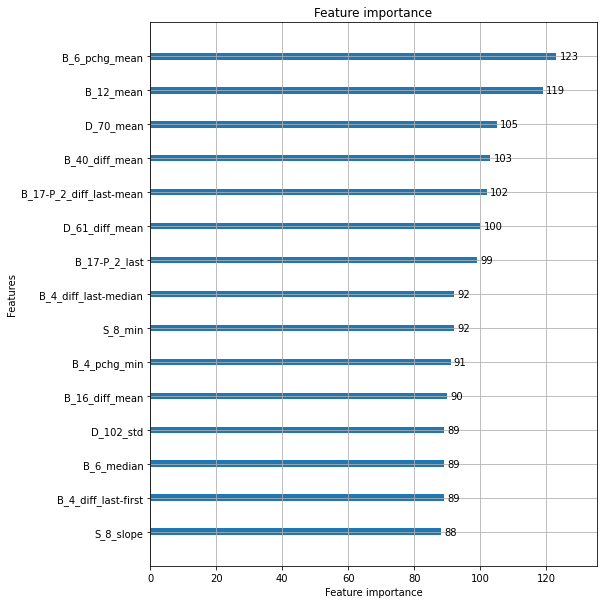

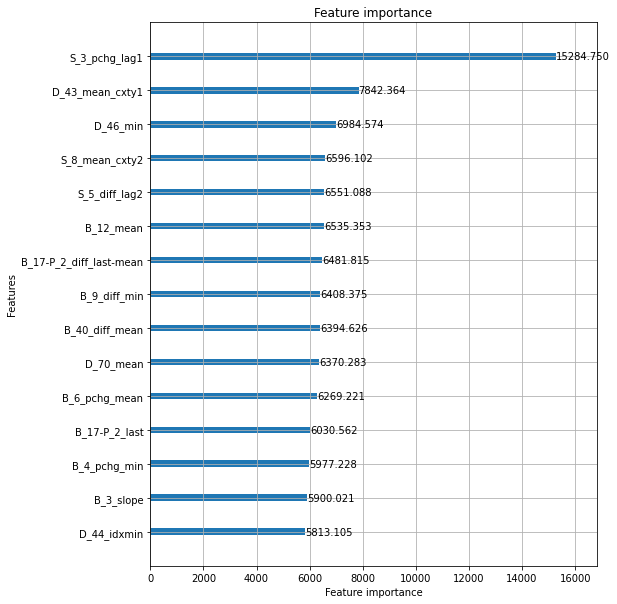

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.648477


[100]	valid_0's auc: 0.673095


[150]	valid_0's auc: 0.689095


[200]	valid_0's auc: 0.700974


[250]	valid_0's auc: 0.711624


[300]	valid_0's auc: 0.718798


[350]	valid_0's auc: 0.725318


[400]	valid_0's auc: 0.730834


[450]	valid_0's auc: 0.735533


[500]	valid_0's auc: 0.740376
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.740376


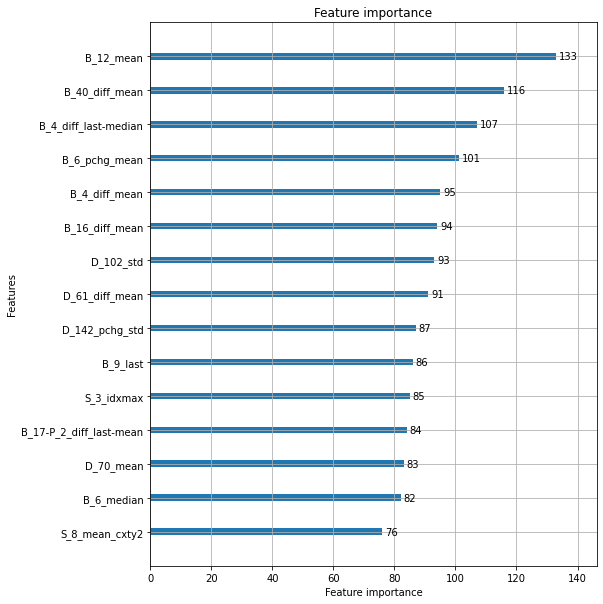

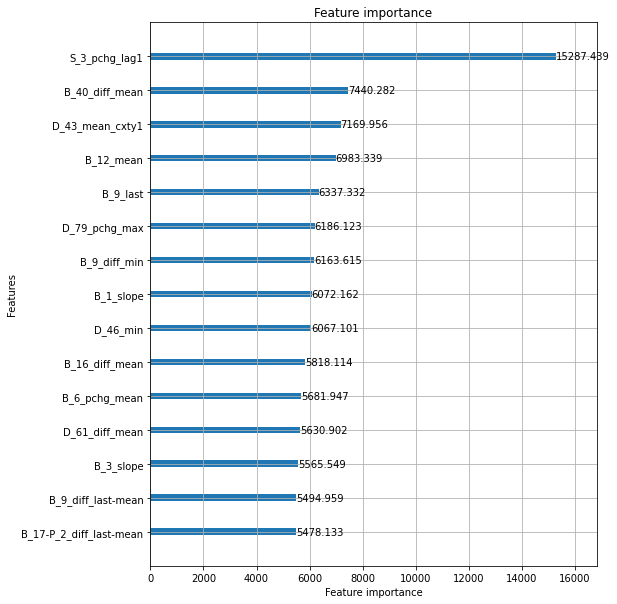

removed: ['S_3_pchg_lag1', 'D_43_mean_cxty1', 'B_40_diff_mean', 'B_12_mean', 'D_46_min']
Elapsed time: 2.3682939847310385 min.
----------------------------------------------------------------------------------------------------
ITER: 67/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.648212


[100]	valid_0's auc: 0.672163


[150]	valid_0's auc: 0.689006


[200]	valid_0's auc: 0.701154


[250]	valid_0's auc: 0.711007


[300]	valid_0's auc: 0.718458


[350]	valid_0's auc: 0.725036


[400]	valid_0's auc: 0.730759


[450]	valid_0's auc: 0.735372


[500]	valid_0's auc: 0.739667
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.739667


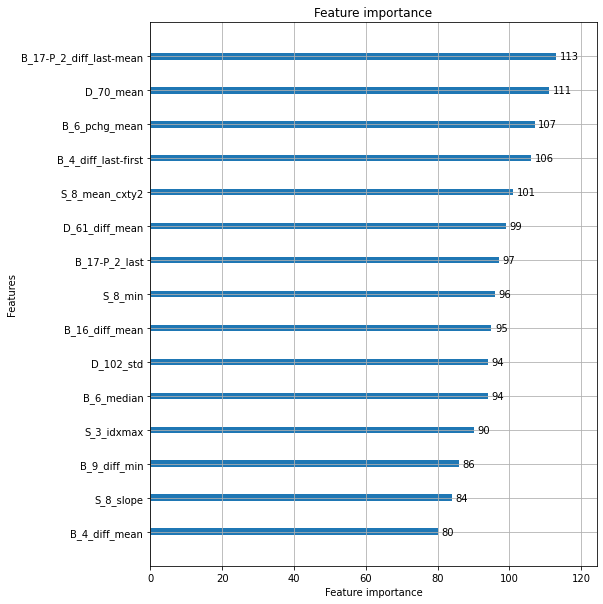

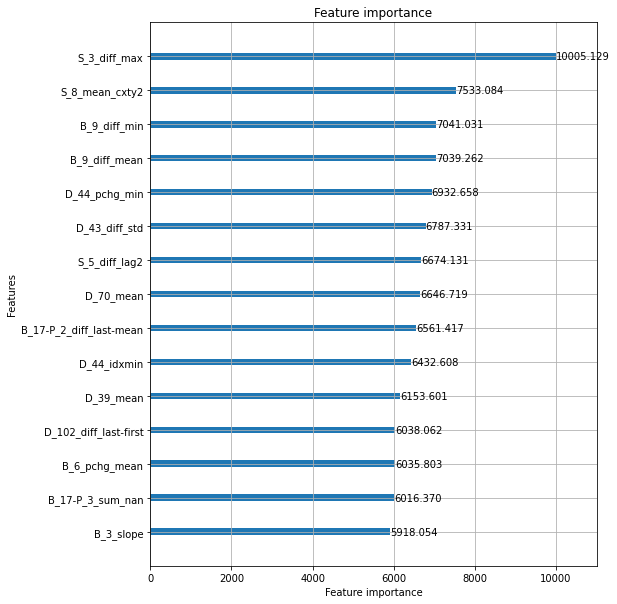

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.64907


[100]	valid_0's auc: 0.672386


[150]	valid_0's auc: 0.689044


[200]	valid_0's auc: 0.70065


[250]	valid_0's auc: 0.709539


[300]	valid_0's auc: 0.717144


[350]	valid_0's auc: 0.723964


[400]	valid_0's auc: 0.730149


[450]	valid_0's auc: 0.735397


[500]	valid_0's auc: 0.740224
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.740224


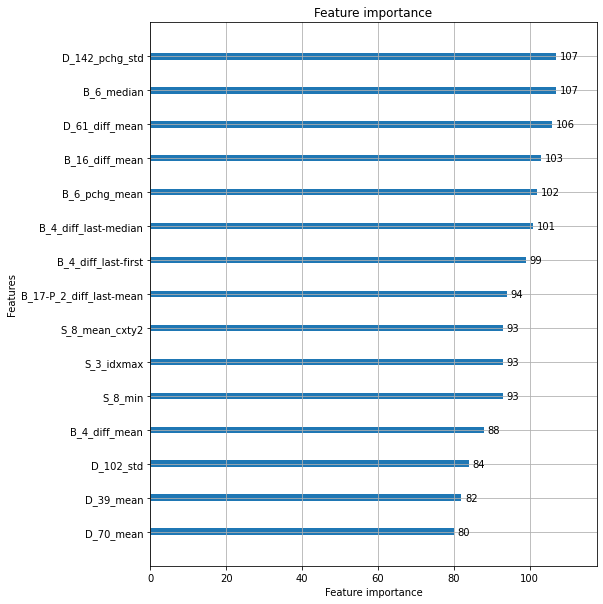

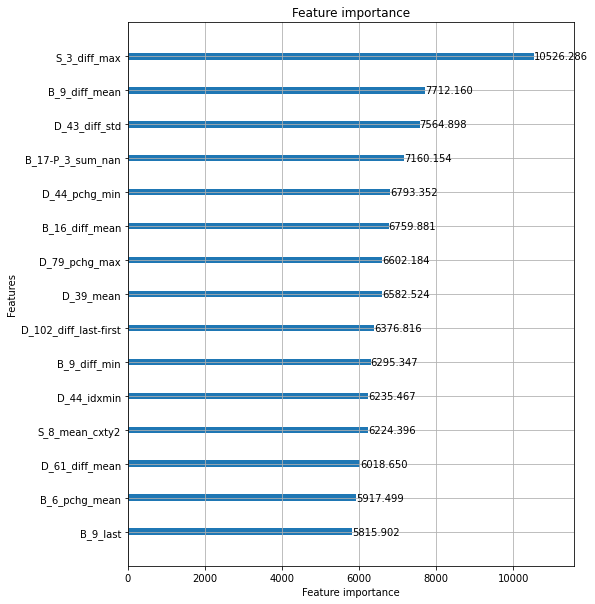

removed: ['S_3_diff_max', 'B_9_diff_mean', 'D_43_diff_std', 'S_8_mean_cxty2', 'D_44_pchg_min']
Elapsed time: 2.3276111125946044 min.
----------------------------------------------------------------------------------------------------
ITER: 68/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.647773


[100]	valid_0's auc: 0.671737


[150]	valid_0's auc: 0.688283


[200]	valid_0's auc: 0.700461


[250]	valid_0's auc: 0.710154


[300]	valid_0's auc: 0.717723


[350]	valid_0's auc: 0.724573


[400]	valid_0's auc: 0.729875


[450]	valid_0's auc: 0.734462


[500]	valid_0's auc: 0.739124
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.739124


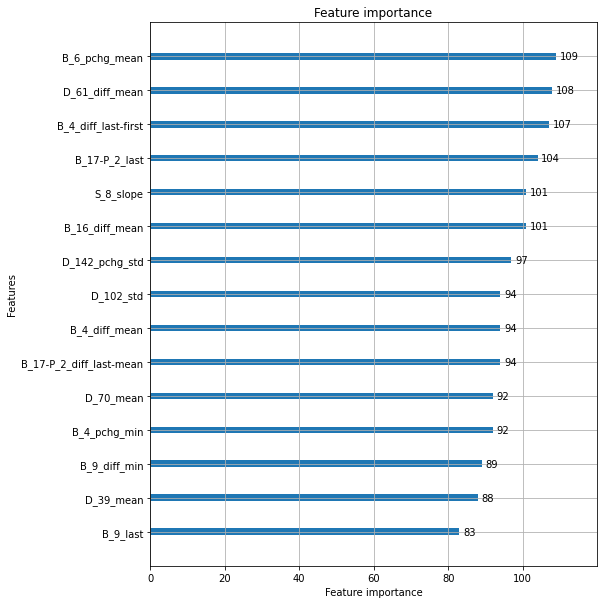

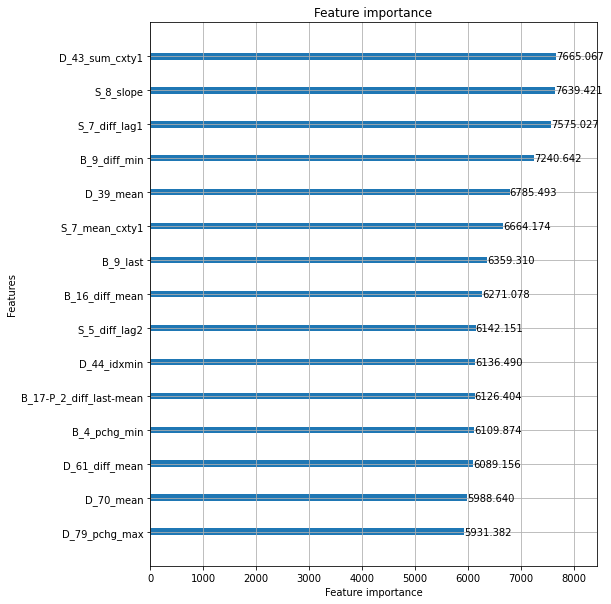

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.646421


[100]	valid_0's auc: 0.670717


[150]	valid_0's auc: 0.687069


[200]	valid_0's auc: 0.699186


[250]	valid_0's auc: 0.708706


[300]	valid_0's auc: 0.716562


[350]	valid_0's auc: 0.722574


[400]	valid_0's auc: 0.728347


[450]	valid_0's auc: 0.733771


[500]	valid_0's auc: 0.738725
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.738725


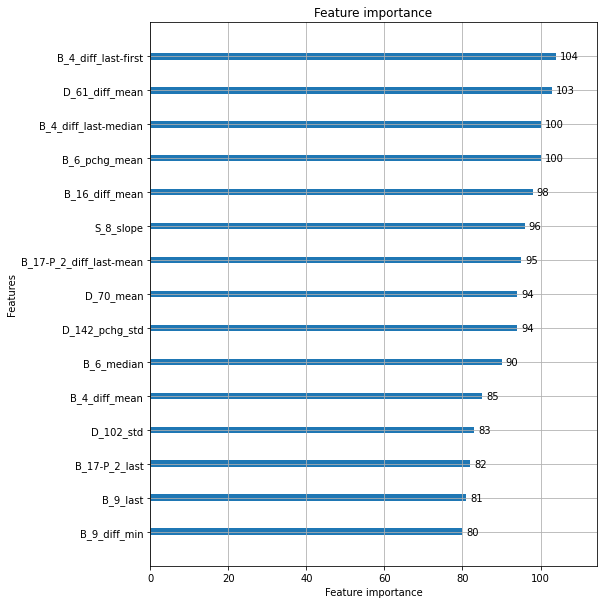

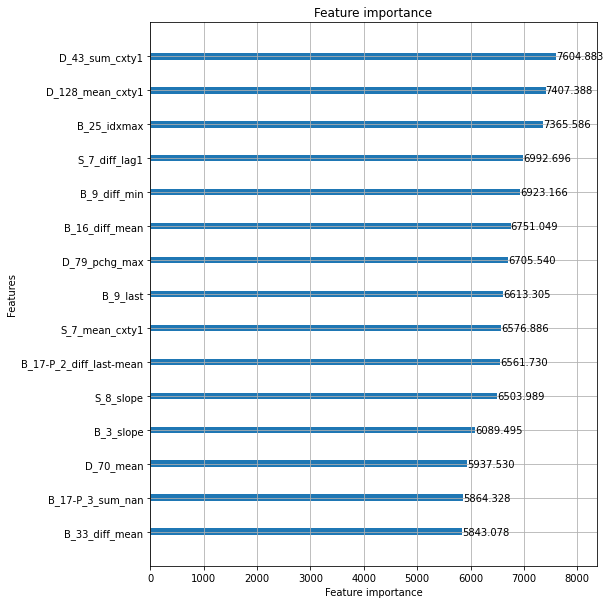

removed: ['D_43_sum_cxty1', 'S_7_diff_lag1', 'B_9_diff_min', 'S_8_slope', 'S_7_mean_cxty1']
Elapsed time: 2.3589009920756023 min.
----------------------------------------------------------------------------------------------------
ITER: 69/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.64747


[100]	valid_0's auc: 0.67084


[150]	valid_0's auc: 0.687512


[200]	valid_0's auc: 0.698843


[250]	valid_0's auc: 0.708322


[300]	valid_0's auc: 0.715688


[350]	valid_0's auc: 0.722195


[400]	valid_0's auc: 0.727886


[450]	valid_0's auc: 0.733132


[500]	valid_0's auc: 0.737652
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.737652


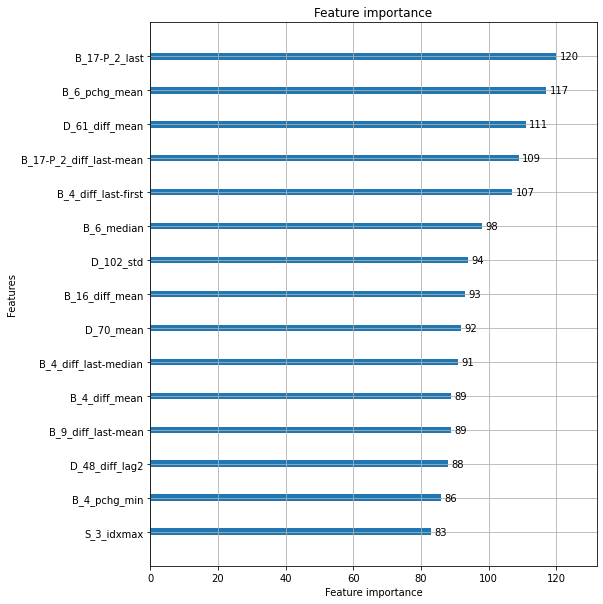

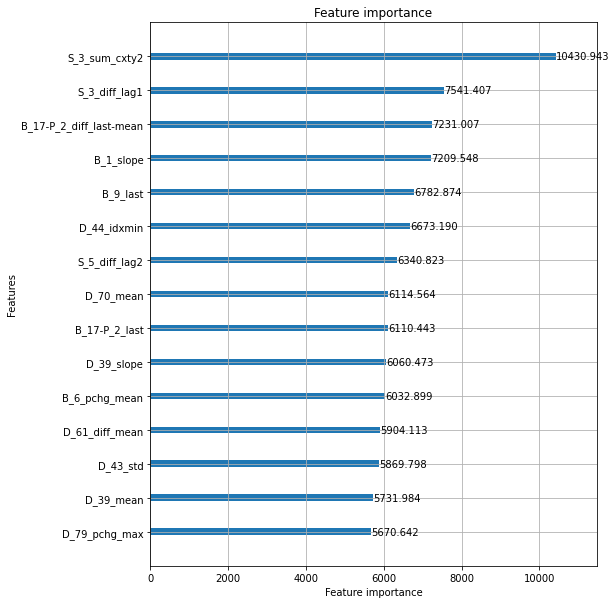

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.646122


[100]	valid_0's auc: 0.669935


[150]	valid_0's auc: 0.686684


[200]	valid_0's auc: 0.69923


[250]	valid_0's auc: 0.708179


[300]	valid_0's auc: 0.715511


[350]	valid_0's auc: 0.722239


[400]	valid_0's auc: 0.727543


[450]	valid_0's auc: 0.732226


[500]	valid_0's auc: 0.736541
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.736541


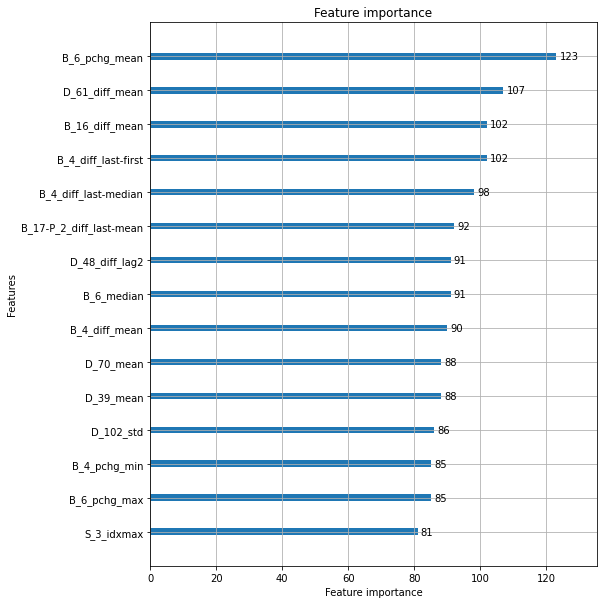

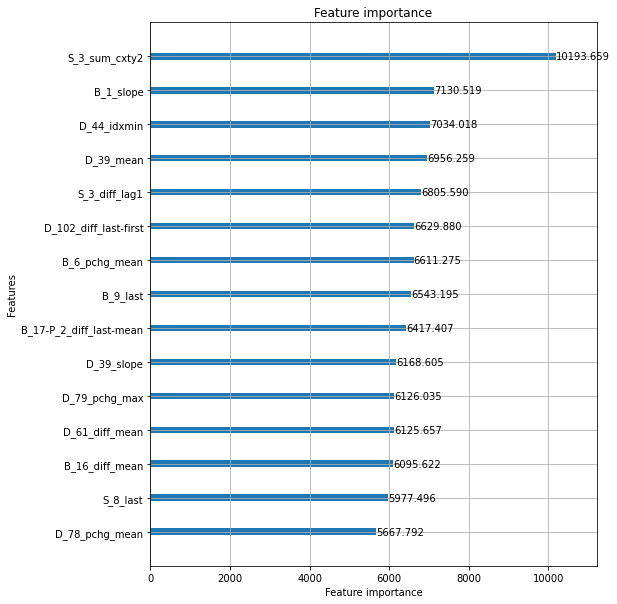

removed: ['S_3_sum_cxty2', 'S_3_diff_lag1', 'B_1_slope', 'D_44_idxmin', 'B_17-P_2_diff_last-mean']
Elapsed time: 2.3016056577364603 min.
----------------------------------------------------------------------------------------------------
ITER: 70/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.644771


[100]	valid_0's auc: 0.669946


[150]	valid_0's auc: 0.6866


[200]	valid_0's auc: 0.698304


[250]	valid_0's auc: 0.707827


[300]	valid_0's auc: 0.715118


[350]	valid_0's auc: 0.72161


[400]	valid_0's auc: 0.726898


[450]	valid_0's auc: 0.731429


[500]	valid_0's auc: 0.735599
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.735599


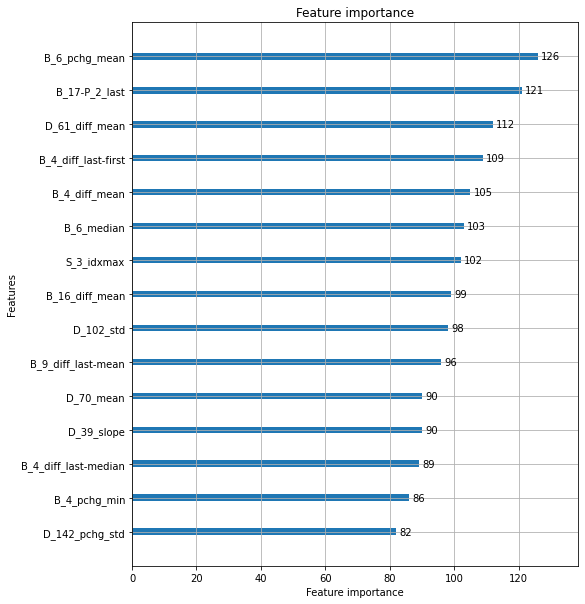

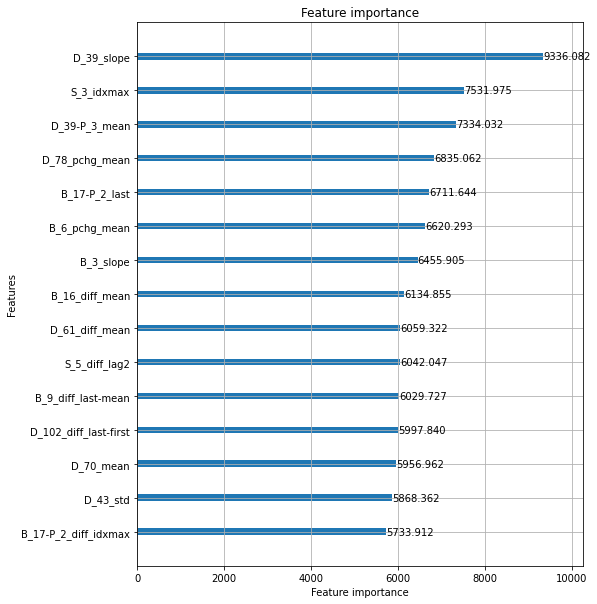

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.643607


[100]	valid_0's auc: 0.669231


[150]	valid_0's auc: 0.685472


[200]	valid_0's auc: 0.696536


[250]	valid_0's auc: 0.705529


[300]	valid_0's auc: 0.713417


[350]	valid_0's auc: 0.719889


[400]	valid_0's auc: 0.725857


[450]	valid_0's auc: 0.73104


[500]	valid_0's auc: 0.735329
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.735329


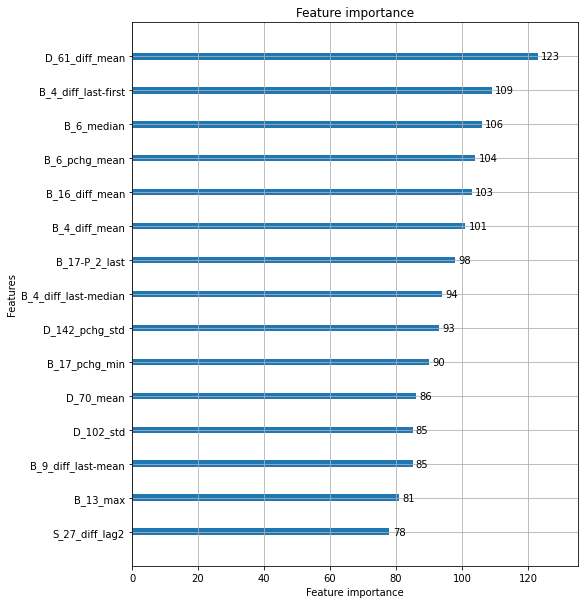

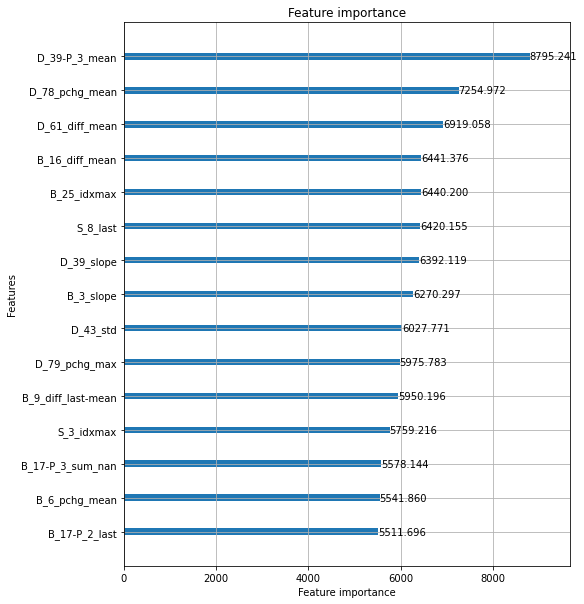

removed: ['D_39-P_3_mean', 'D_39_slope', 'D_78_pchg_mean', 'S_3_idxmax', 'D_61_diff_mean']
Elapsed time: 2.317879231770833 min.
----------------------------------------------------------------------------------------------------
ITER: 71/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.643983


[100]	valid_0's auc: 0.667758


[150]	valid_0's auc: 0.683501


[200]	valid_0's auc: 0.695485


[250]	valid_0's auc: 0.704001


[300]	valid_0's auc: 0.712224


[350]	valid_0's auc: 0.718337


[400]	valid_0's auc: 0.723728


[450]	valid_0's auc: 0.728365


[500]	valid_0's auc: 0.733273
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.733273


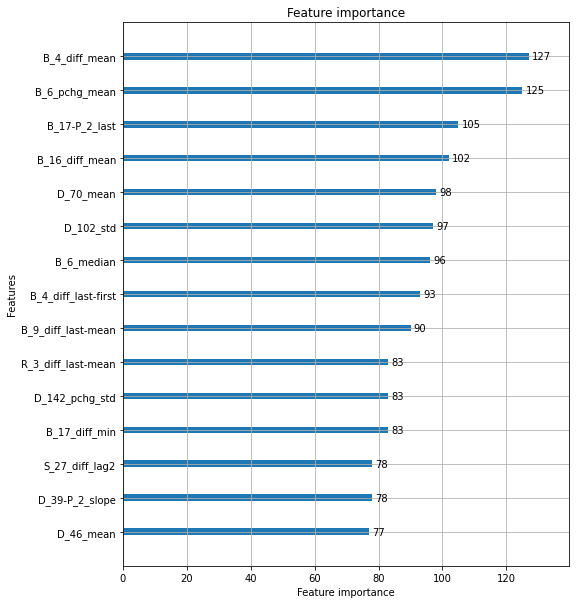

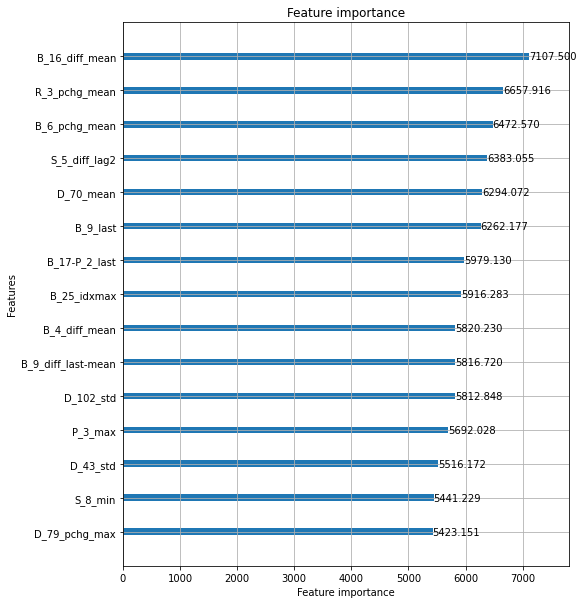

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.643408


[100]	valid_0's auc: 0.666305


[150]	valid_0's auc: 0.682248


[200]	valid_0's auc: 0.693919


[250]	valid_0's auc: 0.702499


[300]	valid_0's auc: 0.71075


[350]	valid_0's auc: 0.716652


[400]	valid_0's auc: 0.722851


[450]	valid_0's auc: 0.727478


[500]	valid_0's auc: 0.732722
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.732722


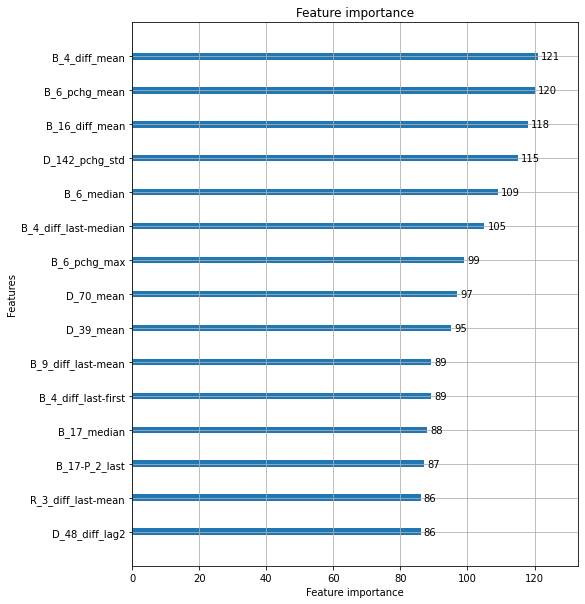

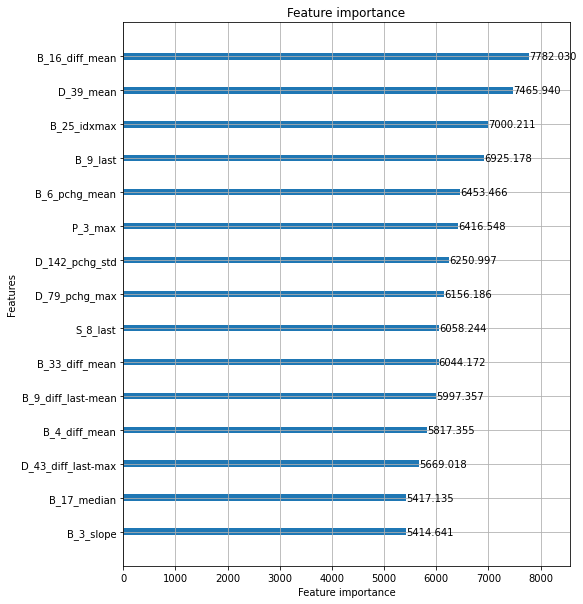

removed: ['B_16_diff_mean', 'B_9_last', 'B_6_pchg_mean', 'B_25_idxmax', 'P_3_max']
Elapsed time: 2.26839728752772 min.
----------------------------------------------------------------------------------------------------
ITER: 72/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.644966


[100]	valid_0's auc: 0.666535


[150]	valid_0's auc: 0.682031


[200]	valid_0's auc: 0.693192


[250]	valid_0's auc: 0.701982


[300]	valid_0's auc: 0.709096


[350]	valid_0's auc: 0.71597


[400]	valid_0's auc: 0.721368


[450]	valid_0's auc: 0.726212


[500]	valid_0's auc: 0.730497
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.730497


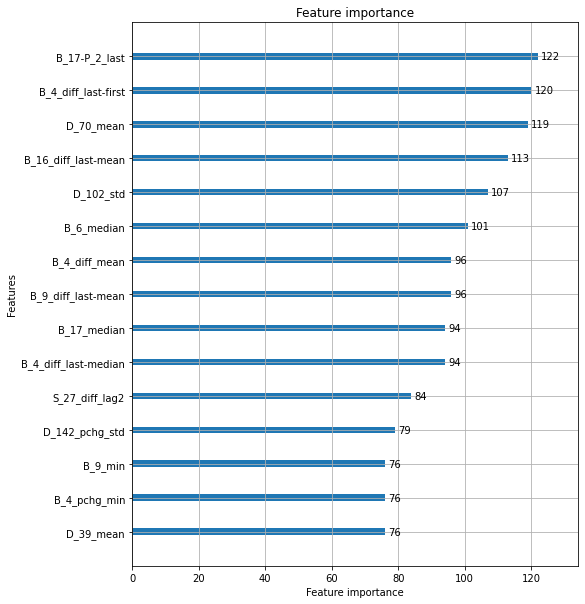

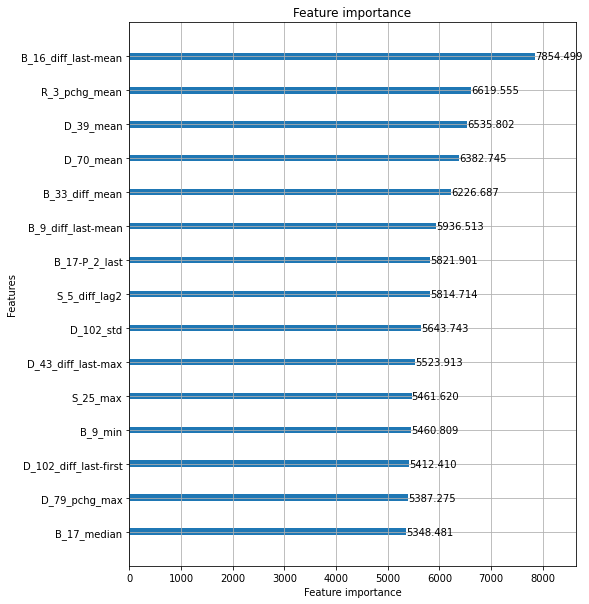

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.643199


[100]	valid_0's auc: 0.665525


[150]	valid_0's auc: 0.681508


[200]	valid_0's auc: 0.692828


[250]	valid_0's auc: 0.701568


[300]	valid_0's auc: 0.70939


[350]	valid_0's auc: 0.716681


[400]	valid_0's auc: 0.722085


[450]	valid_0's auc: 0.727058


[500]	valid_0's auc: 0.731346
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.731346


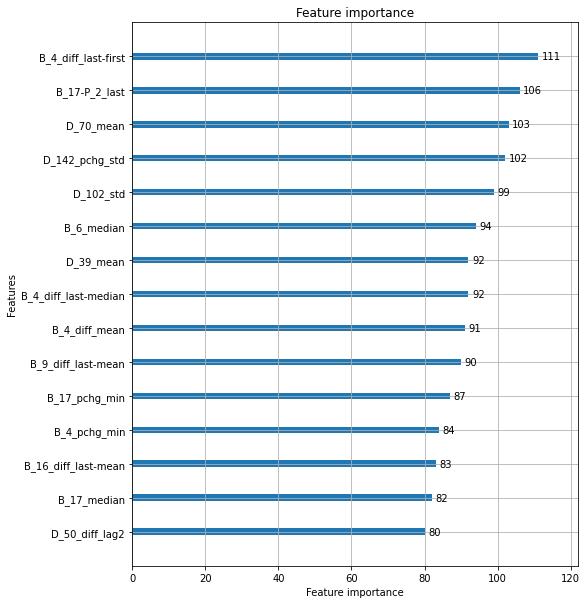

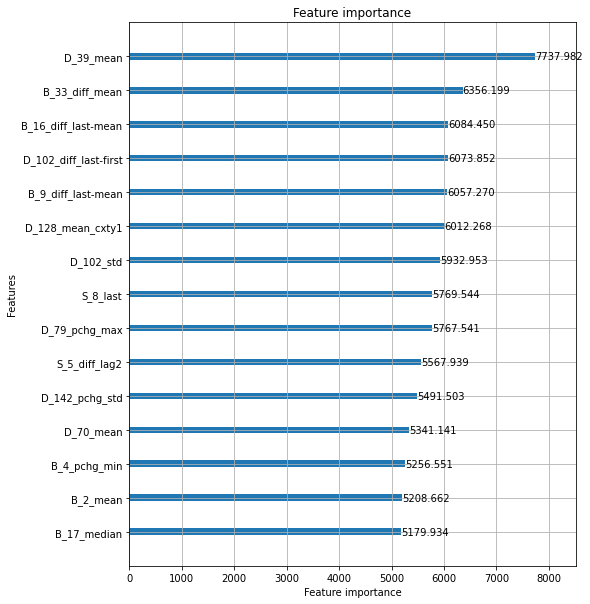

removed: ['D_39_mean', 'B_16_diff_last-mean', 'B_33_diff_mean', 'B_9_diff_last-mean', 'D_70_mean']
Elapsed time: 2.3054892500241597 min.
----------------------------------------------------------------------------------------------------
ITER: 73/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.641397


[100]	valid_0's auc: 0.663913


[150]	valid_0's auc: 0.679402


[200]	valid_0's auc: 0.68985


[250]	valid_0's auc: 0.699195


[300]	valid_0's auc: 0.706869


[350]	valid_0's auc: 0.712836


[400]	valid_0's auc: 0.718655


[450]	valid_0's auc: 0.724015


[500]	valid_0's auc: 0.728835
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.728835


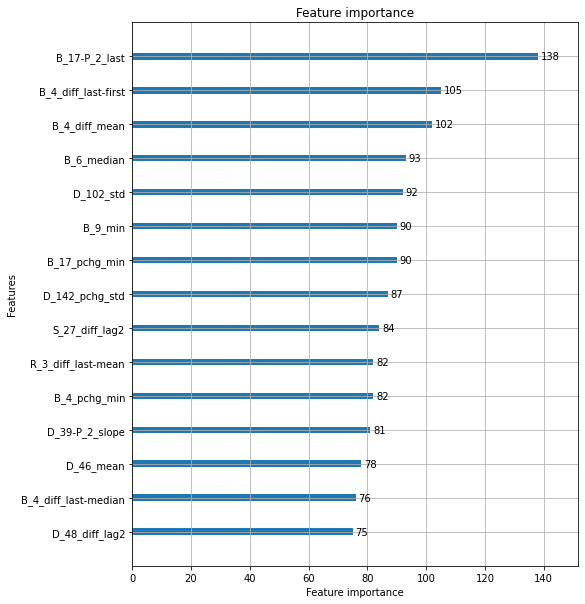

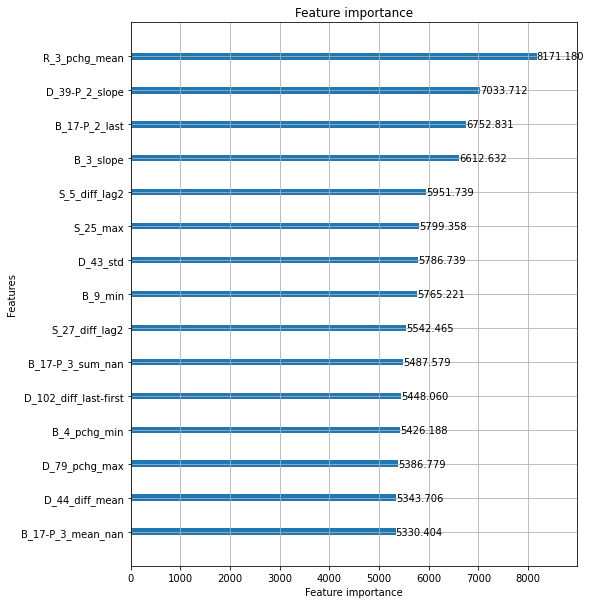

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.639725


[100]	valid_0's auc: 0.663371


[150]	valid_0's auc: 0.67856


[200]	valid_0's auc: 0.690086


[250]	valid_0's auc: 0.699808


[300]	valid_0's auc: 0.707609


[350]	valid_0's auc: 0.71386


[400]	valid_0's auc: 0.719437


[450]	valid_0's auc: 0.724388


[500]	valid_0's auc: 0.729285
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.729285


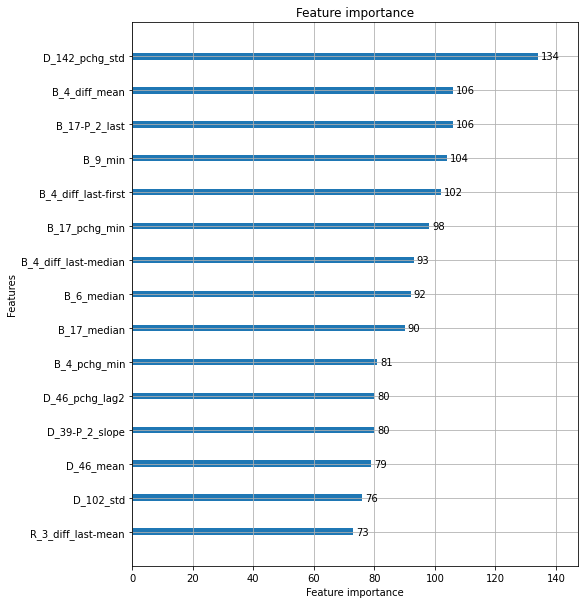

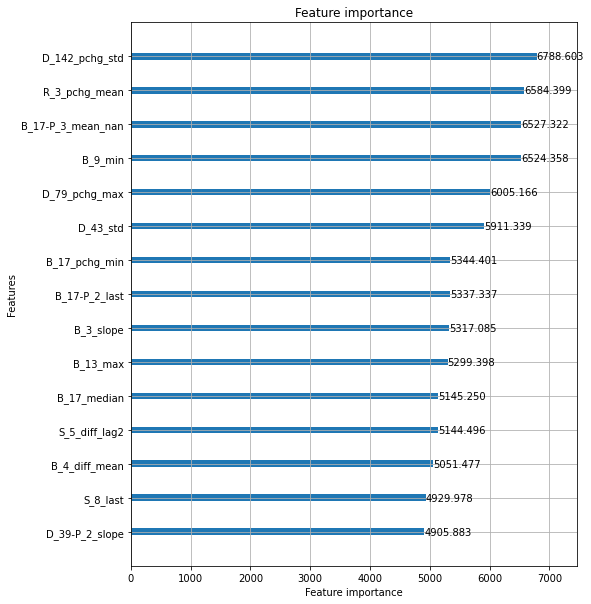

removed: ['R_3_pchg_mean', 'B_9_min', 'B_17-P_2_last', 'D_39-P_2_slope', 'B_3_slope']
Elapsed time: 2.2672730763753255 min.
----------------------------------------------------------------------------------------------------
ITER: 74/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.642147


[100]	valid_0's auc: 0.66386


[150]	valid_0's auc: 0.679144


[200]	valid_0's auc: 0.691005


[250]	valid_0's auc: 0.699669


[300]	valid_0's auc: 0.706375


[350]	valid_0's auc: 0.712592


[400]	valid_0's auc: 0.717678


[450]	valid_0's auc: 0.722478


[500]	valid_0's auc: 0.72754
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.72754


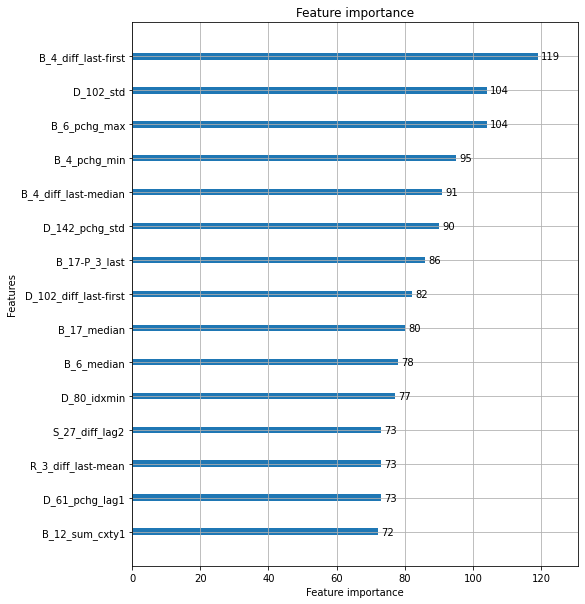

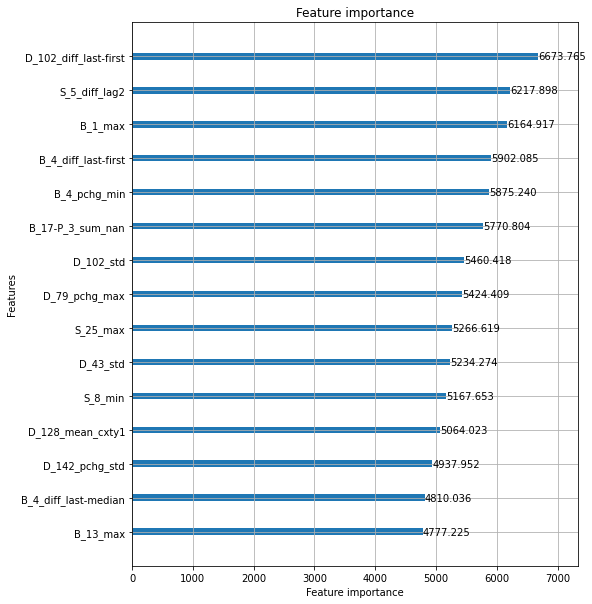

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.640104


[100]	valid_0's auc: 0.662889


[150]	valid_0's auc: 0.677452


[200]	valid_0's auc: 0.69002


[250]	valid_0's auc: 0.69891


[300]	valid_0's auc: 0.706519


[350]	valid_0's auc: 0.71223


[400]	valid_0's auc: 0.71775


[450]	valid_0's auc: 0.722418


[500]	valid_0's auc: 0.726949
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.726949


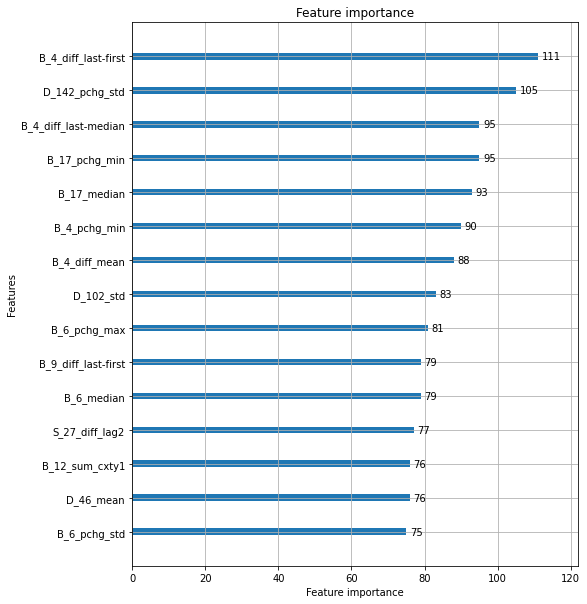

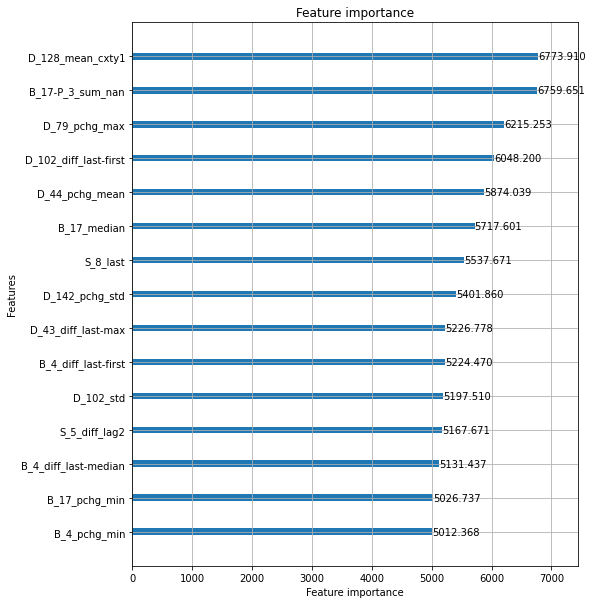

removed: ['D_102_diff_last-first', 'B_17-P_3_sum_nan', 'D_128_mean_cxty1', 'D_79_pchg_max', 'S_5_diff_lag2']
Elapsed time: 2.2941824913024904 min.
----------------------------------------------------------------------------------------------------
ITER: 75/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.640119


[100]	valid_0's auc: 0.660927


[150]	valid_0's auc: 0.676037


[200]	valid_0's auc: 0.687035


[250]	valid_0's auc: 0.695493


[300]	valid_0's auc: 0.70289


[350]	valid_0's auc: 0.709254


[400]	valid_0's auc: 0.714766


[450]	valid_0's auc: 0.720346


[500]	valid_0's auc: 0.724825
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.724825


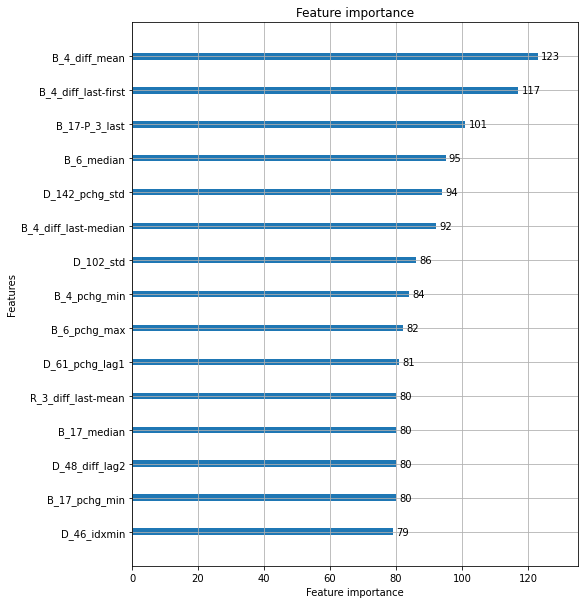

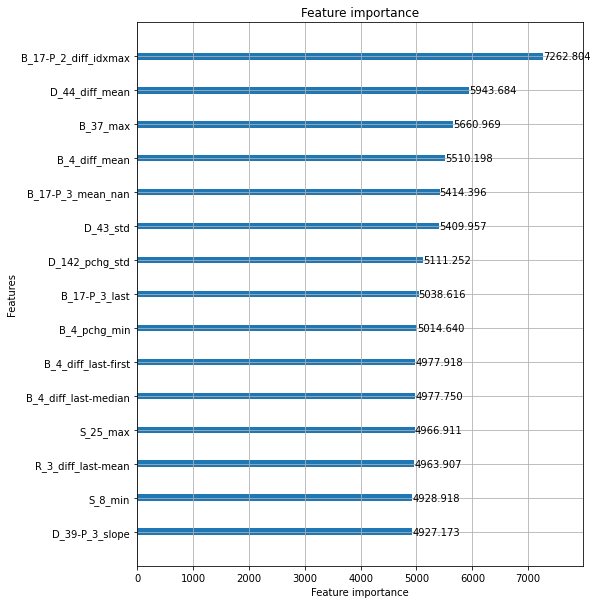

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.639294


[100]	valid_0's auc: 0.661466


[150]	valid_0's auc: 0.675888


[200]	valid_0's auc: 0.686996


[250]	valid_0's auc: 0.695347


[300]	valid_0's auc: 0.702807


[350]	valid_0's auc: 0.709432


[400]	valid_0's auc: 0.714665


[450]	valid_0's auc: 0.719864


[500]	valid_0's auc: 0.724718
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.724718


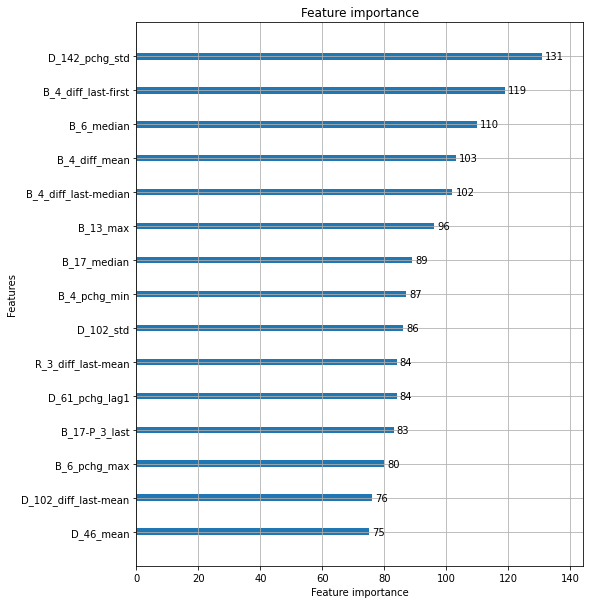

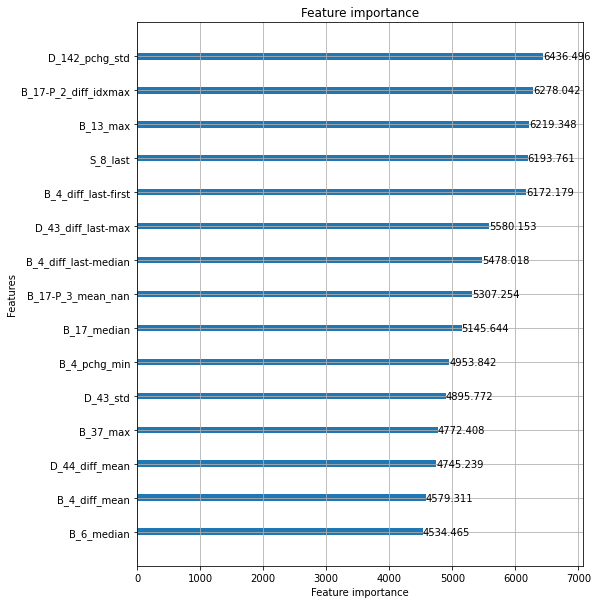

removed: ['B_17-P_2_diff_idxmax', 'D_142_pchg_std', 'B_4_diff_last-first', 'B_17-P_3_mean_nan', 'D_44_diff_mean']
Elapsed time: 2.2494751771291095 min.
----------------------------------------------------------------------------------------------------
ITER: 76/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.638755


[100]	valid_0's auc: 0.660885


[150]	valid_0's auc: 0.675578


[200]	valid_0's auc: 0.686579


[250]	valid_0's auc: 0.695271


[300]	valid_0's auc: 0.702494


[350]	valid_0's auc: 0.708188


[400]	valid_0's auc: 0.713759


[450]	valid_0's auc: 0.719403


[500]	valid_0's auc: 0.724162
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.724162


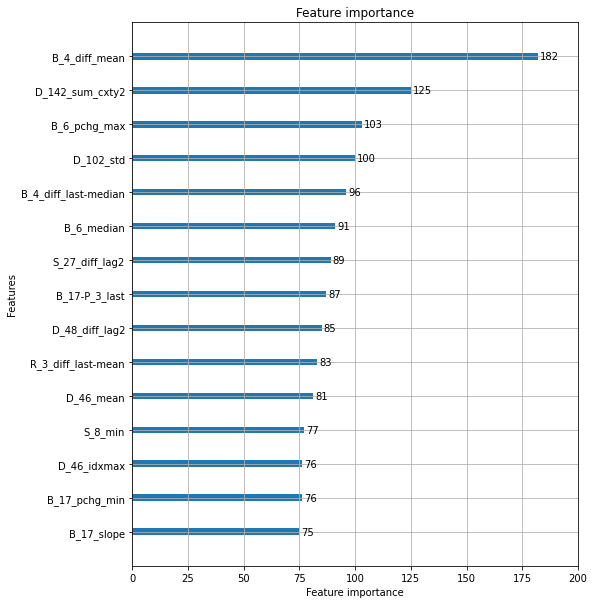

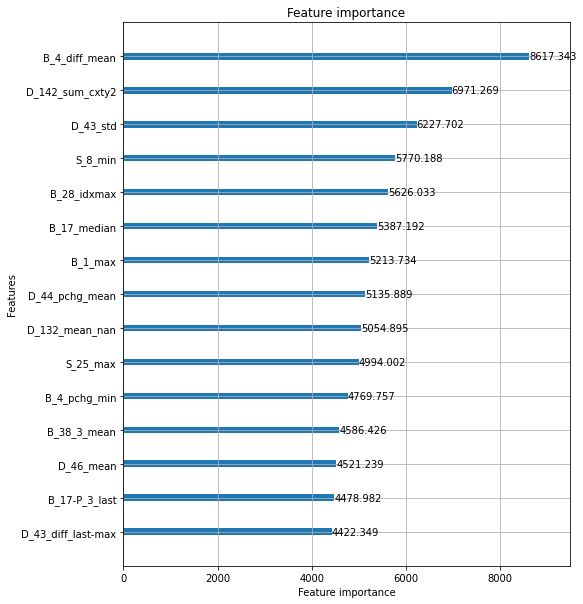

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.637305


[100]	valid_0's auc: 0.660316


[150]	valid_0's auc: 0.674217


[200]	valid_0's auc: 0.685682


[250]	valid_0's auc: 0.69433


[300]	valid_0's auc: 0.702409


[350]	valid_0's auc: 0.708364


[400]	valid_0's auc: 0.71408


[450]	valid_0's auc: 0.718906


[500]	valid_0's auc: 0.723393
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.723393


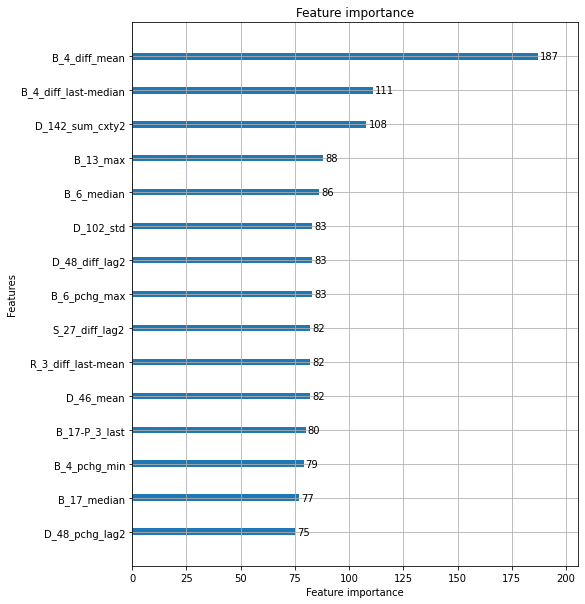

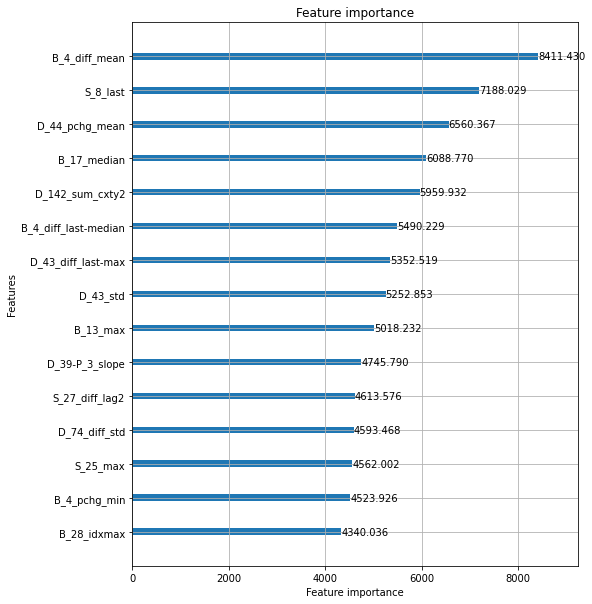

removed: ['B_4_diff_mean', 'D_142_sum_cxty2', 'D_44_pchg_mean', 'S_8_last', 'D_43_std']
Elapsed time: 2.243619354565938 min.
----------------------------------------------------------------------------------------------------
ITER: 77/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.638072


[100]	valid_0's auc: 0.658007


[150]	valid_0's auc: 0.673526


[200]	valid_0's auc: 0.684625


[250]	valid_0's auc: 0.693576


[300]	valid_0's auc: 0.700444


[350]	valid_0's auc: 0.707007


[400]	valid_0's auc: 0.71216


[450]	valid_0's auc: 0.717395


[500]	valid_0's auc: 0.72183
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.72183


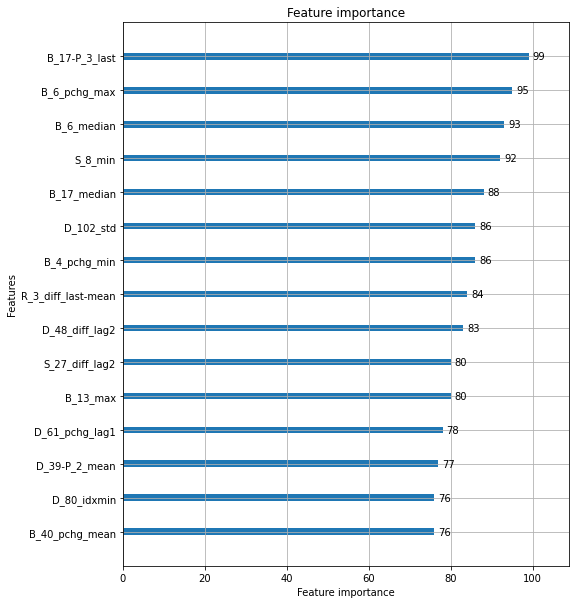

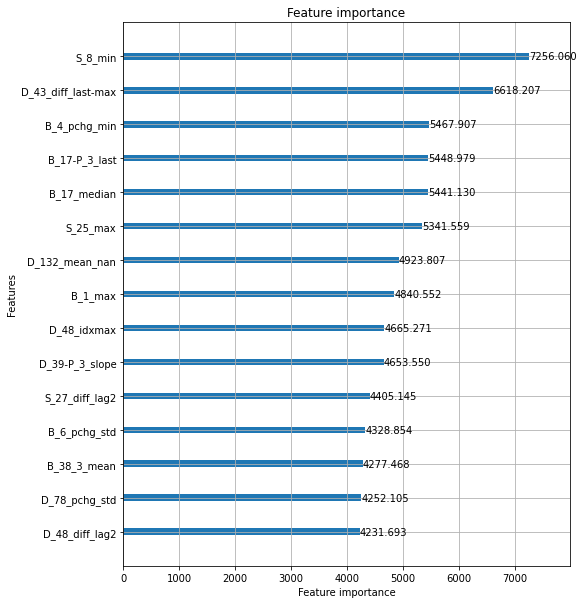

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.636736


[100]	valid_0's auc: 0.658768


[150]	valid_0's auc: 0.673128


[200]	valid_0's auc: 0.683942


[250]	valid_0's auc: 0.691881


[300]	valid_0's auc: 0.698914


[350]	valid_0's auc: 0.705662


[400]	valid_0's auc: 0.711053


[450]	valid_0's auc: 0.715631


[500]	valid_0's auc: 0.720275
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.720275


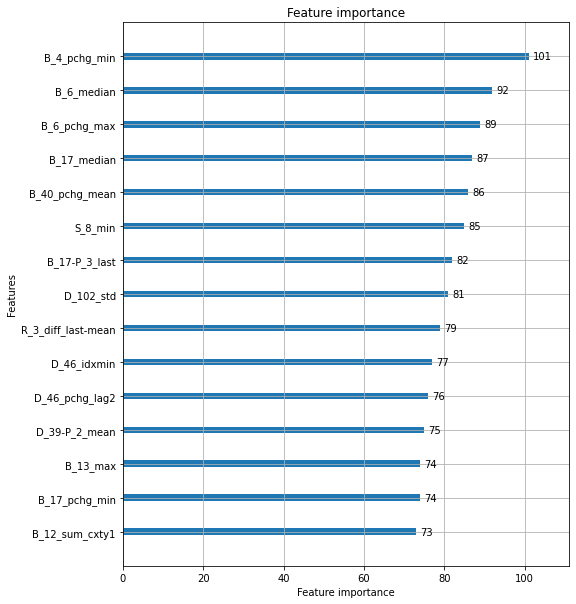

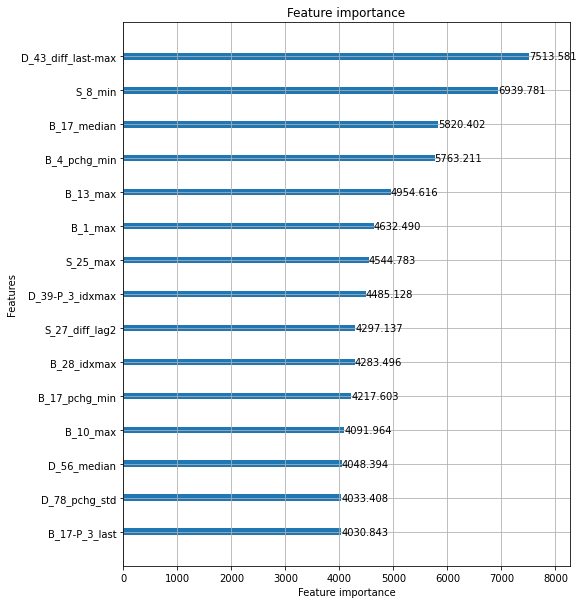

removed: ['S_8_min', 'D_43_diff_last-max', 'B_17_median', 'B_4_pchg_min', 'S_25_max']
Elapsed time: 2.253481086095174 min.
----------------------------------------------------------------------------------------------------
ITER: 78/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.634288


[100]	valid_0's auc: 0.655681


[150]	valid_0's auc: 0.669944


[200]	valid_0's auc: 0.681157


[250]	valid_0's auc: 0.690507


[300]	valid_0's auc: 0.697993


[350]	valid_0's auc: 0.704004


[400]	valid_0's auc: 0.709862


[450]	valid_0's auc: 0.715023


[500]	valid_0's auc: 0.719883
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.719883


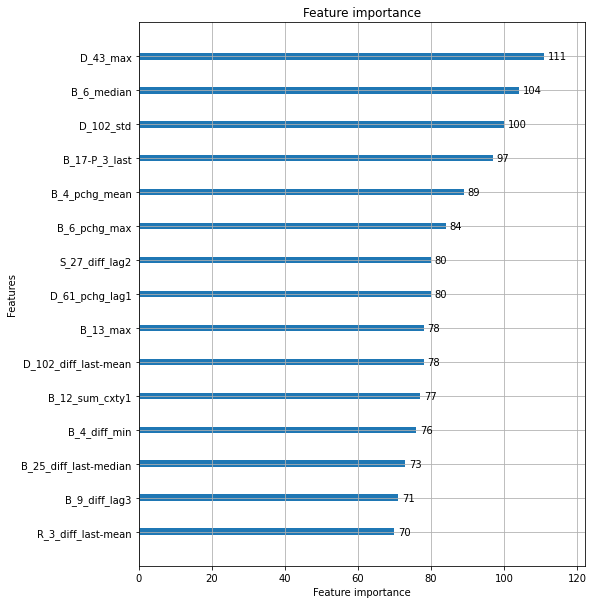

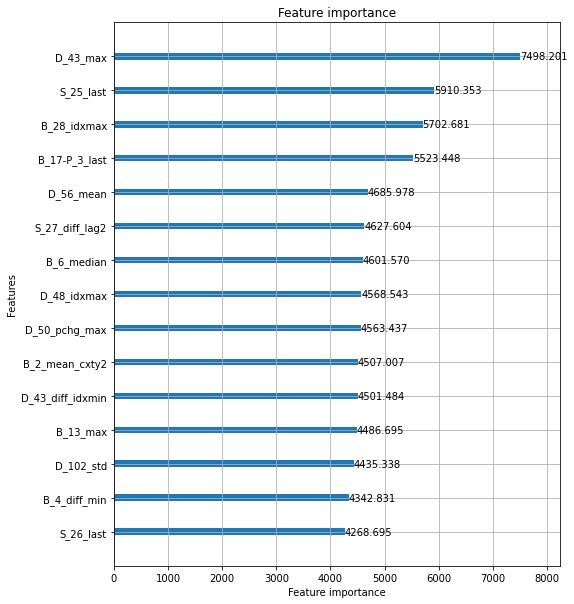

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.632986


[100]	valid_0's auc: 0.65508


[150]	valid_0's auc: 0.670316


[200]	valid_0's auc: 0.681677


[250]	valid_0's auc: 0.691193


[300]	valid_0's auc: 0.6985


[350]	valid_0's auc: 0.704343


[400]	valid_0's auc: 0.709471


[450]	valid_0's auc: 0.714367


[500]	valid_0's auc: 0.718744
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.718744


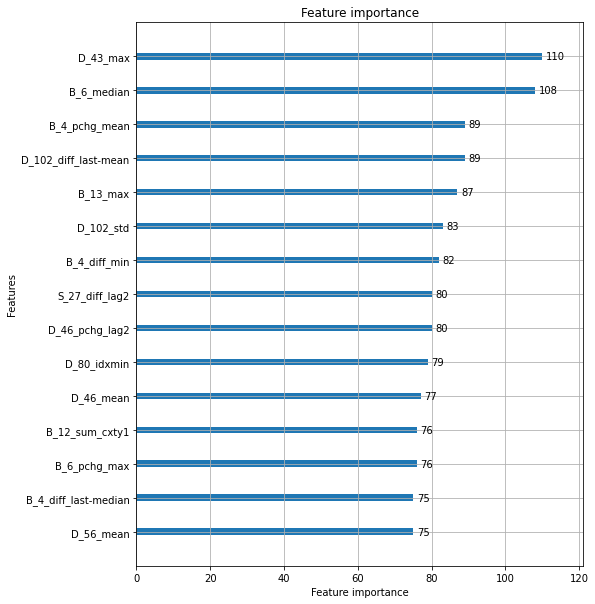

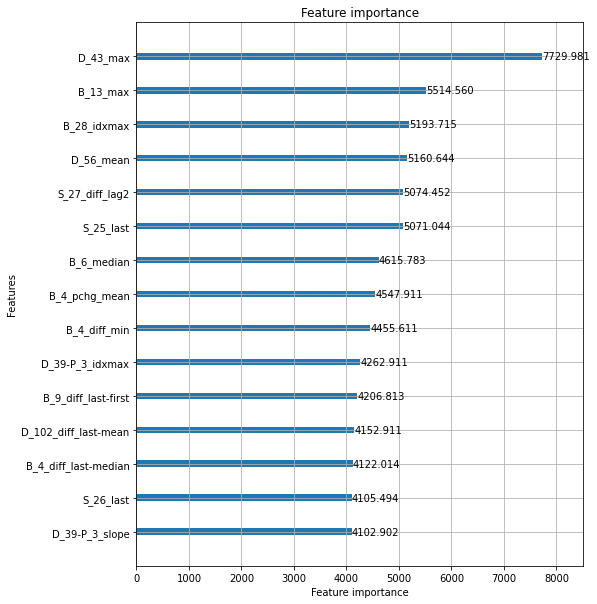

removed: ['D_43_max', 'S_25_last', 'B_28_idxmax', 'B_13_max', 'D_56_mean']
Elapsed time: 2.2206378897031147 min.
----------------------------------------------------------------------------------------------------
ITER: 79/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.631983


[100]	valid_0's auc: 0.653848


[150]	valid_0's auc: 0.668792


[200]	valid_0's auc: 0.679481


[250]	valid_0's auc: 0.688312


[300]	valid_0's auc: 0.69622


[350]	valid_0's auc: 0.702069


[400]	valid_0's auc: 0.707676


[450]	valid_0's auc: 0.712755


[500]	valid_0's auc: 0.717242
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.717242


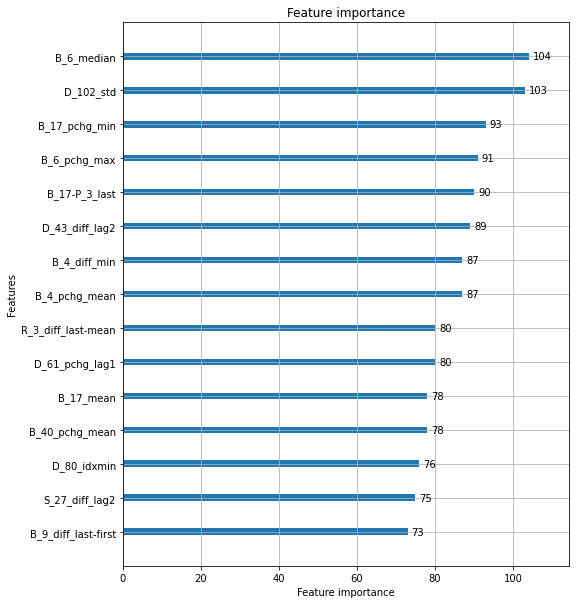

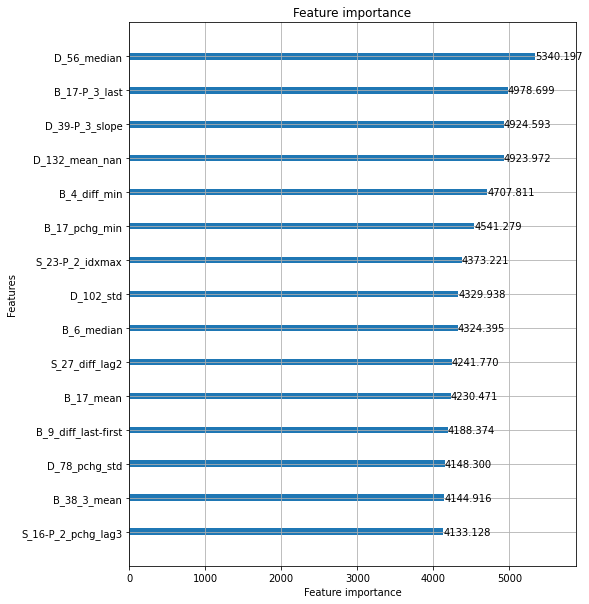

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.630417


[100]	valid_0's auc: 0.652531


[150]	valid_0's auc: 0.667134


[200]	valid_0's auc: 0.678641


[250]	valid_0's auc: 0.687543


[300]	valid_0's auc: 0.694603


[350]	valid_0's auc: 0.701147


[400]	valid_0's auc: 0.706607


[450]	valid_0's auc: 0.711388


[500]	valid_0's auc: 0.716089
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.716089


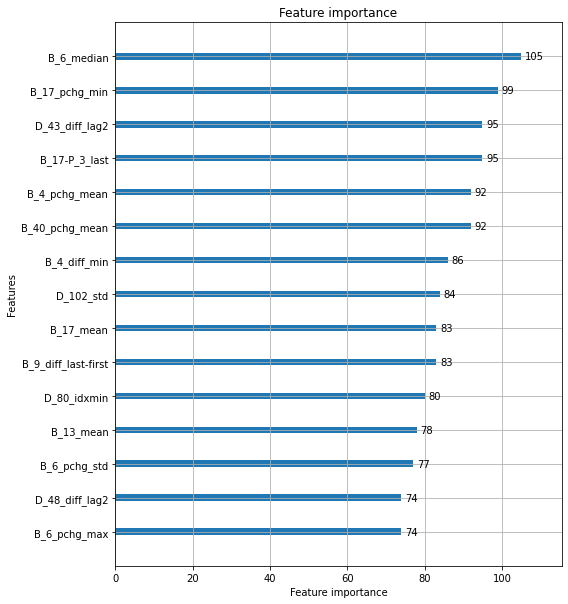

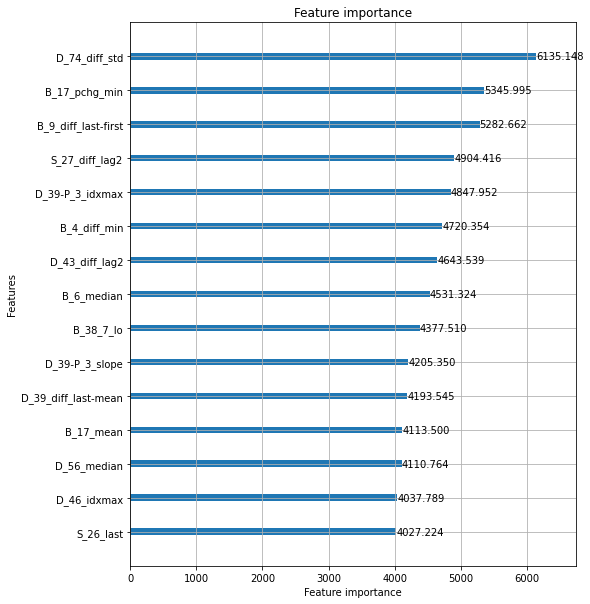

removed: ['B_17_pchg_min', 'B_9_diff_last-first', 'D_56_median', 'B_4_diff_min', 'S_27_diff_lag2']
Elapsed time: 2.2386228402455646 min.
----------------------------------------------------------------------------------------------------
ITER: 80/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.630426


[100]	valid_0's auc: 0.651166


[150]	valid_0's auc: 0.666473


[200]	valid_0's auc: 0.677079


[250]	valid_0's auc: 0.686052


[300]	valid_0's auc: 0.69366


[350]	valid_0's auc: 0.700102


[400]	valid_0's auc: 0.706017


[450]	valid_0's auc: 0.711239


[500]	valid_0's auc: 0.715651
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.715651


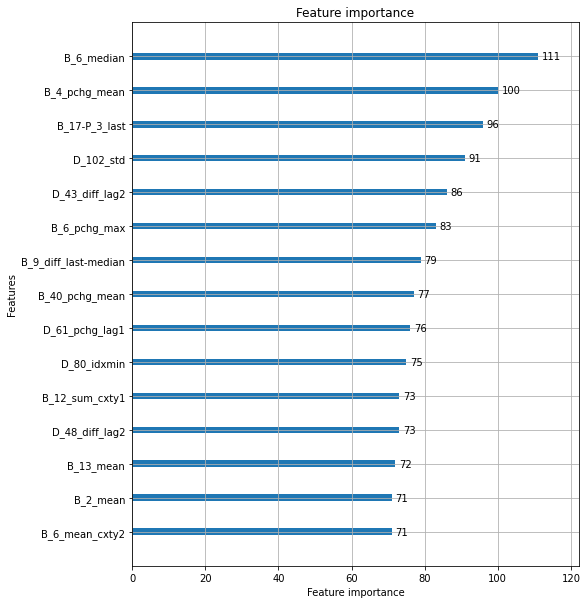

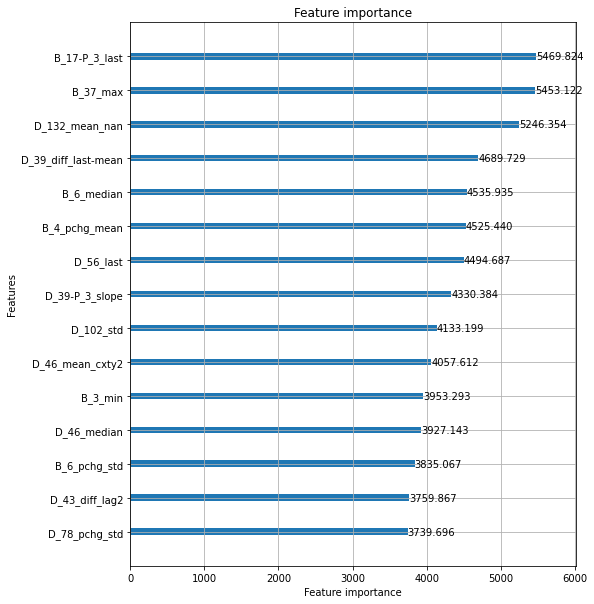

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.629713


[100]	valid_0's auc: 0.651615


[150]	valid_0's auc: 0.66641


[200]	valid_0's auc: 0.677036


[250]	valid_0's auc: 0.685945


[300]	valid_0's auc: 0.693543


[350]	valid_0's auc: 0.699369


[400]	valid_0's auc: 0.705864


[450]	valid_0's auc: 0.710922


[500]	valid_0's auc: 0.715048
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.715048


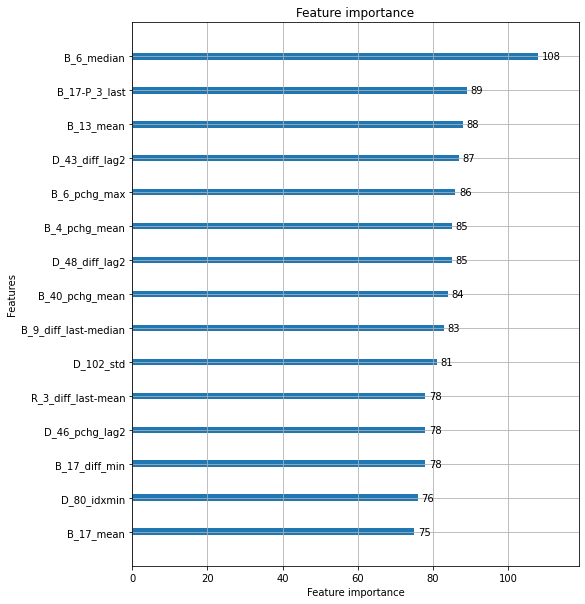

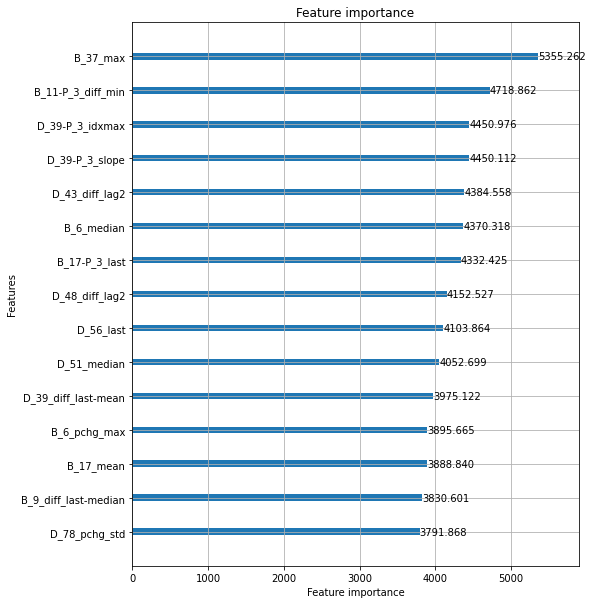

removed: ['B_37_max', 'B_17-P_3_last', 'B_6_median', 'D_132_mean_nan', 'D_39-P_3_slope']
Elapsed time: 2.209263730049133 min.
----------------------------------------------------------------------------------------------------
ITER: 81/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.629747


[100]	valid_0's auc: 0.649786


[150]	valid_0's auc: 0.665834


[200]	valid_0's auc: 0.676656


[250]	valid_0's auc: 0.685583


[300]	valid_0's auc: 0.69277


[350]	valid_0's auc: 0.699286


[400]	valid_0's auc: 0.704647


[450]	valid_0's auc: 0.709726


[500]	valid_0's auc: 0.713408
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.713408


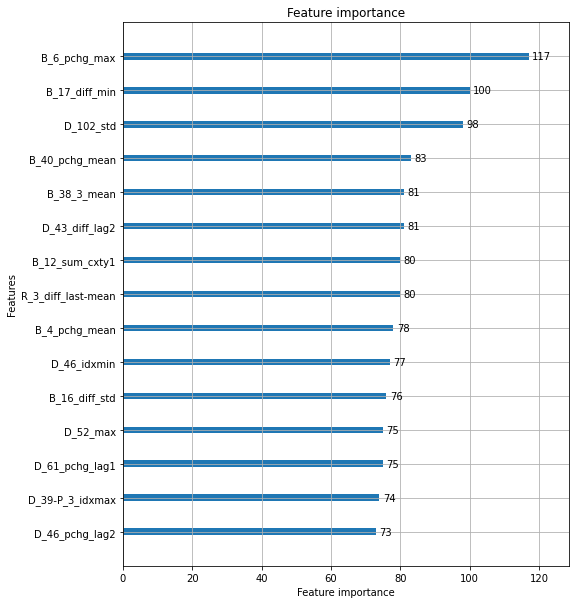

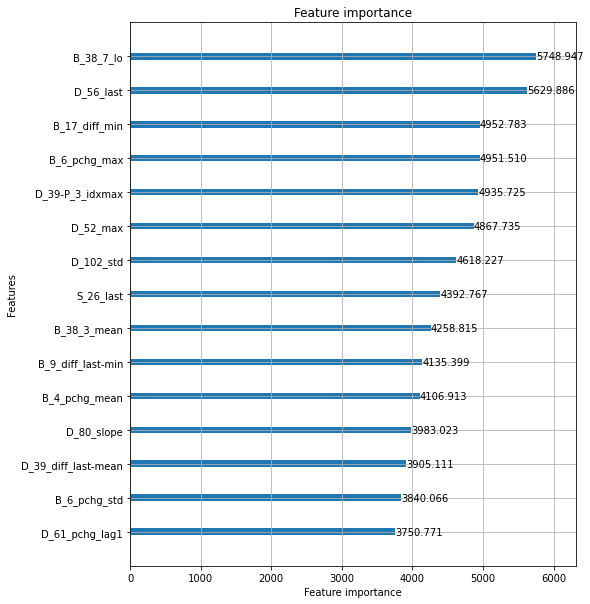

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.629046


[100]	valid_0's auc: 0.650064


[150]	valid_0's auc: 0.66545


[200]	valid_0's auc: 0.676535


[250]	valid_0's auc: 0.685086


[300]	valid_0's auc: 0.692721


[350]	valid_0's auc: 0.699427


[400]	valid_0's auc: 0.704363


[450]	valid_0's auc: 0.709074


[500]	valid_0's auc: 0.713486
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.713486


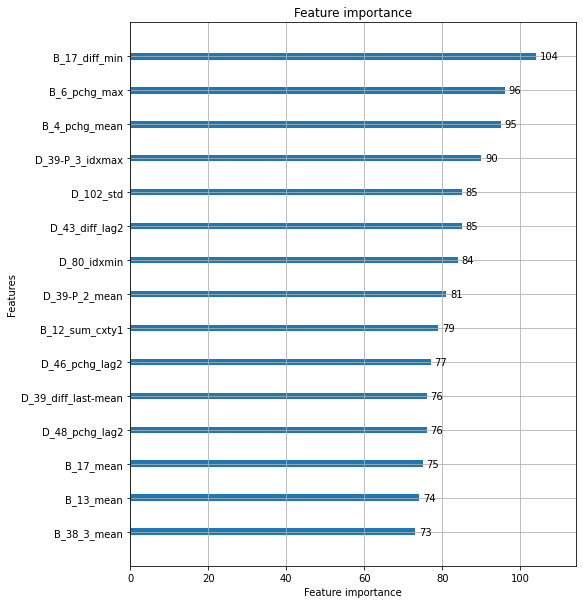

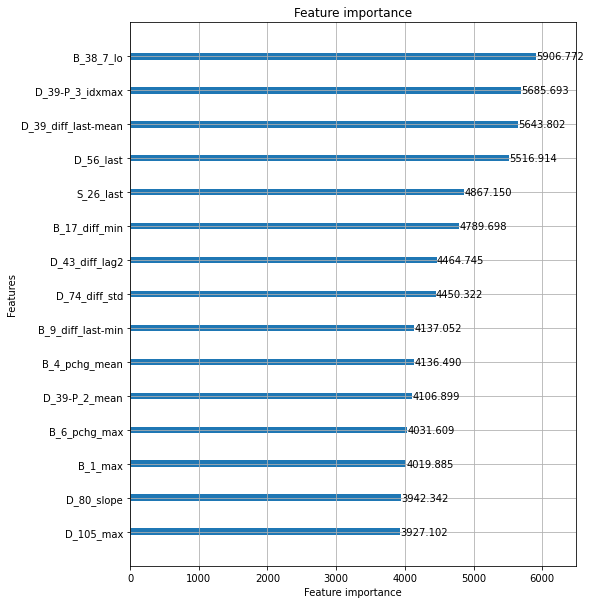

removed: ['B_38_7_lo', 'D_56_last', 'D_39-P_3_idxmax', 'B_17_diff_min', 'D_39_diff_last-mean']
Elapsed time: 2.2313878774642943 min.
----------------------------------------------------------------------------------------------------
ITER: 82/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.629711


[100]	valid_0's auc: 0.648798


[150]	valid_0's auc: 0.663859


[200]	valid_0's auc: 0.67495


[250]	valid_0's auc: 0.684065


[300]	valid_0's auc: 0.691651


[350]	valid_0's auc: 0.697927


[400]	valid_0's auc: 0.703746


[450]	valid_0's auc: 0.708812


[500]	valid_0's auc: 0.712922
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.712922


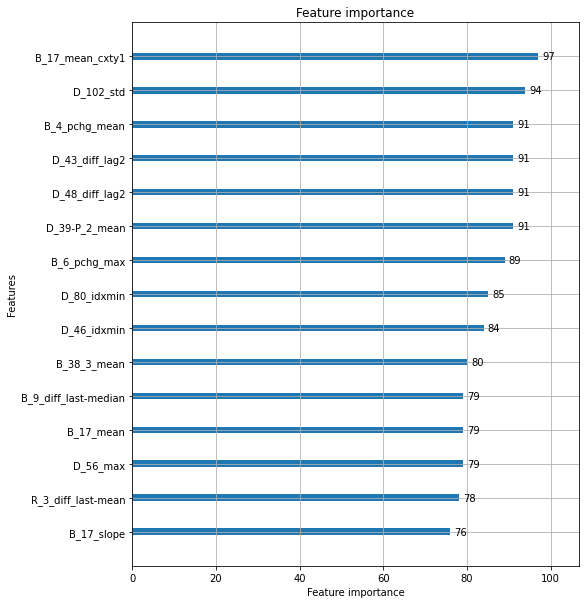

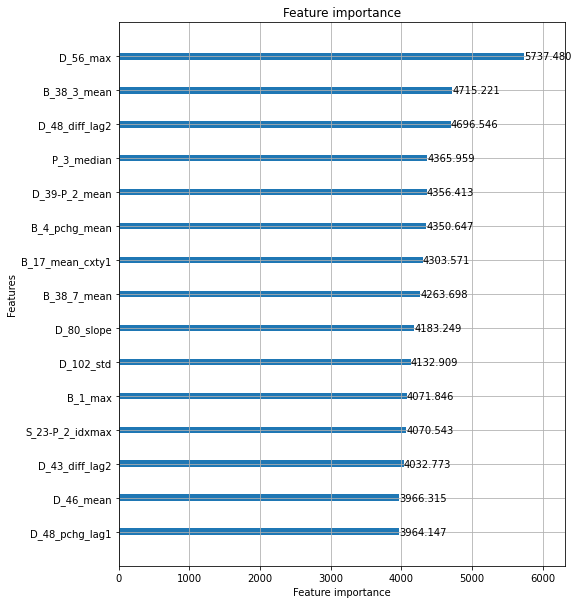

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.628089


[100]	valid_0's auc: 0.648878


[150]	valid_0's auc: 0.663828


[200]	valid_0's auc: 0.674788


[250]	valid_0's auc: 0.683762


[300]	valid_0's auc: 0.690774


[350]	valid_0's auc: 0.697244


[400]	valid_0's auc: 0.703074


[450]	valid_0's auc: 0.707858


[500]	valid_0's auc: 0.712152
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.712152


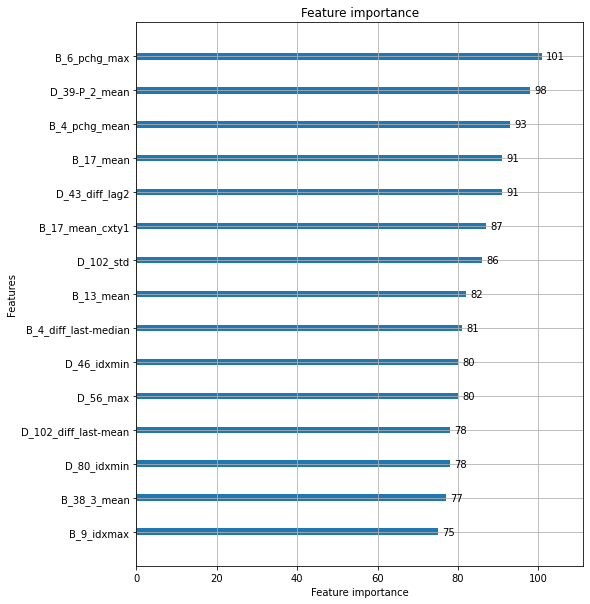

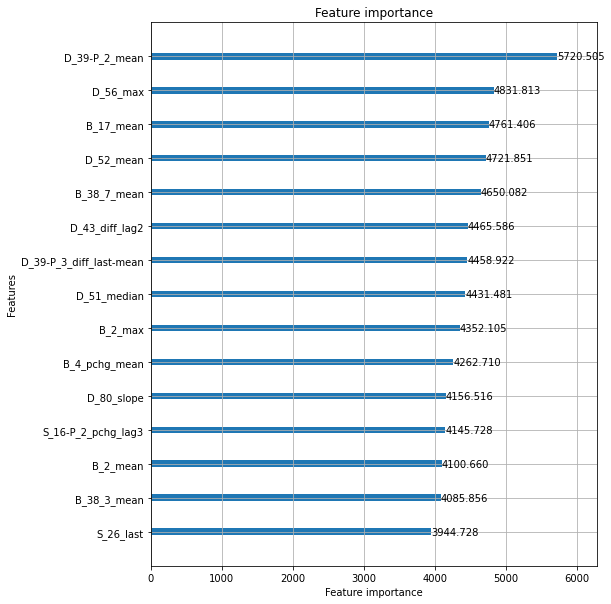

removed: ['D_56_max', 'D_39-P_2_mean', 'B_38_7_mean', 'B_38_3_mean', 'B_17_mean']
Elapsed time: 2.1846322655677795 min.
----------------------------------------------------------------------------------------------------
ITER: 83/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.627961


[100]	valid_0's auc: 0.648739


[150]	valid_0's auc: 0.663201


[200]	valid_0's auc: 0.674582


[250]	valid_0's auc: 0.683252


[300]	valid_0's auc: 0.690624


[350]	valid_0's auc: 0.696948


[400]	valid_0's auc: 0.702137


[450]	valid_0's auc: 0.706968


[500]	valid_0's auc: 0.711011
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.711011


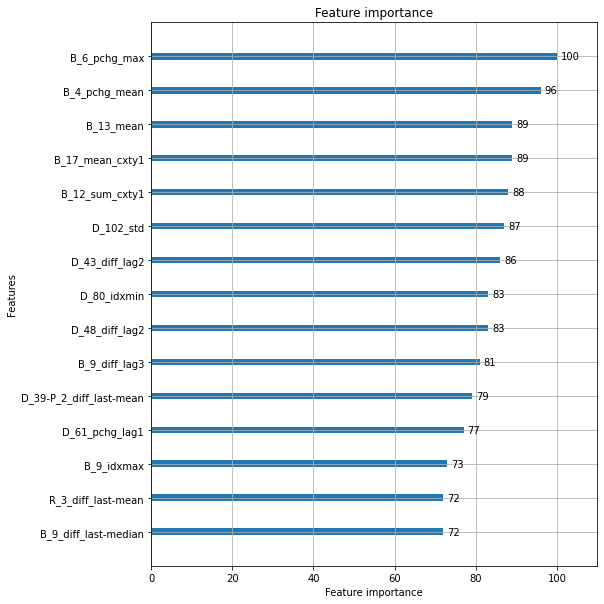

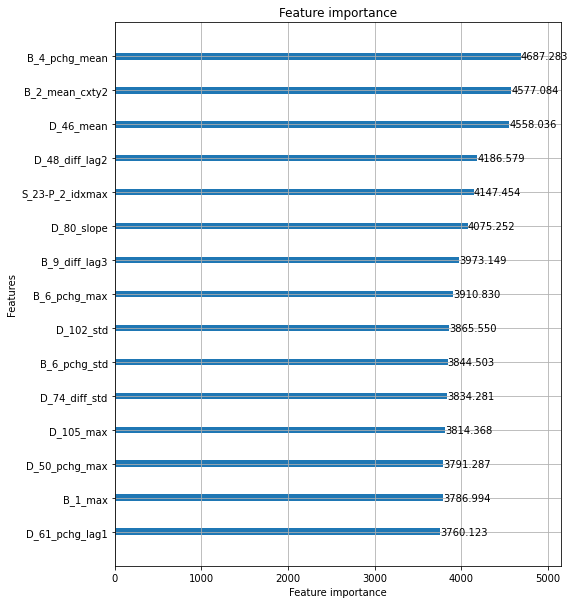

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.625567


[100]	valid_0's auc: 0.647


[150]	valid_0's auc: 0.662647


[200]	valid_0's auc: 0.673534


[250]	valid_0's auc: 0.682453


[300]	valid_0's auc: 0.689797


[350]	valid_0's auc: 0.696243


[400]	valid_0's auc: 0.702058


[450]	valid_0's auc: 0.706988


[500]	valid_0's auc: 0.71131
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.71131


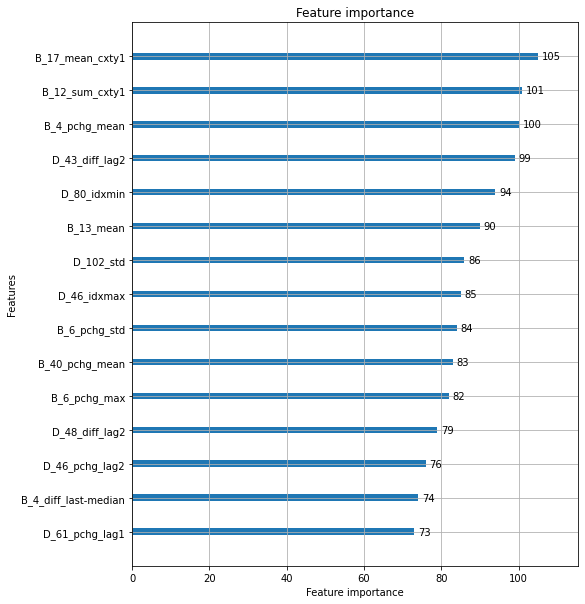

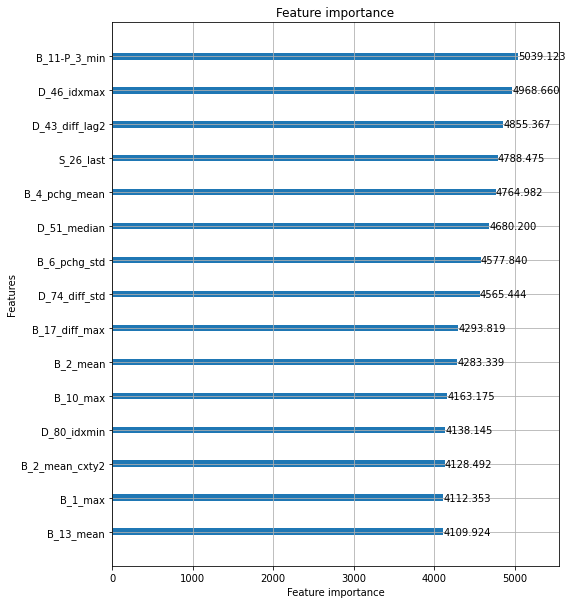

removed: ['B_4_pchg_mean', 'B_2_mean_cxty2', 'D_43_diff_lag2', 'B_6_pchg_std', 'D_51_median']
Elapsed time: 2.198513166109721 min.
----------------------------------------------------------------------------------------------------
ITER: 84/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.628507


[100]	valid_0's auc: 0.649319


[150]	valid_0's auc: 0.66291


[200]	valid_0's auc: 0.673504


[250]	valid_0's auc: 0.682326


[300]	valid_0's auc: 0.689556


[350]	valid_0's auc: 0.695474


[400]	valid_0's auc: 0.701142


[450]	valid_0's auc: 0.705761


[500]	valid_0's auc: 0.70973
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.70973


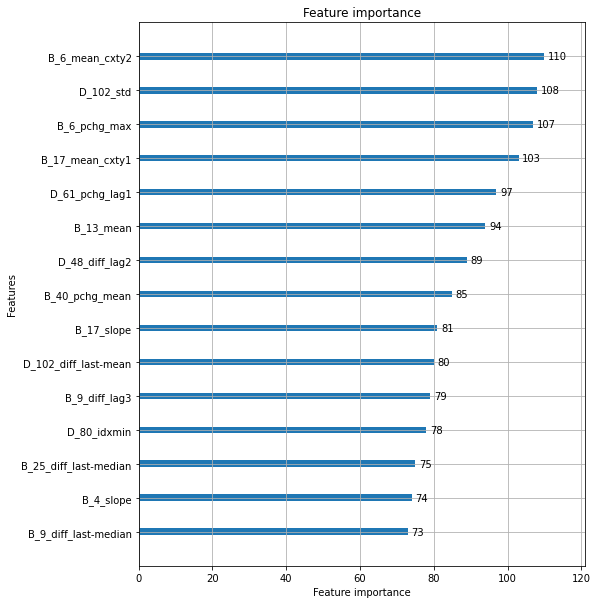

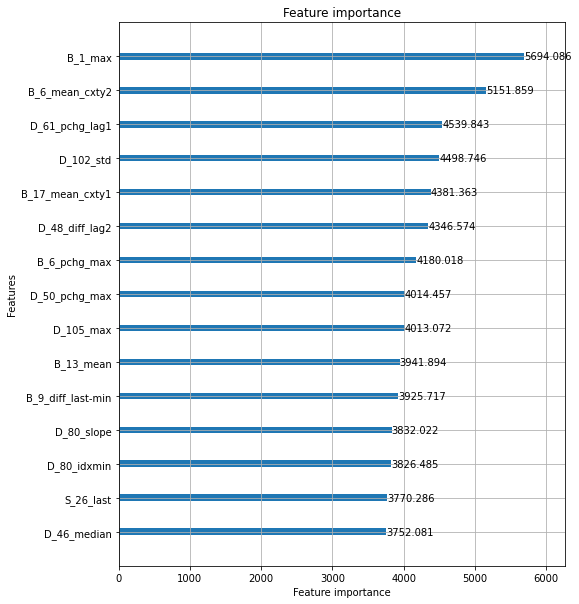

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.624991


[100]	valid_0's auc: 0.647327


[150]	valid_0's auc: 0.661416


[200]	valid_0's auc: 0.672286


[250]	valid_0's auc: 0.681469


[300]	valid_0's auc: 0.689334


[350]	valid_0's auc: 0.694632


[400]	valid_0's auc: 0.700606


[450]	valid_0's auc: 0.705122


[500]	valid_0's auc: 0.709415
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.709415


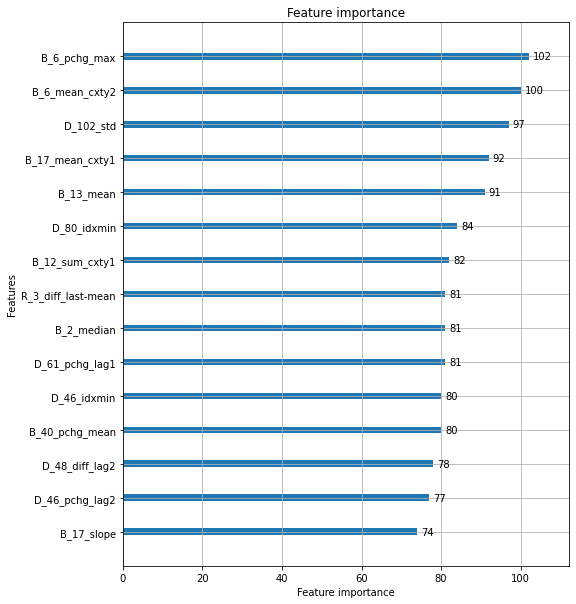

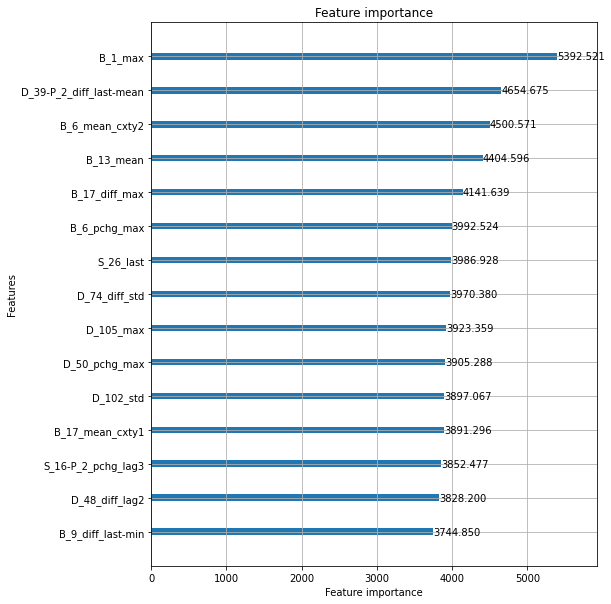

removed: ['B_1_max', 'B_6_mean_cxty2', 'D_102_std', 'B_13_mean', 'B_17_mean_cxty1']
Elapsed time: 2.158686848481496 min.
----------------------------------------------------------------------------------------------------
ITER: 85/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.629895


[100]	valid_0's auc: 0.649151


[150]	valid_0's auc: 0.663109


[200]	valid_0's auc: 0.672924


[250]	valid_0's auc: 0.681062


[300]	valid_0's auc: 0.688322


[350]	valid_0's auc: 0.694179


[400]	valid_0's auc: 0.69918


[450]	valid_0's auc: 0.704694


[500]	valid_0's auc: 0.708704
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.708704


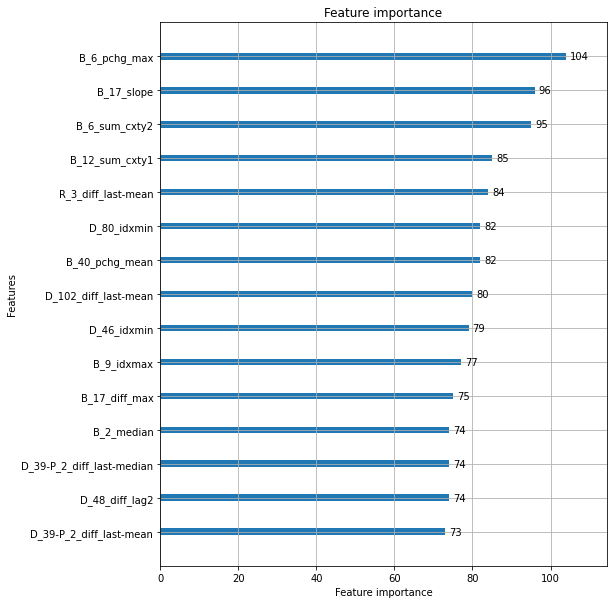

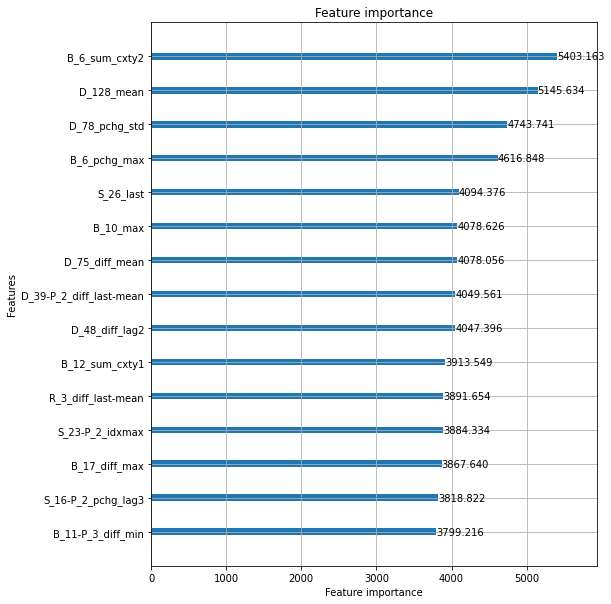

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.624797


[100]	valid_0's auc: 0.646372


[150]	valid_0's auc: 0.661129


[200]	valid_0's auc: 0.671147


[250]	valid_0's auc: 0.679847


[300]	valid_0's auc: 0.687154


[350]	valid_0's auc: 0.693163


[400]	valid_0's auc: 0.699591


[450]	valid_0's auc: 0.704394


[500]	valid_0's auc: 0.708234
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.708234


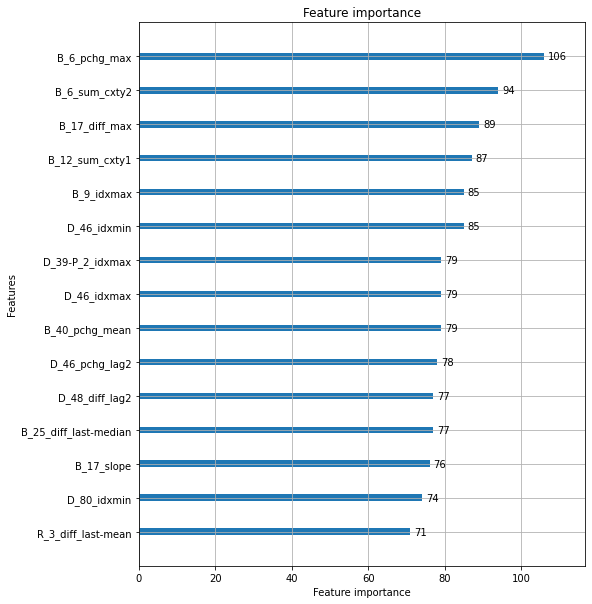

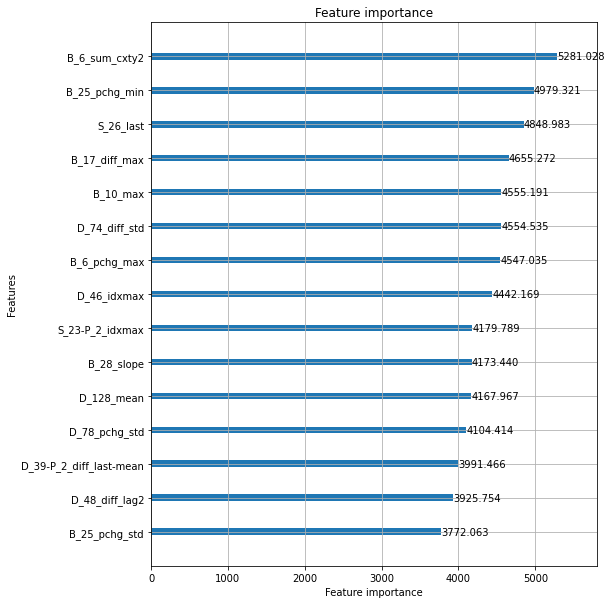

removed: ['B_6_sum_cxty2', 'D_128_mean', 'B_6_pchg_max', 'S_26_last', 'D_78_pchg_std']
Elapsed time: 2.146428918838501 min.
----------------------------------------------------------------------------------------------------
ITER: 86/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.626398


[100]	valid_0's auc: 0.646725


[150]	valid_0's auc: 0.66054


[200]	valid_0's auc: 0.670978


[250]	valid_0's auc: 0.67936


[300]	valid_0's auc: 0.686218


[350]	valid_0's auc: 0.692848


[400]	valid_0's auc: 0.69821


[450]	valid_0's auc: 0.703049


[500]	valid_0's auc: 0.70686
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.70686


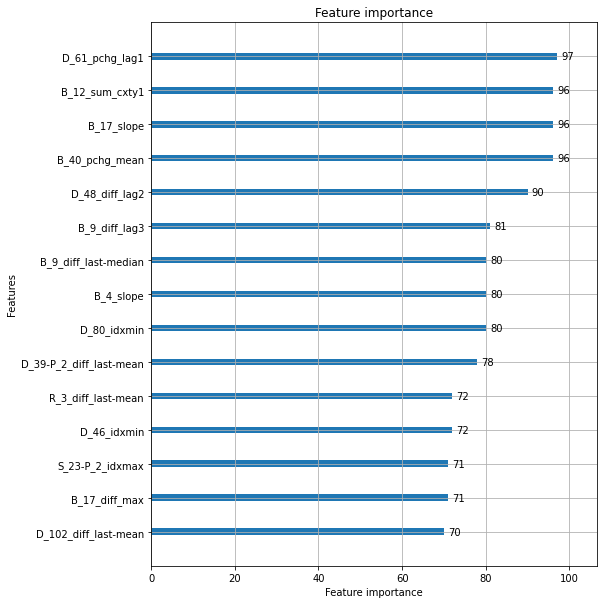

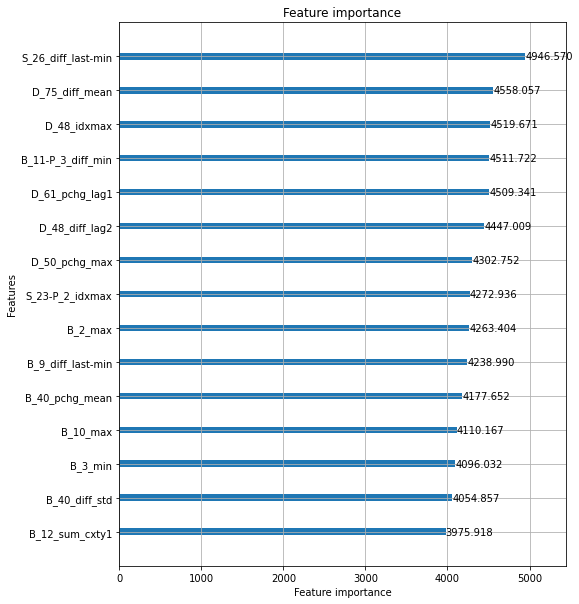

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.62427


[100]	valid_0's auc: 0.64521


[150]	valid_0's auc: 0.659627


[200]	valid_0's auc: 0.67032


[250]	valid_0's auc: 0.678579


[300]	valid_0's auc: 0.685347


[350]	valid_0's auc: 0.690864


[400]	valid_0's auc: 0.6961


[450]	valid_0's auc: 0.700765


[500]	valid_0's auc: 0.704692
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.704692


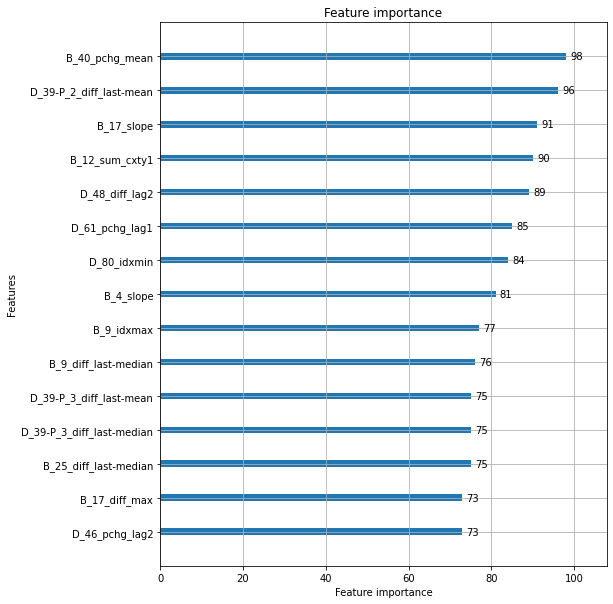

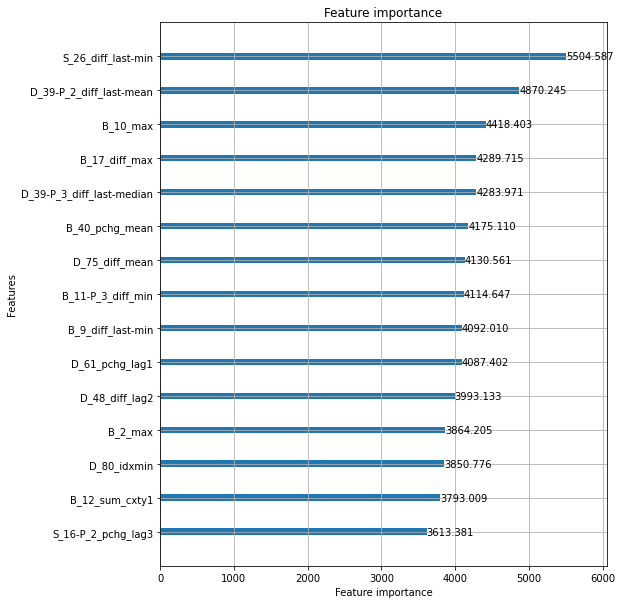

removed: ['S_26_diff_last-min', 'D_75_diff_mean', 'B_11-P_3_diff_min', 'D_61_pchg_lag1', 'D_39-P_2_diff_last-mean']
Elapsed time: 2.187994921207428 min.
----------------------------------------------------------------------------------------------------
ITER: 87/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.624552


[100]	valid_0's auc: 0.645153


[150]	valid_0's auc: 0.660581


[200]	valid_0's auc: 0.670036


[250]	valid_0's auc: 0.678389


[300]	valid_0's auc: 0.685197


[350]	valid_0's auc: 0.690809


[400]	valid_0's auc: 0.696119


[450]	valid_0's auc: 0.700309


[500]	valid_0's auc: 0.704233
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.704233


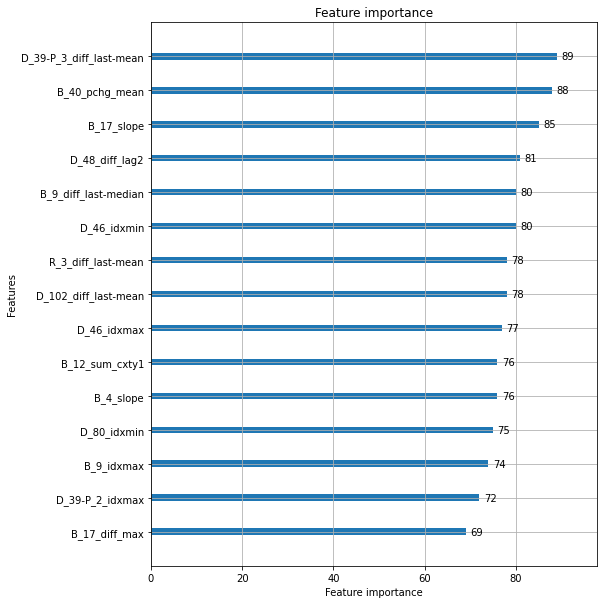

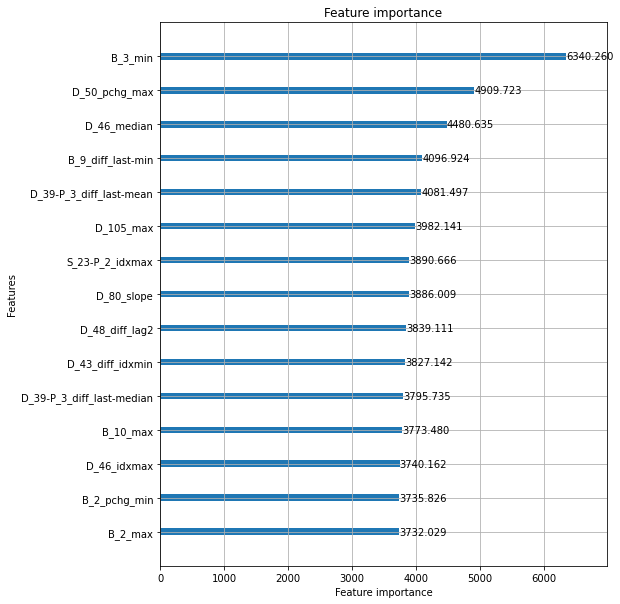

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.622577


[100]	valid_0's auc: 0.644341


[150]	valid_0's auc: 0.659494


[200]	valid_0's auc: 0.670325


[250]	valid_0's auc: 0.678594


[300]	valid_0's auc: 0.684599


[350]	valid_0's auc: 0.69031


[400]	valid_0's auc: 0.69547


[450]	valid_0's auc: 0.699636


[500]	valid_0's auc: 0.7034
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.7034


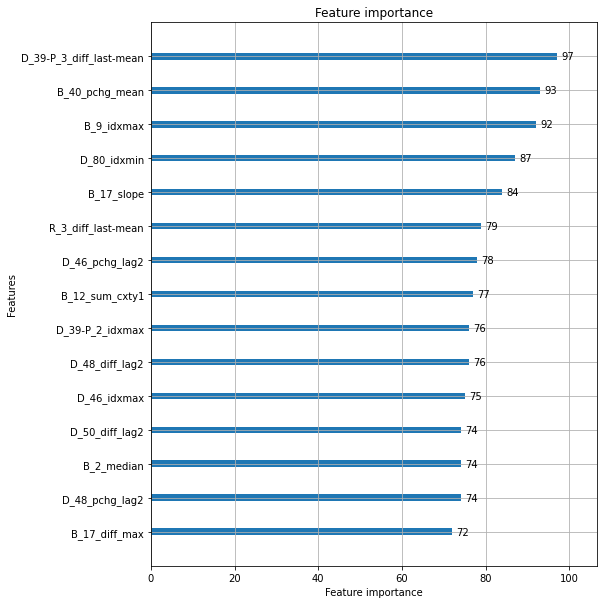

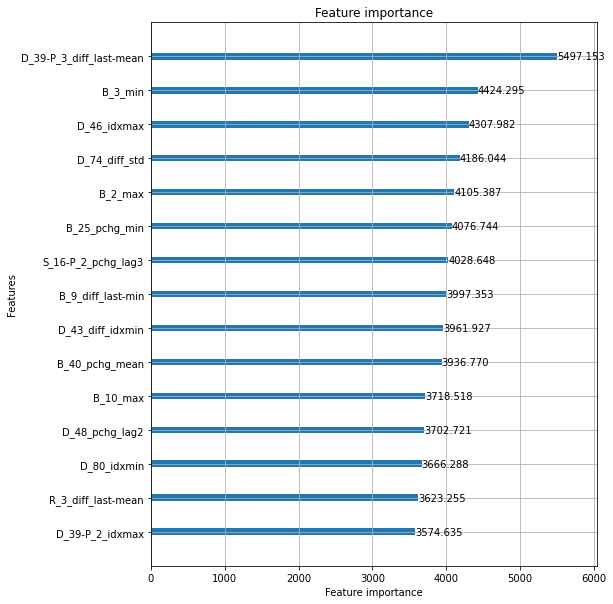

removed: ['B_3_min', 'D_39-P_3_diff_last-mean', 'D_50_pchg_max', 'B_9_diff_last-min', 'D_46_idxmax']
Elapsed time: 2.1209885319073996 min.
----------------------------------------------------------------------------------------------------
ITER: 88/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.62606


[100]	valid_0's auc: 0.646526


[150]	valid_0's auc: 0.660457


[200]	valid_0's auc: 0.669671


[250]	valid_0's auc: 0.677782


[300]	valid_0's auc: 0.684233


[350]	valid_0's auc: 0.690012


[400]	valid_0's auc: 0.694789


[450]	valid_0's auc: 0.699164


[500]	valid_0's auc: 0.703111
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.703111


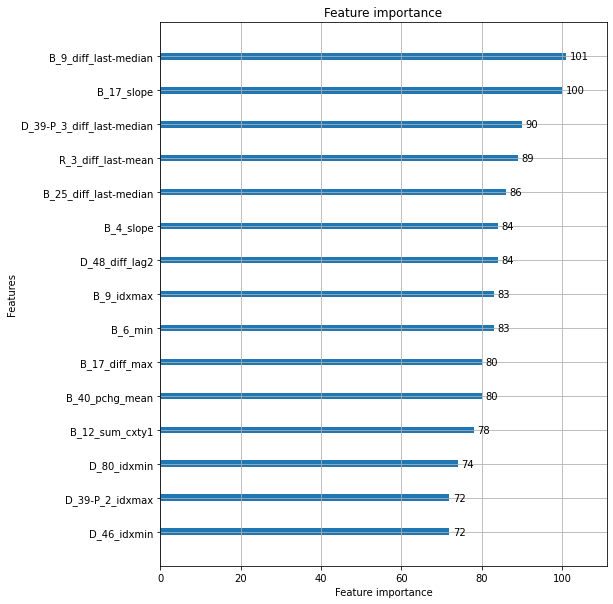

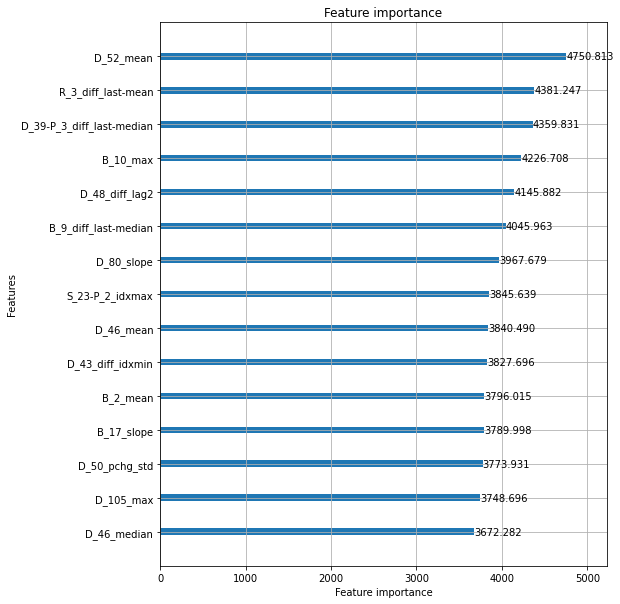

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.623464


[100]	valid_0's auc: 0.644938


[150]	valid_0's auc: 0.659576


[200]	valid_0's auc: 0.669296


[250]	valid_0's auc: 0.676979


[300]	valid_0's auc: 0.684051


[350]	valid_0's auc: 0.689424


[400]	valid_0's auc: 0.693787


[450]	valid_0's auc: 0.697801


[500]	valid_0's auc: 0.701941
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.701941


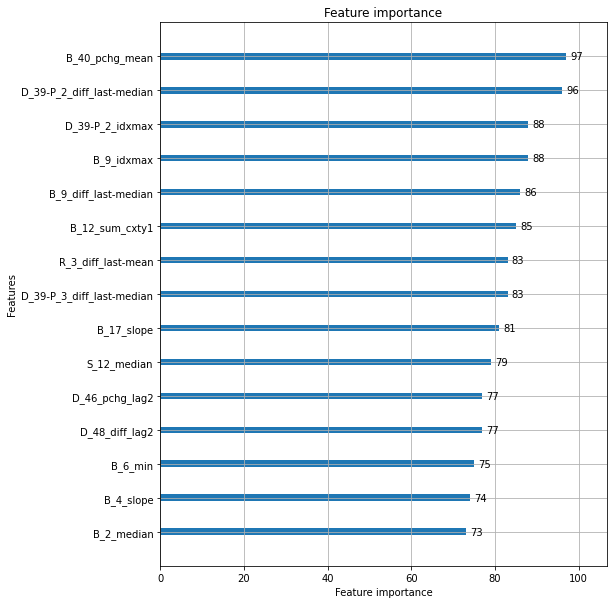

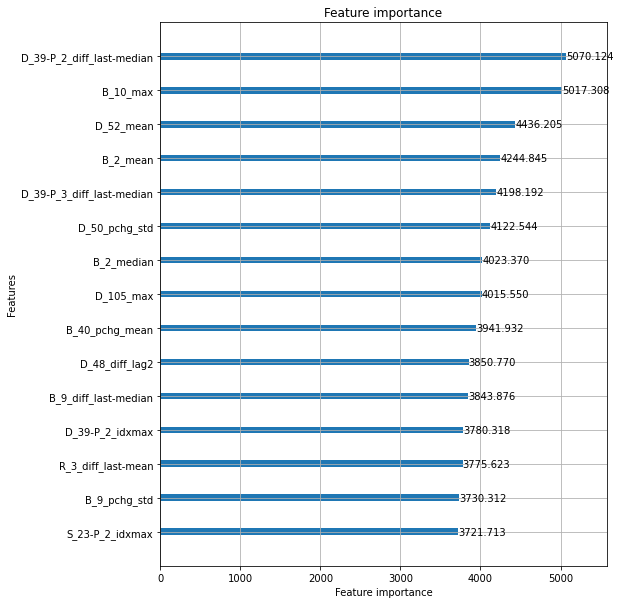

removed: ['B_10_max', 'D_52_mean', 'D_39-P_3_diff_last-median', 'D_39-P_2_diff_last-median', 'R_3_diff_last-mean']
Elapsed time: 2.123915696144104 min.
----------------------------------------------------------------------------------------------------
ITER: 89/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.626205


[100]	valid_0's auc: 0.644973


[150]	valid_0's auc: 0.658744


[200]	valid_0's auc: 0.668662


[250]	valid_0's auc: 0.676561


[300]	valid_0's auc: 0.683616


[350]	valid_0's auc: 0.689529


[400]	valid_0's auc: 0.694486


[450]	valid_0's auc: 0.698881


[500]	valid_0's auc: 0.702718
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.702718


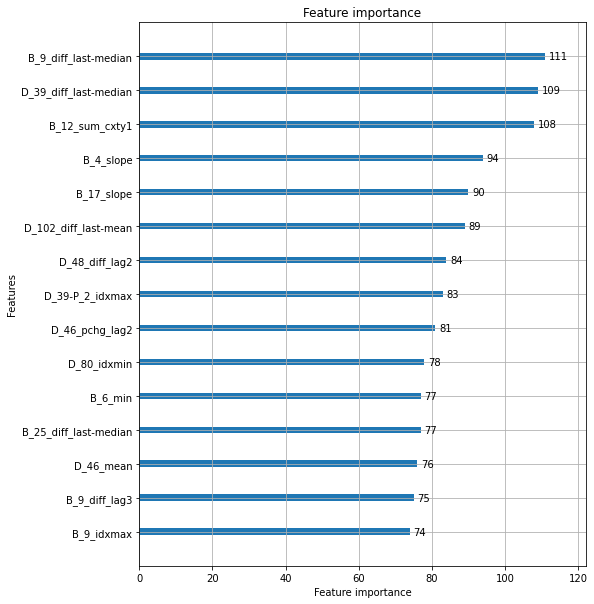

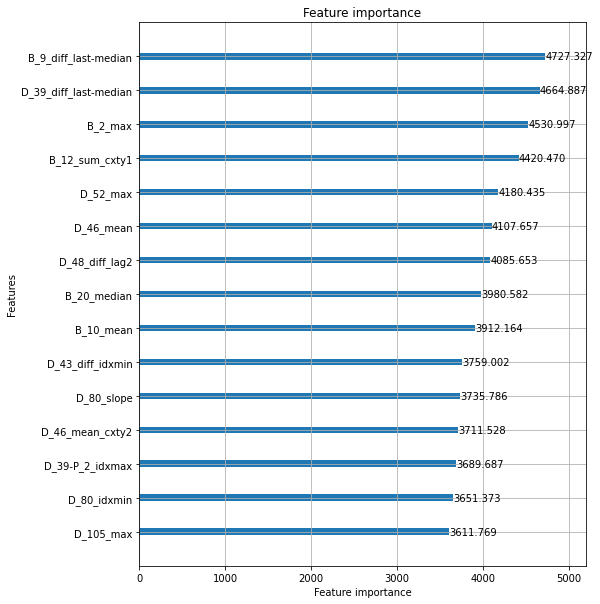

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.623373


[100]	valid_0's auc: 0.644705


[150]	valid_0's auc: 0.658328


[200]	valid_0's auc: 0.667772


[250]	valid_0's auc: 0.675482


[300]	valid_0's auc: 0.682308


[350]	valid_0's auc: 0.687836


[400]	valid_0's auc: 0.692866


[450]	valid_0's auc: 0.697063


[500]	valid_0's auc: 0.700757
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.700757


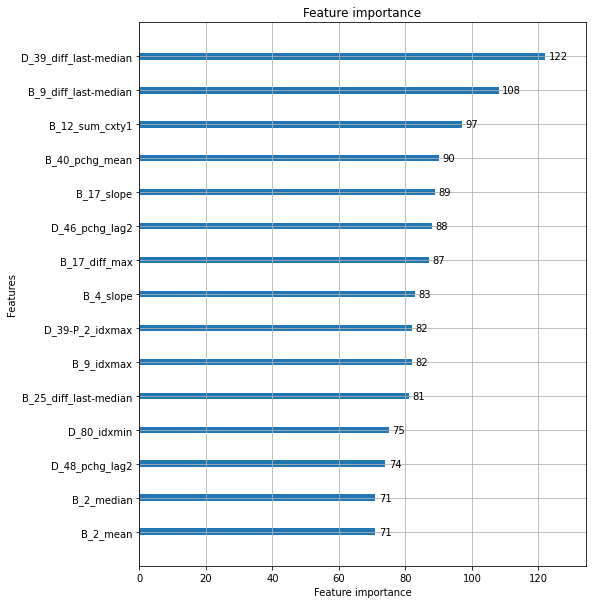

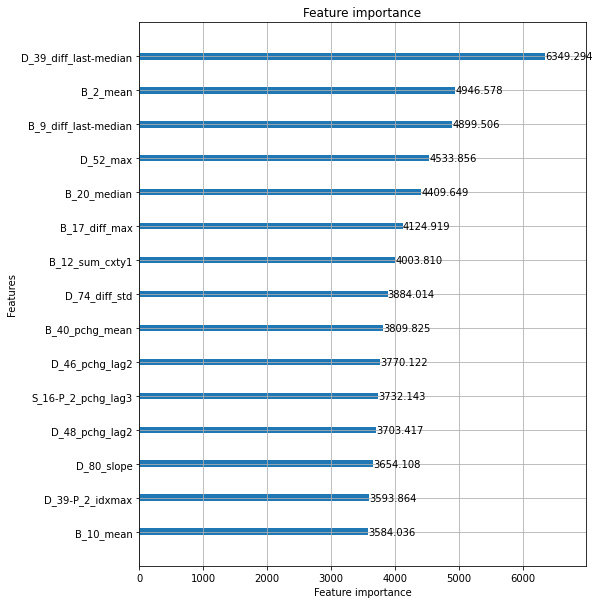

removed: ['D_39_diff_last-median', 'B_9_diff_last-median', 'D_52_max', 'B_12_sum_cxty1', 'B_20_median']
Elapsed time: 2.082780094941457 min.
----------------------------------------------------------------------------------------------------
ITER: 90/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.623766


[100]	valid_0's auc: 0.643491


[150]	valid_0's auc: 0.657138


[200]	valid_0's auc: 0.667551


[250]	valid_0's auc: 0.674974


[300]	valid_0's auc: 0.681706


[350]	valid_0's auc: 0.687286


[400]	valid_0's auc: 0.692366


[450]	valid_0's auc: 0.697124


[500]	valid_0's auc: 0.70087
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.70087


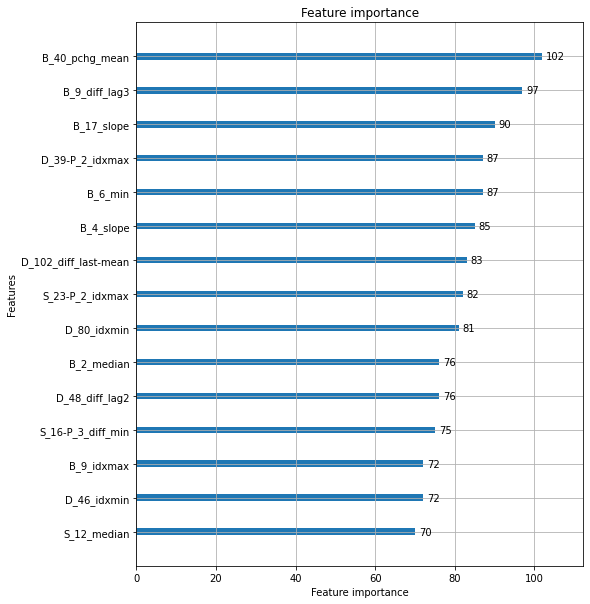

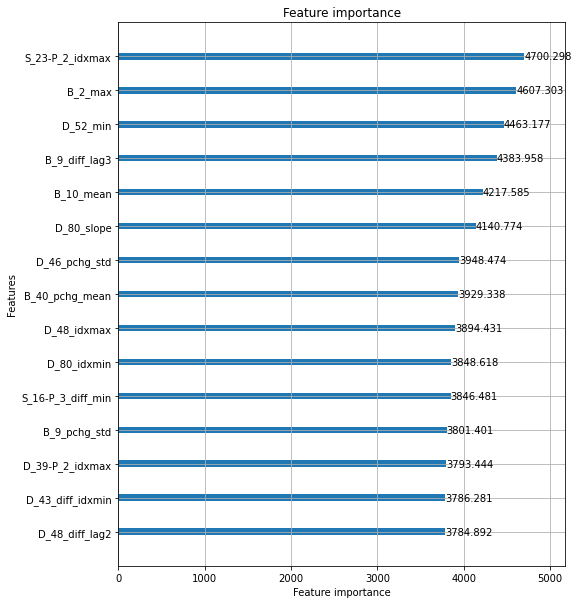

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.621308


[100]	valid_0's auc: 0.643062


[150]	valid_0's auc: 0.657172


[200]	valid_0's auc: 0.66752


[250]	valid_0's auc: 0.675035


[300]	valid_0's auc: 0.681293


[350]	valid_0's auc: 0.686582


[400]	valid_0's auc: 0.691773


[450]	valid_0's auc: 0.696025


[500]	valid_0's auc: 0.699699
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.699699


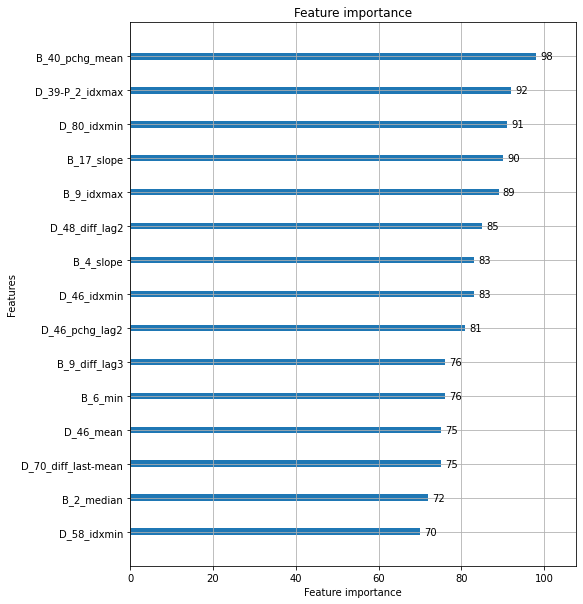

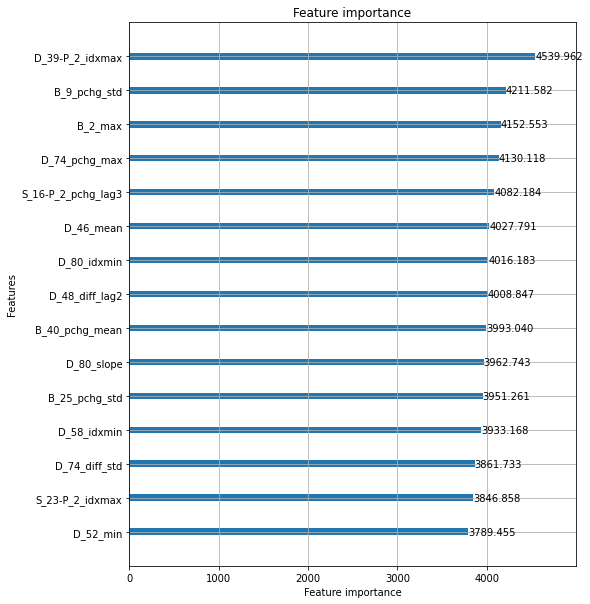

removed: ['B_2_max', 'S_23-P_2_idxmax', 'D_39-P_2_idxmax', 'D_52_min', 'D_80_slope']
Elapsed time: 2.0846843123435974 min.
----------------------------------------------------------------------------------------------------
ITER: 91/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.624692


[100]	valid_0's auc: 0.643943


[150]	valid_0's auc: 0.657671


[200]	valid_0's auc: 0.66732


[250]	valid_0's auc: 0.675398


[300]	valid_0's auc: 0.681653


[350]	valid_0's auc: 0.686906


[400]	valid_0's auc: 0.692277


[450]	valid_0's auc: 0.696192


[500]	valid_0's auc: 0.699946
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.699946


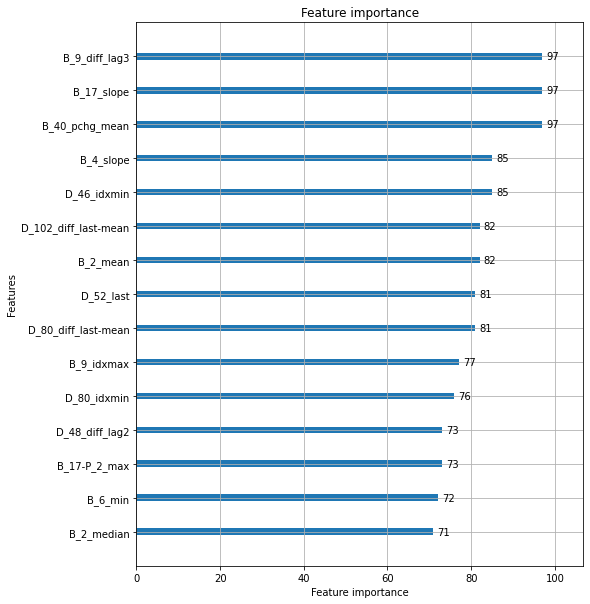

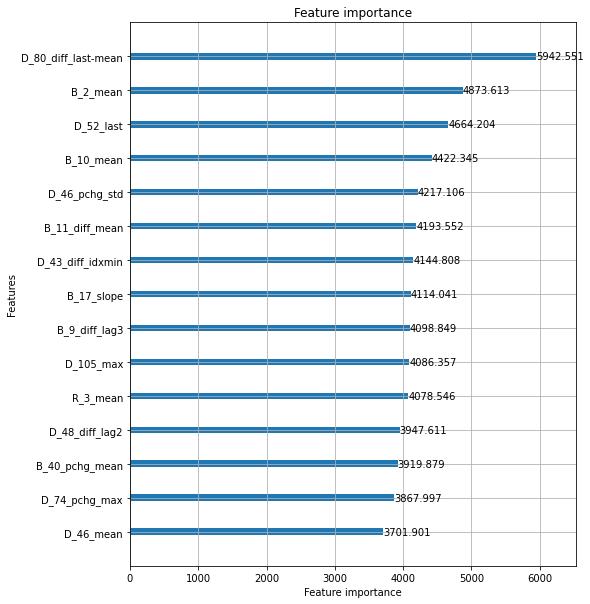

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.621707


[100]	valid_0's auc: 0.643072


[150]	valid_0's auc: 0.656428


[200]	valid_0's auc: 0.666137


[250]	valid_0's auc: 0.673996


[300]	valid_0's auc: 0.680634


[350]	valid_0's auc: 0.686182


[400]	valid_0's auc: 0.690831


[450]	valid_0's auc: 0.695086


[500]	valid_0's auc: 0.698828
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.698828


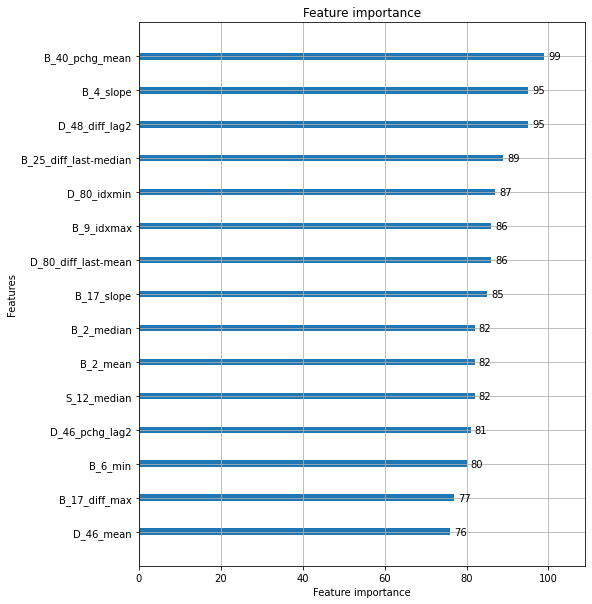

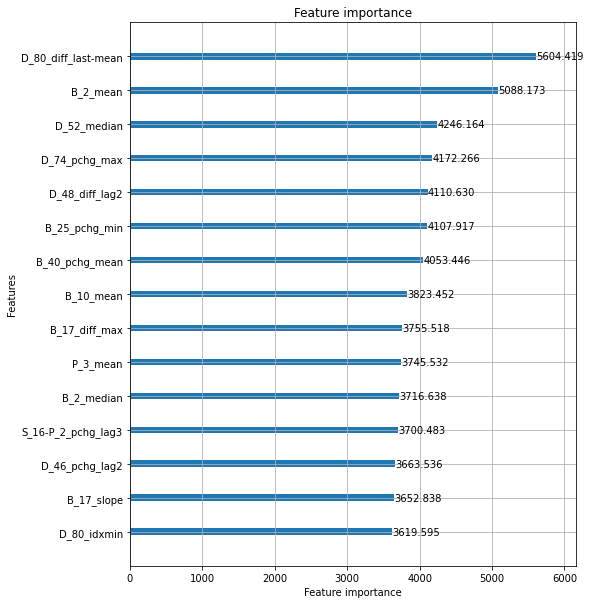

removed: ['D_80_diff_last-mean', 'B_2_mean', 'B_10_mean', 'D_52_last', 'D_48_diff_lag2']
Elapsed time: 2.0774393916130065 min.
----------------------------------------------------------------------------------------------------
ITER: 92/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.621856


[100]	valid_0's auc: 0.641586


[150]	valid_0's auc: 0.655741


[200]	valid_0's auc: 0.665657


[250]	valid_0's auc: 0.673265


[300]	valid_0's auc: 0.679358


[350]	valid_0's auc: 0.684436


[400]	valid_0's auc: 0.689513


[450]	valid_0's auc: 0.693939


[500]	valid_0's auc: 0.697483
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.697483


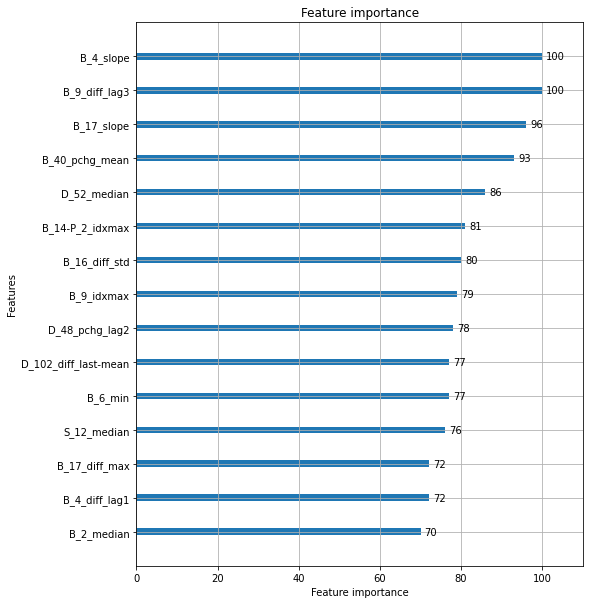

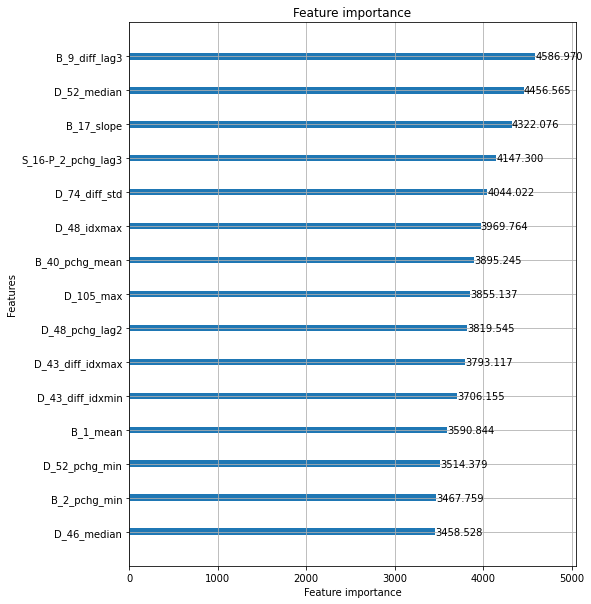

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.620129


[100]	valid_0's auc: 0.641711


[150]	valid_0's auc: 0.65606


[200]	valid_0's auc: 0.665368


[250]	valid_0's auc: 0.672846


[300]	valid_0's auc: 0.678843


[350]	valid_0's auc: 0.684367


[400]	valid_0's auc: 0.689089


[450]	valid_0's auc: 0.693764


[500]	valid_0's auc: 0.697335
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.697335


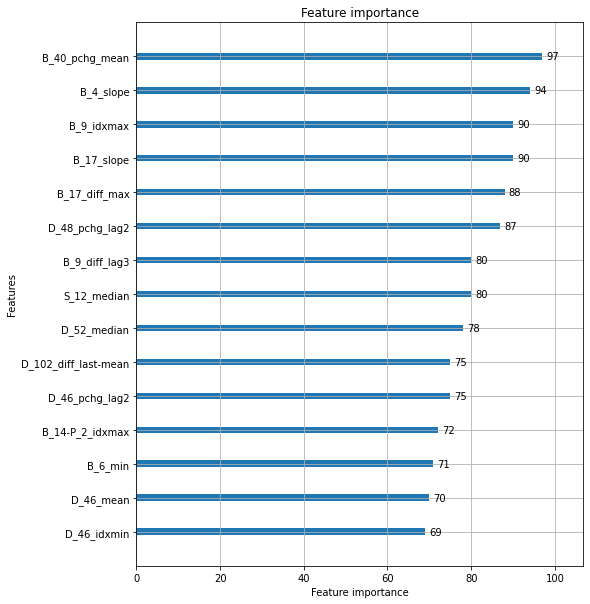

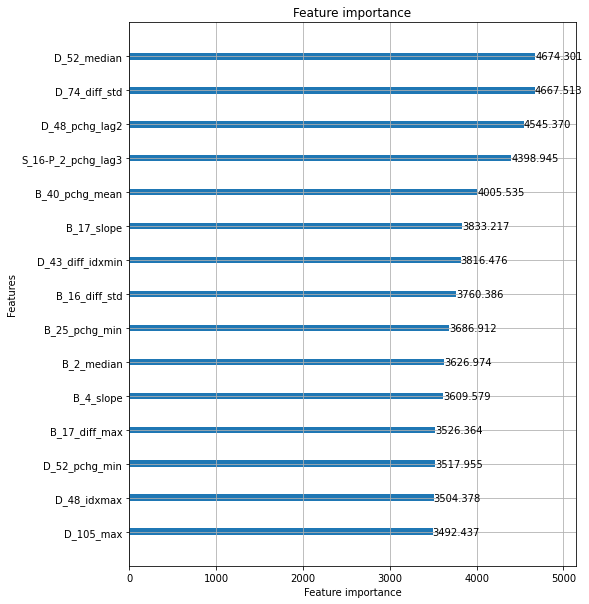

removed: ['D_52_median', 'D_74_diff_std', 'S_16-P_2_pchg_lag3', 'D_48_pchg_lag2', 'B_17_slope']
Elapsed time: 2.0559531688690185 min.
----------------------------------------------------------------------------------------------------
ITER: 93/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.622062


[100]	valid_0's auc: 0.642075


[150]	valid_0's auc: 0.655689


[200]	valid_0's auc: 0.665139


[250]	valid_0's auc: 0.673151


[300]	valid_0's auc: 0.679218


[350]	valid_0's auc: 0.684527


[400]	valid_0's auc: 0.689327


[450]	valid_0's auc: 0.693521


[500]	valid_0's auc: 0.697109
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.697109


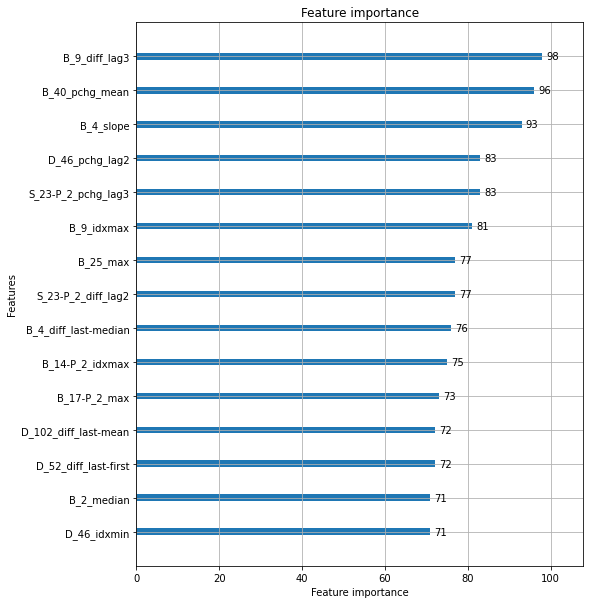

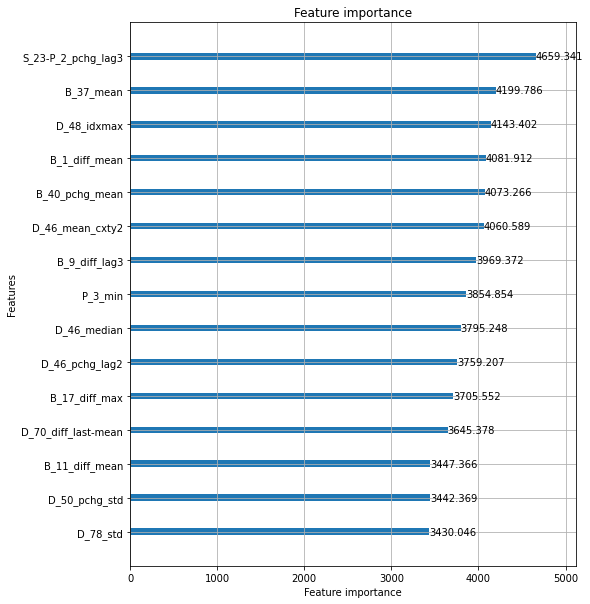

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.619112


[100]	valid_0's auc: 0.640247


[150]	valid_0's auc: 0.653722


[200]	valid_0's auc: 0.663528


[250]	valid_0's auc: 0.671647


[300]	valid_0's auc: 0.677532


[350]	valid_0's auc: 0.683545


[400]	valid_0's auc: 0.688291


[450]	valid_0's auc: 0.692652


[500]	valid_0's auc: 0.696161
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.696161


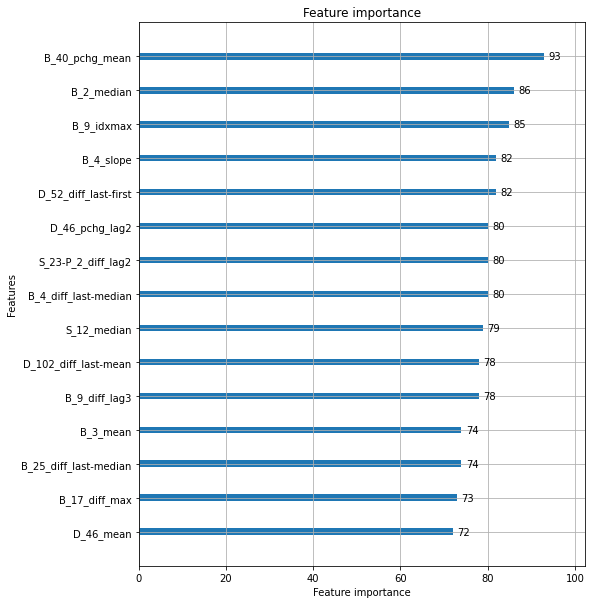

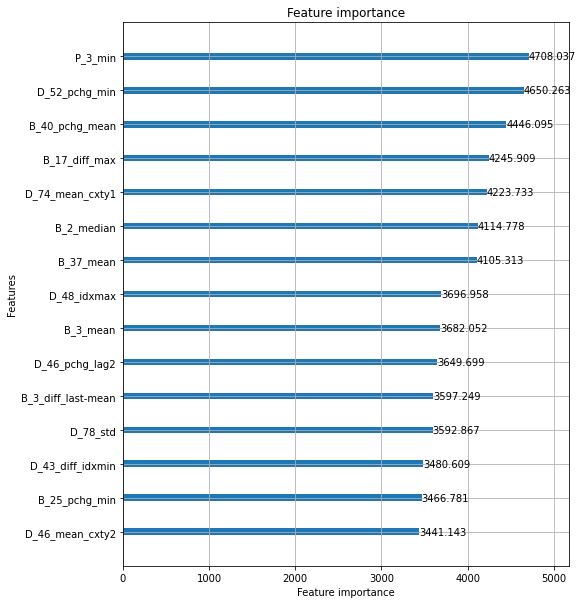

removed: ['P_3_min', 'B_40_pchg_mean', 'B_37_mean', 'B_17_diff_max', 'D_52_pchg_min']
Elapsed time: 2.051371121406555 min.
----------------------------------------------------------------------------------------------------
ITER: 94/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.620437


[100]	valid_0's auc: 0.640229


[150]	valid_0's auc: 0.655252


[200]	valid_0's auc: 0.664949


[250]	valid_0's auc: 0.672456


[300]	valid_0's auc: 0.678981


[350]	valid_0's auc: 0.684603


[400]	valid_0's auc: 0.689359


[450]	valid_0's auc: 0.693413


[500]	valid_0's auc: 0.696836
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.696836


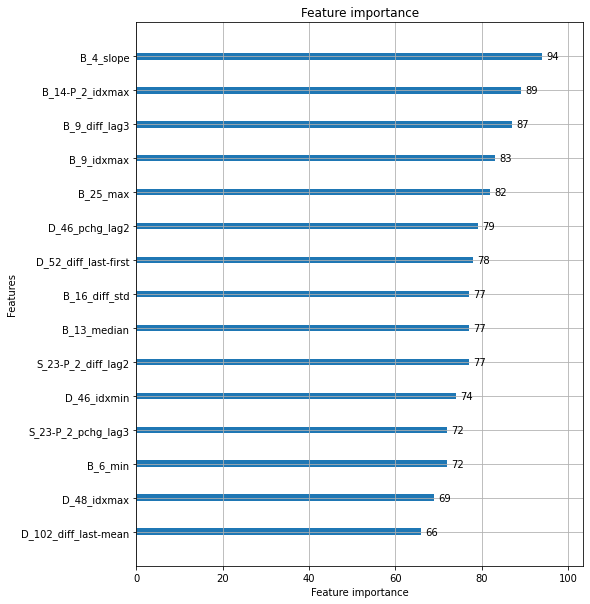

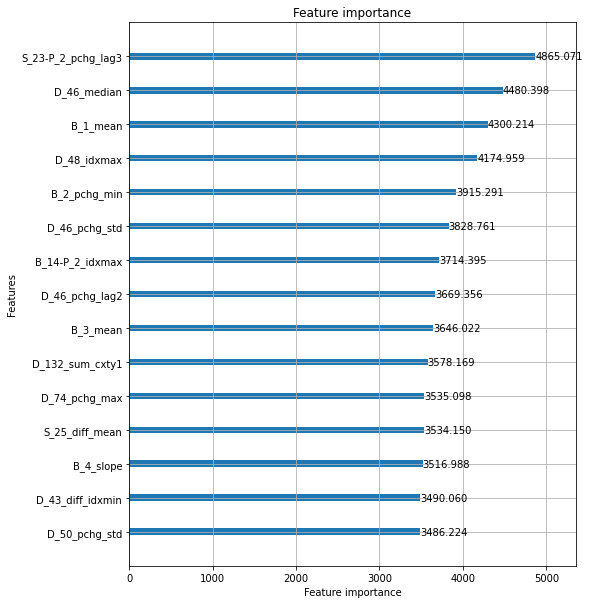

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.618551


[100]	valid_0's auc: 0.639603


[150]	valid_0's auc: 0.653892


[200]	valid_0's auc: 0.663687


[250]	valid_0's auc: 0.671233


[300]	valid_0's auc: 0.676941


[350]	valid_0's auc: 0.682788


[400]	valid_0's auc: 0.687867


[450]	valid_0's auc: 0.691757


[500]	valid_0's auc: 0.695527
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.695527


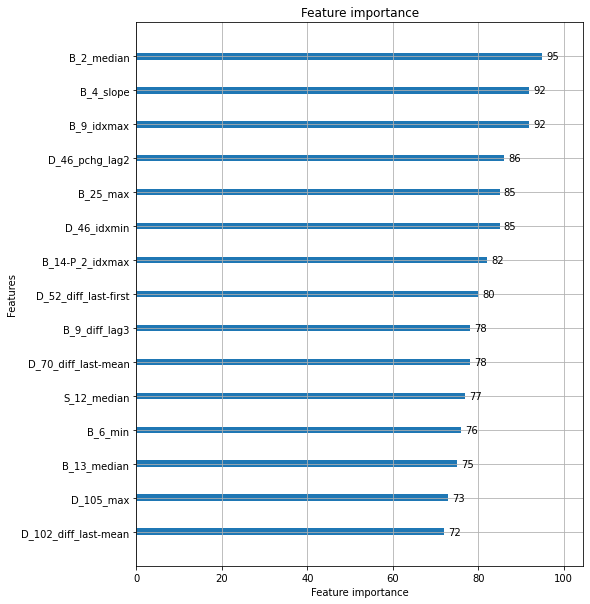

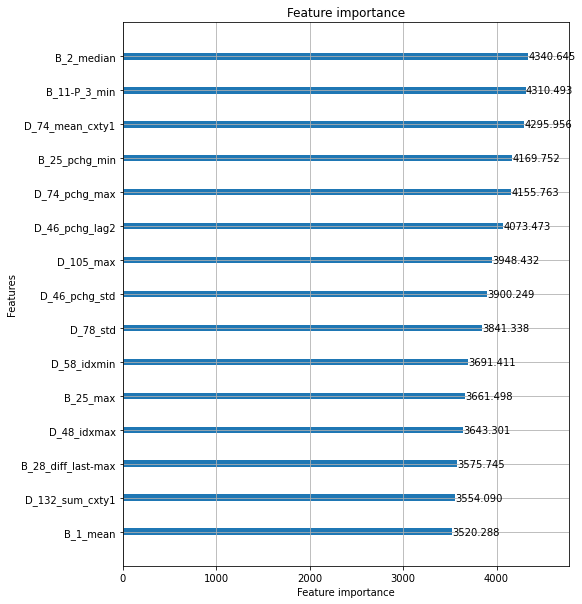

removed: ['S_23-P_2_pchg_lag3', 'B_1_mean', 'D_48_idxmax', 'D_46_pchg_lag2', 'D_46_pchg_std']
Elapsed time: 2.0339444239934283 min.
----------------------------------------------------------------------------------------------------
ITER: 95/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.620747


[100]	valid_0's auc: 0.640672


[150]	valid_0's auc: 0.654951


[200]	valid_0's auc: 0.664947


[250]	valid_0's auc: 0.672181


[300]	valid_0's auc: 0.678335


[350]	valid_0's auc: 0.683725


[400]	valid_0's auc: 0.688065


[450]	valid_0's auc: 0.692472


[500]	valid_0's auc: 0.696225
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.696225


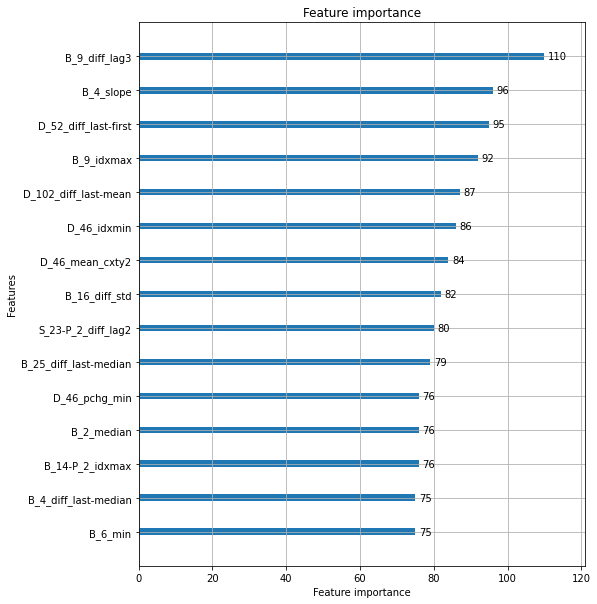

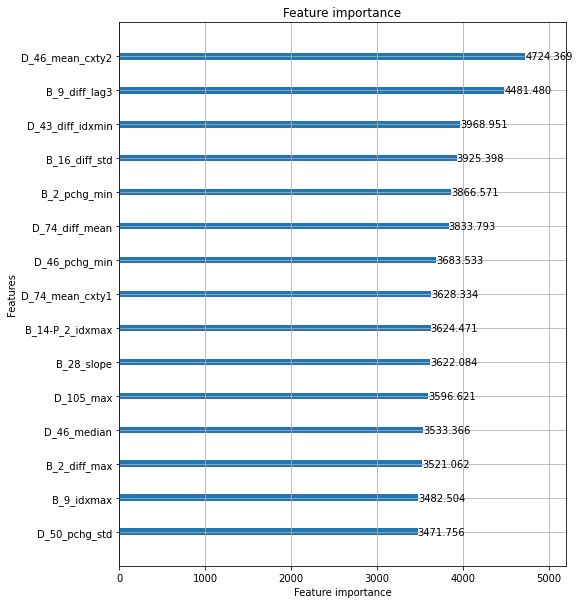

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.6186


[100]	valid_0's auc: 0.63954


[150]	valid_0's auc: 0.653839


[200]	valid_0's auc: 0.66324


[250]	valid_0's auc: 0.671099


[300]	valid_0's auc: 0.677419


[350]	valid_0's auc: 0.682329


[400]	valid_0's auc: 0.686719


[450]	valid_0's auc: 0.690832


[500]	valid_0's auc: 0.69455
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.69455


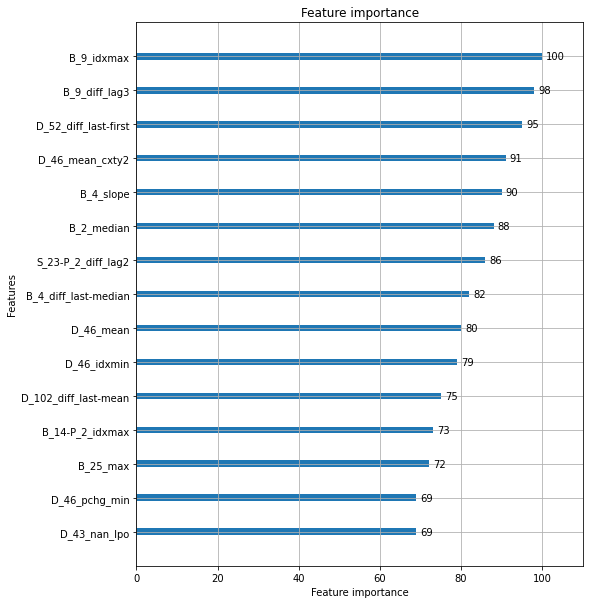

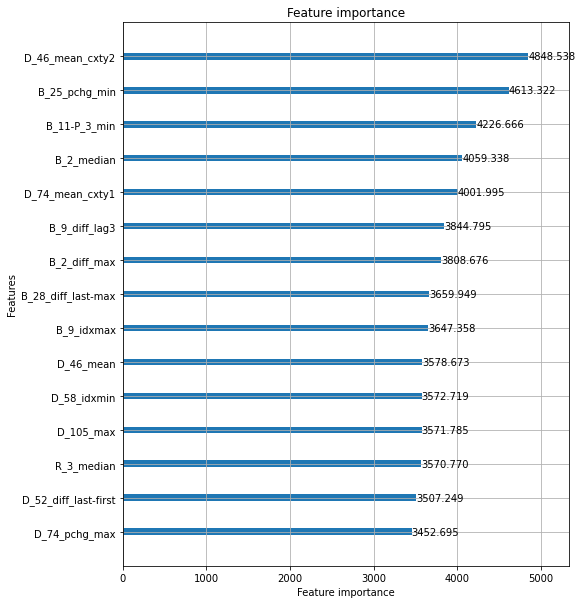

removed: ['D_46_mean_cxty2', 'B_9_diff_lag3', 'D_74_mean_cxty1', 'B_2_median', 'B_25_pchg_min']
Elapsed time: 2.0595671852429707 min.
----------------------------------------------------------------------------------------------------
ITER: 96/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.620026


[100]	valid_0's auc: 0.639524


[150]	valid_0's auc: 0.652682


[200]	valid_0's auc: 0.662507


[250]	valid_0's auc: 0.67059


[300]	valid_0's auc: 0.677032


[350]	valid_0's auc: 0.682483


[400]	valid_0's auc: 0.687246


[450]	valid_0's auc: 0.691442


[500]	valid_0's auc: 0.694841
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.694841


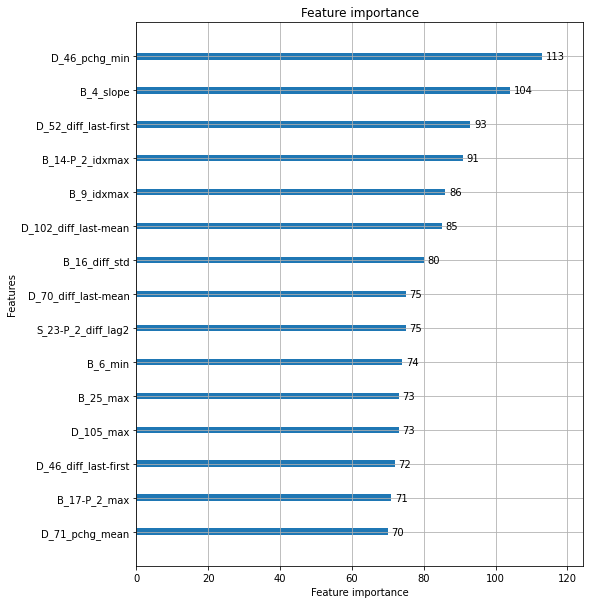

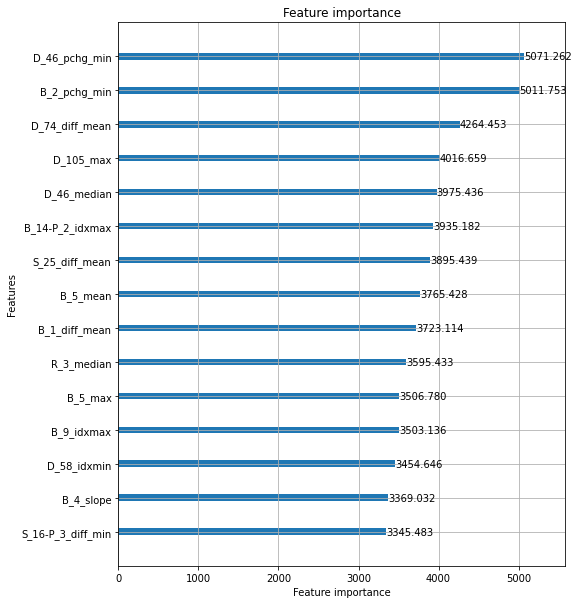

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.618771


[100]	valid_0's auc: 0.639626


[150]	valid_0's auc: 0.652856


[200]	valid_0's auc: 0.662148


[250]	valid_0's auc: 0.669788


[300]	valid_0's auc: 0.675874


[350]	valid_0's auc: 0.681574


[400]	valid_0's auc: 0.68631


[450]	valid_0's auc: 0.690418


[500]	valid_0's auc: 0.694072
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.694072


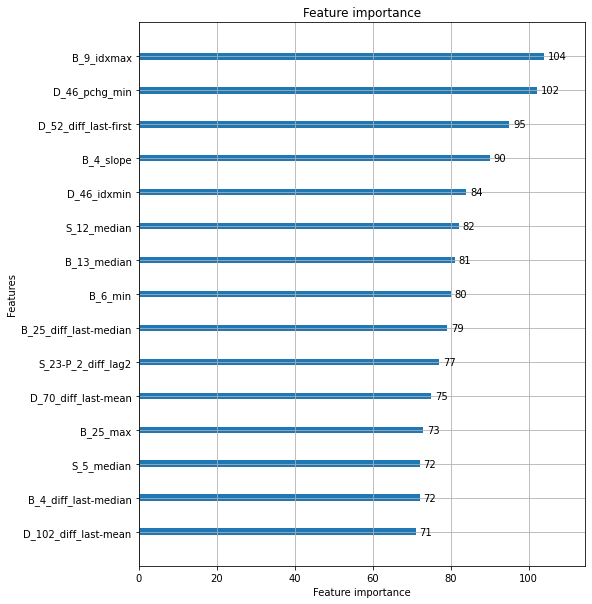

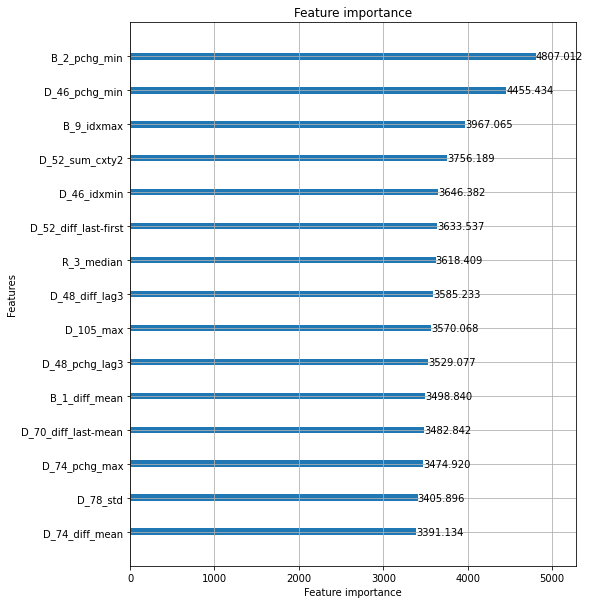

removed: ['B_2_pchg_min', 'D_46_pchg_min', 'D_74_diff_mean', 'D_105_max', 'B_9_idxmax']
Elapsed time: 2.001452986399333 min.
----------------------------------------------------------------------------------------------------
ITER: 97/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.619426


[100]	valid_0's auc: 0.6391


[150]	valid_0's auc: 0.65257


[200]	valid_0's auc: 0.662424


[250]	valid_0's auc: 0.670496


[300]	valid_0's auc: 0.676823


[350]	valid_0's auc: 0.682416


[400]	valid_0's auc: 0.686882


[450]	valid_0's auc: 0.690736


[500]	valid_0's auc: 0.694178
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.694178


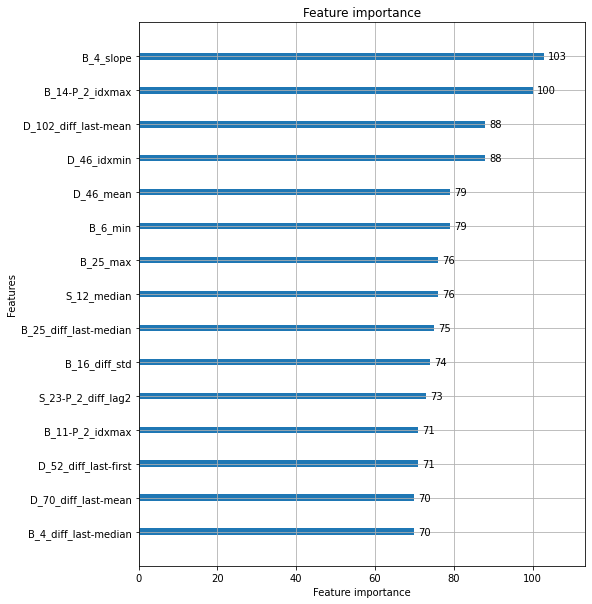

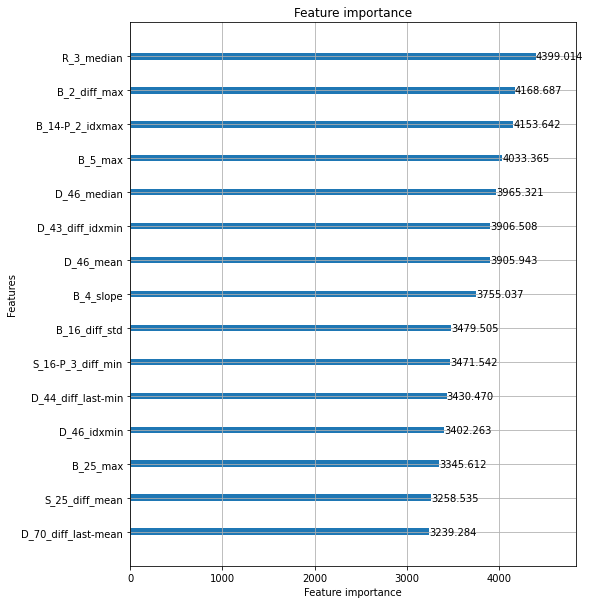

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.618205


[100]	valid_0's auc: 0.638391


[150]	valid_0's auc: 0.652208


[200]	valid_0's auc: 0.661632


[250]	valid_0's auc: 0.669502


[300]	valid_0's auc: 0.675335


[350]	valid_0's auc: 0.680828


[400]	valid_0's auc: 0.685831


[450]	valid_0's auc: 0.68981


[500]	valid_0's auc: 0.693289
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.693289


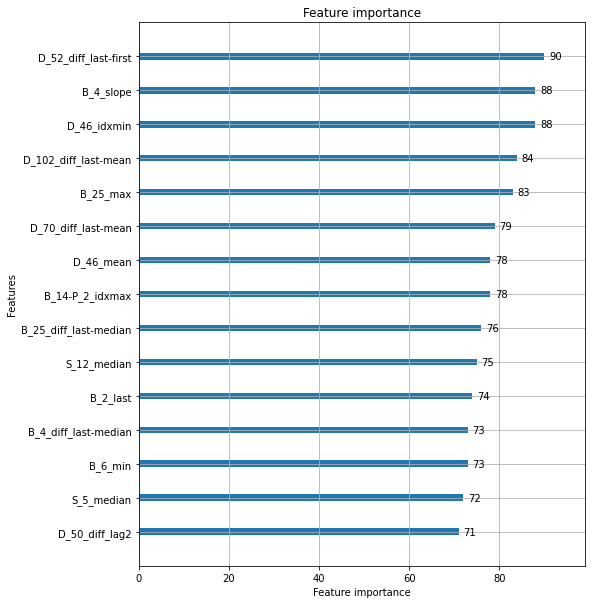

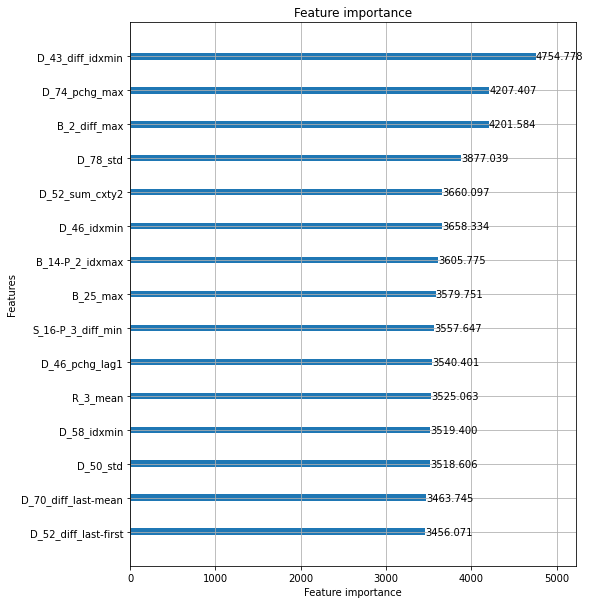

removed: ['D_43_diff_idxmin', 'B_2_diff_max', 'B_14-P_2_idxmax', 'B_5_max', 'R_3_median']
Elapsed time: 1.9784115155537922 min.
----------------------------------------------------------------------------------------------------
ITER: 98/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.619629


[100]	valid_0's auc: 0.638283


[150]	valid_0's auc: 0.652162


[200]	valid_0's auc: 0.661803


[250]	valid_0's auc: 0.669455


[300]	valid_0's auc: 0.675104


[350]	valid_0's auc: 0.680642


[400]	valid_0's auc: 0.685433


[450]	valid_0's auc: 0.68966


[500]	valid_0's auc: 0.693405
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.693405


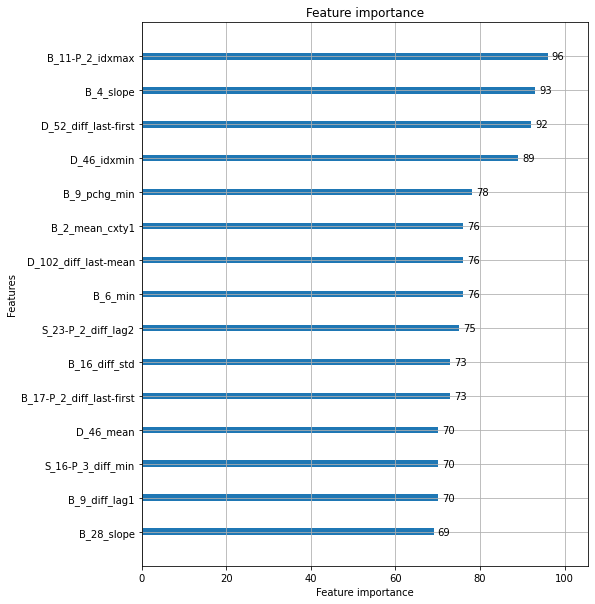

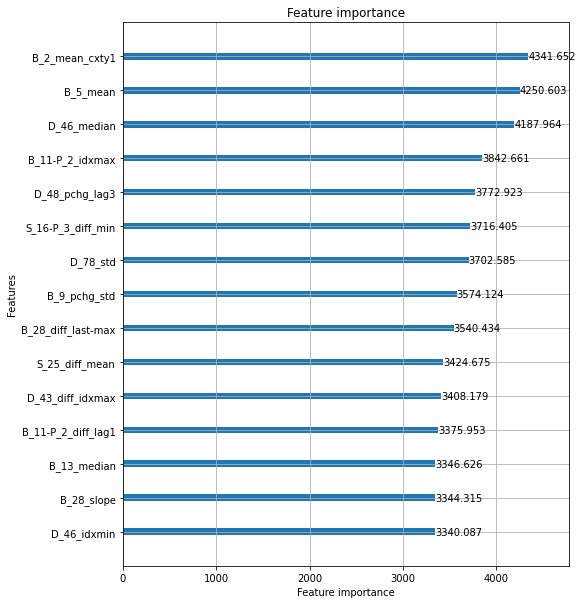

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.616521


[100]	valid_0's auc: 0.637599


[150]	valid_0's auc: 0.650859


[200]	valid_0's auc: 0.660368


[250]	valid_0's auc: 0.668248


[300]	valid_0's auc: 0.674114


[350]	valid_0's auc: 0.679718


[400]	valid_0's auc: 0.684285


[450]	valid_0's auc: 0.688161


[500]	valid_0's auc: 0.69179
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.69179


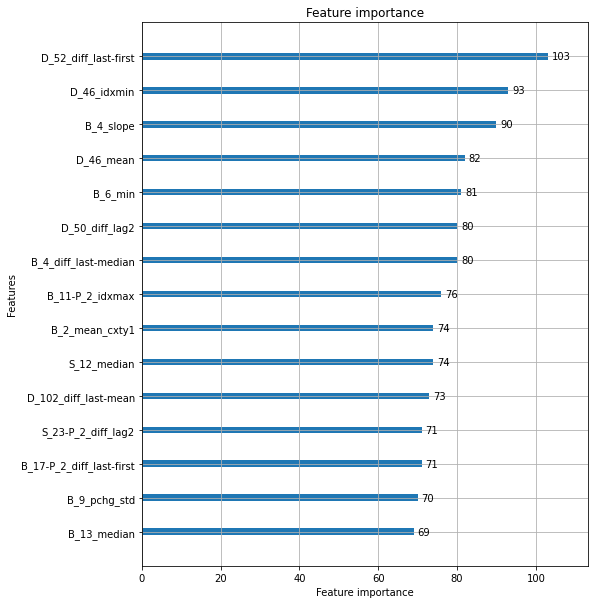

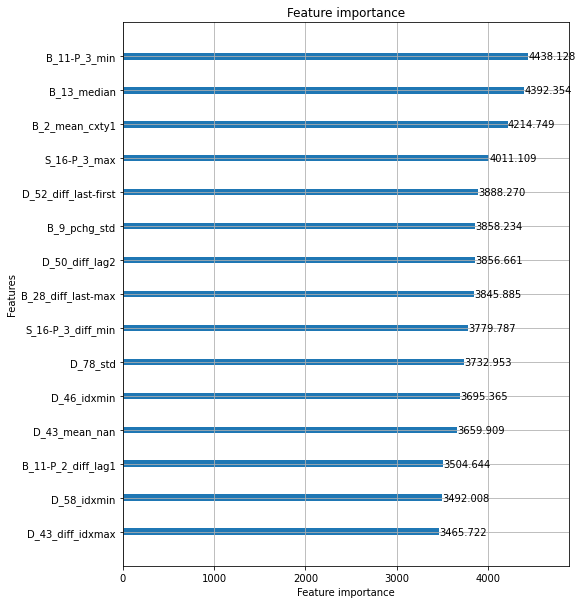

removed: ['B_2_mean_cxty1', 'B_13_median', 'S_16-P_3_diff_min', 'D_78_std', 'B_9_pchg_std']
Elapsed time: 2.032608652114868 min.
----------------------------------------------------------------------------------------------------
ITER: 99/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.620158


[100]	valid_0's auc: 0.639022


[150]	valid_0's auc: 0.652219


[200]	valid_0's auc: 0.661683


[250]	valid_0's auc: 0.669138


[300]	valid_0's auc: 0.675556


[350]	valid_0's auc: 0.680758


[400]	valid_0's auc: 0.685275


[450]	valid_0's auc: 0.689363


[500]	valid_0's auc: 0.692779
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.692779


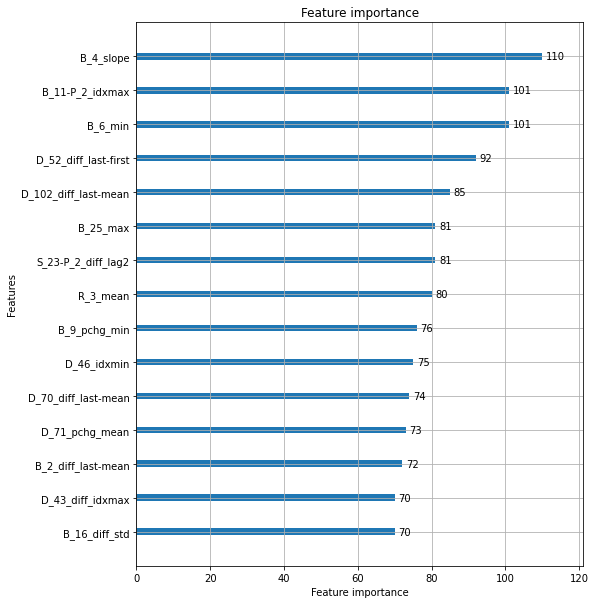

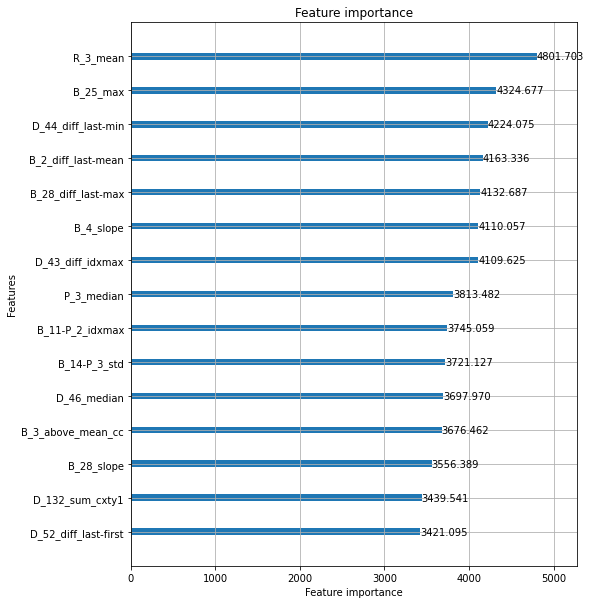

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.616992


[100]	valid_0's auc: 0.636933


[150]	valid_0's auc: 0.650367


[200]	valid_0's auc: 0.660266


[250]	valid_0's auc: 0.667732


[300]	valid_0's auc: 0.673299


[350]	valid_0's auc: 0.678517


[400]	valid_0's auc: 0.683275


[450]	valid_0's auc: 0.687624


[500]	valid_0's auc: 0.691466
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.691466


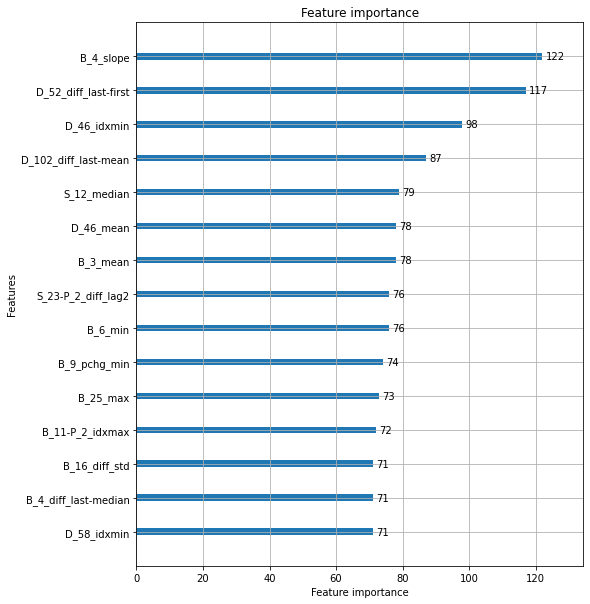

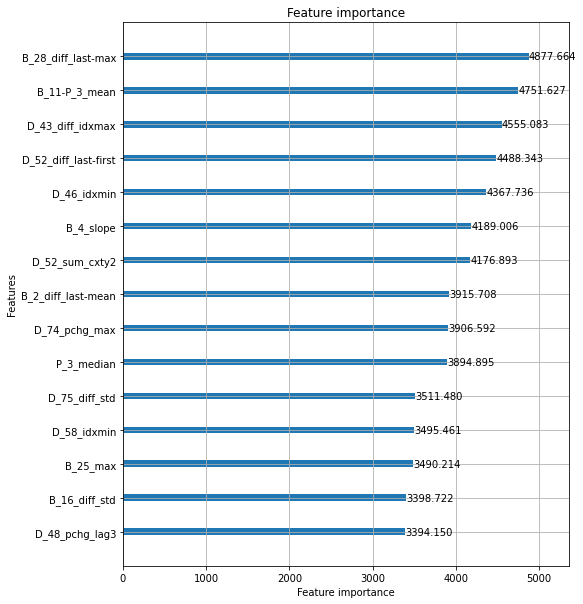

removed: ['B_28_diff_last-max', 'D_43_diff_idxmax', 'B_4_slope', 'B_2_diff_last-mean', 'R_3_mean']
Elapsed time: 1.972637414932251 min.
----------------------------------------------------------------------------------------------------
ITER: 100/100


Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.618734


[100]	valid_0's auc: 0.638157


[150]	valid_0's auc: 0.649942


[200]	valid_0's auc: 0.659425


[250]	valid_0's auc: 0.666978


[300]	valid_0's auc: 0.673


[350]	valid_0's auc: 0.678303


[400]	valid_0's auc: 0.683312


[450]	valid_0's auc: 0.687563


[500]	valid_0's auc: 0.691031
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.691031


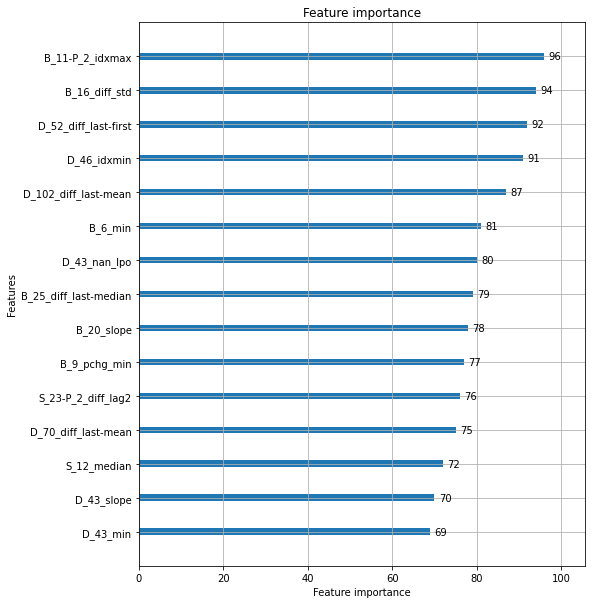

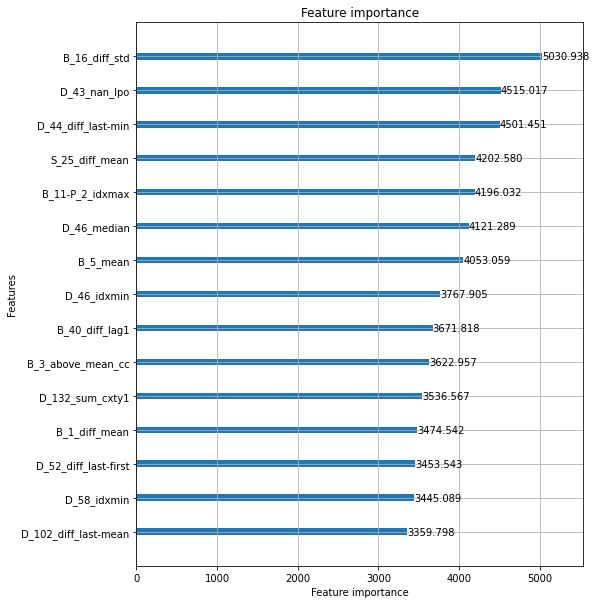

Training until validation scores don't improve for 50 rounds


[50]	valid_0's auc: 0.617831


[100]	valid_0's auc: 0.637675


[150]	valid_0's auc: 0.649965


[200]	valid_0's auc: 0.659035


[250]	valid_0's auc: 0.666488


[300]	valid_0's auc: 0.671838


[350]	valid_0's auc: 0.677398


[400]	valid_0's auc: 0.682021


[450]	valid_0's auc: 0.686298


[500]	valid_0's auc: 0.689663
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.689663


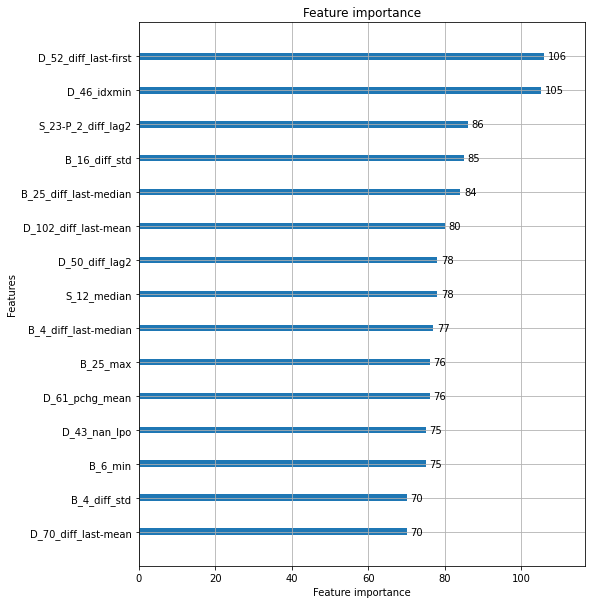

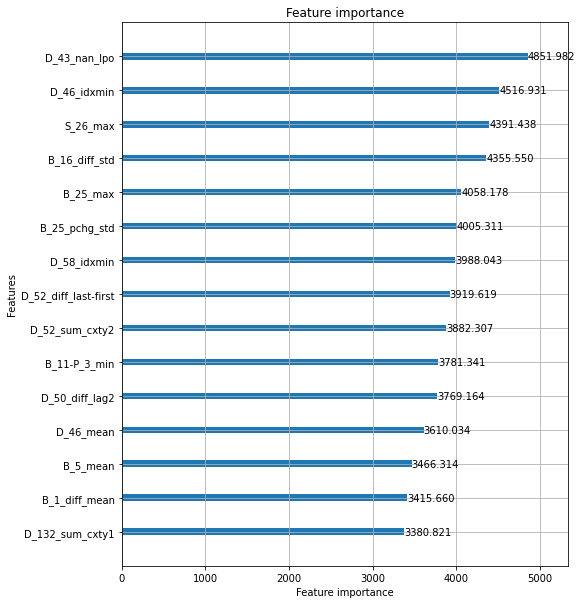

removed: ['B_16_diff_std', 'D_43_nan_lpo', 'D_46_idxmin', 'D_44_diff_last-min', 'B_5_mean']
Elapsed time: 1.9551129659016928 min.


In [16]:
ITERATIONS = 100
removed = list()
scores_log = list()

for i in range(ITERATIONS):
    print("-"*100)
    print(f"ITER: {i+1}/{ITERATIONS}")
    
    tic = time.time()

    importances = list()
    scores = list()

    for train_idx,valid_idx in skf_split:
        train_dset = lgb.Dataset(
            data=dset.loc[train_idx,input_feats],
            label=dset.loc[train_idx,"target"].values,
            free_raw_data=True,
        )
        valid_dset = lgb.Dataset(
            data=dset.loc[valid_idx,input_feats],
            label=dset.loc[valid_idx,"target"].values,
            free_raw_data=True,
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            callbacks=[lgb.log_evaluation(period=50), lgb.early_stopping(50)],
        )
        lgb.plot_importance(model, figsize=(8,10), importance_type="split", max_num_features=15)
        lgb.plot_importance(model, figsize=(8,10), importance_type="gain", max_num_features=15)
        plt.show()   

        imp = model.feature_importance(importance_type="gain")
        imp /= imp.sum()
        importances.append(imp)
        scores.append(model.best_score["valid_0"]["auc"])

        del train_dset,valid_dset,model; gc.collect()
        
    importances = np.mean(importances, axis=0)
    score = np.mean(scores)
    
    # removes top 5 features
    to_remove_idx = importances.argsort()[::-1][:5].tolist()
    to_remove = [input_feats[i] for i in to_remove_idx]
    for col in to_remove: input_feats.remove(col)
    removed.extend(to_remove)
    print("removed:", removed[-5:])
    scores_log.append(score)
    
    tac = time.time()
    print(f"Elapsed time: {(tac-tic)/60.} min.")

In [17]:
print(removed)

['S_15_last', 'D_120_2_mean', 'R_27_mean', 'D_126_4_mean', 'D_126_4_lo', 'S_15_max', 'D_120_2_lo', 'D_120_1_lo', 'D_123_idxmax', 'S_24_last', 'D_123_slope', 'S_24_max', 'D_117_7_lo', 'D_91_mean', 'S_13_max', 'S_15_above_mean_cc', 'D_117_7_mean', 'S_13_last', 'S_15_mean', 'S_24_pchg_max', 'S_15_median', 'S_15_diff_last-median', 'D_117_4_lo', 'S_24_pchg_min', 'S_27_median', 'S_24_mean', 'S_15_diff_last-mean', 'D_118_pchg_mean', 'D_117_4_mean', 'S_24_pchg_lag1', 'S_24_diff_last-min', 'D_45_pchg_mean', 'S_24_pchg_std', 'D_56_diff_idxmax', 'R_27_median', 'S_24_diff_min', 'S_24_diff_lag1', 'D_118_mean_cxty2', 'D_119_pchg_mean', 'D_64_4_lo', 'S_24_diff_last-median', 'S_24_diff_last-mean', 'D_64_4_mean', 'R_27_min', 'S_27_mean', 'S_27_max', 'D_117_8_mean', 'D_122_mean', 'D_140_mean', 'R_26_min', 'D_117_8_lo', 'R_26_mean', 'D_119_mean_cxty2', 'D_114_1_mean', 'D_55_pchg_mean', 'D_114_2_mean', 'D_119_pchg_max', 'R_27_max', 'D_114_2_lo', 'D_119_pchg_std', 'D_119_sum_cxty2', 'D_55_min', 'D_64_1_mea

In [18]:
print(scores_log)

[0.9962603010709103, 0.9935911901412371, 0.9896322477885932, 0.9862859852774082, 0.984463517492713, 0.9811074357851002, 0.9786302350454923, 0.9730374719938133, 0.9681624418158371, 0.9596428107768936, 0.9544360005755161, 0.9486028076950113, 0.9442158428654426, 0.9398459148507428, 0.9326904653372768, 0.928797169427899, 0.9243595358347576, 0.918831121079317, 0.917979790976839, 0.9125427868975267, 0.9068087817465978, 0.9039467711791302, 0.9024492791170703, 0.898875351796774, 0.8966501960023661, 0.8925358602575781, 0.8897524144053042, 0.8858622346800343, 0.8740641310275479, 0.8681043683203103, 0.8654418128267245, 0.8613843112268208, 0.8603550545846153, 0.852873614108204, 0.8501084400751172, 0.8473281541166926, 0.8439535797039158, 0.8392399947596879, 0.8336476040265173, 0.8305040723554072, 0.8289251786783223, 0.8289303962742142, 0.8217318325591492, 0.8180934387707638, 0.810950371430251, 0.8100849378892261, 0.8067642342372418, 0.8023264995990267, 0.7932676966897048, 0.7907792658538686, 0.7828

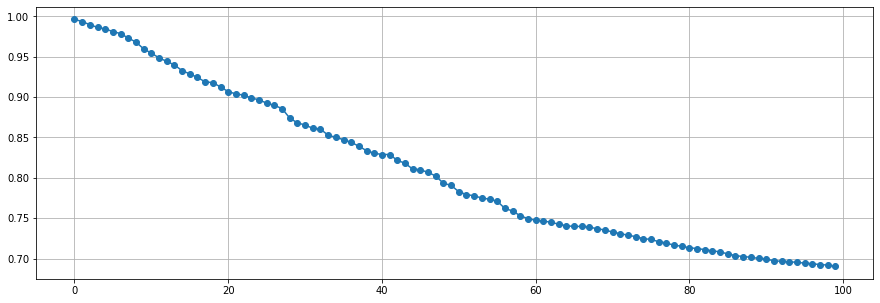

In [19]:
plt.figure(figsize=(15,5))
plt.plot(scores_log, "o-")
plt.grid()
plt.show()

***